# Page Setup

In [723]:
## Extend Shell Size
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1 import make_axes_locatable
from datetime import date
import math
import geopandas as gpd
from geopandas.geoseries import GeoSeries

import matplotlib.ticker as mtick
from scipy.optimize import curve_fit
from astropy.modeling import models, fitting
from astropy.modeling.models import Spline1D
from astropy.modeling.fitting import (SplineInterpolateFitter,
                                      SplineSmoothingFitter,
                                      SplineExactKnotsFitter)

from matplotlib.ticker import FuncFormatter
#import matplotlib.pyplot as plt
# def millions(x, pos):
#     'The two args are the value and tick position'
#     return '%1.1fM' % (x * 1e-6)

from scipy.interpolate import griddata
import rasterio
from rasterio.crs import CRS
import mpu
from geopy.distance import geodesic
import h3
from shapely.geometry import Polygon
import folium
from scipy.spatial import ConvexHull as ch


def human_format(num, pos):
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    # add more suffixes if you need them
    return '%.2f%s' % (num, ['', 'K', 'M', 'G', 'T', 'P'][magnitude])

formatter = FuncFormatter(human_format)

In [724]:
##functions

# Set Y label to display in millions
def millions(x, pos):
    'The two args are the value and tick position'
    return '%1.1fM' % (x * 1e-6)

def human_format(num, pos):
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    # add more suffixes if you need them
    return '%.2f%s' % (num, ['', 'K', 'M', 'G', 'T', 'P'][magnitude])

formatter = FuncFormatter(human_format)
print(human_format(15670000, 5))

# Display percentage in Pie chart
def absolute_value(val):
    a = int(np.round(val/100.*sizes.sum(),0))
    return a
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}% ({v:d})'.format(p=pct,v=val)
    return my_autopct

# Display number with comma, 1000000 -> 1,000,000
def my_value(number):
    return ("{:,}".format(number))
print(my_value(100000000))

# Define gaussian function
def gaussian(x, mean, amplitude, standard_deviation):
    return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))

15.67M
100,000,000


# Read-in Data

In [725]:
dfl = pd.read_excel('~/Documents/Jupyter_Notebook/soybean_vw_soy_fin_lineage.xlsx')
dfr = pd.read_excel('~/Documents/Jupyter_Notebook/soybean_vw_soy_fin_qlty_rslt.xlsx')

dbl = pd.read_excel('~/Documents/Jupyter_Notebook/soybean_vw_soy_bulk_lineage.xlsx')
dbr = pd.read_excel('~/Documents/Jupyter_Notebook/soybean_vw_soy_bulk_qlty_rslt.xlsx')


In [726]:
dm2 = pd.read_csv('~/Documents/Jupyter_Notebook/soyMG_0404_v2.csv')
dm2['MG'] = dm2['MG'].astype('int64')
dm2.dtypes
dm2.columns = ['vrty_desc', 'maturity', 'mg']



#2023 
dpl = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/2017_2021_planting_Ni.xlsx')
#print(dpl.head())
#print(dbr.shape)

#dpl

dpl_list = ['Plnt', 'Plant Name', 'Crop Year', 'Agreement Nbr', 'Order', 'Female Fertile','Contract Area', 'Growing Field','Final Acres','Harv Date','Rg', 'Planting Date Lookup', 'Planting Date Final']
dpl1 = dpl[dpl_list].dropna()

In [727]:
dm2

,vrty_desc,maturity,mg
0,AG46X6,4.6,4
1,AG48X9,4.8,4
2,BCS5501XF20,5.4,5
3,AG45XF0,4.5,4
4,AG15XF2,1.5,1
...,...,...,...
5079,EV2214B9-C0DNN,2.2,2
5080,CR1423N,1.4,1
5081,FL0315A3-D0DNN,0.3,0
5082,AW2314M1-C0DNN,2.3,2


## In dbr_ag01, each fin_prcs_ord_nbr has only 1 bulk batch number (Only 1 bulck batch was processed, and went into (multiple) finished goods )               Bulk batch : Finished goods = 1:m

In [728]:
dbr.head()

,crop_yr,produced_yr,p08_plnt_cd,pbc_plnt_cd,bulk_prcs_ord_nbr,fin_prcs_ord_nbr,inspct_lot_nbr,fin_plnt_cd,mtrl_nbr,batch_nbr,vrty_desc,mtrl_desc,total_bu,bulk_seeds_per_lb,bulk_usable_pct,wg_current_dt,rltv_matur,...,scp_include_at_std_quality,md,md_include_at_adj_quality,md_include_at_std_quality,dnd,dnd_include_at_adj_quality,dnd_include_at_std_quality,total_projected_units,lot_created_dt,prcs_ord_oper_line_nbr,usg_decsn_inspct_cd,tag_germ,tag_germ_dt,tag_germ_minus_wg_current,tag_germ_minus_wg_current_dt,projected_units_at_adj_quality_threshold,projected_units_at_std_quality_threshold
0,2019,2019,1792,8H48,2502121400,NaN,890001211297,NaN,13001229,BP93CA1,BL3013F4-T1LNN,BP.MS.BL3013F4-T1LNN.SD3.BULK-GR,2216.333,2637.0,86.61,2019-12-02,0.0,...,1,0.21,1,1,1.27,1,1,2169.384,2020-08-02,1,3S,NaN,NaT,NaN,NaT,2169.384,2169.384
1,2019,2019,1792,8H48,2502121394,NaN,890001211300,NaN,13003099,BP93DC1,JW2615B7-T3LNN,BP.MS.JW2615B7-T3LNN.SD3.BULK-GR,3086.667,2722.0,85.33,2019-12-02,0.0,...,1,0.10,1,1,0.72,1,1,3072.577,2020-08-02,1,3S,NaN,NaT,NaN,NaT,3072.577,3072.577
2,2019,2019,1792,8H48,2502121401,NaN,890001211304,NaN,12863326,BP94CC1,BCS2702X21,BP.OL.BCS2702X21.SC2.BULK-GR,5971.000,2640.0,87.49,2019-12-16,2.7,...,1,0.18,1,1,1.75,1,1,5910.614,2020-08-02,1,3S,NaN,NaT,NaN,NaT,5910.614,5910.614
3,2019,2019,1792,8H48,2502121404,NaN,890001211283,NaN,12866606,BP94CP1,BCS2205X21,BP.OL.BCS2205X21.SC2.BULK-GR,4705.000,3247.0,86.83,2019-11-12,2.2,...,1,0.21,1,1,0.44,1,1,5685.058,2020-08-02,1,3S,NaN,NaT,NaN,NaT,5685.058,5685.058
4,2019,2019,1792,8H48,2502121402,NaN,890001211286,NaN,12863733,BP9FCF1,BCS2601XF20,BP.OL.BCS2601XF20.SD3.BULK-GR,7536.000,3198.0,86.52,2019-11-13,2.6,...,1,0.12,1,1,0.16,1,1,8936.327,2020-08-02,1,3S,NaN,NaT,NaN,NaT,8936.327,8936.327


In [729]:
dfr.head()

,crop_yr,produced_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,inspct_lot_nbr,fin_plnt_cd,mtrl_nbr,batch_nbr,vrty_desc,mtrl_desc,fin_total_bu,fin_seeds_per_lb,fin_usable_pct,fin_wg_current_dt,fin_wg_std,fin_wg_current,...,fin_scp_include_at_adj_quality,fin_scp_include_at_std_quality,fin_md,fin_md_include_at_adj_quality,fin_md_include_at_std_quality,fin_dnd,fin_dnd_include_at_adj_quality,fin_dnd_include_at_std_quality,fin_total_projected_units,lot_created_dt,usg_decsn_inspct_cd,fin_tag_germ,fin_tag_germ_dt,fin_tag_germ_minus_wg_current,fin_tag_germ_minus_wg_current_dt,fin_projected_units_at_adj_quality_threshold,fin_projected_units_at_std_quality_threshold
0,2020,2020,1744.0,8H14,2502176094,40003486614,8H14,30084070,AS03EU1K,2XF2850,B.SS.2XF2850.SD3.40SCUSP.A1.US,NaN,2747.0,NaN,NaN,NaN,NaN,...,0,0,0.18,0,0,3.42,0,0,0.0,20210106,2PT,NaN,NaN,NaN,NaN,0.0,0.0
1,2020,2020,1744.0,8H14,2502163556,40003424302,8H14,13043997,AS0SB61A,2XF2850,B.SS.2XF2850.SD3.40SCUSP.X.US,NaN,2653.0,NaN,20201104,NaN,98.50,...,0,0,0.04,0,0,0.48,0,0,2000.0,20201020,1,90.0,20201103,NaN,NaN,0.0,0.0
2,2020,2020,1744.0,8H14,2502163556,40003424461,8H14,30084408,AS0SB61B,R2859XF,B.RE.R2859XF.SD3.40SCUSP.X.US,NaN,2600.0,NaN,20201104,NaN,99.00,...,0,0,0.04,0,0,0.46,0,0,0.0,20201020,3S,90.0,20201103,NaN,NaN,0.0,0.0
3,2020,2020,1744.0,8H14,2502163556,40003424459,8H14,13042647,AS0SB61C,28XF59,B.FT.28XF59.SD3.40SCUSP.X.US,NaN,2561.0,NaN,20201104,NaN,98.00,...,0,0,0.10,0,0,0.58,0,0,1600.0,20201020,1,90.0,20201103,NaN,NaN,0.0,0.0
4,2020,2020,1744.0,8H14,2502163556,40003424460,8H14,30084210,AS0SB61D,2805XF,B.LH.2805XF.SD3.40SCUSP.X.US,NaN,2554.0,NaN,20201104,NaN,96.75,...,0,0,0.06,0,0,0.36,0,0,1000.0,20201020,1,90.0,20201103,NaN,NaN,0.0,0.0


In [731]:
#bulk_batch_nbr <--fin_prcs_ord_nbr-> fin_batch_nbr

dbr_ag01 = dbr.groupby('fin_prcs_ord_nbr').count().batch_nbr.reset_index()
dbr_ag01.columns = ['fin_prcs_ord_nbr', 'NumberOfBulkBatch']
dbr_ag02 = dbr_ag01[dbr_ag01.NumberOfBulkBatch == 1]
dbr_ag03 = dbr.merge(dbr_ag02, how = 'inner', on = 'fin_prcs_ord_nbr')

dfr_ag01 = dfr.merge(dbr_ag02, how = 'inner', on = 'fin_prcs_ord_nbr')


In [732]:
dbr.groupby('fin_prcs_ord_nbr').count()

,crop_yr,produced_yr,p08_plnt_cd,pbc_plnt_cd,bulk_prcs_ord_nbr,inspct_lot_nbr,fin_plnt_cd,mtrl_nbr,batch_nbr,vrty_desc,mtrl_desc,total_bu,bulk_seeds_per_lb,bulk_usable_pct,wg_current_dt,rltv_matur,wg_std,...,scp_include_at_std_quality,md,md_include_at_adj_quality,md_include_at_std_quality,dnd,dnd_include_at_adj_quality,dnd_include_at_std_quality,total_projected_units,lot_created_dt,prcs_ord_oper_line_nbr,usg_decsn_inspct_cd,tag_germ,tag_germ_dt,tag_germ_minus_wg_current,tag_germ_minus_wg_current_dt,projected_units_at_adj_quality_threshold,projected_units_at_std_quality_threshold
fin_prcs_ord_nbr,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.021586e+08,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,1
1.021655e+08,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,1
1.021661e+08,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,1
1.021667e+08,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,1
1.021679e+08,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,16,16,0,0,0,0,16,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2.502332e+09,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,1
2.502333e+09,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3,3,0,0,0,0,3,3
2.502334e+09,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2,2,0,0,0,0,2,2


## Merge dbr_ag01 with dfr = dfr_ag02. Bulk Batch : Finished Goods = 1:M

In [733]:
dfr_ag02 = dfr_ag01.groupby('fin_prcs_ord_nbr')[['batch_nbr', 'crop_yr']].count().reset_index()
dfr_ag02.columns = ['fin_prcs_ord_nbr', '# fin goods', 'crop_yr']
temp = dfr_ag02.groupby('# fin goods').count().reset_index()

In [734]:
dfr_ag02

,fin_prcs_ord_nbr,# fin goods,crop_yr
0,102165525,5,5
1,102166112,8,8
2,102172220,1,1
3,102177356,1,1
4,102190158,3,3
...,...,...,...
5102,2502285783,3,3
5103,2502287126,8,8
5104,2502287330,4,4
5105,2502287828,5,5


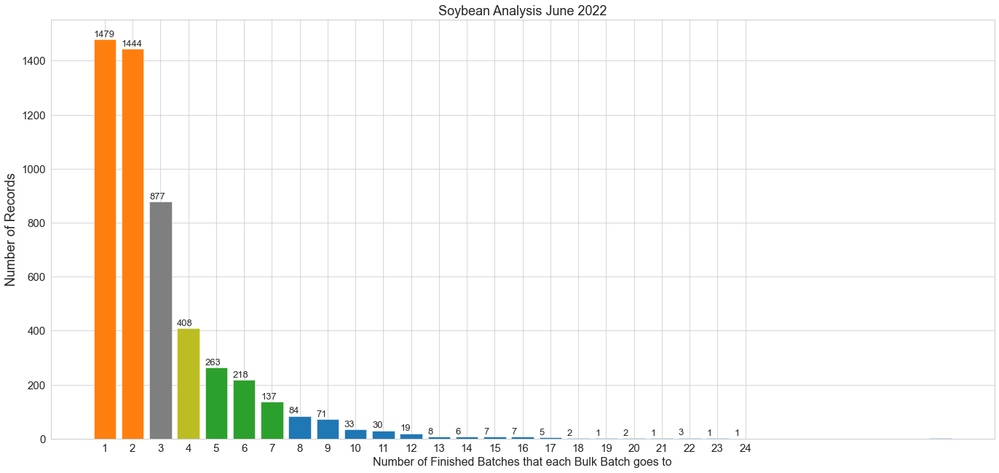

In [735]:
# Values to plot
plot01 = dfr_ag02.groupby('# fin goods').count().reset_index()
#fig, ax = plt.subplots()
fig = plt.figure()
ax = fig.add_axes([0,0,3,2])
x = plot01.iloc[:,0]
y = plot01.iloc[:,1]
# set x range
#ax.set_xticks(np.arange(1,x.max()-6))
ax.set_xticks(np.arange(1,25))
# set titles and labels
ax.set_title('Soybean Analysis June 2022', fontsize = 18)
ax.set_xlabel('Number of Finished Batches that each Bulk Batch goes to', fontsize = 16)
ax.set_ylabel('Number of Records', fontsize = 18)
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
# display values on top of bars
for index, data in enumerate(y):
    plt.text(x=index+.6, y =data+10 , s=f"{data}" , fontdict=dict(fontsize=13))
# set bar colors
    col = []
for val in y:
    if val < 100:
        col.append('tab:blue')
    elif val < 300:
        col.append('tab:green')
    elif val < 500:
        col.append('tab:olive')
    elif val < 1000:
        col.append('tab:grey')
    elif val < 1400:
        col.append('tab:cyan')
    else:
        col.append('tab:orange')
#ax.bar(x, y, color=col, width = 0.75)
ax.bar(x, y, color=col)
plt.show()

In [736]:
dfr_name1 = ['crop_yr','p08_plnt_cd', 'pbc_plnt_cd', 'fin_prcs_ord_nbr','batch_nbr',
            'vrty_desc', 'fin_wg_current','fin_moisture','fin_inert','fin_md', 
            'fin_dnd', 'fin_total_projected_units', 'fin_wg_current_dt'
           ]
dfr_ag01[dfr_name1]
dfr_ag03  = dfr_ag01[dfr_name1].rename(columns = {'batch_nbr':'fin_batch_nbr', 'vrty_desc':'fin_vrty_desc'})


In [737]:
dbr_name1 = ['crop_yr','p08_plnt_cd', 'pbc_plnt_cd', 'fin_prcs_ord_nbr','batch_nbr',
            'vrty_desc', 'wg_current','moisture','md', 'total_projected_units',
            'dnd', 'total_bu', 'bulk_seeds_per_lb', 'bulk_usable_pct', 'wg_current_dt', 
           ]
dbr_ag03[dbr_name1]
dbr_ag04 = dbr_ag03[dbr_name1].rename(columns = {'batch_nbr':'bulk_batch_nbr', 
                                                 'vrty_desc':'bulk_vrty_desc',
                                                 'wg_current':'bulk_wg_current',
                                                 'moisture':'bulk_moisture',
                                                 'md':'bulk_md',
                                                 'dnd':'bulk_dnd',
                                                 'total_bu':'bulk_total_bu',
                                                 'wg_current_dt':'bulk_wg_current_dt'
                                                })


In [738]:
dfb_ag01 = dfr_ag03.merge(dbr_ag04, how = 'inner', on = ['crop_yr', 'p08_plnt_cd', 'pbc_plnt_cd', 'fin_prcs_ord_nbr'])
dfb_ag01

,crop_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,fin_batch_nbr,fin_vrty_desc,fin_wg_current,fin_moisture,fin_inert,fin_md,fin_dnd,fin_total_projected_units,fin_wg_current_dt,bulk_batch_nbr,bulk_vrty_desc,bulk_wg_current,bulk_moisture,bulk_md,total_projected_units,bulk_dnd,bulk_total_bu,bulk_seeds_per_lb,bulk_usable_pct,bulk_wg_current_dt
0,2020,1744.0,8H14,2502163556,AS0SB61A,2XF2850,98.50,11.80,0.26,0.04,0.48,2000.00,20201104,AS0SB61,BCS2804XF21,98.5,11.36,0.04,31377.898243,0.66,29188.333333,2761.0,90.85,2020-10-22
1,2020,1744.0,8H14,2502163556,AS0SB61B,R2859XF,99.00,11.96,0.06,0.04,0.46,0.00,20201104,AS0SB61,BCS2804XF21,98.5,11.36,0.04,31377.898243,0.66,29188.333333,2761.0,90.85,2020-10-22
2,2020,1744.0,8H14,2502163556,AS0SB61C,28XF59,98.00,11.78,0.12,0.10,0.58,1600.00,20201104,AS0SB61,BCS2804XF21,98.5,11.36,0.04,31377.898243,0.66,29188.333333,2761.0,90.85,2020-10-22
3,2020,1744.0,8H14,2502163556,AS0SB61D,2805XF,96.75,11.58,0.00,0.06,0.36,1000.00,20201104,AS0SB61,BCS2804XF21,98.5,11.36,0.04,31377.898243,0.66,29188.333333,2761.0,90.85,2020-10-22
4,2020,1744.0,8H14,2502163556,AS0SB61E,2895XF,98.50,11.82,0.02,0.00,0.50,0.00,20201104,AS0SB61,BCS2804XF21,98.5,11.36,0.04,31377.898243,0.66,29188.333333,2761.0,90.85,2020-10-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13713,2018,1779.0,8H50,103641662,RP84EG1CRA,AG14X0,96.75,12.90,0.04,0.32,0.50,40.00,2018-11-21 00:00:00,RP84EG1CR,AG14X0,99.5,13.10,0.32,306.920211,0.40,302.450000,2602.0,91.00,2018-10-03
13714,2018,1779.0,8H50,103758305,RP84JH1CRA,1020R2X,99.25,13.20,0.00,0.00,0.38,471.24,2019-04-29 00:00:00,RP84JH1CR,CB1010RXN,100.0,13.60,0.02,457.488768,0.34,418.880000,2770.0,92.00,2018-09-27
13715,2018,1779.0,8H50,103632858,RP84JQ1CRA,CB0710RXN,98.25,12.60,0.00,0.14,0.16,263.40,2018-11-07 00:00:00,RP84JQ1CR,CB0710RXN,98.5,12.40,0.08,249.679778,0.22,204.470000,3275.0,87.00,2018-11-07
13716,2019,1779.0,8H50,103977601,RP94CQ1CRA,RM1418B3-C0DNN,98.75,11.00,0.00,0.00,0.68,151.28,2020-03-06 00:00:00,RP94CQ1CR,RM1418B3-C0DNN,99.0,11.90,0.52,238.029742,0.78,208.820000,2891.0,92.00,2019-10-23


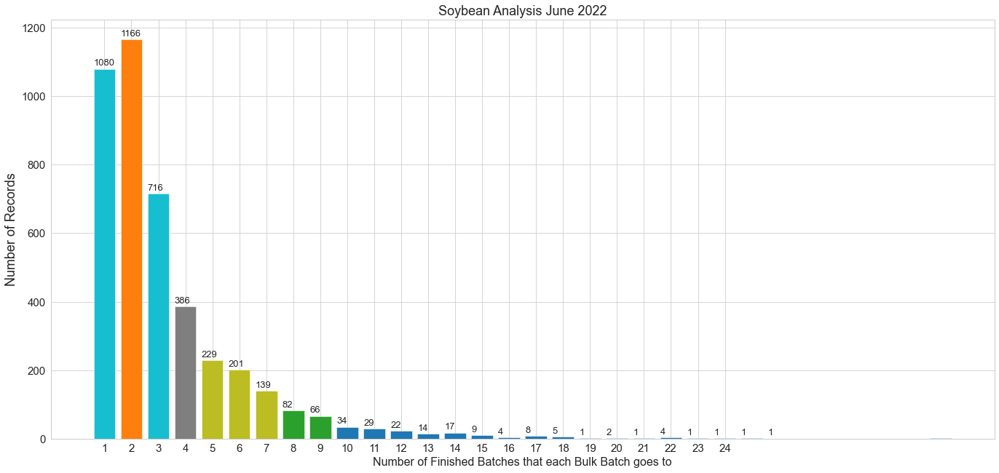

In [739]:
dfb_ag02 = dfb_ag01.groupby('bulk_batch_nbr')[['fin_batch_nbr', 'crop_yr']].count().reset_index()
dfb_ag02.columns = ['bulk_batch_nbr', '# fin goods', 'crop_yr']
#temp = dfb_ag02.groupby('# fin goods').count().reset_index()
#temp.iloc[:,:]

# Values to plot
plot01 = dfb_ag02.groupby('# fin goods').count().reset_index()
#fig, ax = plt.subplots()
fig = plt.figure()
ax = fig.add_axes([0,0,3,2])
x = plot01.iloc[:,0]
y = plot01.iloc[:,1]
# set x range
#ax.set_xticks(np.arange(1,x.max()-6))
ax.set_xticks(np.arange(1,25))
# set titles and labels
ax.set_title('Soybean Analysis June 2022', fontsize = 18)
ax.set_xlabel('Number of Finished Batches that each Bulk Batch goes to', fontsize = 16)
ax.set_ylabel('Number of Records', fontsize = 18)
ax.tick_params(axis = 'both', which = 'major', labelsize = 15)
# display values on top of bars
for index, data in enumerate(y):
    plt.text(x=index+.6, y =data+10 , s=f"{data}" , fontdict=dict(fontsize=13))
# set bar colors
    col = []
for val in y:
    if val < 50:
        col.append('tab:blue')
    elif val < 100:
        col.append('tab:green')
    elif val < 300:
        col.append('tab:olive')
    elif val < 700:
        col.append('tab:grey')
    elif val < 1100:
        col.append('tab:cyan')
    else:
        col.append('tab:orange')
#ax.bar(x, y, color=col, width = 0.75)
ax.bar(x, y, color=col)
plt.show()

In [741]:
# dfb_ag01
# fin_wg, bulk_wg, fin_wg-data, bulk_wg_date

   crop_yr  bulk_total_bu           diff
0     2013   1.179621e+06  433495.040000
1     2014   1.429612e+06  407559.920000
2     2015   2.293998e+06  747969.960000
3     2016   4.800005e+06  382488.070000
4     2017   4.824170e+06  668049.620000
5     2018   3.599108e+06  422431.610000
6     2019   4.147493e+06  779553.890000
7     2020   4.564736e+06  522634.266500
8     2021   3.950577e+05    8537.693333


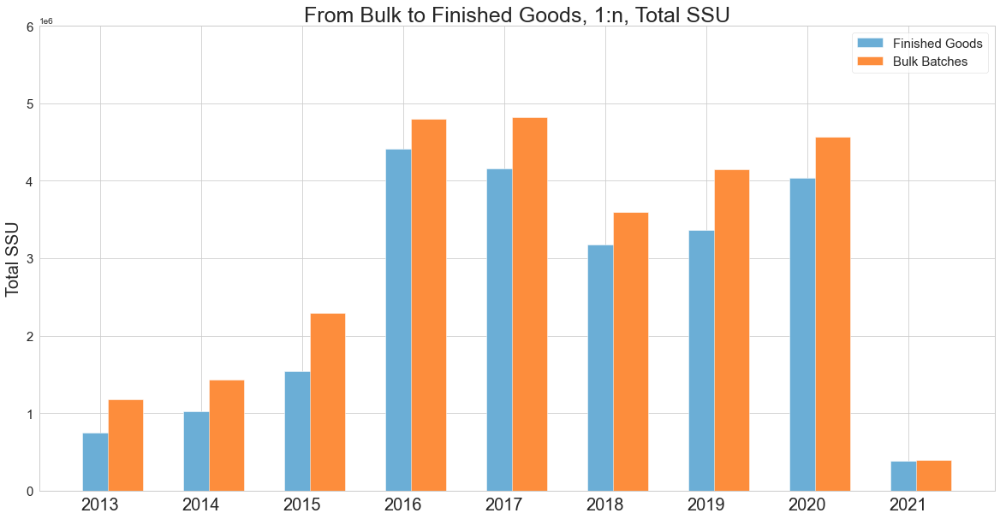

In [742]:
plot1 = dfb_ag01.groupby('crop_yr')['fin_total_projected_units'].sum().reset_index()
plot2 = dfb_ag01.drop_duplicates(subset = ['bulk_batch_nbr'], keep = 'first').groupby('crop_yr')['bulk_total_bu'].sum().reset_index()
plot2['diff'] = plot2.iloc[:,1] - plot1.iloc[:,1] 
print(plot2)

fig = plt.subplots(figsize = (20,10))

X = np.arange(2013, 2022, 1)
#fig = plt.figure()
#ax = fig.add_axes([0,0,1,1])
cmap = plt.get_cmap("tab20c")


plt.bar(X + 0.00, plot1.iloc[:,1], color = cmap(1), width = 0.35)
plt.bar(X + 0.25, plot2.iloc[:,1], color = cmap(5), width = 0.35)

plt.legend(labels = ['Finished Goods', 'Bulk Batches' ], fontsize = 15)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods, 1:n, Total SSU', fontsize = 25)
#p1 = plt.bar(plot2.iloc[:,0], plot2.iloc[:,2])
ind = np.arange(2013,2022)
plt.xticks(ind, tuple(ind), fontsize = 20)

plt.yticks(np.arange(0,7000000, 1000000), fontsize = 15)
plt.show()

In [743]:
dfb_ag03 = dfb_ag01[dfb_ag01.fin_vrty_desc == dfb_ag01.bulk_vrty_desc].dropna(subset = ['fin_wg_current', 'bulk_wg_current'])
dfb_ag04 = dfb_ag03.merge(dm2, how = 'inner', left_on = 'fin_vrty_desc', right_on = 'vrty_desc')

dfb_ag04['fin_drg'] = 0
dfb_ag04.loc[(dfb_ag04['mg'] <= 4)&(dfb_ag04['fin_wg_current'] > 91.5), 'fin_drg'] = 1
dfb_ag04.loc[(dfb_ag04['mg'] > 4)&(dfb_ag04['fin_wg_current'] > 86.5), 'fin_drg'] = 1

dfb_ag04['bulk_drg'] = 0
dfb_ag04.loc[(dfb_ag04['mg'] <= 4)&(dfb_ag04['bulk_wg_current'] > 91.5), 'bulk_drg'] = 1
dfb_ag04.loc[(dfb_ag04['mg'] > 4)&(dfb_ag04['bulk_wg_current'] > 86.5), 'bulk_drg'] = 1

dfb_ag04

,crop_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,fin_batch_nbr,fin_vrty_desc,fin_wg_current,fin_moisture,fin_inert,fin_md,fin_dnd,fin_total_projected_units,fin_wg_current_dt,bulk_batch_nbr,bulk_vrty_desc,bulk_wg_current,bulk_moisture,bulk_md,total_projected_units,bulk_dnd,bulk_total_bu,bulk_seeds_per_lb,bulk_usable_pct,bulk_wg_current_dt,vrty_desc,maturity,mg,fin_drg,bulk_drg
0,2020,1285.0,8H16,2502178523,CE0SB33A,RB4671RXNS,95.00,12.0,0.01,0.28,0.09,80.00,20201224,CE0SB33,RB4671RXNS,98.0,11.5,0.18,4068.829943,0.26,3374.333333,3156.0,89.15,2020-11-23,RB4671RXNS,4.6,4,1,1
1,2017,1778.0,8H45,103413348,MF73BC3A,RB4671RXNS,93.25,11.0,0.44,0.40,0.08,2800.00,2018-02-20 00:00:00,MF73BC3,RB4671RXNS,92.0,11.2,0.96,4662.385680,0.84,3885.670000,3032.0,92.34,2017-11-08,RB4671RXNS,4.6,4,1,1
2,2017,1778.0,8H45,103413348,MF73BC3C,RB4671RXNS,91.50,11.0,0.12,0.36,0.00,1158.80,2018-02-19 00:00:00,MF73BC3,RB4671RXNS,92.0,11.2,0.96,4662.385680,0.84,3885.670000,3032.0,92.34,2017-11-08,RB4671RXNS,4.6,4,0,1
3,2020,1285.0,8H16,2502178457,CE0SEA2A,CBRB3791XFN,96.75,11.1,0.00,0.14,0.08,800.00,20210212,CE0SD81,CBRB3791XFN,99.0,12.8,0.06,9229.646301,0.33,9042.000000,2628.0,90.63,2020-10-22,CBRB3791XFN,3.7,3,1,1
4,2020,1285.0,8H16,2502201711,CE0SAD11,CBRB3791XFN,97.75,11.2,0.12,0.30,0.17,240.00,20210414,CE0SAD1,CBRB3791XFN,99.0,10.4,0.29,45973.921692,0.11,49860.996667,2413.0,89.16,2020-12-01,CBRB3791XFN,3.7,3,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9162,2019,1779.0,8H50,103977605,RP94DE1CRA,RM1818B2-C0DNN,99.50,11.6,0.10,0.80,0.08,189.12,2020-03-17 00:00:00,RP94DE1CR,RM1818B2-C0DNN,98.5,11.9,1.98,223.296641,0.10,206.350000,2936.0,86.00,2019-11-14,RM1818B2-C0DNN,1.8,1,1,1
9163,2018,1779.0,8H50,103701326,RP82WE33A,RM1818B4-C0DNN,96.75,13.1,0.02,0.08,0.02,107.72,2019-02-07 00:00:00,RP82WE33,RM1818B4-C0DNN,99.0,13.1,0.12,107.229845,0.42,89.970000,3056.0,91.00,2018-10-08,RM1818B4-C0DNN,1.8,1,1,1
9164,2018,1779.0,8H50,103711563,RP82WE38A,RM1718A1-C0DNN,98.50,13.8,0.00,0.04,0.34,97.28,2019-02-18 00:00:00,RP82WE38,RM1718A1-C0DNN,96.0,13.6,0.22,98.667003,0.72,84.200000,2972.0,92.00,2018-10-08,RM1718A1-C0DNN,1.7,1,1,1
9165,2019,1779.0,8H50,103980101,RP95JT091,CX0404N,94.25,14.3,0.00,0.48,0.44,31.00,2020-04-01 00:00:00,RP95JT09,CX0404N,92.5,14.4,0.26,34.196765,0.86,37.080000,2391.0,90.00,2019-10-02,CX0404N,0.4,0,1,1


   crop_yr  total_projected_units          diff
0     2013           6.370198e+05  2.526844e+05
1     2014           8.067517e+05  2.637976e+05
2     2015           1.923351e+06  7.046691e+05
3     2016           4.264568e+06  4.467312e+05
4     2017           4.195135e+06  7.472285e+05
5     2018           2.971820e+06  8.461140e+05
6     2019           3.384987e+06  1.020174e+06
7     2020           3.324295e+06  7.650947e+05
8     2021           3.112193e+05  3.759634e+04


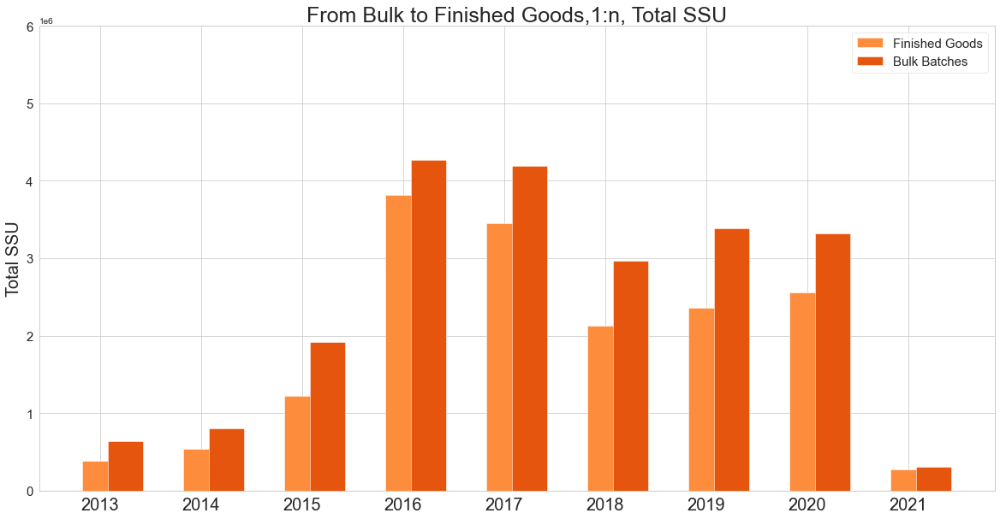

In [744]:
plot1 = dfb_ag04.groupby('crop_yr')['fin_total_projected_units'].sum().reset_index()
plot2 = dfb_ag04.drop_duplicates(subset = ['bulk_batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()
plot2['diff'] = plot2.iloc[:,1] - plot1.iloc[:,1] 
print(plot2)

fig = plt.subplots(figsize = (20,10))

X = np.arange(2013, 2022, 1)
#fig = plt.figure()
#ax = fig.add_axes([0,0,1,1])
plt.bar(X + 0.00, plot1.iloc[:,1], color = cmap(5), width = 0.35)
plt.bar(X + 0.25, plot2.iloc[:,1], color = cmap(4), width = 0.35)

plt.legend(labels = ['Finished Goods', 'Bulk Batches' ], fontsize = 15)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods,1:n, Total SSU', fontsize = 25)
#p1 = plt.bar(plot2.iloc[:,0], plot2.iloc[:,2])

plt.yticks(np.arange(0,7000000, 1000000), fontsize = 15)
ind = np.arange(2013,2022)
plt.xticks(ind, tuple(ind), fontsize = 20)
plt.show()

2209834.6627344913
2825874.52


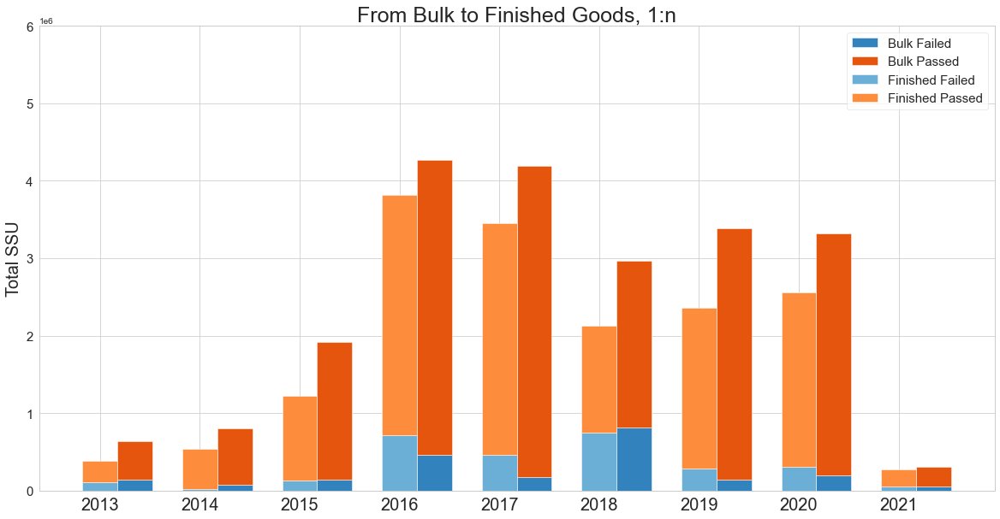

In [745]:
dfb_ag04.groupby(['crop_yr', 'bulk_drg']).count()

ind = np.arange(2013,2022)
width = 0.35

yrprep = dfb_ag04.drop_duplicates(subset = ['bulk_batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)

yrloc2 = dfb_ag04.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)

print(yy.SSU_y.sum())
print(yy2.SSU_y.sum())

fig = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind+0.35, fail_d, width, color = cmap(0))
p2 = plt.bar(ind+0.35, pass_d, width, color = cmap(4), bottom = fail_d)

p3 = plt.bar(ind, fail_d2, width, color = cmap(1))
p4 = plt.bar(ind, pass_d2, width, color = cmap(5), bottom = fail_d2)

ind = np.arange(2013,2022)
plt.xticks(ind, tuple(yy.crop_yr.values), fontsize = 20)
#plt.yticks(np.arange(0,700000, 100000), fontsize = 15)
plt.legend(labels = ['Bulk Failed', 'Bulk Passed', 'Finished Failed', 'Finished Passed'], fontsize = 15)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods, 1:n', fontsize = 25)
# display values on top of bars
#for index, data in enumerate(fail_d):
#    plt.text(x=index-0.3, y = data+10 , s=f"{data}" , fontdict=dict(fontsize=15))

plt.yticks(np.arange(0,7000000, 1000000), fontsize = 15)

plt.show()

# Derogation Score Variance Analysis, 1:n

In [746]:
dfb_ag05 = dfb_ag04\
        .groupby('bulk_batch_nbr')['fin_wg_current']\
        .agg(['mean','min', 'max','var'])\
        .reset_index().fillna(0)


In [747]:
dfb_ag055 = dfb_ag04.merge(dfb_ag05, how = 'inner', on = 'bulk_batch_nbr')
dfb_ag055['drgdiff'] = dfb_ag055.bulk_wg_current - dfb_ag055['fin_wg_current'] 
dfb_ag06 = dfb_ag055[dfb_ag055['var']<150].drop_duplicates(subset=['bulk_batch_nbr'], keep = 'first')


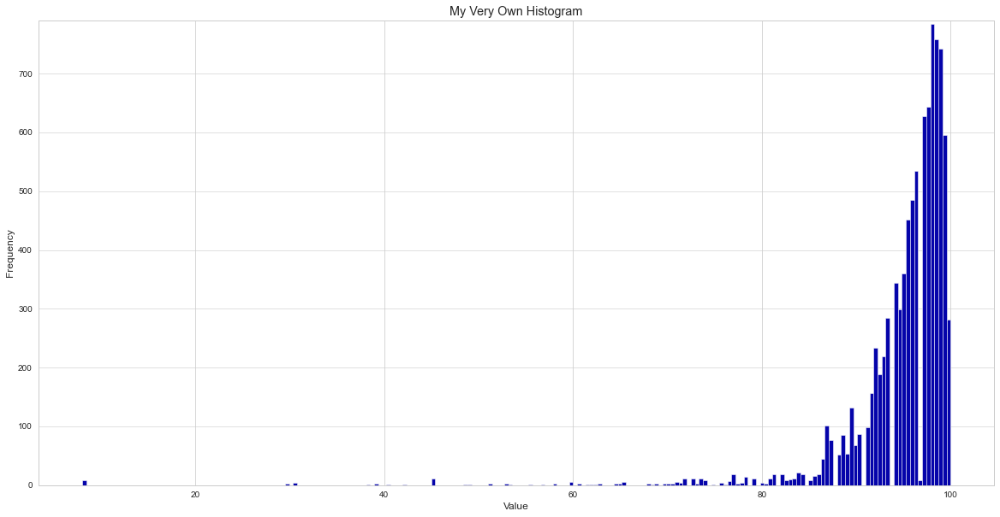

In [748]:
dfb_ag055['drgdiff'] = dfb_ag055.bulk_wg_current - dfb_ag055['fin_wg_current'] 
# x axis values
x = dfb_ag055.fin_batch_nbr
# corresponding y axis values
#y = dfb_ag055.drgdiff
y = dfb_ag055.bulk_wg_current
  
# plotting the points 
plt.figure(figsize=(20,10))

n, bins, patches = plt.hist(y, bins='auto', color='#0504aa')
                            #,alpha=0.7, rwidth=0.5)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('My Very Own Histogram')
#plt.text(23, 45, r'$\mu=15, b=3$')
maxfreq = n.max()
# Set a clean upper y-axis limit.
plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)
plt.show() 

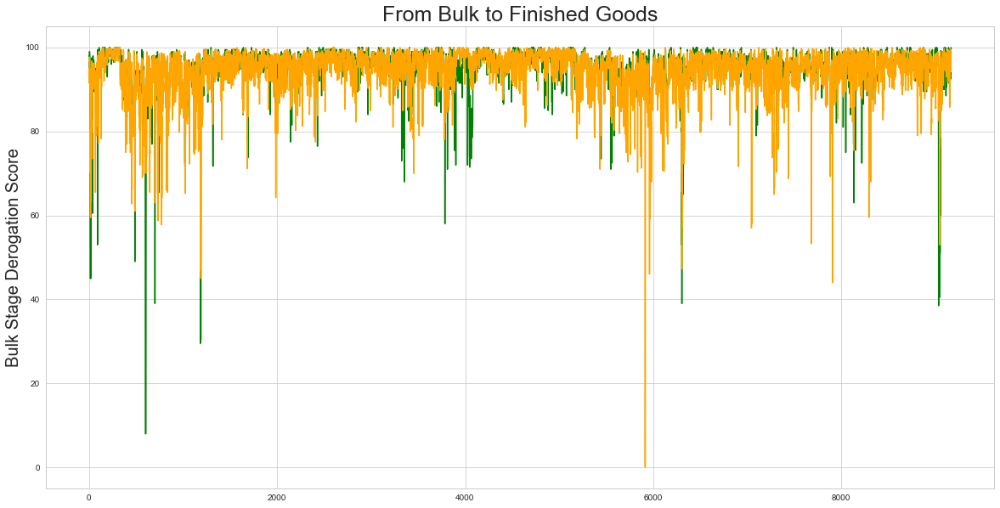

In [749]:
x = dfb_ag055.fin_batch_nbr
# corresponding y axis values
y1 = dfb_ag055.bulk_wg_current
y2 = dfb_ag055.fin_wg_current

  
# plotting the points 
plt.figure(figsize=(20,10))

plt.ylabel('Bulk Stage Derogation Score', fontsize = 20)
plt.title('From Bulk to Finished Goods', fontsize = 25)

plt.plot(y1, color = 'green')
plt.plot(y2, color = 'orange')

plt.show()

In [750]:
dfb_ag06list = list(dfb_ag05[dfb_ag05['var']>=100]['bulk_batch_nbr'])
dfb_ag06list
dfb_ag055[dfb_ag055.bulk_batch_nbr.isin(dfb_ag06list) & (dfb_ag055.crop_yr == 2019)][['crop_yr','bulk_batch_nbr', 'fin_batch_nbr',                                                      
                                                      'bulk_wg_current', 'fin_wg_current', 
                                                      'total_projected_units', 'fin_total_projected_units',
                                                     'var', 'bulk_drg', 'fin_drg','mg']].sort_values('var',ascending=False).reset_index()


,index,crop_yr,bulk_batch_nbr,fin_batch_nbr,bulk_wg_current,fin_wg_current,total_projected_units,fin_total_projected_units,var,bulk_drg,fin_drg,mg
0,606,2019,MF93HS1,MF93HS11,70.5,90.75,3198.136942,152.00,215.28125,0,1,5
1,607,2019,MF93HS1,MF93HS1A,70.5,70.00,3198.136942,2558.00,215.28125,0,0,5
2,5144,2019,RP92NN12,RP92NN121,99.0,84.50,202.721440,0.00,112.50000,1,0,0
3,5145,2019,RP92NN12,RP92NN12A,99.0,99.50,202.721440,84.56,112.50000,1,1,0


59778.10177493607
48963.8


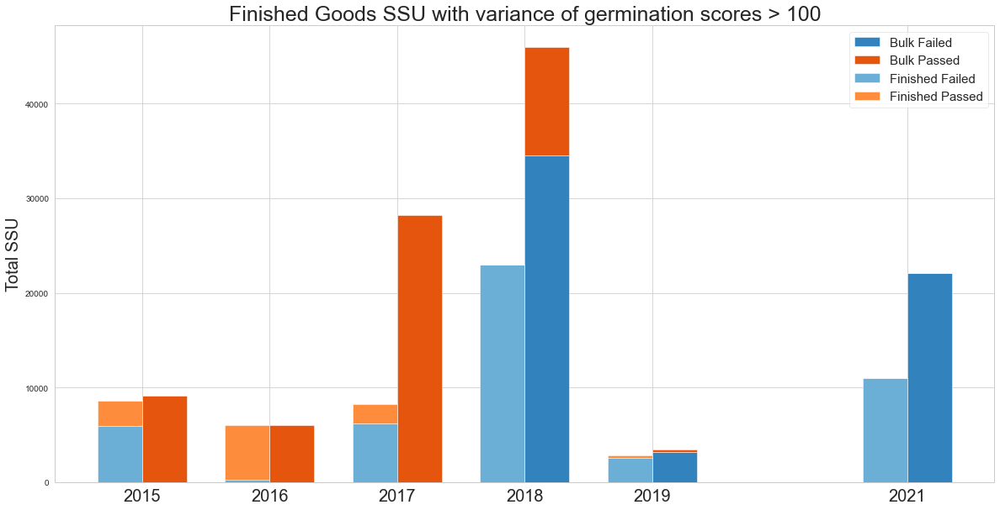

In [751]:
dfb_ag06list = list(dfb_ag05[dfb_ag05['var']>100]['bulk_batch_nbr'])

to_plot = dfb_ag055[dfb_ag055.bulk_batch_nbr.isin(dfb_ag06list)]
#[['crop_yr','bulk_batch_nbr', 'fin_batch_nbr','bulk_wg_current', 'fin_wg_current','bulk_drg', 'fin_drg']]
ind = np.arange(2015, 2020)
ind = to_plot.crop_yr.drop_duplicates(keep = 'first').sort_values().values
width = 0.35

yrprep = to_plot.drop_duplicates(subset = ['bulk_batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)

yrloc2 = to_plot.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)

print(yy.SSU_y.sum())
print(yy2.SSU_y.sum())

fig = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind+0.175, fail_d, width, color = cmap(0))
p2 = plt.bar(ind+0.175, pass_d, width, color = cmap(4), bottom = fail_d)

p3 = plt.bar(ind-0.175, fail_d2, width, color = cmap(1))
p4 = plt.bar(ind-0.175, pass_d2, width, color = cmap(5), bottom = fail_d2)


plt.xticks(ind, tuple(yy.crop_yr.values), fontsize = 20)
#plt.yticks(np.arange(0,700, 100), fontsize = 15)
plt.legend(labels = ['Bulk Failed', 'Bulk Passed', 'Finished Failed', 'Finished Passed'], fontsize = 15)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('Finished Goods SSU with variance of germination scores > 100', fontsize = 25)
# display values on top of bars
#for index, data in enumerate(fail_d):
#    plt.text(x=index-0.3, y = data+10 , s=f"{data}" , fontdict=dict(fontsize=15))

#plt.yticks(np.arange(0,7000000, 1000000), fontsize = 15)

plt.show()

# Finished Batch SSU Analysis

In [752]:
dfr_name1 = ['crop_yr','p08_plnt_cd', 'pbc_plnt_cd', 'fin_prcs_ord_nbr','batch_nbr',
            'vrty_desc', 'fin_wg_current','fin_moisture','fin_inert','fin_md', 
            'fin_dnd', 'fin_total_projected_units', 'fin_wg_current_dt'
           ]
dfr[dfr_name1].head()
dfr_a01 = dfr[dfr_name1].drop_duplicates('batch_nbr').dropna(subset = ['fin_wg_current']).dropna(subset = ['p08_plnt_cd'])
dfr_a01 = dfr_a01[dfr_a01.fin_total_projected_units > 10]

## Read Maturity Group Table

In [753]:
dm2 = pd.read_csv('~/Documents/Jupyter_Notebook/soyMG_0404_v2.csv')
dm2['MG'] = dm2['MG'].astype('int64')
dm2.dtypes
dm2.columns = ['vrty_desc', 'maturity', 'mg']

## Maturity Group Merged with dfr_a01

In [754]:
dfr_a02 = dfr_a01.merge(dm2, how = 'inner', on = 'vrty_desc')


In [755]:
dfr_a02['fin_drg'] = 0
dfr_a02.loc[(dfr_a02['mg'] <= 4)&(dfr_a02['fin_wg_current'] > 91.5), 'fin_drg'] = 1
dfr_a02.loc[(dfr_a02['mg'] > 4)&(dfr_a02['fin_wg_current'] > 86.5), 'fin_drg'] = 1


In [756]:
dfr_a02.crop_yr.isna().sum()

dfr_a02.p08_plnt_cd.isna().sum()

dfr_a02.pbc_plnt_cd.isna().sum()

dfr_a02.batch_nbr.isna().sum()

dfr_a02.vrty_desc.isna().sum()

dfr_a02.fin_moisture.isna().sum()

dfr_a02.fin_inert.isna().sum()

dfr_a02.fin_md.isna().sum()

dfr_a02.fin_dnd.isna().sum()

dfr_a02.fin_total_projected_units.describe()

count    41228.000000
mean      3098.133924
std       2038.806632
min         10.400000
25%       1240.000000
50%       3000.000000
75%       4920.000000
max      18640.000000
Name: fin_total_projected_units, dtype: float64

## Plot SSU

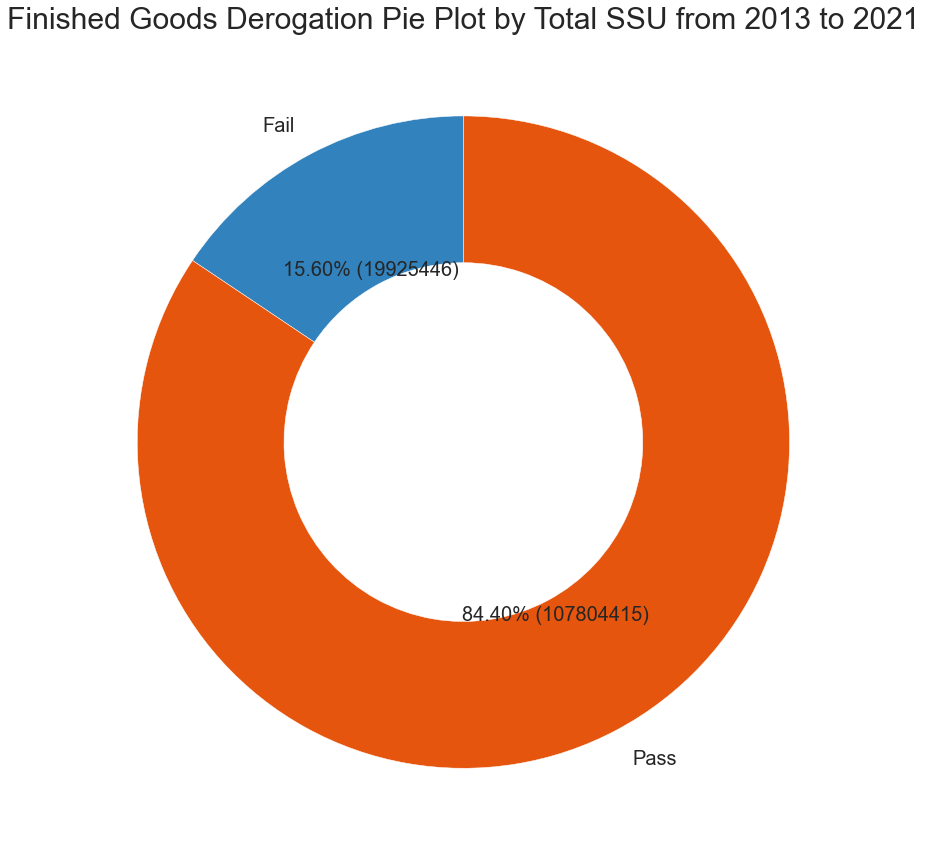

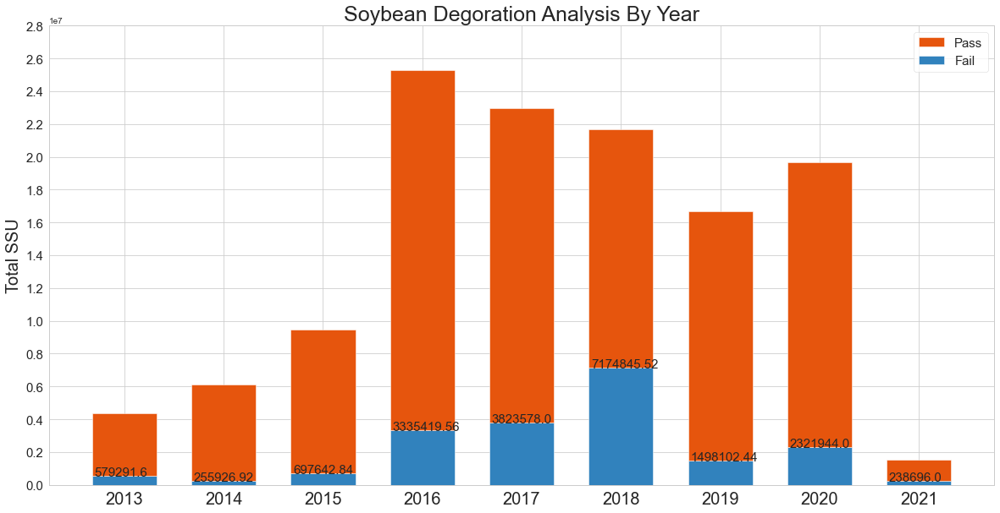

In [757]:
pie11 = dfr_a02.groupby(['fin_drg'])['fin_total_projected_units'].sum().reset_index()
pie11

pie11 = dfr_a02.groupby(['fin_drg'])['fin_total_projected_units'].sum().reset_index()
labels = 'Fail', 'Pass'
sizes = pie11.iloc[:,1]
size = 0.45

cmap = plt.get_cmap("tab20c")
col1 = cmap([0,4])

explode = (0,0)

def absolute_value(val):
    a = int(np.round(val/100.*sizes.sum(),0))
    return a
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}% ({v:d})'.format(p=pct,v=val)
    return my_autopct

fig1, ax1 = plt.subplots(figsize = (15, 15))
ax1.pie(sizes, 
        radius = 1, colors = col1, wedgeprops = dict(width = size, edgecolor = 'w'), 
        labels = labels, labeldistance = 1.1, 
        autopct = make_autopct(sizes), startangle = 90, textprops = {'fontsize':20})

#plt.legend(title = 'Among 1405 Records')
plt.title('Finished Goods Derogation Pie Plot by Total SSU from 2013 to 2021', fontsize = 30)

plt.show()


yrloc = dfr_a02.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()

yrloc.columns = ['fin_drg', 'crop_yr', 'SSU']

y0 = yrloc[yrloc.fin_drg == 0]
y1 = yrloc[yrloc.fin_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)

ind = np.arange(N)
width = 0.65

fig = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind, fail_d, width, color = cmap(0))
p2 = plt.bar(ind, pass_d, width, color = cmap(4), bottom = fail_d)


plt.ylabel('Total SSU', fontsize = 20)
plt.title('Soybean Degoration Analysis By Year', fontsize = 25)
plt.xticks(ind, tuple(yy.crop_yr.values), fontsize = 20)
plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)
plt.legend((p2[0], p1[0]), ('Pass', 'Fail' ), fontsize = 15)

# display values on top of bars
for index, data in enumerate(fail_d):
    plt.text(x=index-0.3, y = data+10 , s=f"{data}" , fontdict=dict(fontsize=15))

plt.show()

# Bulk Batch Analysis

In [758]:
dbr_name1 = ['crop_yr','p08_plnt_cd', 'pbc_plnt_cd', 'fin_prcs_ord_nbr','batch_nbr',
            'vrty_desc', 'wg_current','moisture','md', 'total_projected_units',
            'dnd', 'total_bu', 'bulk_seeds_per_lb', 'bulk_usable_pct', 'wg_current_dt', 
           ]
dbr[dbr_name1].head()
dbr_a01 = dbr[dbr_name1].drop_duplicates('batch_nbr').dropna(subset = ['wg_current']).dropna(subset = ['p08_plnt_cd'])
dbr_a01 = dbr_a01[dbr_a01.total_bu > 10]

In [759]:
dbr_a02 = dbr_a01.merge(dm2, how = 'inner', on = 'vrty_desc')


In [760]:
dfb_mrg_nbr = dfr_a02.merge(dbr_a02, how = 'inner', on = 'fin_prcs_ord_nbr')['fin_prcs_ord_nbr'].drop_duplicates(keep = 'first')
dfr_a03 = dfr_a02.merge(dfb_mrg_nbr, how = 'inner', on = 'fin_prcs_ord_nbr')


In [761]:
dbr_a02['bulk_drg'] = 0
dbr_a02.loc[(dbr_a02['mg'] <= 4)&(dbr_a02['wg_current'] > 91.5), 'bulk_drg'] = 1
dbr_a02.loc[(dbr_a02['mg'] > 4)&(dbr_a02['wg_current'] > 86.5), 'bulk_drg'] = 1


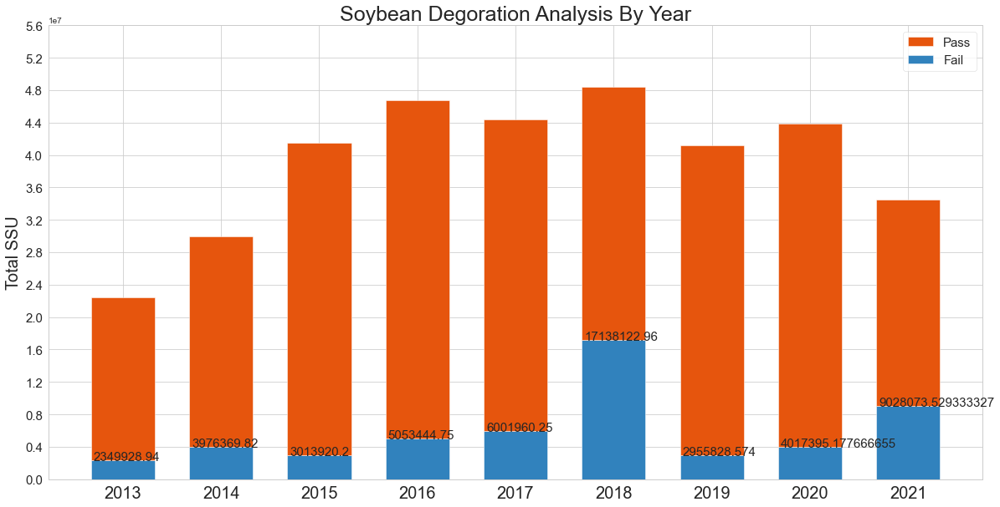

In [762]:

yrloc = dbr_a02.groupby(['bulk_drg','crop_yr'])['total_bu'].sum().reset_index()

yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']

y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)

ind = np.arange(N)
width = 0.65

fig = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind, fail_d, width, color = cmap(0))
p2 = plt.bar(ind, pass_d, width, color = cmap(4), bottom = fail_d)



plt.xticks(ind, tuple(yy.crop_yr.values), fontsize = 20)
plt.yticks(np.arange(0,60000000, 4000000), fontsize = 15)
plt.legend((p2[0], p1[0]), ('Pass', 'Fail' ), fontsize = 15)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('Soybean Degoration Analysis By Year', fontsize = 25)
# display values on top of bars
for index, data in enumerate(fail_d):
    plt.text(x=index-0.3, y = data+10 , s=f"{data}" , fontdict=dict(fontsize=15))

plt.show()

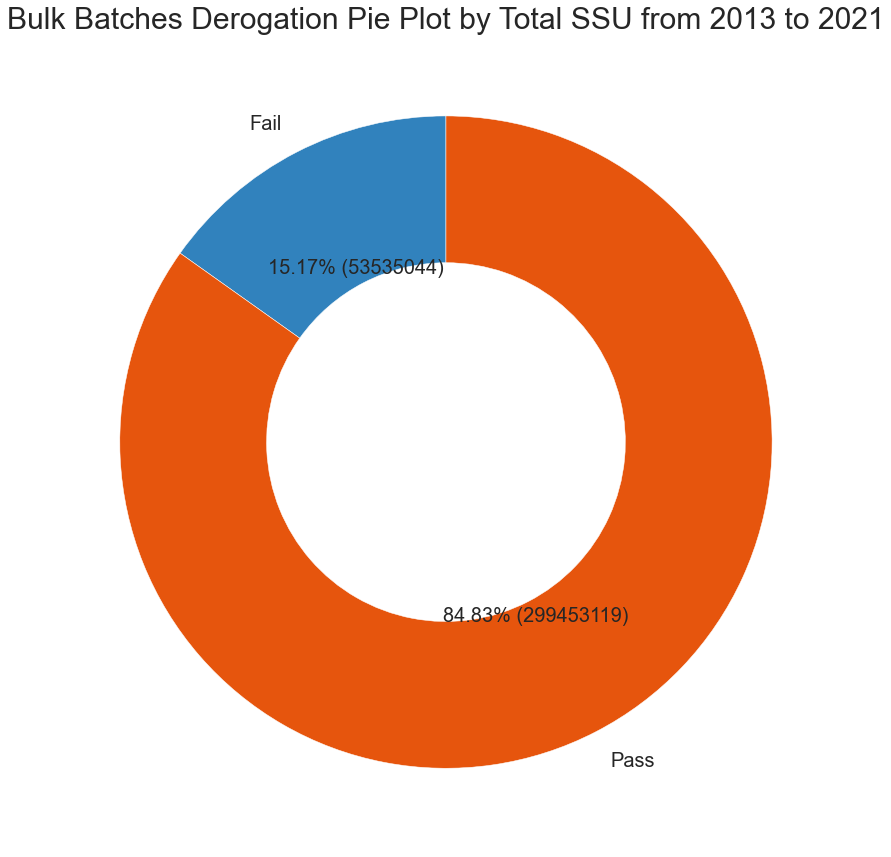

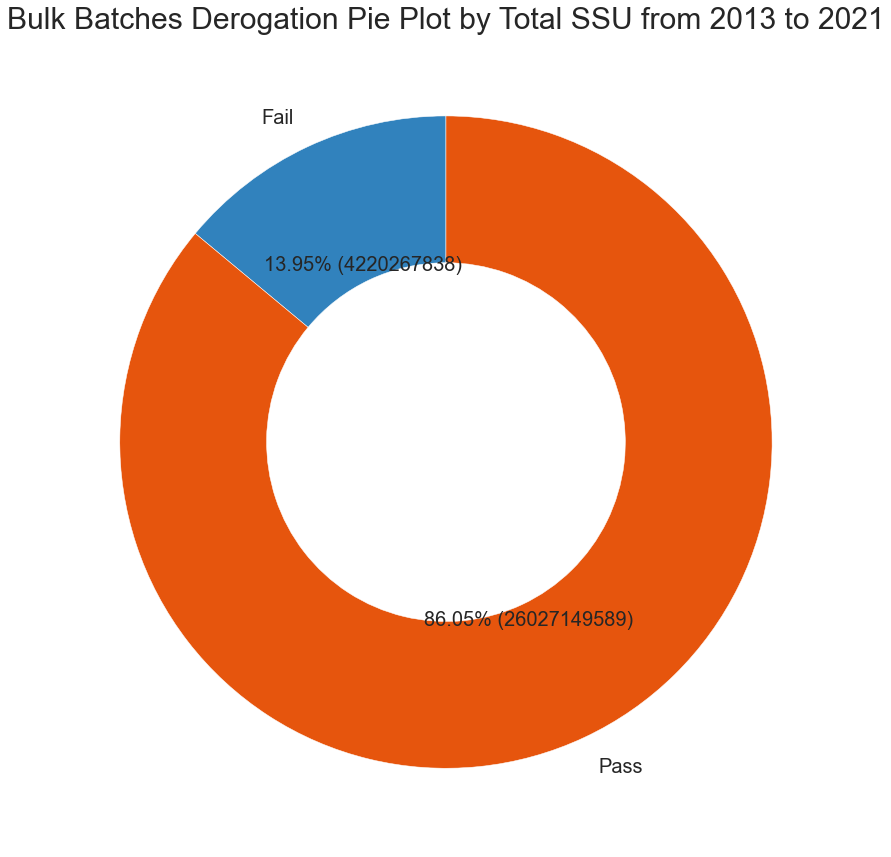

In [763]:
pie11 = dbr_a02.groupby(['bulk_drg'])['total_bu'].sum().reset_index()
labels = 'Fail', 'Pass'
sizes = pie11.iloc[:,1]
size = 0.45

cmap = plt.get_cmap("tab20c")
col1 = cmap([0,4])

explode = (0,0)

def absolute_value(val):
    a = int(np.round(val/100.*sizes.sum(),0))
    return a
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}% ({v:d})'.format(p=pct,v=val)
    return my_autopct

fig1, ax1 = plt.subplots(figsize = (15, 15))
ax1.pie(sizes, 
        radius = 1, colors = col1, wedgeprops = dict(width = size, edgecolor = 'w'), 
        labels = labels, labeldistance = 1.1, 
        autopct = make_autopct(sizes), startangle = 90, textprops = {'fontsize':20})

#plt.legend(title = 'Among 1405 Records')
plt.title('Bulk Batches Derogation Pie Plot by Total SSU from 2013 to 2021', fontsize = 30)

plt.show()

dbr_a02['total_usable_bu'] = dbr_a02.total_bu * dbr_a02.bulk_usable_pct
pie11 = dbr_a02.groupby(['bulk_drg'])['total_usable_bu'].sum().reset_index()
labels = 'Fail', 'Pass'
sizes = pie11.iloc[:,1]
size = 0.45

cmap = plt.get_cmap("tab20c")
col1 = cmap([0,4])

explode = (0,0)

def absolute_value(val):
    a = int(np.round(val/100.*sizes.sum(),0))
    return a
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}% ({v:d})'.format(p=pct,v=val)
    return my_autopct

fig1, ax1 = plt.subplots(figsize = (15, 15))
ax1.pie(sizes, 
        radius = 1, colors = col1, wedgeprops = dict(width = size, edgecolor = 'w'), 
        labels = labels, labeldistance = 1.1, 
        autopct = make_autopct(sizes), startangle = 90, textprops = {'fontsize':20})

#plt.legend(title = 'Among 1405 Records')
plt.title('Bulk Batches Derogation Pie Plot by Total SSU from 2013 to 2021', fontsize = 30)

plt.show()

# dfr_a02 merge with dbr_a02 to get all fin_prcs_ord_nbr, M:N relationship

In [764]:
dfb_mrg_nbr = dfr_a02.merge(dbr_a02, how = 'inner', on = 'fin_prcs_ord_nbr')['fin_prcs_ord_nbr'].drop_duplicates(keep = 'first')
dfr_a03 = dfr_a02.merge(dfb_mrg_nbr, how = 'inner', on = 'fin_prcs_ord_nbr')
#print(dfr_a02.shape)
#print(dfr_a03.shape)

In [765]:
#dfl_a01 = dfr_a03.merge(dfl[['fin_batch_nbr','gr_qty_ssu','tot_gr_qty_ssu']], how = 'inner', left_on = ['batch_nbr', 'fin_prcs_ord_nbr'], right_on = ['fin_batch_nbr', 'fin_prcs_ord_nbr'])
dfl_a01 = dfr_a03.merge(dfl[['fin_batch_nbr','gr_qty_ssu','tot_gr_qty_ssu']], how = 'inner', left_on = ['batch_nbr'], right_on = 
             ['fin_batch_nbr'])

In [766]:
dfb_mrg_nbr = dfr_a02.merge(dbr_a02, how = 'inner', on = 'fin_prcs_ord_nbr')['fin_prcs_ord_nbr'].drop_duplicates(keep = 'first')
dbr_a03 = dbr_a02.merge(dfb_mrg_nbr, how = 'inner', on = 'fin_prcs_ord_nbr')
#print(dbr_a02.shape)
#print(dbr_a03.shape)
#dbr_a03.groupby(['crop_yr', 'bulk_drg']).count().reset_index()

   crop_yr      total_bu          diff
0     2013  7.115356e+06  2.783839e+06
1     2014  8.940073e+06  2.894327e+06
2     2015  1.152811e+07  2.282939e+06
3     2016  2.532008e+07  4.406303e+05
4     2017  2.414628e+07  1.548977e+06
5     2018  2.284794e+07  1.563866e+06
6     2019  1.756288e+07  1.218095e+06
7     2020  1.995255e+07  5.510293e+05
8     2021  1.751511e+06  2.436892e+05


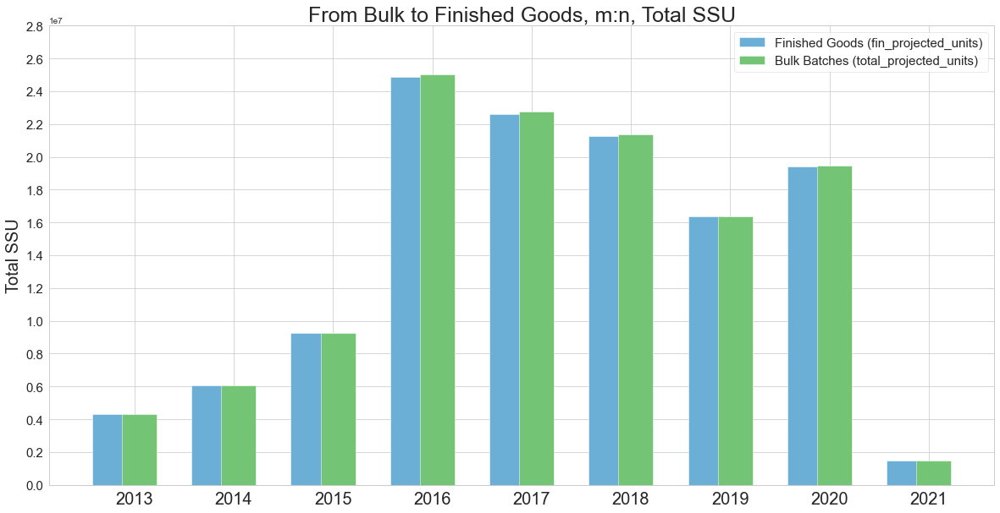

In [767]:
ind = np.arange(2013,2022)

plot1 = dfr_a03.groupby('crop_yr')['fin_total_projected_units'].sum().reset_index()
plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_bu'].sum().reset_index()
plot2['diff'] = plot2.iloc[:,1] - plot1.iloc[:,1] 

plot3 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()
plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first').groupby('crop_yr')['total_bu'].sum().reset_index()

plot5 = dfl_a01.groupby('crop_yr')[['gr_qty_ssu','tot_gr_qty_ssu']].sum().reset_index()
print(plot2)
#print(plot2['total_projected_units'].sum())

fig = plt.subplots(figsize = (20,10))

X = np.arange(2013, 2022, 1)
#plt.bar(X + 0.00, plot1.iloc[:,1], color = cmap(5), width = 0.35)
#plt.bar(X + 0.00, plot4.iloc[:,1], color = cmap(8), width = 0.35)
plt.bar(X - 0.25, plot1.iloc[:,1], color = cmap(1), width = 0.35)
#plt.bar(X + 0.0, plot3.iloc[:,1], color = cmap(5), width = 0.35)
plt.bar(X + 0.05, plot5.iloc[:,2], color = cmap(9), width = 0.35)



plt.legend(labels = ['Finished Goods (fin_projected_units)', 'Bulk Batches (total_projected_units)', 'Difference' ], fontsize = 15)
#plt.legend(labels = ['Bulk Batches with link to Finished Goods in total_bu', 'Bulk Batches with link to Finished Goods in total_projected_units' ], fontsize = 15)

plt.xticks(ind, tuple(ind), fontsize = 20)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods, m:n, Total SSU', fontsize = 25)

plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)
plt.show()

   crop_yr  total_projected_units          diff
0     2013           7.227065e+06  2.895547e+06
1     2014           8.989432e+06  2.943686e+06
2     2015           1.210585e+07  2.860682e+06
3     2016           2.630334e+07  1.423895e+06
4     2017           2.451710e+07  1.919799e+06
5     2018           2.397658e+07  2.692506e+06
6     2019           1.849000e+07  2.145219e+06
7     2020           2.113057e+07  1.729047e+06
8     2021           1.811036e+06  3.032141e+05
18913595.051181346


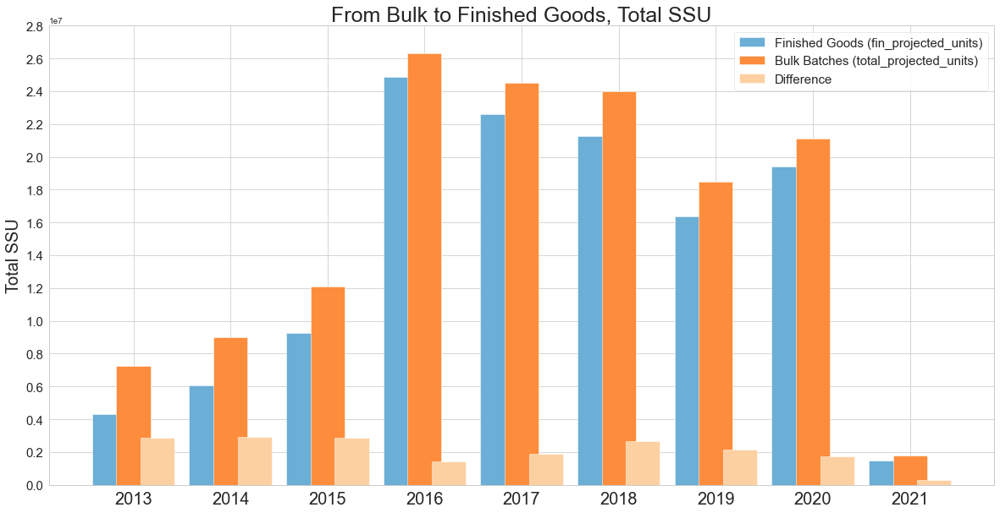

In [768]:
ind = np.arange(2013,2022)

plot1 = dfr_a03.groupby('crop_yr')['fin_total_projected_units'].sum().reset_index()
plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()
plot2['diff'] = plot2.iloc[:,1] - plot1.iloc[:,1] 

plot3 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()
plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first').groupby('crop_yr')['total_bu'].sum().reset_index()

print(plot2)
print(plot2['diff'].sum())

fig = plt.subplots(figsize = (20,10))

X = np.arange(2013, 2022, 1)
plt.bar(X - 0.25, plot1.iloc[:,1], color = cmap(1), width = 0.35)
#plt.bar(X + 0.00, plot4.iloc[:,1], color = cmap(8), width = 0.35)
plt.bar(X + 0.0, plot3.iloc[:,1], color = cmap(5), width = 0.35)

plt.bar(X + 0.25, plot2.iloc[:,2], color = cmap(7), width = 0.35)

plt.legend(labels = ['Finished Goods (fin_projected_units)', 'Bulk Batches (total_projected_units)', 'Difference' ], fontsize = 15)
#plt.legend(labels = ['Bulk Batches with link to Finished Goods in total_bu', 'Bulk Batches with link to Finished Goods in total_projected_units' ], fontsize = 15)

plt.xticks(ind, tuple(ind), fontsize = 20)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods, Total SSU', fontsize = 25)

plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)
plt.show()

0    0.047783
1    0.042793
2    0.021782
3    0.068515
4    0.063882
5    0.208302
6    0.049282
7    0.062962
8    0.133303
dtype: float64
11365542.944999995
19455500.68


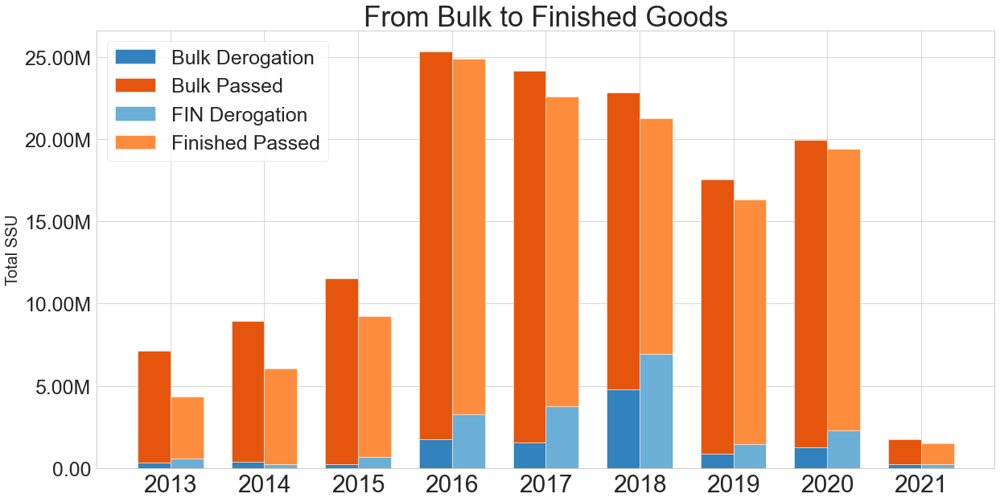

In [769]:
ind = np.arange(2013,2022)
width = 0.35

yrprep = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_bu'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)

print(yy.SSU_y/(yy.SSU_y+yy.SSU_x))

yrloc2 = dfr_a03.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)

print(yy.SSU_y.sum())
print(yy2.SSU_y.sum())

fig, ax = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-0.175, fail_d, width, color = cmap(0))
p2 = plt.bar(ind-0.175, pass_d, width, color = cmap(4), bottom = fail_d)

p3 = plt.bar(ind+0.175, fail_d2, width, color = cmap(1))
p4 = plt.bar(ind+0.175, pass_d2, width, color = cmap(5), bottom = fail_d2)


plt.xticks(ind, tuple(ind), fontsize = 30)
plt.legend(labels = [
                       'Bulk Derogation'
                    , 'Bulk Passed'
                      ,'FIN Derogation'
                     , 'Finished Passed'
                    ], fontsize = 25)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods', fontsize = 35)


plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)


plt.show()

139164775.65566665
125637384.409


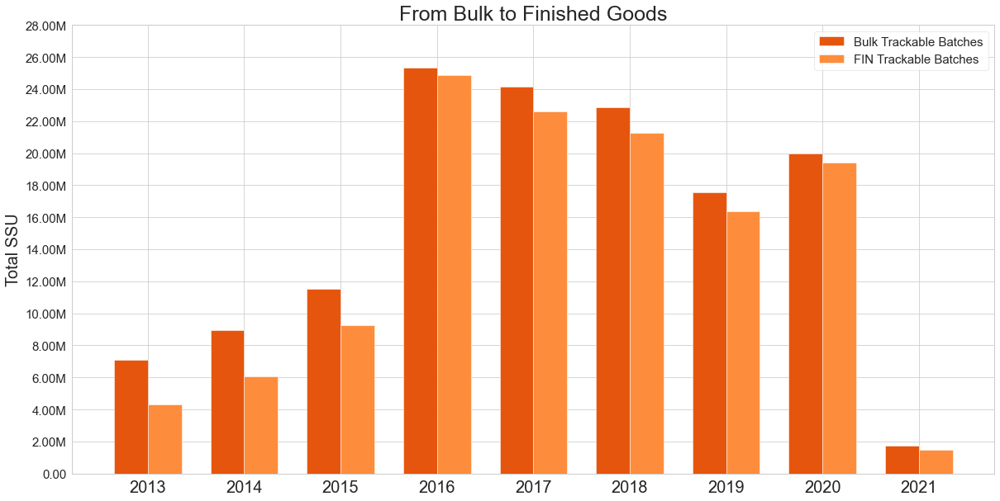

In [770]:
ind = np.arange(2013,2022)
width = 0.35

yrprep = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_bu'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
all_d = tuple((yy.SSU_x+yy.SSU_y).values)
per_d = tuple((yy.SSU_y/(yy.SSU_x+yy.SSU_y)).values)

print((yy.SSU_y+yy.SSU_x).sum())
#print(yy.SSU_y)

yrloc2 = dfr_a03.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)
all_d2 = tuple((yy2.SSU_x+yy2.SSU_y).values)


#print(yy.SSU_y.sum())
#print(yy2.SSU_y.sum())
print((yy2.SSU_y+yy2.SSU_x).sum())


fig, ax = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-0.175, all_d, width, color = cmap(4))
#p2 = plt.bar(ind-0.175, pass_d, width, color = cmap(4), bottom = fail_d)

p3 = plt.bar(ind+0.175, all_d2, width, color = cmap(5))
#p4 = plt.bar(ind+0.175, pass_d2, width, color = cmap(5), bottom = fail_d2)


plt.xticks(ind, tuple(ind), fontsize = 20)
plt.legend(labels = [
#                       'Bulk Derogation'
                     'Bulk Trackable Batches'
#                      ,'FIN Derogation'
                     , 'FIN Trackable Batches'
                    ], fontsize = 15)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods', fontsize = 25)
plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)

#for index, data in enumerate(fail_d2):
#    plt.text(x=index-0, y = data + 70000, s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=12))  

#for index, data in enumerate(per_d):
#    plt.text(x=index-0.4, y = data + 700000, s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=12), color = cmap(4))

ax.yaxis.set_major_formatter(formatter)

plt.show()

In [771]:
def my_value(number):
    return ("{:,}".format(number))
print(my_value(100000000))

for x in yy.SSU_x:
    print(my_value(math.ceil(x)))

100,000,000
6,775,361
8,557,504
11,277,000
23,585,265
22,603,760
18,088,670
16,697,344
18,696,302
1,518,031


11331620.810109233
19455500.68


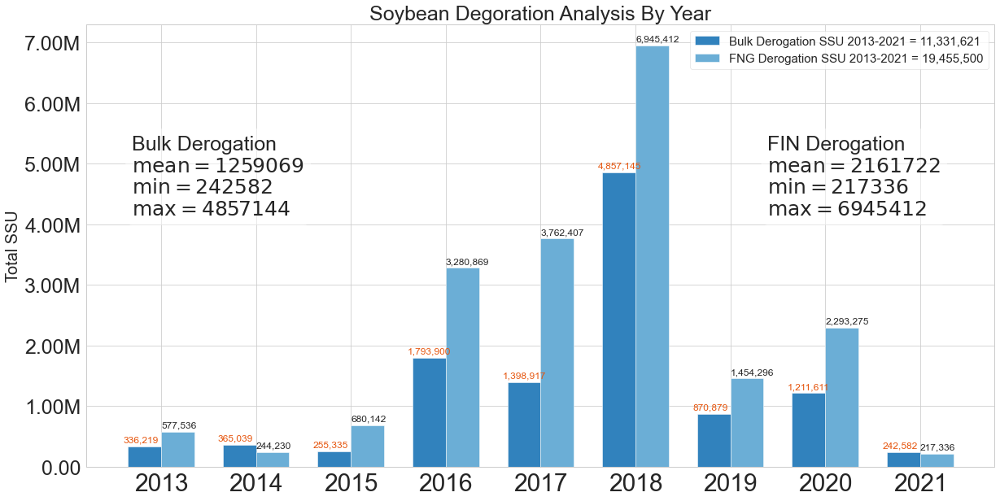

In [772]:
ind = np.arange(2013,2022)
width = 0.5

yrprep = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
#print(yy.SSU_y.sum())

yrloc2 = dfr_a03.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)

ind = np.arange(N)
width = 0.35

fig,ax = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-0.175, fail_d, width, color = cmap(0))
p2 = plt.bar(ind+0.175, fail_d2, width, color = cmap(1))


plt.xticks(ind, tuple(yy.crop_yr.values), fontsize = 30)
plt.yticks(np.arange(0,8000000, 1000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.legend(labels = ['Bulk Derogation SSU 2013-2021 = 11,331,621', 'FNG Derogation SSU 2013-2021 = 19,455,500'], fontsize = 15)
plt.ylabel('Total SSU', fontsize = 20)
plt.title('Soybean Degoration Analysis By Year', fontsize = 25)
# display values on top of bars


print(yy.SSU_y.sum())
print(yy2.SSU_y.sum())



#    print(my_value(math.ceil(x)))
for index, data in enumerate(fail_d2):
    plt.text(x=index-0, y = data + 70000, s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=12))  

for index, data in enumerate(fail_d):
    plt.text(x=index-0.4, y = data + 70000, s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=12), color = cmap(4))
    

    
# place a text box in upper left in axes coords
y = yy.SSU_y
mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()

textstr = '\n'.join((
    'Bulk Derogation',
    r'$\mathrm{mean}=%.0f$' % (mu, ),
    r'$\mathrm{min}=%.0f$' % (minimum, ),
    r'$\mathrm{max}=%.0f$' % (maximum, ),
   ))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.05, 0.75, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)

# place a text box in upper left in axes coords
y = yy2.SSU_y
mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()

textstr = '\n'.join((
    'FIN Derogation',
    r'$\mathrm{mean}=%.0f$' % (mu, ),
    r'$\mathrm{min}=%.0f$' % (minimum, ),
    r'$\mathrm{max}=%.0f$' % (maximum, ),
   ))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.75, 0.75, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)

plt.show()

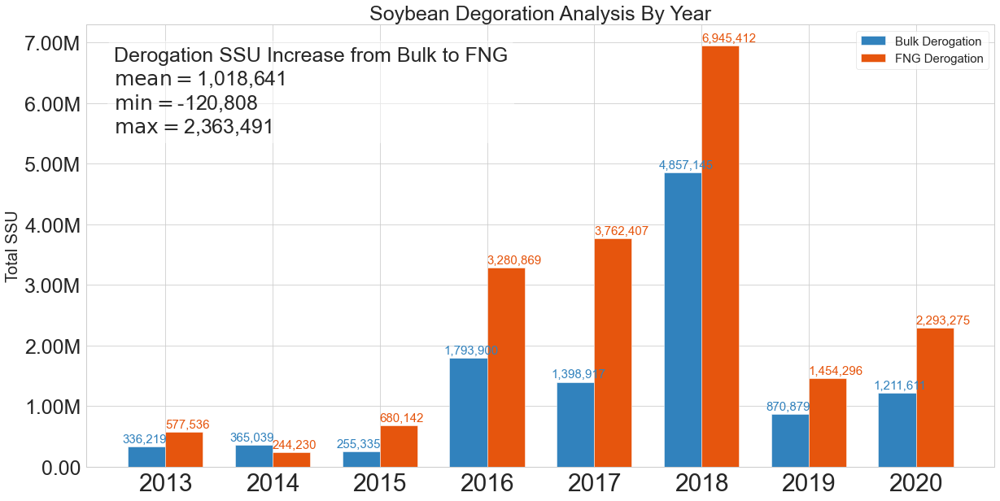

In [773]:
ind = np.arange(2013,2021)
width = 0.5

df = dbr_a03[dbr_a03['crop_yr']<2021]
yrprep = df.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
#print(yy.SSU_y.sum())

df = dfr_a03[dfr_a03['crop_yr']<2021]
yrloc2 = df.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)

ind = np.arange(N)
width = 0.35

fig,ax = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-0.175, fail_d, width, color = cmap(0))
p2 = plt.bar(ind+0.175, fail_d2, width, color = cmap(4))


plt.xticks(ind, tuple(yy.crop_yr.values), fontsize = 30)
plt.yticks(np.arange(0,8000000, 1000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

#plt.legend(labels = ['Bulk Derogation SSU 2013-2021 = 11,331,621', 'FNG Derogation SSU 2013-2021 = 19,455,500'], fontsize = 15)
plt.legend(labels = ['Bulk Derogation', 'FNG Derogation'], fontsize = 15)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('Soybean Degoration Analysis By Year', fontsize = 25)
# display values on top of bars


# print(yy.SSU_y.sum())
# print(yy2.SSU_y.sum())



#    print(my_value(math.ceil(x)))
for index, data in enumerate(fail_d2):
    plt.text(x=index-0, y = data + 70000, s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=15), color = cmap(4))  

for index, data in enumerate(fail_d):
    plt.text(x=index-0.4, y = data + 70000, s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=15), color = cmap(0))
    

    
# place a text box in upper left in axes coords
y = yy2.SSU_y - yy.SSU_y
mu = y.mean()
#print(mu)
mu = f"{math.ceil(mu):,}"
#print(mu)
minimum = f"{math.ceil(y.min()):,}"
maximum = f"{math.ceil(y.max()):,}"
sigma = y.std()

textstr = '\n'.join((
    'Derogation SSU Increase from Bulk to FNG',
    r'$\mathrm{mean}=$'+mu,
    r'$\mathrm{min}=$'+minimum,
    r'$\mathrm{max}=$'+maximum,
    
#    r'$\mathrm{sigma}=%.0f$' % (sigma, ),
   ))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.03, 0.95, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)

# place a text box in upper left in axes coords
# y = yy2.SSU_y
# mu = y.mean()
# minimum = y.min()
# maximum = y.max()
# sigma = y.std()

# textstr = '\n'.join((
#     'FIN Derogation',
#     r'$\mathrm{mean}=%.0f$' % (mu, ),
#     r'$\mathrm{min}=%.0f$' % (minimum, ),
#     r'$\mathrm{max}=%.0f$' % (maximum, ),
#    ))

# # these are matplotlib.patch.Patch properties
# props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# ax.text(0.75, 0.75, textstr, transform=ax.transAxes, fontsize=25,
#         verticalalignment='top', bbox=props)

plt.show()

In [774]:
set2 = set(dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr')['batch_nbr'])
set1 = set(dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')['batch_nbr'])
set0 = set(dbr_a02.drop_duplicates('batch_nbr')['batch_nbr'])

In [775]:
set3 = set0 - set1 - set2

In [776]:
dbr_a04 = pd.DataFrame(set3, columns=["batch_nbr"])
dbr_a05 = dbr_a02.merge(dbr_a04, how = 'inner', on = 'batch_nbr')

0.2917278246143425


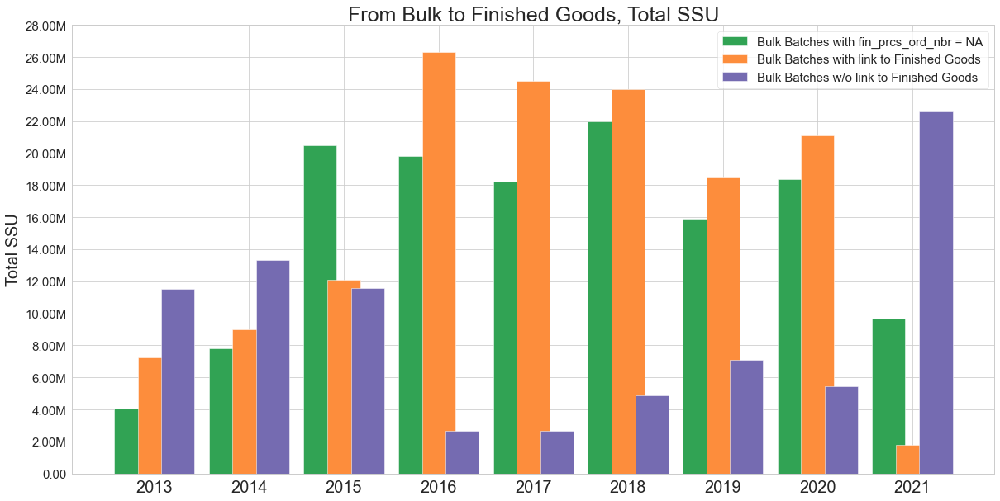

In [777]:
def human_format(num, pos):
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    # add more suffixes if you need them
    return '%.2f%s' % (num, ['', 'K', 'M', 'G', 'T', 'P'][magnitude])

formatter = FuncFormatter(human_format)
plot4['crop_yr'] = plot4['crop_yr'].astype(int)
plot2['crop_yr'] = plot2['crop_yr'].astype(int)
plot5['crop_yr'] = plot5['crop_yr'].astype(int)

plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()

plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()

plot5 = dbr_a05.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()

#print(plot2)
a1 = plot4.loc[(plot4.crop_yr<2016)&(plot4.crop_yr<=2020),'total_projected_units'].sum()

a2 = plot2.loc[(plot2.crop_yr<2016)&(plot5.crop_yr<=2020),'total_projected_units'].sum()

a3 = plot5.loc[(plot5.crop_yr<2016)&(plot5.crop_yr<=2020),'total_projected_units'].sum()

print(a2/(a1+a2+a3))

fig,ax = plt.subplots(figsize = (20,10))

X = np.arange(2013, 2022, 1)
#plt.bar(X + 0.00, plot1.iloc[:,1], color = cmap(1), width = 0.35)
plt.bar(X - 0.25, plot4.iloc[:,1], color = cmap(8), width = 0.35)
plt.bar(X + 0.0, plot2.iloc[:,1], color = cmap(5), width = 0.35)
plt.bar(X + 0.25, plot5.iloc[:,1], color = cmap(12), width = 0.35)

plt.xticks(X, tuple(X), fontsize = 20)
plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)
ax.yaxis.set_major_formatter(formatter)


plt.legend(labels = ['Bulk Batches with fin_prcs_ord_nbr = NA', 'Bulk Batches with link to Finished Goods', 'Bulk Batches w/o link to Finished Goods' ], fontsize = 15)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods, Total SSU', fontsize = 25)

plt.show()

136359527.3222609
144550979.46018133
81764989.08950654


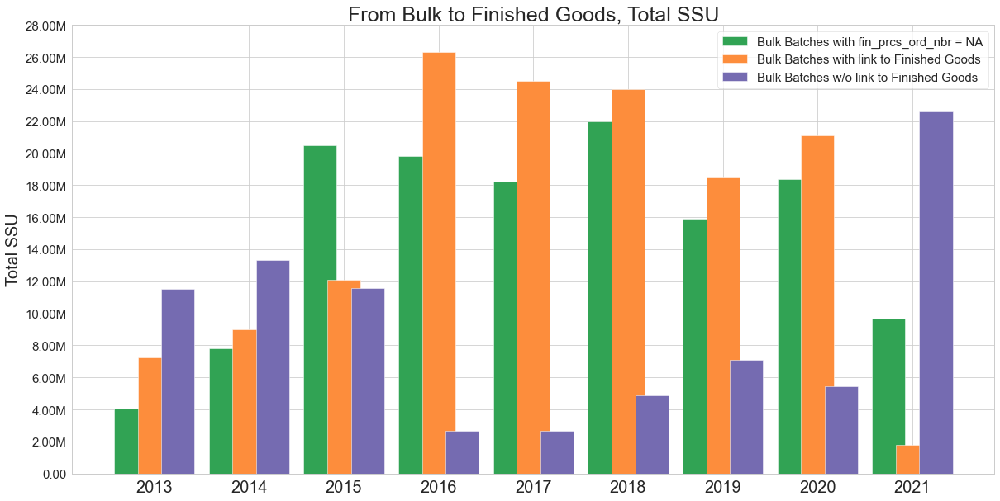

In [778]:
from matplotlib.ticker import FuncFormatter
#import matplotlib.pyplot as plt
# def millions(x, pos):
#     'The two args are the value and tick position'
#     return '%1.1fM' % (x * 1e-6)
def human_format(num, pos):
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    # add more suffixes if you need them
    return '%.2f%s' % (num, ['', 'K', 'M', 'G', 'T', 'P'][magnitude])

formatter = FuncFormatter(human_format)

#fig, ax = plt.subplots()
#ax.yaxis.set_major_formatter(formatter)

plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()

plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()

plot5 = dbr_a05.drop_duplicates(subset = ['batch_nbr'], keep = 'first').groupby('crop_yr')['total_projected_units'].sum().reset_index()

#print(plot2)
print(plot4['total_projected_units'].sum())

print(plot2['total_projected_units'].sum())

print(plot5['total_projected_units'].sum())

fig, ax = plt.subplots(figsize = (20,10))

X = np.arange(2013, 2022, 1)
#plt.bar(X + 0.00, plot1.iloc[:,1], color = cmap(1), width = 0.35)
plt.bar(X - 0.25, plot4.iloc[:,1], color = cmap(8), width = 0.35)
plt.bar(X + 0.0, plot2.iloc[:,1], color = cmap(5), width = 0.35)
plt.bar(X + 0.25, plot5.iloc[:,1], color = cmap(12), width = 0.35)

plt.xticks(X, tuple(X), fontsize = 20)
plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)
ax.yaxis.set_major_formatter(formatter)

plt.legend(labels = ['Bulk Batches with fin_prcs_ord_nbr = NA', 'Bulk Batches with link to Finished Goods', 'Bulk Batches w/o link to Finished Goods' ], fontsize = 15)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods, Total SSU', fontsize = 25)

plt.show()

(22819225.70729767, 30122092.76304958, 44143524.586206414, 48825240.4083617, 45383496.0782785, 50852813.4838044, 41478225.95420564, 44979816.233150974, 34071060.657593876)
(2320019.035582457, 3870876.789343572, 3112796.4765066714, 5226264.361267708, 5689142.244706208, 17594095.155128222, 2116476.0448998967, 2469282.307874494, 8054294.190532634)


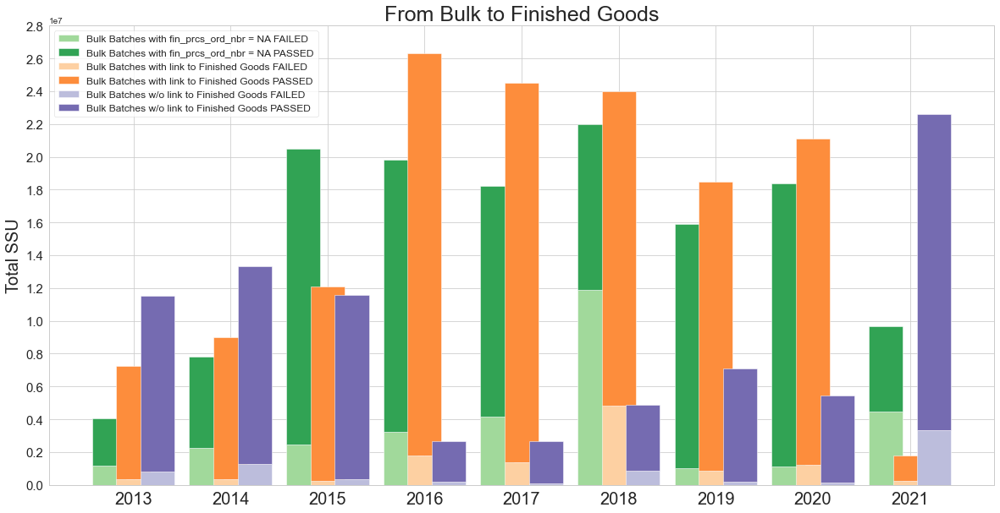

In [779]:
ind = np.arange(2013,2022)
width = 0.35
wd = 0.25

plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first')
plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
plot5 = dbr_a05.drop_duplicates(subset = ['batch_nbr'], keep = 'first')

yrprep = plot4
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.drg == 0]
y1 = yrloc[yrloc.drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
#print(all1)

yrloc2 = plot2.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc2.columns = ['drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.drg == 0]
y21 = yrloc2[yrloc2.drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)

yrloc3 = plot5.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc3.columns = ['drg', 'crop_yr', 'SSU']
y30 = yrloc3[yrloc3.drg == 0]
y31 = yrloc3[yrloc3.drg == 1]
yy3 = y31.merge(y30, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy3.iloc[:,1]))
pass_d3 = tuple(yy3.SSU_x.values)
fail_d3 = tuple(yy3.SSU_y.values)

all_total = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_total = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)).values)

print(all_total)
print(fail_total)
#print(yy3.SSU_y.sum())

fig = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-wd, fail_d, width, color = cmap(10))
p2 = plt.bar(ind-wd, pass_d, width, color = cmap(8), bottom = fail_d)

p3 = plt.bar(ind, fail_d2, width, color = cmap(7))
p4 = plt.bar(ind, pass_d2, width, color = cmap(5), bottom = fail_d2)

p5 = plt.bar(ind+wd, fail_d3, width, color = cmap(14))
p6 = plt.bar(ind+wd, pass_d3, width, color = cmap(12), bottom = fail_d3)

plt.xticks(ind, tuple(ind), fontsize = 20)
plt.legend(labels = ['Bulk Batches with fin_prcs_ord_nbr = NA FAILED', 'Bulk Batches with fin_prcs_ord_nbr = NA PASSED',
                     'Bulk Batches with link to Finished Goods FAILED', 'Bulk Batches with link to Finished Goods PASSED',
                     'Bulk Batches w/o link to Finished Goods FAILED', 'Bulk Batches w/o link to Finished Goods PASSED', ], fontsize = 12)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods', fontsize = 25)


plt.yticks(np.arange(0,30000000, 2000000), fontsize = 15)

plt.show()

['$34.80M', '$58.06M', '$46.69M', '$78.39M', '$85.34M', '$263.91M', '$31.75M', '$37.04M', '$120.81M']
['$29.76M', '$52.59M', '$42.86M', '$51.49M', '$64.35M', '$191.05M', '$18.68M', '$18.87M', '$117.18M']
['1.98M', '3.51M', '2.86M', '3.43M', '4.29M', '12.74M', '1.25M', '1.26M', '7.81M']
['$29.76M', '$52.59M', '$42.86M', '$51.49M', '$64.35M', '$191.05M', '$18.68M', '$18.87M', '$117.18M']


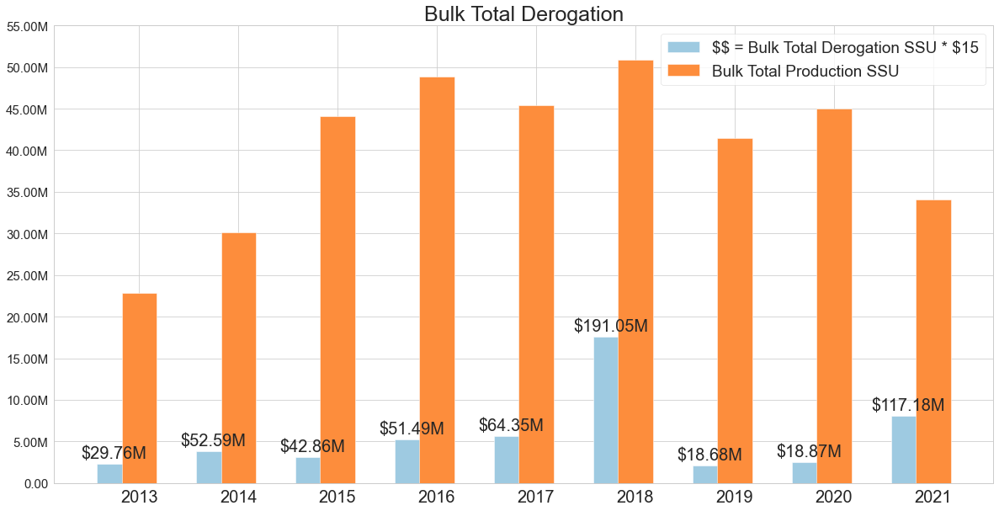

In [780]:
ind = np.arange(2013,2022)
width = 0.35
wd = 0.25

plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first')
plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
plot5 = dbr_a05.drop_duplicates(subset = ['batch_nbr'], keep = 'first')

#Bulk Batches with fin_prcs_ord_nbr = NA
yrprep = plot4
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.drg == 0]
y1 = yrloc[yrloc.drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
#print(all1)

#Bulk Batches with connection to FIN
yrloc2 = plot2.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc2.columns = ['drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.drg == 0]
y21 = yrloc2[yrloc2.drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)
all_d2 = tuple(((yy2.SSU_x+yy2.SSU_y)).values)
fail_pct2 = tuple(((yy2.SSU_y)/(yy2.SSU_x+yy2.SSU_y)).values)
fail_pct2 = ["{:.1%}".format(a) for a in fail_pct2]


#Bulk Batches wi/o connection to FIN
yrloc3 = plot5.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc3.columns = ['drg', 'crop_yr', 'SSU']
y30 = yrloc3[yrloc3.drg == 0]
y31 = yrloc3[yrloc3.drg == 1]
yy3 = y31.merge(y30, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy3.iloc[:,1]))
pass_d3 = tuple(yy3.SSU_x.values)
fail_d3 = tuple(yy3.SSU_y.values)

all_total = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_total = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)).values)
pass_total = tuple(((yy.SSU_x+yy2.SSU_x+yy3.SSU_x)).values)

fail_total_m = tuple(((yy.SSU_y+yy3.SSU_y+yy2.SSU_y)*15).values)
#*15
fail_total_dollar = ["${}".format(human_format(a,1)) for a in fail_total_m]
print(fail_total_dollar)

fail_uc = tuple(((yy.SSU_y+yy3.SSU_y)).values)
all_uc = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y)).values)


fail_pct = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)/(yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_pct = ["{:.1%}".format(a) for a in fail_pct]

fail_pct_uc = tuple(((yy.SSU_y+yy3.SSU_y)/(yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y)).values)
fail_pct_uc = ["{:.1%}".format(a) for a in fail_pct_uc]
fail_uc_dollar = tuple(((yy.SSU_y+yy3.SSU_y)*15).values)
#*15
fail_uc_dollar = ["${}".format(human_format(a,1)) for a in fail_uc_dollar]
print(fail_uc_dollar)

fail_uc_a = [human_format(a,1) for a in fail_uc]
print(fail_uc_a)
fail_uc_m = tuple(((yy.SSU_y+yy3.SSU_y)*15).values)
#*15
fail_uc_dollar = ["${}".format(human_format(a,1)) for a in fail_uc_m]
print(fail_uc_dollar)


fig, ax = plt.subplots(figsize = (20,10))
# p1 = plt.bar(ind-wd, fail_d, width, color = cmap(10))
# p2 = plt.bar(ind-wd, pass_d, width, color = cmap(8), bottom = fail_d)

# p3 = plt.bar(ind-0, fail_d2, width, color = cmap(2))
# p4 = plt.bar(ind+wd, all_d2, width, color = cmap(5))

# p5 = plt.bar(ind+0/2, fail_uc, width, color = cmap(14))
# p6 = plt.bar(ind+wd, all_uc, width, color = cmap(12))

p7 = plt.bar(ind-wd, fail_total, width, color = cmap(2))
p8 = plt.bar(ind, all_total, width, color = cmap(5))

plt.xticks(ind, tuple(ind), fontsize = 20)

plt.legend(labels = [
#    'Bulk w/ connection to FIN Derogation', 'Bulk w/ connection to FIN Total Production',
                     '$$ = Bulk Total Derogation SSU * $15', 'Bulk Total Production SSU',
                   ], fontsize = 19)

# plt.ylabel('Bulk Production w/ connection to FIN', fontsize = 20)
plt.title('Bulk Total Derogation', fontsize = 25)

plt.yticks(np.arange(0,60000000, 5000000), fontsize = 15)
ax.yaxis.set_major_formatter(formatter)

#    print(my_value(math.ceil(x)))
# for index, data in enumerate(all_total):
#     ax.text(x=index-0, y = data+.25 , s=f"{math.ceil(data):,}" , fontdict=dict(fontsize=12))  


#ax.bar_label(p3, labels = fail_pct2, padding = 3, fontsize = 20)

ax.bar_label(p7, labels = fail_uc_dollar, padding = 3, fontsize = 20)
#ax.bar_label(p5, labels = fail_uc_dollar, padding = 3, fontsize = 20)

        
# # place a text box in upper left in axes coords
# y = yy.SSU_y
# mu = y.mean()
# minimum = y.min()
# maximum = y.max()
# sigma = y.std()

# textstr = '\n'.join((
#     'Bulk Derogation',
#     r'$\mathrm{mean}=%.0f$' % (mu, ),
#     r'$\mathrm{min}=%.0f$' % (minimum, ),
#     r'$\mathrm{max}=%.0f$' % (maximum, ),
#    ))

# # these are matplotlib.patch.Patch properties
# props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# ax.text(0.05, 0.75, textstr, transform=ax.transAxes, fontsize=25,
#         verticalalignment='top', bbox=props)

# # place a text box in upper left in axes coords
# y = yy2.SSU_y
# mu = y.mean()
# minimum = y.min()
# maximum = y.max()
# sigma = y.std()

# textstr = '\n'.join((
#     'FIN Derogation',
#     r'$\mathrm{mean}=%.0f$' % (mu, ),
#     r'$\mathrm{min}=%.0f$' % (minimum, ),
#     r'$\mathrm{max}=%.0f$' % (maximum, ),
#    ))

# # these are matplotlib.patch.Patch properties
# props = dict(boxstyle='round', facecolor='white', alpha=0.5)

# ax.text(0.75, 0.75, textstr, transform=ax.transAxes, fontsize=25,
#         verticalalignment='top', bbox=props)

plt.show()

['$29.76M', '$52.59M', '$42.86M', '$51.49M', '$64.35M', '$191.05M', '$18.68M', '$18.87M', '$117.18M']
['1.98M', '3.51M', '2.86M', '3.43M', '4.29M', '12.74M', '1.25M', '1.26M', '7.81M']


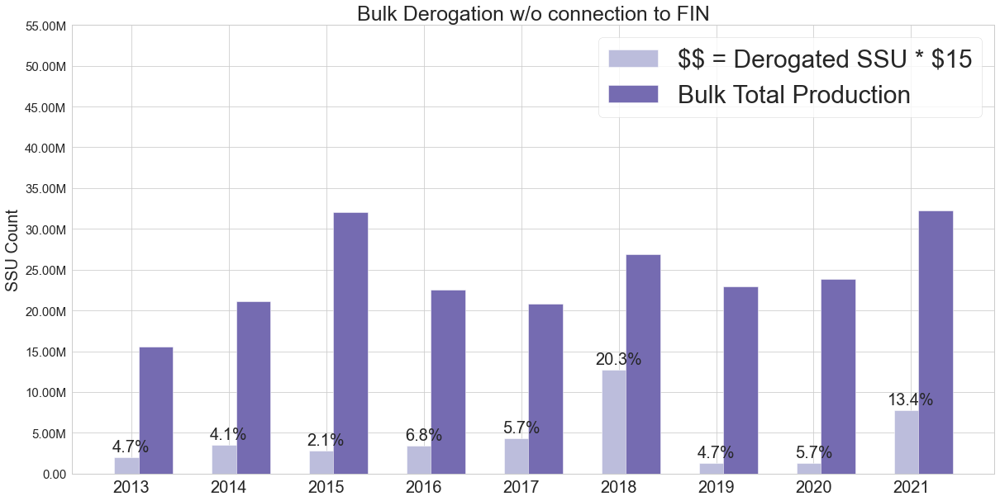

In [781]:
#ind = np.arange(2013,2022)
width = 0.35
wd = 0.25

plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first')
plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
plot5 = dbr_a05.drop_duplicates(subset = ['batch_nbr'], keep = 'first')

#Bulk Batches with fin_prcs_ord_nbr = NA
yrprep = plot4
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.drg == 0]
y1 = yrloc[yrloc.drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
#print(all1)

#Bulk Batches with connection to FIN
yrloc2 = plot2.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc2.columns = ['drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.drg == 0]
y21 = yrloc2[yrloc2.drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)
all_d2 = tuple(((yy2.SSU_x+yy2.SSU_y)).values)
fail_pct2 = tuple(((yy2.SSU_y)/(yy2.SSU_x+yy2.SSU_y)).values)
fail_pct2 = ["{:.1%}".format(a) for a in fail_pct2]


#Bulk Batches wi/o connection to FIN
yrloc3 = plot5.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc3.columns = ['drg', 'crop_yr', 'SSU']
y30 = yrloc3[yrloc3.drg == 0]
y31 = yrloc3[yrloc3.drg == 1]
yy3 = y31.merge(y30, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy3.iloc[:,1]))
pass_d3 = tuple(yy3.SSU_x.values)
fail_d3 = tuple(yy3.SSU_y.values)

all_total = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_total = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)).values)
pass_total = tuple(((yy.SSU_x+yy2.SSU_x+yy3.SSU_x)).values)

fail_uc = tuple(((yy.SSU_y+yy3.SSU_y)).values)
all_uc = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y)).values)


fail_pct = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)/(yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_pct = ["{:.1%}".format(a) for a in fail_pct]

fail_pct_uc = tuple(((yy.SSU_y+yy3.SSU_y)/(yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y)).values)
fail_pct_uc = ["{:.1%}".format(a) for a in fail_pct_uc]
fail_uc_m = tuple(((yy.SSU_y+yy3.SSU_y)*15).values)
#*15
fail_uc_dollar = ["${}".format(human_format(a,1)) for a in fail_uc_m]
print(fail_uc_dollar)

fail_uc_a = [human_format(a,1) for a in fail_uc]
print(fail_uc_a)

fig, ax = plt.subplots(figsize = (20,10))
# p1 = plt.bar(ind-wd, fail_d, width, color = cmap(10))
# p2 = plt.bar(ind-wd, pass_d, width, color = cmap(8), bottom = fail_d)

#p3 = plt.bar(ind-0, fail_d2, width, color = cmap(2))
#p4 = plt.bar(ind+wd, all_d2, width, color = cmap(5))

p5 = plt.bar(ind+0/2, fail_uc, width, color = cmap(14))
p6 = plt.bar(ind+wd, all_uc, width, color = cmap(12))

#p7 = plt.bar(ind-wd, fail_total, width, color = cmap(2))
#p8 = plt.bar(ind, all_total, width, color = cmap(5))

plt.xticks(ind, tuple(ind), fontsize = 20)

plt.legend(labels = [
#    'Bulk w/ connection to FIN Derogation', 'Bulk w/ connection to FIN Total Production',
                     '$$ = Derogated SSU * $15', 'Bulk Total Production',
                   ], fontsize = 30)

plt.ylabel('SSU Count', fontsize = 20)
plt.title('Bulk Derogation w/o connection to FIN', fontsize = 25)

plt.yticks(np.arange(0,60000000, 5000000), fontsize = 15)
ax.yaxis.set_major_formatter(formatter)

#ax.bar_label(p3, labels = fail_pct2, padding = 3, fontsize = 20)

ax.bar_label(p5, labels = fail_pct2, padding = 3, fontsize = 20)

plt.show()

['$29.76M', '$52.59M', '$42.86M', '$51.49M', '$64.35M', '$191.05M', '$18.68M', '$18.87M', '$117.18M']
['1.98M', '3.51M', '2.86M', '3.43M', '4.29M', '12.74M', '1.25M', '1.26M', '7.81M']


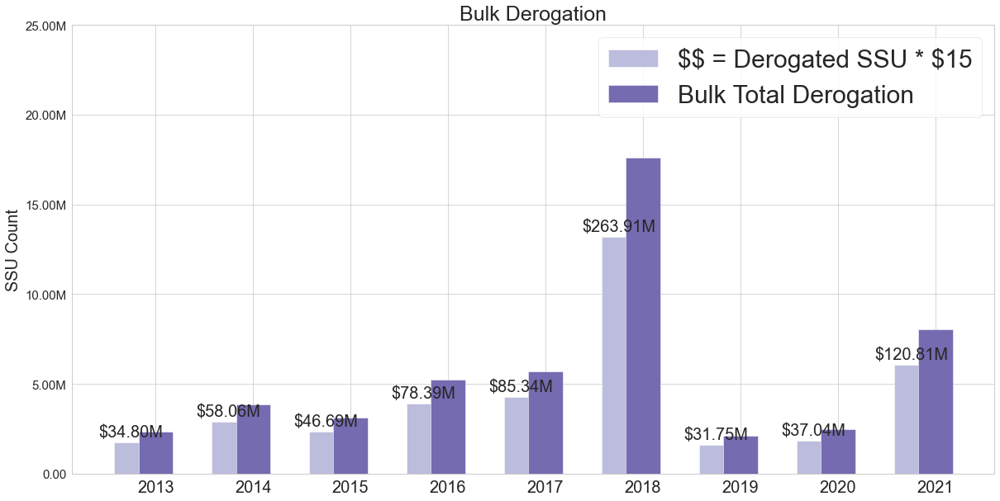

In [782]:
ind = np.arange(2013,2022)
width = 0.35
wd = 0.25

plot4 = dbr_a02[dbr_a02.fin_prcs_ord_nbr.isna()].drop_duplicates('batch_nbr', keep = 'first')
plot2 = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
plot5 = dbr_a05.drop_duplicates(subset = ['batch_nbr'], keep = 'first')

#Bulk Batches with fin_prcs_ord_nbr = NA
yrprep = plot4
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc.columns = ['drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.drg == 0]
y1 = yrloc[yrloc.drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
#print(all1)

#Bulk Batches with connection to FIN
yrloc2 = plot2.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc2.columns = ['drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.drg == 0]
y21 = yrloc2[yrloc2.drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)
all_d2 = tuple(((yy2.SSU_x+yy2.SSU_y)).values)
fail_pct2 = tuple(((yy2.SSU_y)/(yy2.SSU_x+yy2.SSU_y)).values)
fail_pct2 = ["{:.1%}".format(a) for a in fail_pct2]


#Bulk Batches wi/o connection to FIN
yrloc3 = plot5.groupby(['bulk_drg','crop_yr'])['total_projected_units'].sum().reset_index()
yrloc3.columns = ['drg', 'crop_yr', 'SSU']
y30 = yrloc3[yrloc3.drg == 0]
y31 = yrloc3[yrloc3.drg == 1]
yy3 = y31.merge(y30, how = 'outer', on = 'crop_yr').fillna(0).sort_values('crop_yr')
N = len(list(yy3.iloc[:,1]))
pass_d3 = tuple(yy3.SSU_x.values)
fail_d3 = tuple(yy3.SSU_y.values)

all_total = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_total = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)).values)
pass_total = tuple(((yy.SSU_x+yy2.SSU_x+yy3.SSU_x)).values)
fail_total_m = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)*0.75).values)
#*15
fail_total_dis = ["${}".format(human_format(a,1)) for a in fail_total]
fail_total_dollar = ["${}".format(human_format(a*20,1)) for a in fail_total_m]

fail_uc = tuple(((yy.SSU_y+yy3.SSU_y)).values)
all_uc = tuple(((yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y)).values)


fail_pct = tuple(((yy.SSU_y+yy2.SSU_y+yy3.SSU_y)/(yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y+yy2.SSU_x+yy2.SSU_y)).values)
fail_pct = ["{:.1%}".format(a) for a in fail_pct]

fail_pct_uc = tuple(((yy.SSU_y+yy3.SSU_y)/(yy.SSU_x+yy.SSU_y+yy3.SSU_x+yy3.SSU_y)).values)
fail_pct_uc = ["{:.1%}".format(a) for a in fail_pct_uc]
fail_uc_m = tuple(((yy.SSU_y+yy3.SSU_y)*15).values)
#*15
fail_uc_dollar = ["${}".format(human_format(a,1)) for a in fail_uc_m]
print(fail_uc_dollar)

fail_uc_a = [human_format(a,1) for a in fail_uc]
print(fail_uc_a)

fig, ax = plt.subplots(figsize = (20,10))
#ax = fig.add_subplot(111)
#ax = fig.add_subplot(111) # Create matplotlib axes
#ax2 = ax.twinx()
# p1 = plt.bar(ind-wd, fail_d, width, color = cmap(10))
# p2 = plt.bar(ind-wd, pass_d, width, color = cmap(8), bottom = fail_d)

#p3 = plt.bar(ind-0, fail_d2, width, color = cmap(2))
#p4 = plt.bar(ind+wd, all_d2, width, color = cmap(5))


p5 = plt.bar(ind-wd, fail_total_m, width, color = cmap(14))
p6 = plt.bar(ind+0/2, fail_total, width, color = cmap(12))

#p7 = plt.bar(ind-wd, fail_total, width, color = cmap(2))
#p8 = plt.bar(ind, all_total, width, color = cmap(5))

plt.xticks(ind, tuple(ind), fontsize = 20)

plt.legend(labels = [
#    'Bulk w/ connection to FIN Derogation', 'Bulk w/ connection to FIN Total Production',
                     '$$ = Derogated SSU * $15','Bulk Total Derogation'
                   ], fontsize = 30)

plt.ylabel('SSU Count', fontsize = 20)
plt.title('Bulk Derogation', fontsize = 25)

plt.yticks(np.arange(0,30000000, 5000000), fontsize = 15)
ax.yaxis.set_major_formatter(formatter)

#ax.bar_label(p3, labels = fail_pct2, padding = 3, fontsize = 20)

ax.bar_label(p5, labels = fail_total_dollar, padding = 3, fontsize = 20)

plt.show()

In [783]:
yy0 = yy.merge(yy2, how = 'inner', on = ['drg_x', 'drg_y', 'crop_yr']).merge(yy3, how = 'inner', on = ['drg_x', 'drg_y', 'crop_yr'])
yy0['SSU_1'] = yy0['SSU_x']+yy0['SSU_x_x']+yy0['SSU_x_y']
yy0['SSU_0'] = yy0['SSU_y']+yy0['SSU_y_x']+yy0['SSU_y_y']
yy0['SSU_0_m']=yy0['SSU_0']*15
yyy = yy0[['crop_yr', 'SSU_1', 'SSU_0','SSU_0_m']]
yyy

,crop_yr,SSU_1,SSU_0,SSU_0_m
0,2013,2.049921e+07,2.320019e+06,3.480029e+07
1,2014,2.625122e+07,3.870877e+06,5.806315e+07
2,2015,4.103073e+07,3.112796e+06,4.669195e+07
3,2016,4.359898e+07,5.226264e+06,7.839397e+07
4,2017,3.969435e+07,5.689142e+06,8.533713e+07
5,2018,3.325872e+07,1.759410e+07,2.639114e+08
6,2019,3.936175e+07,2.116476e+06,3.174714e+07
7,2020,4.251053e+07,2.469282e+06,3.703923e+07
8,2021,2.601677e+07,8.054294e+06,1.208144e+08


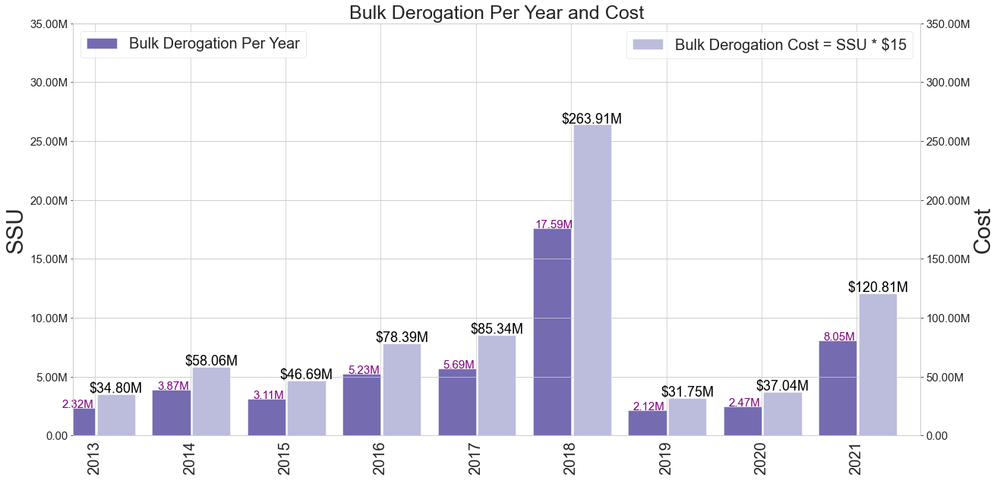

In [784]:
df = yyy
ind = np.arange(2013,2022)
fig = plt.figure(figsize=(20,10)) # Create matplotlib figure

ax = fig.add_subplot(111) # Create matplotlib axes


width = 0.4

#ax
df.SSU_0.plot(kind='bar', color = cmap(12), ax=ax, width=width, position=1.0)
ax.set_ylabel('SSU', fontsize = 30)
plt.yticks(np.arange(0,40000000, 5000000), fontsize = 15)
ax.yaxis.set_major_formatter(formatter)
p1 = plt.legend(loc = 'upper left', labels = ['Bulk Derogation Per Year'
                   ], fontsize = 20)

#ax2
ax2 = ax.twinx() # Create another axes that shares the same x-axis as ax.
df.SSU_0_m.plot(kind='bar', color = cmap(14), ax=ax2, width=width, position=-0.05)
plt.legend(labels = ['Bulk Derogation Cost = SSU * $15'
                   ], fontsize = 20)
ax2.set_ylabel('Cost', fontsize = 30)
plt.yticks(np.arange(0,400000000, 50000000), fontsize = 15)
ax2.yaxis.set_major_formatter(formatter)



#plt.xticks(ind, tuple(ind), fontsize = 20)
ind = ['2013','2014','2015','2016','2017','2018','2019','2020','2021']
ax.set_xticklabels(ind, fontsize = 20)

fail_total_dis = ["{}".format(human_format(a,1)) for a in fail_total]
fail_total_dollar = ["${}".format(human_format(a*20,1)) for a in fail_total_m]

for bar, p in zip(ax2.patches, fail_total_dollar[::1]):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+5000000, p, color = 'black', ha = 'center', va = 'center', fontsize = 18)
for bar, p in zip(ax.patches, fail_total_dis[::1]):
    ax.text(bar.get_x()+bar.get_width()/2+0.02, bar.get_height()+300000, p, color = 'purple', ha = 'center', va = 'center', fontsize = 15)

plt.title('Bulk Derogation Per Year and Cost', fontsize = 25)

plt.show()

# Bin Information Analysis for 1:n dfb_ag04

In [785]:
dbin_all = pd.read_csv('~/Documents/Jupyter_Notebook/Bin_Estimates_Seedbin_05122021.csv')

dbininfo = pd.read_csv('~/Documents/Jupyter_Notebook/Bins_Info_sm_copy.csv', encoding='cp1252')

dbin_all2 = pd.read_excel('~/Documents/Jupyter_Notebook/Batches_Ni_07282022.xlsx')

#dbininfo.head(10)
#dbininfo.dtypes

In [786]:
dbininfo['Site ID#'] = dbininfo['Site ID#'].astype(np.int64)
dbininfo['Bin ID#'] = dbininfo['Bin ID#'].astype(str)

In [787]:
dbin2 = dbin_all2[['Batch ID#', 
                 'Site ID#',
                 'Site ID# - 911 Address',
                 'Bulk PO# - Year',
                 'Plant',
                 'Material description',
                 'Bin Tag #',
#                 'Site GPS Coordinates',
                 'Total Bin Weight', 
                 'Act Sd/lb',
                 '% Usable Seed',
                 'Total Units (SSU)',
                ]]
dbin2 = dbin2[dbin2['Site ID#'].notna()]
dbin2['Site ID#'] = dbin2['Site ID#'].astype(np.int64)
dbin2['Bin Tag #'] = dbin2['Bin Tag #'].astype(np.int64)
dbin2['Bin Tag #'] = dbin2['Bin Tag #'].astype(str)

dbin2.shape

(40104, 11)

In [788]:
dbin = dbin_all[['Batch Nbr', 
                 'Site ID#',
                 'Grower',
                 'Plnt',
                 'Material',
                 'Bin Tag Nbr',
                 'Site GPS Coordinates',
                 'Bin Weight', 
                 'Act Sd/lb',
                 '% Usable Seed',
                 'Total Units (SSU)',
                ]]
dbin = dbin[dbin['Site ID#'].notna()]
dbin['Site ID#'] = dbin['Site ID#'].astype(np.int64)
dbin['Bin Tag Nbr'] = dbin['Bin Tag Nbr'].astype(str)
dbin.shape

(6900, 11)

In [789]:
dbininfo.shape
#dbininfo.groupby(['Site ID#','Bin ID#']).count().reset_index().sort_values('Bin ID#')

(23176, 20)

In [790]:
dbin_info = dbin.merge(dbininfo, 
                  how = 'inner', 
                  left_on = ['Site ID#', 'Bin Tag Nbr', 'Grower', 'Plnt'], 
                  right_on = ['Site ID#', 'Bin ID#', 'Vendor', 'Facility SAP'])

In [791]:
dbin_info2 = dbin2.merge(dbininfo, 
                  how = 'inner', 
                  left_on = ['Site ID#','Bin Tag #'], 
                  right_on = ['Site ID#','Bin ID#'])
dbin_info2.shape

(38268, 30)

In [792]:
dfb_ag07 = dfb_ag04.merge(dbin_info2, how = 'inner', left_on = 'bulk_batch_nbr', right_on = 'Batch ID#')
#dfb_ag07['SSU'] = dfb_ag07['Total Units (SSU)'].str.replace(",","").astype('float64')
print(dfb_ag07.shape)
dfb_ag07 = dfb_ag07[dfb_ag07['Longitude'].notna()]
dfb_ag07.shape

(4011, 59)


(3153, 59)

In [793]:
dfb_ag08 = dfb_ag07[['crop_yr',  'p08_plnt_cd', 'pbc_plnt_cd','fin_prcs_ord_nbr',
          'bulk_batch_nbr', 'fin_batch_nbr', 'bulk_wg_current',  'fin_wg_current', 'bulk_wg_current_dt','fin_wg_current_dt','bulk_moisture', 'fin_moisture',
          'mg', 'bulk_drg', 'fin_drg', 
          'fin_total_projected_units', 'total_projected_units', 
          'Bin Tag #', 'Bin ID#', 'Total Bin Weight', '% Usable Seed', 'Type', 
          'Diameter', 'Height', 'Capacity', 'Door Slide', 'Bin estimates', 'Facility SAP', 'Longitude', 'Latitude', 'Vendor - Unique Key', 'Vendor', 'Year Contracted']] 

In [794]:
dfb_ag08[['Capacity', 'Total Bin Weight']].shape

#dfb_ag09.shape

(3153, 2)

In [795]:
dfb_ag09 = dfb_ag07[['crop_yr',
          'bulk_batch_nbr', 'fin_batch_nbr', 'bulk_wg_current',  'fin_wg_current', 'bulk_wg_current_dt','fin_wg_current_dt',
          'fin_total_projected_units', 'total_projected_units', 'Facility SAP', 'Longitude', 'Latitude']] 
dfb_ag09.loc[:,'diff_wg'] = dfb_ag09['bulk_wg_current'] - dfb_ag09['fin_wg_current']
#dfb_ag09
temp = dfb_ag09.groupby('bulk_batch_nbr')[['fin_wg_current']].mean().reset_index()
temp.columns = ['bulk_batch_nbr','fin_wg_avg']
dfb_ag10 = temp.merge(dfb_ag09, how = 'inner', on = 'bulk_batch_nbr')


In [796]:
dfb_ag09.loc[dfb_ag09.fin_total_projected_units==0, 'fin_total_projected_units'] = 0.01
dfb_ag09[dfb_ag09.fin_total_projected_units>1].sort_values('fin_total_projected_units')
temp1 = dfb_ag09.groupby('bulk_batch_nbr').apply(lambda x: np.average(x.fin_wg_current, weights=x.fin_total_projected_units)).reset_index()
#temp.rename(columns={'0':'wt_avg'})
temp1.columns = ['bulk_batch_nbr', 'fin_wg_wt_avg']
temp.merge(temp1, how = 'inner', on = 'bulk_batch_nbr')

,bulk_batch_nbr,fin_wg_avg,fin_wg_wt_avg
0,AS0SA71,97.100000,97.450702
1,AS0SAK1,97.750000,98.019411
2,AS0SAR1,96.625000,96.680632
3,AS0SAZ1,98.000000,98.174222
4,AS0SB51,97.821429,97.857972
...,...,...,...
864,WN0SFA1,94.375000,94.307144
865,WN0SGD1,93.431818,94.451720
866,WN1SAB1,95.950000,95.723705
867,WN1SAD1,94.937500,95.269230


In [797]:
dfb_ag11 = dfb_ag09[['crop_yr','Facility SAP', 'bulk_batch_nbr', 'bulk_wg_current', 'Facility SAP', 'Longitude', 'Latitude']].drop_duplicates().merge(temp.merge(temp1, how = 'inner', on = 'bulk_batch_nbr'), on = 'bulk_batch_nbr')
#dfb_ag11.columns = ['bulk_batch_nbr','bulk_wg_current', 'fin_wg_avg', 'fin_wg_wt_avg']
#dfb_ag11

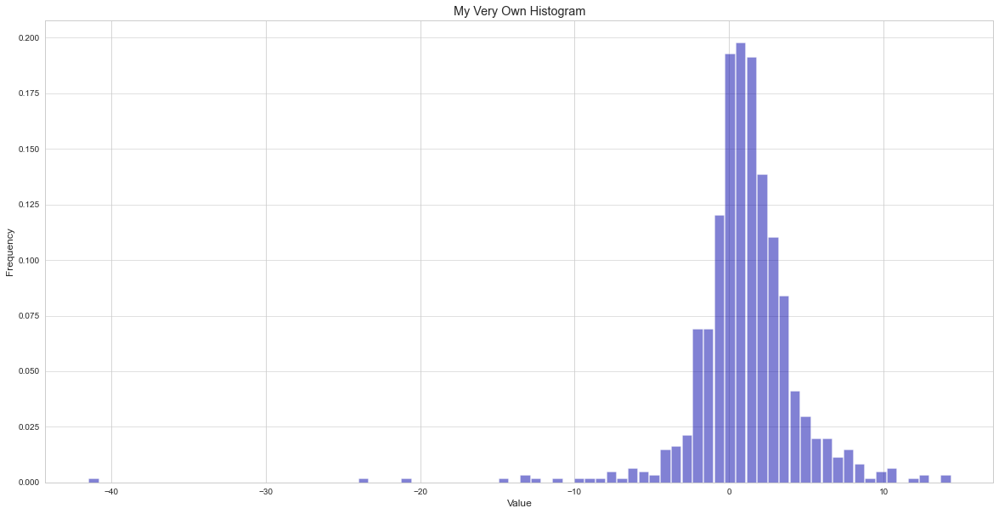

In [798]:
dfb_ag11['diff_wg'] = dfb_ag11.bulk_wg_current - dfb_ag11['fin_wg_wt_avg'] 
# x axis values
x = dfb_ag11.bulk_batch_nbr
# corresponding y axis values
#y = dfb_ag055.drgdiff
y = dfb_ag11.diff_wg
  
# plotting the points 
plt.figure(figsize=(20,10))

n, bins, patches = plt.hist(y, bins=80, color='#0504aa', density = True
                            ,alpha=0.5, rwidth=0.9, stacked = False)

#y.hist()    
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('My Very Own Histogram')
#plt.text(23, 45, r'$\mu=15, b=3$')
maxfreq = n.max()
# Set a clean upper y-axis limit.
#plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)
plt.show() 

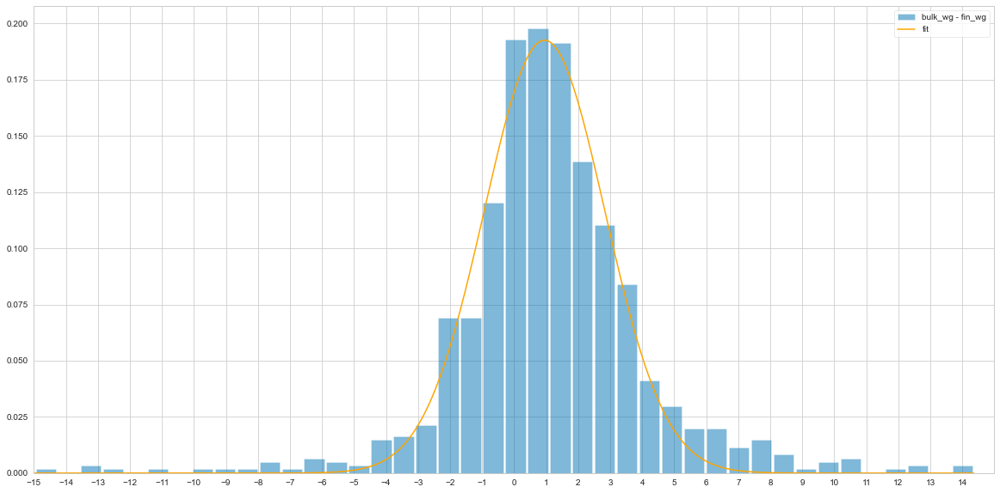

In [799]:
from scipy.optimize import curve_fit

def gaussian(x, mean, amplitude, standard_deviation):
    return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))
    
plt.figure(figsize=(20,10))
bin_heights, bin_borders, _ = plt.hist(y, bins=80, density = True, alpha=0.5, rwidth=0.9, stacked = False, label = 'bulk_wg - fin_wg')

bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[1., 0., 1.])

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), label='fit', color = 'orange')

plt.xlim(xmin = -15, xmax = 15)
plt.xticks(np.arange(-15,15,1))
#ax.xaxis.set_major_locator(plt.MultipleLocator(10))
plt.legend()

count    75.000000
mean      0.921680
std       2.806256
min     -11.000000
25%      -0.205848
50%       0.940979
75%       2.536784
max       8.196027
Name: diff_wg, dtype: float64


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/365131520.py:32: UserWarning:

FixedFormatter should only be used together with FixedLocator



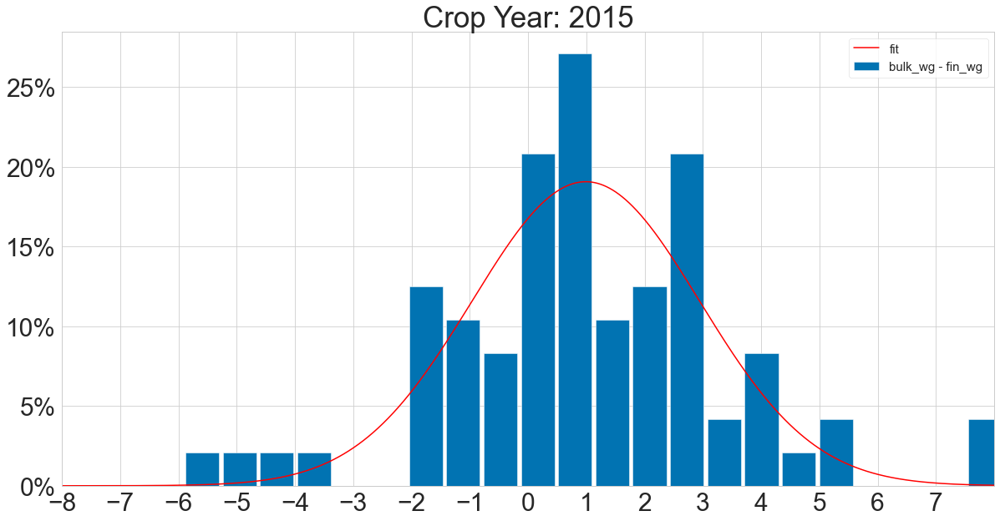

In [800]:
#Input dataset
tg = dfb_ag11
yr = 2015
bins = 30

tg_yr = tg.loc[tg['crop_yr'] == yr,]
#tg_yr = tg
#Graph y and y1
#y = tg_yr.bulk_wg_current
y1 = tg_yr.fin_wg_wt_avg
    
y = tg_yr.diff_wg
print(y.describe())

d = 8
    
plt.figure(figsize=(20,10))
bin_heights, bin_borders = np.histogram(y, bins=bins, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='bulk_wg - fin_wg')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fit', c='red')
plt.xlim(xmin = -d, xmax = d)
plt.xticks(np.arange(-d,d,1), fontsize = 30)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 30)
plt.title('Crop Year: '+str(yr), fontsize = 35)

plt.legend(fontsize = 15)

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/466474906.py:49: UserWarning:

FixedFormatter should only be used together with FixedLocator



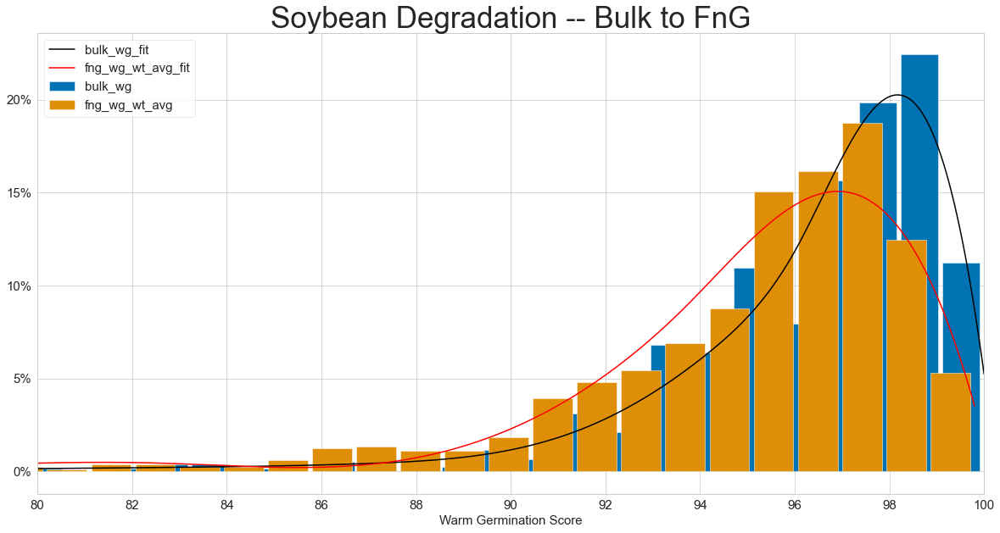

In [801]:

# x axis values
x = dfb_ag11.bulk_batch_nbr
# corresponding y axis values
#y = dfb_ag055.drgdiff
y = dfb_ag11.bulk_wg_current
y1 = dfb_ag11.fin_wg_wt_avg

# print(y.describe())
# print(y1.describe())

plt.figure(figsize=(20,10))

bin_heights, bin_borders = np.histogram(y, bins=80, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
#fit_t = fitting.SplineExactKnotsFitter()
#fit_t = fitting.SplineInterpolateFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.004)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='bulk_wg')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='bulk_wg_fit', c='black')

#plot y1
bin_heights, bin_borders = np.histogram(y1, bins=50, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
#fit_t = fitting.SplineExactKnotsFitter()
#fit_t = fitting.SplineInterpolateFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.004)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='fng_wg_wt_avg')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fng_wg_wt_avg_fit', c='red')

#xticks and yticks

plt.xlim(xmin = 80, xmax = 100)
plt.xticks(np.arange(80,101,2), fontsize = 15)
plt.xlabel('Warm Germination Score', fontsize = 15)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 15)
plt.title('Soybean Degradation -- Bulk to FnG', fontsize = 35)

plt.legend(fontsize = 15)

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1760214852.py:48: UserWarning:

FixedFormatter should only be used together with FixedLocator



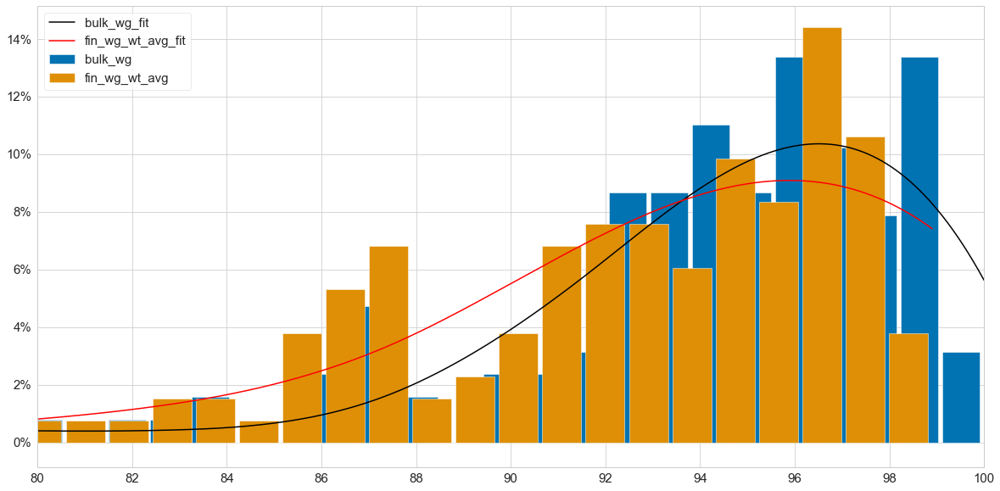

In [802]:
#Input dataset
tg = dfb_ag11
yr = 2018

tg_yr = tg.loc[tg['crop_yr'] == yr,]

#Graph y and y1
y = tg_yr.bulk_wg_current
y1 = tg_yr.fin_wg_wt_avg

plt.figure(figsize=(20,10))

bin_heights, bin_borders = np.histogram(y, bins=80, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
#fit_t = fitting.SplineExactKnotsFitter()
#fit_t = fitting.SplineInterpolateFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.01)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='bulk_wg')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='bulk_wg_fit', c='black')

#plot y1
bin_heights, bin_borders = np.histogram(y1, bins=50, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
#fit_t = fitting.SplineExactKnotsFitter()
#fit_t = fitting.SplineInterpolateFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.01)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='fin_wg_wt_avg')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fin_wg_wt_avg_fit', c='red')

#xticks and yticks

plt.xlim(xmin = 80, xmax = 100)
plt.xticks(np.arange(80,101,2), fontsize = 15)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 15)

plt.legend(fontsize = 15)

In [803]:
dfb_ag11.groupby('bulk_batch_nbr').count().sort_values('crop_yr')

,crop_yr,Facility SAP,bulk_wg_current,Facility SAP,Longitude,Latitude,fin_wg_avg,fin_wg_wt_avg,diff_wg
bulk_batch_nbr,,,,,,,,,
AS0SA71,1,1,1,1,1,1,1,1,1
RP63441,1,1,1,1,1,1,1,1,1
RP63BC1,1,1,1,1,1,1,1,1,1
RP63CH1,1,1,1,1,1,1,1,1,1
RP63EH1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...
MC7SFF1,1,1,1,1,1,1,1,1,1
MC7SFV1,1,1,1,1,1,1,1,1,1
MC8SAW1,1,1,1,1,1,1,1,1,1


In [804]:
df = dfb_ag11
dfb_ag12 = df.loc[:,~df.columns.duplicated()].copy()
dfb_ag12.head()

,crop_yr,Facility SAP,bulk_batch_nbr,bulk_wg_current,Longitude,Latitude,fin_wg_avg,fin_wg_wt_avg,diff_wg
0,2020,8H16,CE0SB33,98.0,-90.050767,38.206961,95.000000,95.000000,3.000000
1,2017,8H45,MF73BC3,92.0,-89.558800,36.707200,92.375000,92.737749,-0.737749
2,2020,8H16,CE0SD81,99.0,-88.984400,38.953100,96.750000,96.750000,2.250000
3,2020,8H16,CE0SAD1,99.0,-87.521300,39.730400,97.062500,96.774611,2.225389
4,2019,8H44,MP9FA11,97.5,-89.630490,40.268450,93.833333,93.424374,4.075626


In [805]:
dfb_ag12['Facility SAP'].drop_duplicates().reset_index()

,index,Facility SAP
0,0,8H16
1,1,8H45
2,4,8H44
3,5,8H17
4,15,8H36
5,19,8H31
6,20,8H50
7,25,1779
8,28,8H40
9,37,8H30


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2184588439.py:47: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



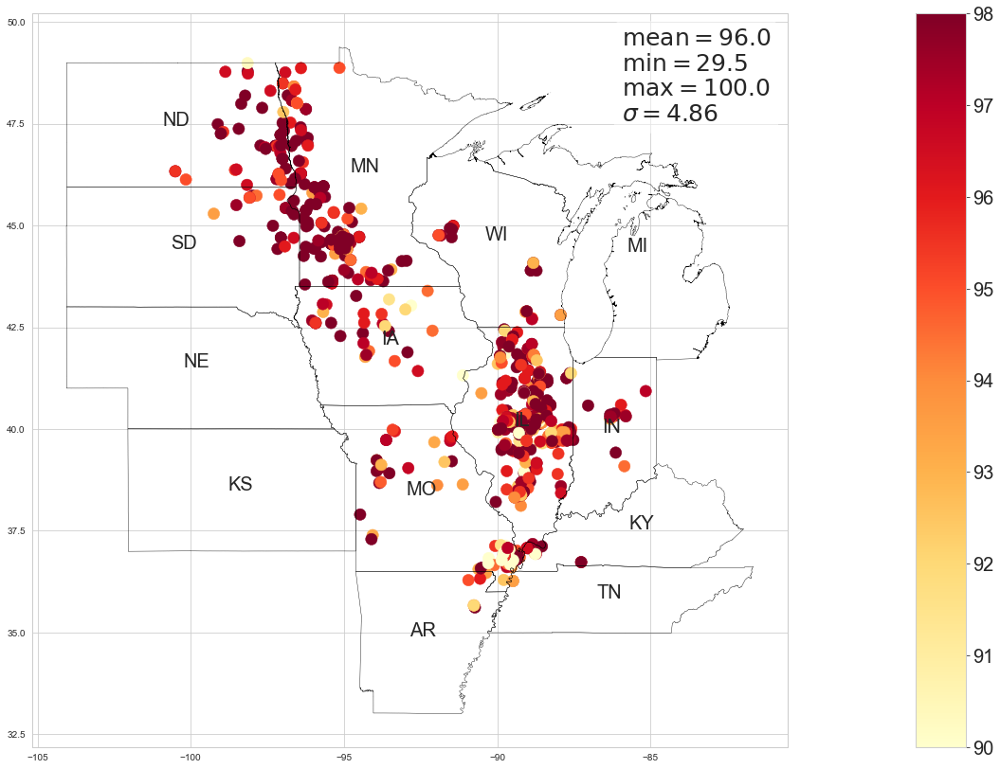

In [806]:
states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
#type(states)
mainland = states[(states['STFIPS'].astype('int64')<60) & (states['STFIPS'].astype('int64')!=2) & (states['STFIPS'].astype('int64')!=15)]

center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN'])]

yr = 2020
df = dfb_ag12[dfb_ag12['crop_yr']==yr]

df = dfb_ag12

p1 = 'fin_wg_wt_avg'
p2 = 'bulk_wg_current'
p3 = 'diff_wg'

fig, ax = plt.subplots(figsize=(20,20))
center.apply(lambda x: ax.annotate(
    text=x.STPOSTAL, 
    xy=x.geometry.centroid.coords[0],
    ha='center', 
    fontsize=20
),axis=1);
center.boundary.plot(ax=ax, color='Black', linewidth=.4)

#Plot FAP names
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
fap_to_plot = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
#print(fap_du.loc[fap_du.duplicated('Latitude'),'FAP'])

#for _, r in fap_to_plot.iterrows():
#     ax.annotate(r['FAP'], (r['Longitude'], r['Latitude']), ha = 'center', va='top', color = 'black', fontsize = 20)
    
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p2], vmin =90, vmax = 98, cmap = "YlOrRd")
M = 15
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")
#plt.title('Crop Year: '+str(yr), fontsize = 35, loc = 'center')


# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#plt.yticks(fontsize = 30)
   
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
# place a text box in upper left in axes coords
y = df[p2]
mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()

textstr = '\n'.join((
    r'$\mathrm{mean}=%.1f$' % (mu, ),
    r'$\mathrm{min}=%.1f$' % (minimum, ),
    r'$\mathrm{max}=%.1f$' % (maximum, ),
    r'$\sigma=%.2f$' % (sigma, )))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.78, 0.98, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)


plt.show()

In [807]:
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
type(fap)
fap.head(21)
#fap.shape
fap.drop_duplicates('Latitude').head(16).sort_values('Longitude')
#fap.head(21)

,loc1,FAP,loc2,location,Latitude,Longitude,city
0,1089,8H40,1089,BP West Fargo ND,46.880831,-96.901126,West Fargo
9,1761,8H33,1761,BP Redwood Falls MN,44.484935,-95.118037,Redwood Falls
1,1252,8H17,1252,BP Clarion IA,42.732188,-93.739911,Clarion
7,1758,8H30,1758,BP Marshall MO,39.135205,-93.205245,Marshall
6,1745,8H12,1745,BP Beaman IA,42.222851,-92.824670,Beaman
15,1792,8H48,1792,Iowa Foundation - Parkersburg,42.568448,-92.775139,Parkersburg
19,5645,8H72,5645,CM Knobel AR - Carter Cox,36.322560,-90.564863,Knobel
8,1759,8H31,1759,BP Mason City IL,40.198937,-89.676304,Mason City
2,1254,8H32,1254,BP Matthews MO,36.754177,-89.536251,Matthews
17,5359,8H73,5359,CM Halls TN - Hurt Seed,35.894121,-89.405404,Halls


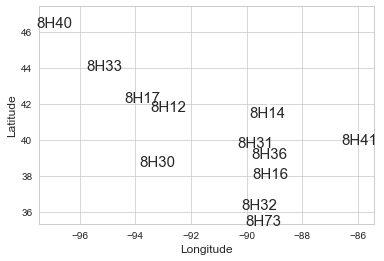

In [808]:
df = fap.merge(dfb_ag12['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude')
ax = df.plot.scatter(x='Longitude', y='Latitude', color='white')

for _, r in df.iterrows():
    ax.annotate(r['FAP'], (r['Longitude'], r['Latitude']), ha = 'center', va='top', fontsize = 15)

In [809]:
dfb_ag13 = dfb_ag12.groupby(['Facility SAP'])[['bulk_wg_current', 'fin_wg_wt_avg', 'diff_wg', 'Latitude', 'Longitude']].mean().reset_index()
dfb_ag13 = dfb_ag13[dfb_ag13['Facility SAP'].str.startswith('8H')]
list(dfb_ag13)
dfb_ag13


,Facility SAP,bulk_wg_current,fin_wg_wt_avg,diff_wg,Latitude,Longitude
4,8H12,94.000000,92.215497,1.784503,41.759686,-92.190259
5,8H14,96.690000,95.202494,1.487506,42.200371,-89.326828
6,8H16,96.660377,94.940108,1.720270,38.618993,-89.085769
7,8H17,94.833333,95.092677,-0.259344,42.835735,-94.365643
8,8H30,96.187500,94.247200,1.940300,39.062933,-93.043133
9,8H31,96.125000,95.071354,1.053646,40.491824,-89.035523
10,8H32,93.590909,92.825286,0.765623,36.747912,-89.659327
11,8H33,97.962644,96.815445,1.147199,45.073069,-95.855507
12,8H36,95.775281,94.916339,0.858942,39.788299,-88.589261
13,8H40,97.210366,95.393206,1.817159,47.213568,-97.297476


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2053067015.py:34: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



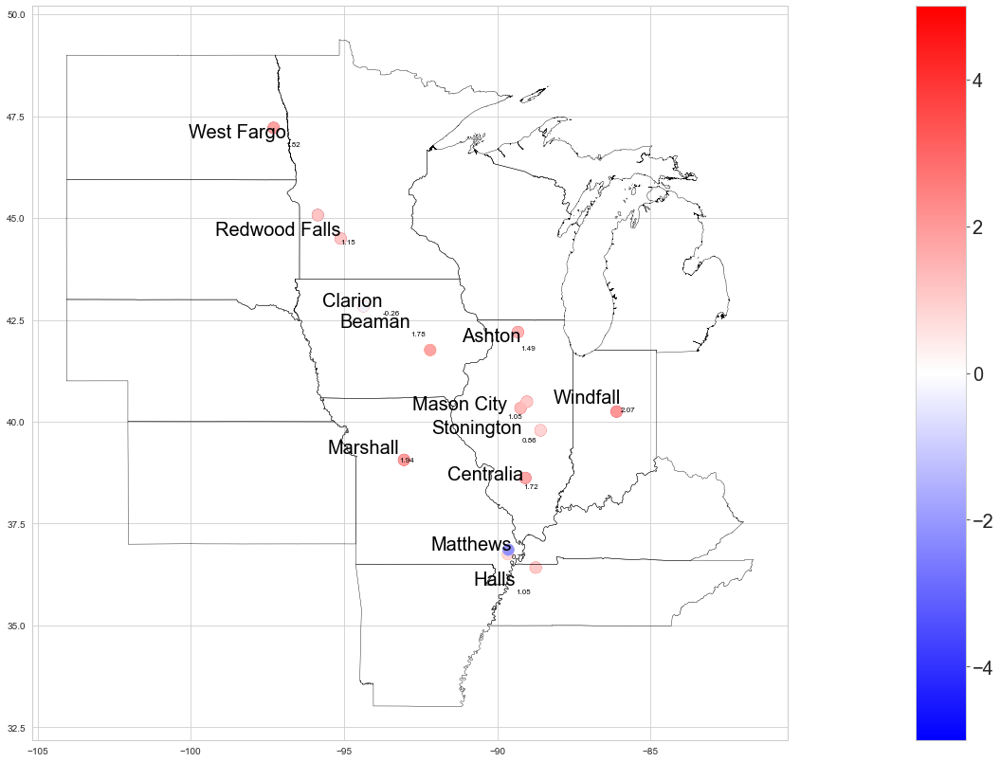

             city   diff_wg
0      West Fargo  1.817159
1         Clarion -0.259344
2        Matthews  0.765623
3      Stonington  0.858942
4       Centralia  1.720270
5          Ashton  1.487506
6          Beaman  1.784503
7        Marshall  1.940300
8      Mason City  1.053646
9   Redwood Falls  1.147199
10       Windfall  2.068440
14          Halls  1.053067


In [810]:
df = dfb_ag13
p1 = 'fin_wg_wt_avg'
p2 = 'bulk_wg_current'
p3 = 'diff_wg'

fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=10
# ),axis=1);
center.boundary.plot(ax=ax, color='Black', linewidth=.4)

#Plot FAP names
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')


for _, r in fap_to_plot.iterrows():
    ax.annotate(r['city'], (r['Longitude'], r['Latitude']), ha = 'right', va='bottom', color = 'black', fontsize = 20)
    ax.annotate(round(r['diff_wg'],2), (r['Longitude'], r['Latitude']), ha = 'left', va='top', color = 'black', fontsize = 8)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p2], vmin =90, vmax = 98, cmap = "YlOrRd")
M = 5
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[['city', 'diff_wg']])

11    8H44
12    8H45
13    8H50
Name: FAP, dtype: object


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1474789518.py:40: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



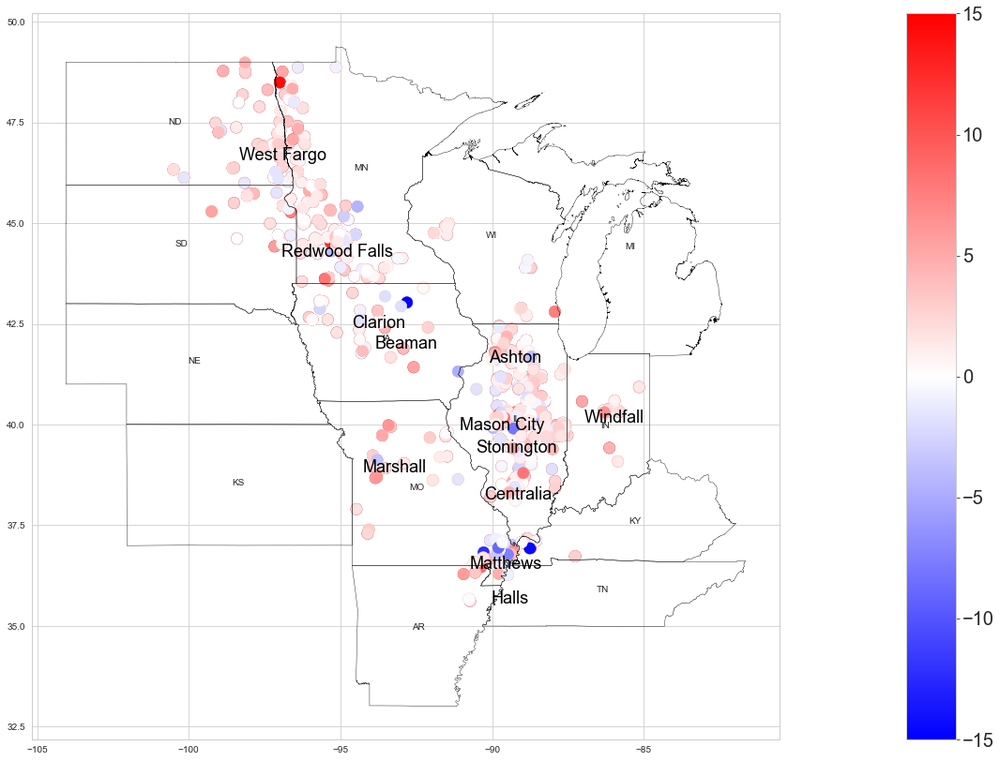

In [811]:
states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
#type(states)
mainland = states[(states['STFIPS'].astype('int64')<60) & (states['STFIPS'].astype('int64')!=2) & (states['STFIPS'].astype('int64')!=15)]

center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN'])]

df = dfb_ag12
p1 = 'fin_wg_wt_avg'
p2 = 'bulk_wg_current'
p3 = 'diff_wg'
fig, ax = plt.subplots(figsize=(20,20))

center.apply(lambda x: ax.annotate(
    text=x.STPOSTAL, 
    xy=x.geometry.centroid.coords[0],
    ha='center', 
    fontsize=10
),axis=1);
center.boundary.plot(ax=ax, color='Black', linewidth=.4)

#Plot FAP names
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
fap_to_plot = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
print(fap_du.loc[fap_du.duplicated('Latitude'),'FAP'])

for _, r in fap_to_plot.iterrows():
     ax.annotate(r['city'], (r['Longitude'], r['Latitude']), ha = 'center', va='top', color = 'black', fontsize = 18)
    
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p2], vmin =90, vmax = 98, cmap = "YlOrRd")
M = 15
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

In [812]:
df = dfb_ag12.loc[1:5,['Longitude','Latitude','diff_wg']]
dfb_ag12.shape

(869, 9)

# Interpolate datapoints

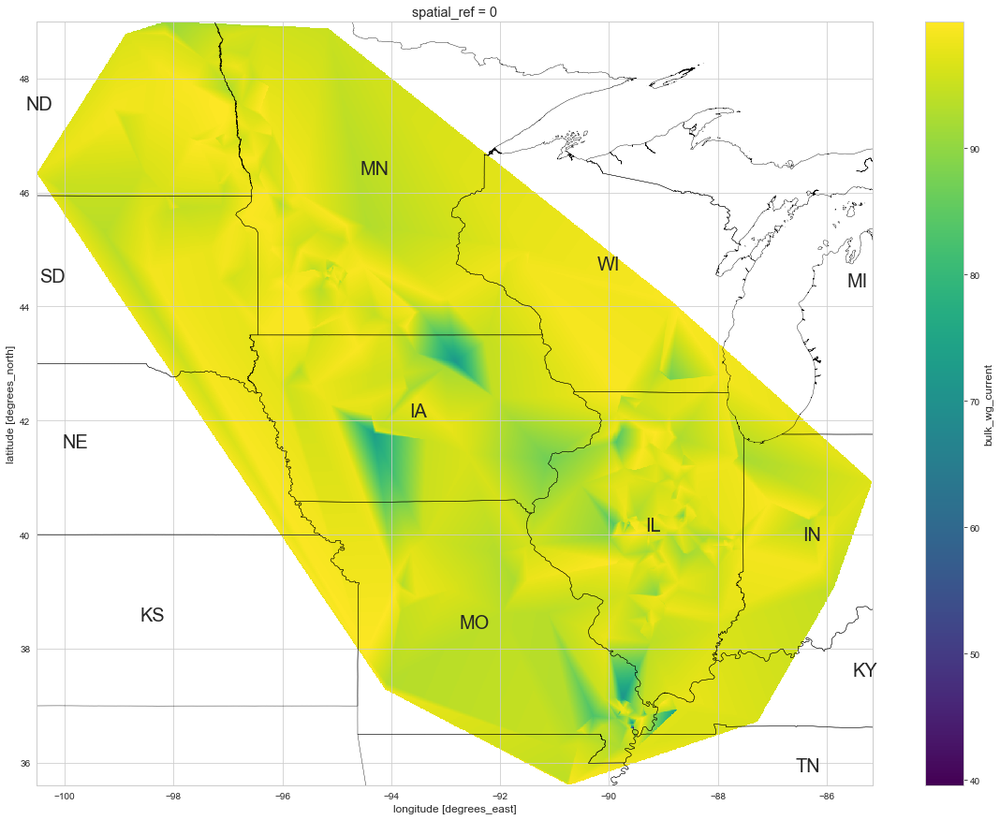

In [813]:

p1 = 'fin_wg_wt_avg'
p2 = 'bulk_wg_current'
p3 = 'diff_wg'

p = p2
df = dfb_ag12
#.loc[1:1000,['Longitude','Latitude',p1, p2, p3]]

#Step1: Convert to geodataframe

gdf = gpd.GeoDataFrame(
    df, geometry = gpd.points_from_xy(df['Longitude'], df['Latitude']), crs = 'EPSG:4326',
)

#Step2: Convert to raster

from functools import partial
from geocube.api.core import make_geocube
from geocube.rasterize import rasterize_points_griddata
from geocube.rasterize import rasterize_points_radial


geo_grid_cubic = make_geocube(
    gdf,
    measurements = [p],
    resolution = (-0.01, 0.01),
    rasterize_function = partial(rasterize_points_griddata, 
                                 method = 'linear', filter_nan = True),
#    interpolate_na_method = 'nearest'
)

fig, ax = plt.subplots(figsize=(20,15))

#Plot FAP names
states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
mainland = states[(states['STFIPS'].astype('int64')<60) & (states['STFIPS'].astype('int64')!=2) & (states['STFIPS'].astype('int64')!=15)]
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN'])]
center.apply(lambda x: ax.annotate(
    text=x.STPOSTAL, 
    xy=x.geometry.centroid.coords[0],
    ha='center', 
    fontsize=20
),axis=1);
center.boundary.plot(ax=ax, color='Black', linewidth=.4)
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
fap_to_plot = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')

# for _, r in fap_to_plot.iterrows():
#      ax.annotate(r['city'], (r['Longitude'], r['Latitude']), ha = 'center', va='top', color = 'black', fontsize = 18)

geo_grid_cubic[p].plot.imshow()


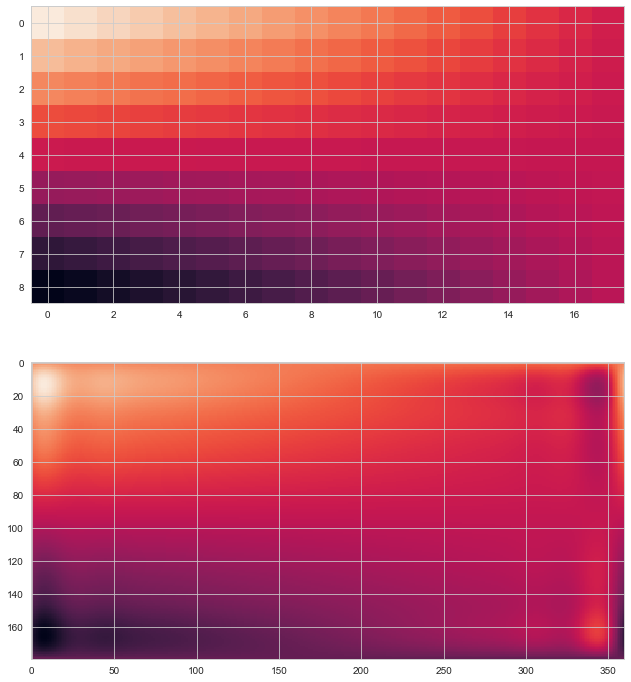

In [814]:
#krigging test
lats = np.linspace(10, 170, 9) * np.pi / 180.
lons = np.linspace(-180, 170, 18) * np.pi / 180.
data = np.dot(np.atleast_2d(90. - np.linspace(-80., 80., 18)).T,
              np.atleast_2d(180. - np.abs(np.linspace(0., 350., 9)))).T
#print(lats)
#print(lons)

new_lats = np.linspace(1, 180, 180) * np.pi / 180
new_lons = np.linspace(-180, 179, 360) * np.pi / 180
new_lats, new_lons = np.meshgrid(new_lats, new_lons)

from scipy.interpolate import RectSphereBivariateSpline
lut = RectSphereBivariateSpline(lats, lons, data)

data_interp = lut.ev(new_lats.ravel(),
                     new_lons.ravel()).reshape((360, 180)).T

fig = plt.figure(figsize=(12,12))
ax1 = fig.add_subplot(211)
ax1.imshow(data, interpolation='nearest')
ax2 = fig.add_subplot(212)
ax2.imshow(data_interp, interpolation='nearest')
plt.show()

In [815]:
df = dfb_ag12.loc[1:1000,['Longitude','Latitude','diff_wg']]
df = df.rename({'Longitude': 'longitude', 'Latitude': 'latitude', 'diff_wg': 'var1'}, axis = 1)
cond1 = df['longitude']==df['longitude'].max()
cond2 = df['longitude']==df['longitude'].min()
cond3 = df['latitude']==df['latitude'].max()
cond4 = df['latitude']==df['latitude'].min()

df[cond2]['longitude'].unique()

array([-100.505252])

In [816]:
#geographic gridding
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
import rasterio
from rasterio.crs import CRS
import mpu
from geopy.distance import geodesic
import h3
from shapely.geometry import Polygon
import folium

In [817]:
lon_point_list = [df[cond1]['longitude'].tolist()[0], df[cond3]['longitude'].tolist()[0], df[cond2]['longitude'].tolist()[0], df[cond4]['longitude'].tolist()[0]]
#[50.854457, 52.518172, 50.072651, 48.853033, 50.854457]
lat_point_list = [df[cond1]['latitude'].tolist()[0], df[cond3]['latitude'].tolist()[0], df[cond2]['latitude'].tolist()[0], df[cond4]['latitude'].tolist()[0]]
#[4.377184, 13.407759, 14.435935, 2.349553, 4.377184]

polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
crs = 'epsg:4326'
polygon = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom])       

polygon.to_file(filename='polygon.geojson', driver='GeoJSON')
polygon.to_file(filename='polygon.shp', driver="ESRI Shapefile")

#Bonus. Created polygon can be visualized with folium 0.12.1 too:

import folium
#m = folium.Map([50.854457, 4.377184], zoom_start=5, tiles='cartodbpositron')
m = folium.Map([38.20296, -90.05077], zoom_start=5, tiles='cartodbpositron')

folium.GeoJson(polygon).add_to(m)
folium.LatLngPopup().add_to(m)
m

In [818]:
# coords_1 = (xmin, ymin)
# coords_2 = (xmin, ymax)
# coords_3 = (xmax, ymax)
# coords_4 = (xmax, ymin)

# #define interval in meters
# intvly = 5000 
# intvlx = 20000

# disty = h3.point_dist(coords_1, coords_2, unit='m') # to get distance in meters
# print(disty)
# print(round(disty/intvly))
# distx = h3.point_dist(coords_3, coords_2, unit='m') # to get distance in meters
# print(distx)
# print(round(distx/intvlx))

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3668033737.py:41: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.

/Users/hao.deng1.ext/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3309: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3668033737.py:104: UserWarning:

CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326




1706468.5421292507
43
270576.6612787052
27


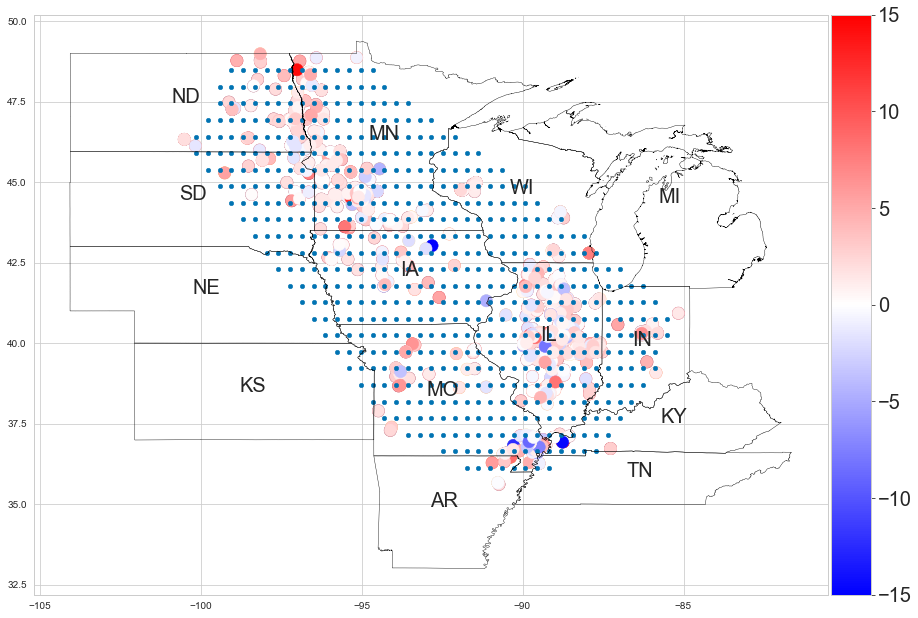

In [819]:
from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
fig, ax = plt.subplots(figsize=(15,30))
df = dfb_ag12

center.apply(lambda x: ax.annotate(
    text=x.STPOSTAL, 
    xy=x.geometry.centroid.coords[0],
    ha='center', 
    fontsize=20
),axis=1);

center.boundary.plot(ax=ax, color='Black', linewidth=.4)

fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
fap_to_plot = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')

# #plot city name
# for _, r in fap_to_plot.iterrows():
#      ax.annotate(r['city'], (r['Longitude'], r['Latitude']), ha = 'center', va='top', color = 'black', fontsize = 18)
    
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p2], vmin =90, vmax = 98, cmap = "YlOrRd")
M = 15
im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

#create an axes on the right side of ax. The width of cax will be 5%
#of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        

df = dfb_ag12[['Longitude','Latitude','diff_wg']]
df = df.rename({'Longitude': 'longitude', 'Latitude': 'latitude', 'diff_wg': 'var1'}, axis = 1)

#Create polygon
from scipy.spatial import ConvexHull as ch

#df = dfb_ag12
xfield, yfield = 'longitude', 'latitude'
arr = df[[xfield, yfield]].to_numpy() #Create numpy array from coordinates
hull = ch(arr) #Calculate convex hull

polylist = []
for idx in hull.vertices: #Indices of points forming the vertices of the convex hull.
    polylist.append(arr[idx]) #Append this index point to list

p = Polygon(polylist)
df1 = pd.DataFrame({'hull':[1]})
df1['geometry'] = p
polygon = gpd.GeoDataFrame(df1, crs='EPSG:{}'.format(4326), geometry='geometry')


# Get rid of are that you aren't interested in (too far away)
#plt.gca().set_xlim([df.longitude.min(),df.longitude.max()])
#plt.gca().set_ylim([df.latitude.min(),df.latitude.max()])

# make a grid of latitude-longitude values
xmin, xmax, ymin, ymax = df.longitude.min(),df.longitude.max(), df.latitude.min(),df.latitude.max()
coords_1 = (xmin, ymin)
coords_2 = (xmin, ymax)
coords_3 = (xmax, ymax)
coords_4 = (xmax, ymin)

#define interval in meters
intvlx = 40000 
intvly = 10000

distx = h3.point_dist(coords_3, coords_2, unit='m') # to get distance in meters
print(distx)
print(round(distx/intvlx))
disty = h3.point_dist(coords_1, coords_2, unit='m') # to get distance in meters
print(disty)
print(round(disty/intvly))

grid_x = round(distx/intvlx)
grid_y = round(disty/intvly)

xx, yy = np.meshgrid(np.linspace(xmin,xmax, grid_x), np.linspace(ymin,ymax, grid_y))
xc = xx.flatten()
yc = yy.flatten()

# Now convert these points to geo-data
pts = GeoSeries([Point(x, y) for x, y in zip(xc, yc)])
#in_map =  np.array([pts.within(geom) for geom in map2.geometry]).sum(axis=0)
#in_map =  np.array([pts.within(geom) for geom in polygon]).sum(axis=0)

#pts = GeoSeries([val for pos,val in enumerate(pts) if in_map[pos]])
pts = gpd.GeoDataFrame(geometry=gpd.GeoSeries(pts))
pts = gpd.sjoin(pts, polygon, op='within', how='inner')


# Plot to make sure it makes sense:
pts.plot(ax=ax, markersize=20)

# Now get the lat-long coordinates in a dataframe
# coords = []
# for n, point in enumerate(pts):
#     coords += [','.join(__ for __ in _.strip().split(' ')[::-1]) for _ in str(point).split('(')[1].split(')')[0].split(',')]
        
plt.show()    



In [820]:
#geographic gridding
from scipy.interpolate import griddata
import rasterio
from rasterio.crs import CRS
import mpu
from geopy.distance import geodesic
import h3
from shapely.geometry import Polygon
import folium
from scipy.spatial import ConvexHull as ch
import folium.plugins
import branca
import branca.colormap as cm
from branca.colormap import ColorMap, LinearColormap

df = dfb_ag12

#Create a convex polygon
xfield, yfield = 'Longitude', 'Latitude'
arr = df[[xfield, yfield]].to_numpy() #Create numpy array from coordinates
hull = ch(arr) #Calculate convex hull
epsg = 4326
polylist = []
for idx in hull.vertices: #Indices of points forming the vertices of the convex hull.
    polylist.append(arr[idx]) #Append this index point to list
p = Polygon(polylist)
df_poly = pd.DataFrame({'hull':[1]})
df_poly['geometry'] = p
polygon = gpd.GeoDataFrame(df_poly, crs='EPSG:{}'.format(epsg), geometry='geometry')

# make a grid of latitude-longitude values
xmin, xmax, ymin, ymax = df.Longitude.min(),df.Longitude.max(), df.Latitude.min(),df.Latitude.max()
coords_1 = (xmin, ymin)
coords_2 = (xmin, ymax)
coords_3 = (xmax, ymax)
coords_4 = (xmax, ymin)

#define interval in meters
intvlx = 40000 
intvly = 10000

distx = h3.point_dist(coords_3, coords_2, unit='m') # to get distance in meters
#print(distx)
#print(round(distx/intvlx))
disty = h3.point_dist(coords_1, coords_2, unit='m') # to get distance in meters
#print(disty)
#print(round(disty/intvly))

# Number of grid points in x and y
grid_x = round(distx/intvlx)
grid_y = round(disty/intvly)

xx, yy = np.meshgrid(np.linspace(xmin,xmax, grid_x), np.linspace(ymin,ymax, grid_y))
xc = xx.flatten()
yc = yy.flatten()

# Now convert these points to geo-data
pts = GeoSeries([Point(x, y) for x, y in zip(xc, yc)])
pts = gpd.GeoDataFrame(pts, crs ='EPSG:{}'.format(epsg), geometry=gpd.GeoSeries(pts))
pts = gpd.sjoin(pts, polygon, predicate='within', how='inner')

#Create Map
m = folium.Map([43.5485, -93.1201], zoom_start=5.5, tiles='cartodbpositron')

#plot polygon
#folium.GeoJson(polygon).add_to(m)
folium.LatLngPopup().add_to(m)

#Plot Values
crop_yr = 2020
df = dfb_ag12[dfb_ag12['crop_yr']==crop_yr]
cr = 5
colormap1 = cm.LinearColormap(colors=['blue','white','red'], index=[-cr,0,cr],vmin=-cr,vmax=cr)
colormap2 = cm.LinearColormap(colors=['yellow','red'], index=[90,98],
                              vmin=90,vmax=98,
                             caption = 'Warm Germination Score')
p2 = 'fin_wg_wt_avg'
p1 = 'bulk_wg_current'
p3 = 'diff_wg'

lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df[p1])

for loc, p in zip(zip(lat, lon), to_plot):
    folium.CircleMarker(location=loc,
        radius=5,
        fill=True,
        color=colormap2(p),
        fill_opacity=1
    ).add_to(m)
m.add_child(colormap2)

# for idx, row in pts.iterrows():
#     folium.CircleMarker(location=(row['geometry'].y, row['geometry'].x),
#         radius=1,
#         fill=True,
# #        color=colormap(p),
# #        fill_opacity=1
#     ).add_to(m)
m

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3982613151.py:5: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




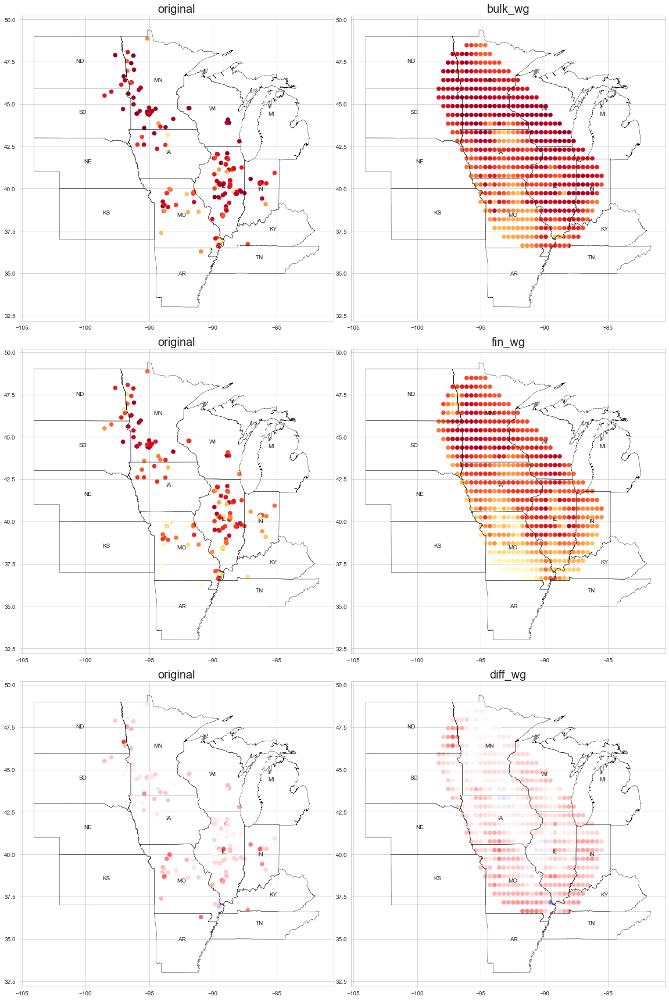

In [821]:
epsg_wgs = 4326 # World Geodetic System 1984
epsg_utm = 4326

gdf_grid = gpd.GeoDataFrame(pts, columns=['geometry'], crs=epsg_utm)
gdf_grid['centroids'] = gdf_grid['geometry'].centroid
gdf_grid.head()

# Convert CRS back to Lat/Long
gdf_grid['geometry'] = gdf_grid['geometry'].to_crs(crs=epsg_wgs)
gdf_grid['centroids'] = gdf_grid['centroids'].to_crs(crs=epsg_wgs)

# fig, ax = plt.subplots(1,1, figsize=(8,8))
# gdf_grid.plot(ax=ax, facecolor = 'None', edgecolor='k')

# Interpolate the values of observed automobiles to each centroid
crop_yr = 2020
p2 = 'fin_wg_wt_avg'
p1 = 'bulk_wg_current'
p3 = 'diff_wg'
p = p3

df = dfb_ag12[dfb_ag12['crop_yr']==crop_yr][['Longitude', 'Latitude', 'bulk_wg_current', 'fin_wg_wt_avg', 'diff_wg']]
df = gpd.GeoDataFrame(df)
# Convert latitude and longitude to point data
df['geometry'] = gpd.points_from_xy(df['Longitude'], 
                                     df['Latitude'],
                                    crs = epsg_wgs)

x = df['geometry'].x
y = df['geometry'].y
z = df[p]

xq = gdf_grid['centroids'].x
yq = gdf_grid['centroids'].y

# Arrange variables in griddata input format
points = (x,y)
values = z
xi = (xq, yq)

p_n1 = griddata(points,df[p1],xi,method='linear')
p_n2 = griddata(points,df[p2],xi,method='linear')
p_n3 = griddata(points,df[p3],xi,method='linear')

#Save interpolated data values into the geodataframe

fig, ax = plt.subplots(3,2, figsize=(16,24))
gdf_grid[p] = p_n1.round(1)
#ax.ticklabel_format(useOffset=False)
#gdf_grid.plot(ax=ax, column=p, edgecolor='face', cmap='bwr')
M = 10
ft = 20
# gdf_grid[p] = p_n3.round(1)
# gdf_grid[p] = p_n2.round(1)
vmin = 90
vmax = 100

ax[0,0].scatter(df['geometry'].x, df['geometry'].y, c = df[p1], s = 50, vmin = vmin, vmax = vmax, cmap = "YlOrRd")
ax[0,0].set_title('original', fontsize = ft)

ax[0,1].scatter(gdf_grid['geometry'].x, gdf_grid['geometry'].y, c = p_n1.round(1), s = 50, vmin = vmin, vmax = vmax, cmap = "YlOrRd")
ax[0,1].set_title('bulk_wg', fontsize = ft)
#plt.colorbar(im)

ax[1,0].scatter(df['geometry'].x, df['geometry'].y, c = df[p2], s = 50, vmin = vmin, vmax = vmax, cmap = "YlOrRd")
ax[1,0].set_title('original', fontsize = ft)

ax[1,1].scatter(gdf_grid['geometry'].x, gdf_grid['geometry'].y, c = p_n2.round(1), s = 50, vmin = vmin, vmax = vmax, cmap = "YlOrRd")
ax[1,1].set_title('fin_wg', fontsize = ft)

ax[2,0].scatter(df['geometry'].x, df['geometry'].y, c = df[p], s = 50, vmin =-M, vmax = M, cmap = "bwr")
ax[2,0].set_title('original', fontsize = ft)

ax[2,1].scatter(gdf_grid['geometry'].x, gdf_grid['geometry'].y, c = p_n3.round(1), s = 50, vmin =-M, vmax = M, cmap = "bwr")
ax[2,1].set_title('diff_wg', fontsize = ft)

fig.tight_layout()


#background
#
for i in range(3):
    for j in range(2):
        center.apply(lambda x: ax[i,j].annotate(
            text=x.STPOSTAL, 
            xy=x.geometry.centroid.coords[0],
            ha='center', 
            fontsize=10
        ),axis=1);
        center.boundary.plot(ax=ax[i,j], color='Black', linewidth=.4)

# fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/FAP Location.xlsx')
# fap_to_plot = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
# fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')

# #plot city name
# for _, r in fap_to_plot.iterrows():
#      ax.annotate(r['city'], (r['Longitude'], r['Latitude']), ha = 'center', va='top', color = 'black', fontsize = 18)

#visualizations
# fig, axs = plt.subplots(2, 2)
# #axs[0, 0].plot(func(grid_x,grid_y))
# #axs[0, 0].set_title("main")
# axs[1, 0].plot(p_n3)
# axs[1, 0].set_title("cubic")
# axs[0, 1].plot(p_n2)
# axs[0, 1].set_title("linear")
# axs[1, 1].plot(p_n1)
# axs[1, 1].set_title("nearest")
# fig.tight_layout()

In [822]:
df = dfb_ag12[['Longitude', 'Latitude', p1, p2, p3]]
#df.loc[:,'Longitude'].values

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1700406973.py:106: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



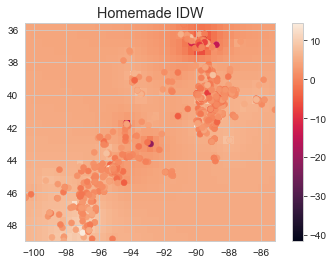

In [823]:
from scipy.interpolate import Rbf

def main():
    # Setup: Generate data...
#     n = 10
#     nx, ny = 50, 50
#     x, y, z = map(np.random.random, [n, n, n])

    nx = grid_x
    ny = grid_y
    
    p2 = 'fin_wg_wt_avg'
    p1 = 'bulk_wg_current'
    p3 = 'diff_wg'
    df = dfb_ag12[['Longitude', 'Latitude', p1, p2, p3]]
    
    to_plot = p3
    
    x = df.loc[:,'Longitude'].values
    y = df.loc[:,'Latitude'].values
    z = df.loc[:,to_plot].values


#     xi = np.linspace(x.min(), x.max(), nx)
#     yi = np.linspace(y.min(), y.max(), ny)
#     xi, yi = np.meshgrid(xi, yi)
#     xi, yi = xi.flatten(), yi.flatten()

    xi = xc
    yi = yc

    # Calculate IDW
    grid1 = simple_idw(x,y,z,xi,yi)
    grid1 = grid1.reshape((ny, nx))

    # Calculate scipy's RBF
#    grid2 = scipy_idw(x,y,z,xi,yi)
#    grid2 = grid2.reshape((ny, nx))

#     grid3 = linear_rbf(x,y,z,xi,yi)
#     print(grid3.shape)
#     grid3 = grid3.reshape((ny, nx))


    # Comparisons...
    plot(x,y,z,grid1)
    plt.title('Homemade IDW')

#    plot(x,y,z,grid2)
#    plt.title("Scipy's Rbf with function=linear")

    # plot(x,y,z,grid3)
    # plt.title('Homemade linear Rbf')

    plt.show()

def simple_idw(x, y, z, xi, yi):
    dist = distance_matrix(x,y, xi,yi)

    # In IDW, weights are 1 / distance
    weights = 1.0 / dist

    # Make weights sum to one
    weights /= weights.sum(axis=0)

    # Multiply the weights for each interpolated point by all observed Z-values
    zi = np.dot(weights.T, z)
    return zi

def linear_rbf(x, y, z, xi, yi):
    dist = distance_matrix(x,y, xi,yi)

    # Mutual pariwise distances between observations
    internal_dist = distance_matrix(x,y, x,y)

    # Now solve for the weights such that mistfit at the observations is minimized
    weights = np.linalg.solve(internal_dist, z)

    # Multiply the weights for each interpolated point by the distances
    zi =  np.dot(dist.T, weights)
    return zi


def scipy_idw(x, y, z, xi, yi):
    interp = Rbf(x, y, z, function='linear')
    return interp(xi, yi)

def distance_matrix(x0, y0, x1, y1):
    obs = np.vstack((x0, y0)).T
    interp = np.vstack((x1, y1)).T

    # Make a distance matrix between pairwise observations
    # Note: from <http://stackoverflow.com/questions/1871536>
    # (Yay for ufuncs!)
    d0 = np.subtract.outer(obs[:,0], interp[:,0])
    d1 = np.subtract.outer(obs[:,1], interp[:,1])

    return np.hypot(d0, d1)


def plot(x,y,z,grid):
    plt.figure()
    plt.imshow(grid, extent=(x.min(), x.max(), y.max(), y.min()))
#    plt.hold(True)
    plt.scatter(x,y,c=z)
    plt.colorbar()

if __name__ == '__main__':
    main()

# Correlation Matrix Analysis, starting from dfb_ag08

In [824]:
dfb_ag08 = dfb_ag07[['crop_yr',  'p08_plnt_cd', 'pbc_plnt_cd','fin_prcs_ord_nbr',
          'bulk_batch_nbr', 'fin_batch_nbr', 'bulk_wg_current',  'fin_wg_current', 'bulk_wg_current_dt','fin_wg_current_dt','bulk_moisture', 'fin_moisture',
          'mg', 'bulk_drg', 'fin_drg', 
          'fin_total_projected_units', 'total_projected_units', 
          'Bin Tag #', 'Bin ID#', 'Total Bin Weight', '% Usable Seed', 'Type', 
          'Diameter', 'Height', 'Capacity', 'Door Slide', 'Bin estimates', 'Facility SAP', 'Longitude', 'Latitude', 'Vendor - Unique Key', 'Vendor', 'Year Contracted']] 

In [825]:
dfb_ag08 = dfb_ag08.loc[:,~dfb_ag08.columns.duplicated()].copy()

dfb_ag08 = dfb_ag07[['crop_yr',  'p08_plnt_cd', 'pbc_plnt_cd','fin_prcs_ord_nbr',
          'bulk_batch_nbr', 'fin_batch_nbr', 'bulk_wg_current',  'fin_wg_current', 'bulk_wg_current_dt','fin_wg_current_dt','bulk_moisture', 'fin_moisture',
          'mg', 'bulk_drg', 'fin_drg', 
          'fin_total_projected_units', 'total_projected_units', 'mg',
          'Bin Tag #', 'Bin ID#', 'Total Bin Weight', '% Usable Seed', 'Type', 
          'Diameter', 'Height', 'Capacity', 'Door Slide', 'Bin estimates', 'Facility SAP', 'Longitude', 'Latitude', 'Vendor - Unique Key', 'Vendor', 'Year Contracted']] 
dfb_ag08

,crop_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,bulk_batch_nbr,fin_batch_nbr,bulk_wg_current,fin_wg_current,bulk_wg_current_dt,fin_wg_current_dt,bulk_moisture,fin_moisture,mg,bulk_drg,fin_drg,fin_total_projected_units,total_projected_units,mg,Bin Tag #,Bin ID#,Total Bin Weight,% Usable Seed,Type,Diameter,Height,Capacity,Door Slide,Bin estimates,Facility SAP,Longitude,Latitude,Vendor - Unique Key,Vendor,Year Contracted
0,2020,1285.0,8H16,2502178523,CE0SB33,CE0SB33A,98.00,95.00,2020-11-23,20201224,11.5,12.0,4,1,1,80.00,4068.829943,4,25201,25201,3135.0,89.15,STEEL,18.00,14.0,2862.88,YES,25201,8H16,-90.050767,38.206961,8008796-8H16,8008796,2020
1,2017,1778.0,8H45,103413348,MF73BC3,MF73BC3A,92.00,93.25,2017-11-08,2018-02-20 00:00:00,11.2,11.0,4,1,1,2800.00,4662.385680,4,21420,21420,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45,-89.558800,36.707200,8016125-8H45,8016125,2014
2,2017,1778.0,8H45,103413348,MF73BC3,MF73BC3C,92.00,91.50,2017-11-08,2018-02-19 00:00:00,11.2,11.0,4,1,0,1158.80,4662.385680,4,21420,21420,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45,-89.558800,36.707200,8016125-8H45,8016125,2014
3,2020,1285.0,8H16,2502178457,CE0SD81,CE0SEA2A,99.00,96.75,2020-10-22,20210212,12.8,11.1,3,1,1,800.00,9229.646301,3,31103,31103,10066.0,90.63,STEEL,30.00,17.5,9940.57,YES,31103,8H16,-88.984400,38.953100,8005501-8H16,8005501,2017
4,2020,1285.0,8H16,2502201711,CE0SAD1,CE0SAD11,99.00,97.75,2020-12-01,20210414,10.4,11.2,3,1,1,240.00,45973.921692,3,32209,32209,50244.0,89.16,STEEL,48.00,33.5,48714.48,NO,32209,8H16,-87.521300,39.730400,8029178-8H16,8029178,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW21,90.25,85.50,2019-12-02,2020-05-22 00:00:00,16.3,16.1,0,0,0,234.00,9673.566876,0,15261,15261,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020
4007,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW2A,90.25,85.75,2019-12-02,2020-05-11 00:00:00,16.3,15.8,0,0,0,4800.00,9673.566876,0,15261,15261,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020
4008,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW2Q,90.25,85.75,2019-12-02,2020-05-23 00:00:00,16.3,15.8,0,0,0,1680.00,9673.566876,0,15261,15261,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020
4009,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW2Z,90.25,85.50,2019-12-02,2020-05-11 00:00:00,16.3,14.4,0,0,0,3380.00,9673.566876,0,15261,15261,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020


In [826]:
# format fin_wg_current_dt
from datetime import datetime
df = dfb_ag08
m = df.fin_wg_current_dt.astype(str).str.isdigit()
#df.loc[m,'fin_wg_current_dt'] = df.loc[m,'fin_wg_current_dt'].astype(str).apply(lambda x: datetime.datetime.strptime(x, '%Y%m%d'))
df.loc[m,'fin_wg_current_dt'] = df.loc[m,'fin_wg_current_dt'].astype(str).apply(lambda x: datetime.strptime(x, '%Y%m%d'))
df['fin_wg_current_dt'] = pd.to_datetime(df['fin_wg_current_dt'], errors='coerce')
dfb_ag08 = df
dfb_ag08['wg_test_dt_diff'] = dfb_ag08['fin_wg_current_dt'] - dfb_ag08['bulk_wg_current_dt']
dfb_ag08['wg_test_dt_diff'] = dfb_ag08['wg_test_dt_diff'].astype(int)/(3600*24*1000000000)
dfb_ag08['wg_test_dt_diff'] = dfb_ag08['wg_test_dt_diff'].astype(int)

mean    110.941290
std      56.607642
min       1.000000
max     268.000000
Name: wg_test_dt_diff, dtype: float64


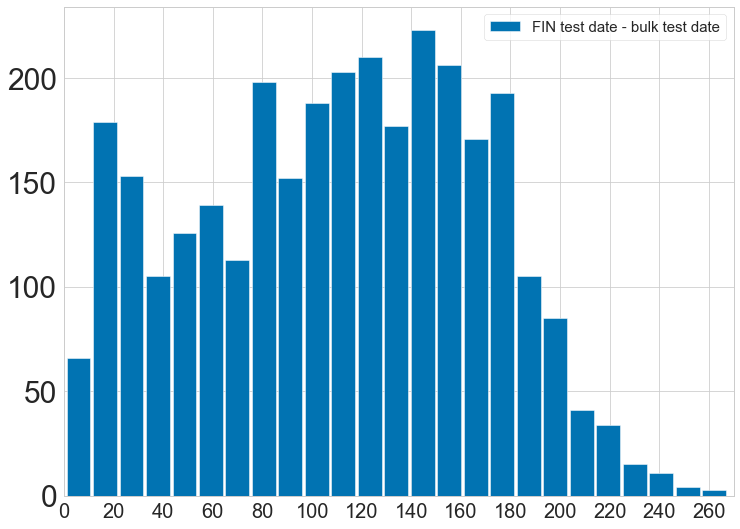

In [827]:
#Input dataset
tg = dfb_ag08[dfb_ag08['fin_moisture'].notna()]

yr = 2016

tg_yr = tg.loc[tg['crop_yr'] == yr,]
tg_yr = tg

#Graph y and y1
y = tg_yr.loc[tg_yr['wg_test_dt_diff']>0,'wg_test_dt_diff']

x_range_min = -0 
x_range_max = 270

bin0 = 25

plt.figure(figsize=(12,9))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = False)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

# t_init = models.Spline1D()
# fit_t = fitting.SplineSmoothingFitter()
# t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)
t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='FIN test date - bulk test date', alpha = 1)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='black')


#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,20), fontsize = 20)
#plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 30)
#plt.title('Crop Year: '+str(yr), fontsize = 25, loc = 'center')

plt.legend(fontsize = 15)

print(y.agg(['mean','std','min','max']))

count    355.000000
mean       0.760035
std        2.765297
min      -14.000000
max        9.500000
Name: diff_wg, dtype: float64


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/697115733.py:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



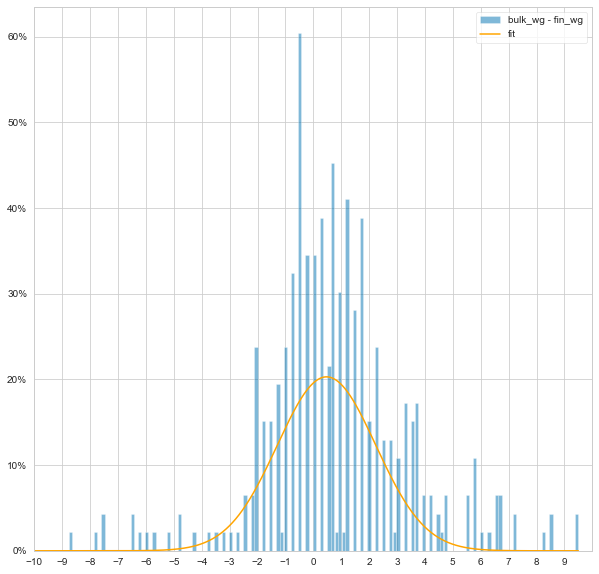

In [828]:
from scipy.optimize import curve_fit

def gaussian(x, mean, amplitude, standard_deviation):
    return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))

df = dfb_ag08.loc[(dfb_ag08['wg_test_dt_diff']<30)&(dfb_ag08['wg_test_dt_diff']>0),]
#df = dfb_ag08
df['diff_wg'] = df.bulk_wg_current - df['fin_wg_current'] 

print(df.diff_wg.agg(['count','mean','std','min','max']))

# x axis values
x = df.bulk_batch_nbr
# corresponding y axis values
#y = dfb_ag055.drgdiff
y = df.diff_wg
  
plt.figure(figsize=(10,10))
bin_heights, bin_borders, _ = plt.hist(y, bins=180, density = True, alpha=0.5, rwidth=0.9, stacked = False, label = 'bulk_wg - fin_wg')

bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[1., 0., 1.])

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), label='fit', color = 'orange')

plt.xlim(xmin = -10, xmax = 10)
plt.xticks(np.arange(-10,10,1))
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.legend()

In [829]:
dfb_ag20 = dfb_ag08.groupby('bulk_batch_nbr')['wg_test_dt_diff'].std().reset_index()
# dfb_ag20['max-min']=dfb_ag20['max']-dfb_ag20['min']
# dfb_ag20.sort_values('max-min',ascending = False).head(10)
#dfb_ag20[dfb_ag20['var']<100].sort_values('var')
dfb_ag20[dfb_ag20['bulk_batch_nbr']=='AS9SBH1']

,bulk_batch_nbr,wg_test_dt_diff
91,AS9SBH1,80.367558


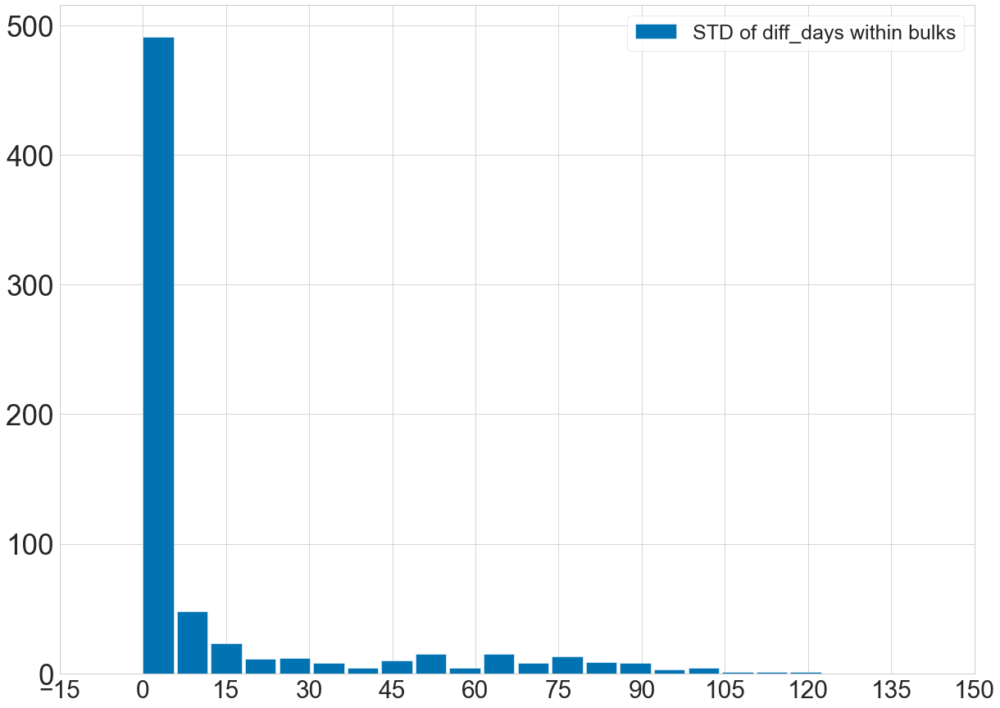

In [830]:
#Input dataset
tg = dfb_ag20[dfb_ag20['wg_test_dt_diff'].notna()]

#yr = 2018

#tg_yr = tg.loc[tg['crop_yr'] == yr,]
tg_yr = tg

#Graph y and y1
y = tg_yr.wg_test_dt_diff

x_range_min = -15
x_range_max = 150

bin0 = 20

plt.figure(figsize=(20,15))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = False)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

# t_init = models.Spline1D()
# fit_t = fitting.SplineSmoothingFitter()
# t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)
t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='STD of diff_days within bulks', alpha = 1)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='black')


#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,15), fontsize = 30)
#plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)

plt.legend(fontsize = 25)

In [831]:
dfb_ag08[dfb_ag08['bulk_batch_nbr'].isin(['AS9SBH1'])][['bulk_batch_nbr','fin_batch_nbr',
                                                                  'bulk_wg_current','fin_wg_current',
                                                                  'bulk_wg_current_dt','fin_wg_current_dt', 'wg_test_dt_diff']].sort_values('wg_test_dt_diff')

,bulk_batch_nbr,fin_batch_nbr,bulk_wg_current,fin_wg_current,bulk_wg_current_dt,fin_wg_current_dt,wg_test_dt_diff
602,AS9SBH1,AS9SBH1C,97.0,98.75,2019-11-13,2019-11-20,7
605,AS9SBH1,AS9SBH1Y,97.0,98.75,2019-11-13,2019-11-20,7
606,AS9SBH1,AS9SBH1Z,97.0,98.25,2019-11-13,2019-11-20,7
600,AS9SBH1,AS9SBH1A,97.0,98.50,2019-11-13,2019-11-25,12
604,AS9SBH1,AS9SBH1E,97.0,97.75,2019-11-13,2019-11-25,12
603,AS9SBH1,AS9SBH1D,97.0,96.75,2019-11-13,2019-11-26,13
599,AS9SBH1,AS9SBH12,97.0,99.00,2019-11-13,2020-05-01,170
601,AS9SBH1,AS9SBH1B,97.0,98.00,2019-11-13,2020-05-01,170
598,AS9SBH1,AS9SBH11,97.0,99.00,2019-11-13,2020-05-02,171


In [832]:
dfb_ag08[['fin_moisture', 'bulk_moisture']].head(20)
dfb_ag08.fin_moisture.isna().sum()
dfb_ag08[['fin_moisture', 'bulk_moisture']].describe()


,fin_moisture,bulk_moisture
count,3149.000000,3153.000000
mean,11.426653,11.768658
std,1.319233,1.465553
min,7.600000,8.000000
25%,10.500000,10.700000
50%,11.400000,11.800000
75%,12.350000,12.900000
max,16.100000,17.600000


In [833]:
dfb_ag20 = dfb_ag08.groupby('bulk_batch_nbr')['fin_moisture'].agg(['mean','min','max', 'var','std','count'])
#dfb_ag20['max-min']=dfb_ag20['max']-dfb_ag20['min']
dfb_ag20.sort_values('var',ascending = False).head(10)
#dfb_ag20

,mean,min,max,var,std,count
bulk_batch_nbr,,,,,,
MP7FCD1,11.650000,9.4,13.9,10.125000,3.181981,2
CE8SAD1,12.616667,9.7,15.7,7.917667,2.813835,6
MC8SBM1,13.150000,11.9,14.4,3.125000,1.767767,2
MF83BB1,10.825000,8.7,12.5,2.955833,1.719254,4
WF8SHN1,12.133333,10.2,13.3,2.843333,1.686219,3
AS0SE12,11.587500,9.3,13.1,2.677292,1.636243,4
CE8SAR1,11.300000,9.5,13.7,2.392500,1.546771,9
RF0SKY2,11.333333,10.2,13.0,2.173333,1.474223,3
WF7SDD2,10.180000,8.9,11.7,1.972000,1.404279,5


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/896927334.py:54: UserWarning:

FixedFormatter should only be used together with FixedLocator



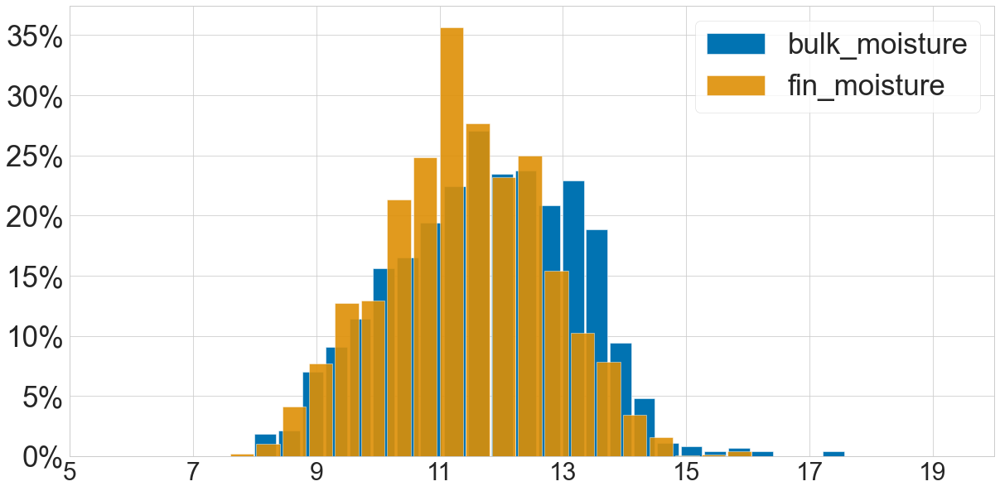

In [834]:
#Input dataset
tg = dfb_ag08[dfb_ag08['fin_moisture'].notna()]

#yr = 2018

#tg_yr = tg.loc[tg['crop_yr'] == yr,]
tg_yr = tg

#Graph y and y1
y = tg_yr.bulk_moisture
y1 = tg_yr.fin_moisture

x_range_min = 5 
x_range_max = 20

bin0 = 25
bin1 = 20

plt.figure(figsize=(20,10))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)


x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='bulk_moisture', alpha = 1)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='bulk_moisture_fit', c='black')

#plot y
bin_heights, bin_borders = np.histogram(y1, bins=bin1, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()

t = fit_t(t_init, bin_centers, bin_heights, s = 0.08)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)

plt.bar(bin_centers, bin_heights, width=bin_widths, label='fin_moisture', alpha = 0.9)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fin_moisture_fit', c='red')

#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,2), fontsize = 30)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)

plt.legend(fontsize = 35)

In [835]:
dfb_ag08['diff_wg'] = dfb_ag08['bulk_wg_current'] - dfb_ag08['fin_wg_current']
dfb_ag08['diff_moisture'] = dfb_ag08['bulk_moisture'] - dfb_ag08['fin_moisture']

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2607810290.py:39: UserWarning:

FixedFormatter should only be used together with FixedLocator



(array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 [Text(0, 0.0, '0%'),
  Text(0, 0.1, '10%'),
  Text(0, 0.2, '20%'),
  Text(0, 0.30000000000000004, '30%'),
  Text(0, 0.4, '40%'),
  Text(0, 0.5, '50%'),
  Text(0, 0.6000000000000001, '60%'),
  Text(0, 0.7000000000000001, '70%'),
  Text(0, 0.8, '80%'),
  Text(0, 0.9, '90%')])

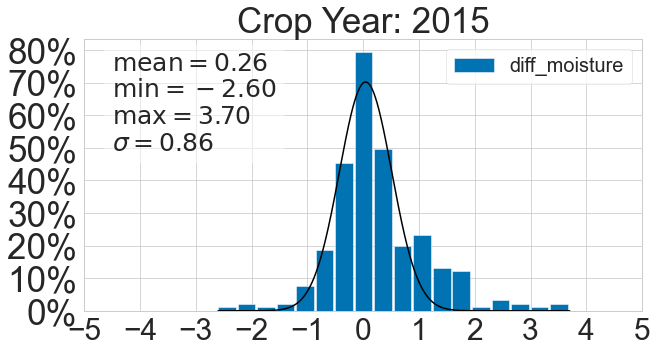

In [836]:
#Input dataset
tg = dfb_ag08[dfb_ag08['fin_moisture'].notna()]

yr = 2015

tg_yr = tg.loc[tg['crop_yr'] == yr,]
#tg_yr = tg

#Graph y and y1
y = tg_yr.diff_moisture

x_range_min = -5 
x_range_max = 5

bin0 = 18

fig, ax = plt.subplots(figsize=(10,5))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)
t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='diff_moisture', alpha = 1)
plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='black')


#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,1), fontsize = 30)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)

plt.legend(fontsize = 20)

# place a text box in upper left in axes coords
mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()

textstr = '\n'.join((
    r'$\mathrm{mean}=%.2f$' % (mu, ),
    r'$\mathrm{min}=%.2f$' % (minimum, ),
    r'$\mathrm{max}=%.2f$' % (maximum, ),
    r'$\sigma=%.2f$' % (sigma, )))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)

plt.title('Crop Year: '+str(yr), fontsize = 35, loc = 'center')
plt.yticks(fontsize = 35)


In [837]:
dfb_ag08[[ 'Total Bin Weight',
 '% Usable Seed',
 'Type',
 'Diameter',
 'Height',
 'Capacity',
 'Door Slide',
 'Bin estimates',
 'Facility SAP']]

,Total Bin Weight,% Usable Seed,Type,Diameter,Height,Capacity,Door Slide,Bin estimates,Facility SAP
0,3135.0,89.15,STEEL,18.00,14.0,2862.88,YES,25201,8H16
1,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45
2,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45
3,10066.0,90.63,STEEL,30.00,17.5,9940.57,YES,31103,8H16
4,50244.0,89.16,STEEL,48.00,33.5,48714.48,NO,32209,8H16
...,...,...,...,...,...,...,...,...,...
4006,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40
4007,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40
4008,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40
4009,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40


In [838]:
corr_name = ['diff_wg', 
             'bulk_wg_current','fin_wg_current','wg_test_dt_diff', 
             'bulk_moisture','fin_moisture','diff_moisture',
             'mg',
             'Diameter','Height',
             'Longitude','Latitude'
   ]
df = dfb_ag08[corr_name]
df['diff_wg'].corr(df['wg_test_dt_diff'])

0.0613627266638557

In [839]:
df = df.loc[:,~df.columns.duplicated()].copy()
df

,diff_wg,bulk_wg_current,fin_wg_current,wg_test_dt_diff,bulk_moisture,fin_moisture,diff_moisture,mg,Diameter,Height,Longitude,Latitude
0,3.00,98.00,95.00,31,11.5,12.0,-0.5,4,18.00,14.0,-90.050767,38.206961
1,-1.25,92.00,93.25,104,11.2,11.0,0.2,4,23.75,17.0,-89.558800,36.707200
2,0.50,92.00,91.50,103,11.2,11.0,0.2,4,23.75,17.0,-89.558800,36.707200
3,2.25,99.00,96.75,113,12.8,11.1,1.7,3,30.00,17.5,-88.984400,38.953100
4,1.25,99.00,97.75,134,10.4,11.2,-0.8,3,48.00,33.5,-87.521300,39.730400
...,...,...,...,...,...,...,...,...,...,...,...,...
4006,4.75,90.25,85.50,172,16.3,16.1,0.2,0,27.00,24.0,-98.147065,48.989643
4007,4.50,90.25,85.75,161,16.3,15.8,0.5,0,27.00,24.0,-98.147065,48.989643
4008,4.50,90.25,85.75,173,16.3,15.8,0.5,0,27.00,24.0,-98.147065,48.989643
4009,4.75,90.25,85.50,161,16.3,14.4,1.9,0,27.00,24.0,-98.147065,48.989643


In [840]:
dfb_ag08 = dfb_ag08.loc[:,~dfb_ag08.columns.duplicated()].copy()

corr_name = ['diff_wg'
             , 'bulk_wg_current','fin_wg_current'
             ,'wg_test_dt_diff'
              ,'bulk_moisture','fin_moisture','diff_moisture'
              ,'mg'
              ,'Diameter','Height'
              ,'Longitude','Latitude'
             ,'Total Bin Weight'
             ,'% Usable Seed', 'Capacity', 'Bin estimates'
             ,'Type','Door Slide', 'Facility SAP'
                        ]
df = dfb_ag08[corr_name]

corr = df.corr()
#corr.style.background_gradient(cmap='coolwarm').set_precision(3)
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(null_color='#f1f1f1')  # Color NaNs grey
 .set_precision(3))

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1548542072.py:21: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,diff_wg,bulk_wg_current,fin_wg_current,wg_test_dt_diff,bulk_moisture,fin_moisture,diff_moisture,mg,Diameter,Height,Longitude,Latitude,Total Bin Weight,% Usable Seed,Capacity,Bin estimates
diff_wg,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
bulk_wg_current,0.515,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
fin_wg_current,-0.324,0.644,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
wg_test_dt_diff,0.061,-0.014,-0.070,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
bulk_moisture,-0.064,-0.039,0.013,-0.013,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
fin_moisture,-0.116,0.012,0.117,-0.068,0.759,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
diff_moisture,0.061,-0.074,-0.136,0.073,0.476,-0.211,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
mg,-0.074,-0.212,-0.168,-0.040,-0.051,-0.137,0.108,nan,nan,nan,nan,nan,nan,nan,nan,nan
Diameter,0.060,0.048,0.000,-0.103,0.008,-0.025,0.046,0.120,nan,nan,nan,nan,nan,nan,nan,nan
Height,0.046,0.084,0.053,-0.070,0.012,-0.000,0.018,0.053,0.591,nan,nan,nan,nan,nan,nan,nan


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1974799601.py:5: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



<AxesSubplot:>

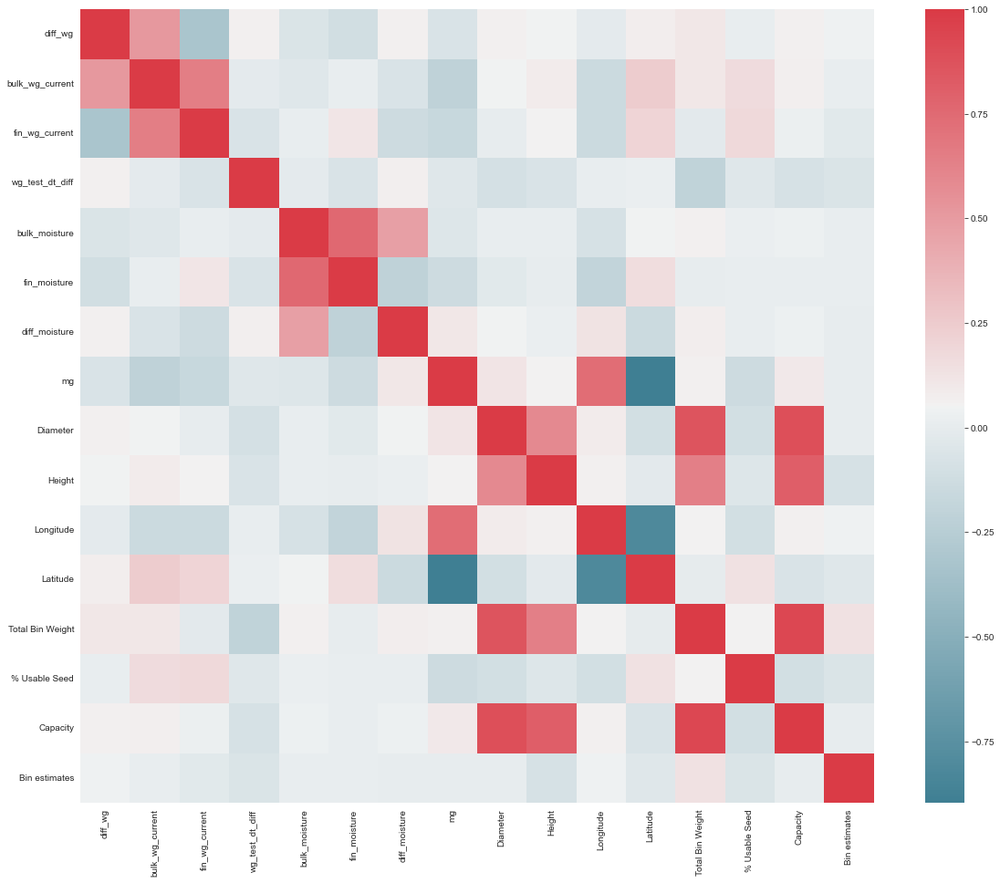

In [841]:
import seaborn as sns

f, ax = plt.subplots(figsize=(20, 16))
corr = df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2430640671.py:43: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



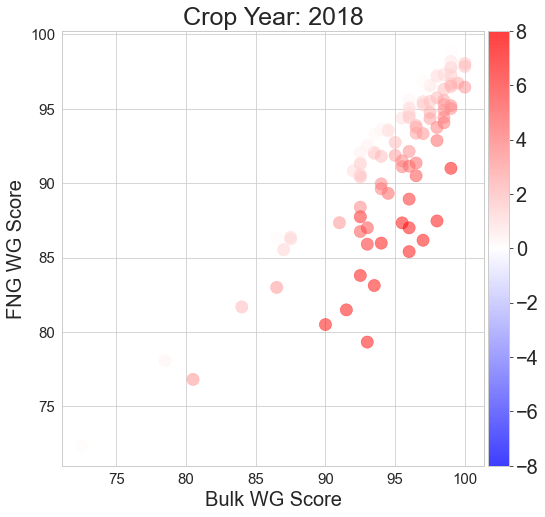

In [842]:
# Plot bulk_wg vs fng_wg
# Fixing random state for reproducibility
#np.random.seed(19680801)

N = 1000

p2 = 'fin_wg_wt_avg'
p1 = 'bulk_wg_current'
p3 = 'diff_wg'

df = dfb_ag12
yr = 2018
df_yr = df.loc[df['crop_yr'] == yr,].head(N)
#df_yr = df
df_yr = df_yr[(df_yr[p1]>70) & (df_yr[p2]>70)]
df_yr = df_yr[df_yr[p3]>0]
#x = np.random.rand(N)
x = df_yr[p1]
#y = np.random.rand(N)
y = df_yr[p2]

z = df_yr[p3]
#colors = np.random.rand(N)
area = (30 * np.random.rand(N))**2  # 0 to 15 point radii

fig, ax = plt.subplots(figsize=(8,8))
M = 8
im = plt.scatter(x, y, s=150, c=z, alpha=0.5, vmin =-M, vmax = M, cmap = "bwr")

plt.title('Crop Year: '+str(yr), fontsize = 25, loc = 'center')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlabel('Bulk WG Score', fontsize = 20)
plt.ylabel('FNG WG Score', fontsize = 20)


# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3782882778.py:44: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



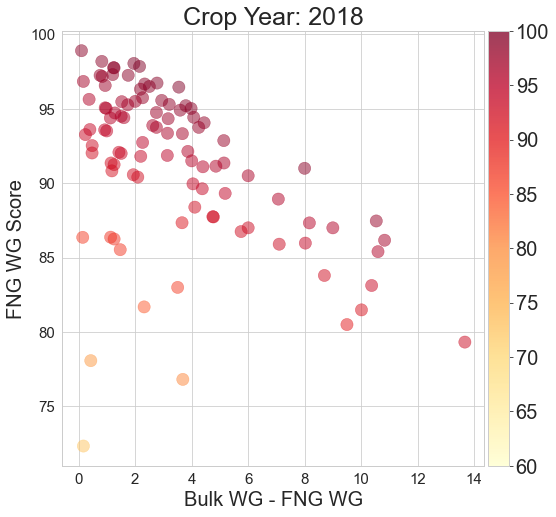

In [843]:
# Plot bulk_wg vs fng_wg
# Fixing random state for reproducibility
#np.random.seed(19680801)

N = 1000

p2 = 'fin_wg_wt_avg'
p1 = 'bulk_wg_current'
p3 = 'diff_wg'

df = dfb_ag12
yr = 2018
df_yr = df.loc[df['crop_yr'] == yr,].head(N)
#df_yr = df
df_yr = df_yr[(df_yr[p1]>70) & (df_yr[p2]>70)]
df_yr = df_yr[df_yr[p3]>0]

#x = np.random.rand(N)
x = df_yr[p3]
#y = np.random.rand(N)
y = df_yr[p2]

z = df_yr[p1]
#colors = np.random.rand(N)
area = (30 * np.random.rand(N))**2  # 0 to 15 point radii

fig, ax = plt.subplots(figsize=(8,8))
M = 8
im = plt.scatter(x, y, s=150, c=z, alpha=0.5, vmin = 60, vmax = 100, cmap = "YlOrRd")

plt.title('Crop Year: '+str(yr), fontsize = 25, loc = 'center')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlabel('Bulk WG - FNG WG', fontsize = 20)
plt.ylabel('FNG WG Score', fontsize = 20)


# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2591966002.py:44: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



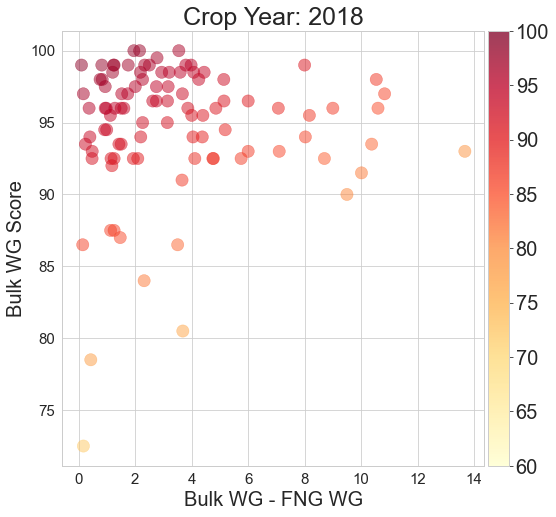

In [844]:
# Plot bulk_wg vs fng_wg
# Fixing random state for reproducibility
#np.random.seed(19680801)

N = 1000

p2 = 'fin_wg_wt_avg'
p1 = 'bulk_wg_current'
p3 = 'diff_wg'

df = dfb_ag12
yr = 2018
df_yr = df.loc[df['crop_yr'] == yr,].head(N)
#df_yr = df
df_yr = df_yr[(df_yr[p1]>70) & (df_yr[p2]>70)]
df_yr = df_yr[df_yr[p3]>0]

#x = np.random.rand(N)
x = df_yr[p3]
#y = np.random.rand(N)
y = df_yr[p1]

z = df_yr[p2]
#colors = np.random.rand(N)
area = (30 * np.random.rand(N))**2  # 0 to 15 point radii

fig, ax = plt.subplots(figsize=(8,8))
M = 8
im = plt.scatter(x, y, s=150, c=z, alpha=0.5, vmin = 60, vmax = 100, cmap = "YlOrRd")

plt.title('Crop Year: '+str(yr), fontsize = 25, loc = 'center')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlabel('Bulk WG - FNG WG', fontsize = 20)
plt.ylabel('Bulk WG Score', fontsize = 20)


# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()


In [845]:
dfb_ag08[['bulk_moisture', 'fin_moisture', 'diff_moisture', 'diff_wg']]
dfb_ag08

,crop_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,bulk_batch_nbr,fin_batch_nbr,bulk_wg_current,fin_wg_current,bulk_wg_current_dt,fin_wg_current_dt,bulk_moisture,fin_moisture,mg,bulk_drg,fin_drg,fin_total_projected_units,total_projected_units,...,Total Bin Weight,% Usable Seed,Type,Diameter,Height,Capacity,Door Slide,Bin estimates,Facility SAP,Longitude,Latitude,Vendor - Unique Key,Vendor,Year Contracted,wg_test_dt_diff,diff_wg,diff_moisture
0,2020,1285.0,8H16,2502178523,CE0SB33,CE0SB33A,98.00,95.00,2020-11-23,2020-12-24,11.5,12.0,4,1,1,80.00,4068.829943,...,3135.0,89.15,STEEL,18.00,14.0,2862.88,YES,25201,8H16,-90.050767,38.206961,8008796-8H16,8008796,2020,31,3.00,-0.5
1,2017,1778.0,8H45,103413348,MF73BC3,MF73BC3A,92.00,93.25,2017-11-08,2018-02-20,11.2,11.0,4,1,1,2800.00,4662.385680,...,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45,-89.558800,36.707200,8016125-8H45,8016125,2014,104,-1.25,0.2
2,2017,1778.0,8H45,103413348,MF73BC3,MF73BC3C,92.00,91.50,2017-11-08,2018-02-19,11.2,11.0,4,1,0,1158.80,4662.385680,...,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45,-89.558800,36.707200,8016125-8H45,8016125,2014,103,0.50,0.2
3,2020,1285.0,8H16,2502178457,CE0SD81,CE0SEA2A,99.00,96.75,2020-10-22,2021-02-12,12.8,11.1,3,1,1,800.00,9229.646301,...,10066.0,90.63,STEEL,30.00,17.5,9940.57,YES,31103,8H16,-88.984400,38.953100,8005501-8H16,8005501,2017,113,2.25,1.7
4,2020,1285.0,8H16,2502201711,CE0SAD1,CE0SAD11,99.00,97.75,2020-12-01,2021-04-14,10.4,11.2,3,1,1,240.00,45973.921692,...,50244.0,89.16,STEEL,48.00,33.5,48714.48,NO,32209,8H16,-87.521300,39.730400,8029178-8H16,8029178,2020,134,1.25,-0.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW21,90.25,85.50,2019-12-02,2020-05-22,16.3,16.1,0,0,0,234.00,9673.566876,...,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020,172,4.75,0.2
4007,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW2A,90.25,85.75,2019-12-02,2020-05-11,16.3,15.8,0,0,0,4800.00,9673.566876,...,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020,161,4.50,0.5
4008,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW2Q,90.25,85.75,2019-12-02,2020-05-23,16.3,15.8,0,0,0,1680.00,9673.566876,...,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020,173,4.50,0.5
4009,2019,1089.0,8H40,104037075,WF9SEW2,WF9SEW2Z,90.25,85.50,2019-12-02,2020-05-11,16.3,14.4,0,0,0,3380.00,9673.566876,...,NaN,89.59,STEEL,27.00,24.0,11042.56,NO,15261,8H40,-98.147065,48.989643,8013024-8H40,8013024,2020,161,4.75,1.9


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1233051739.py:52: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



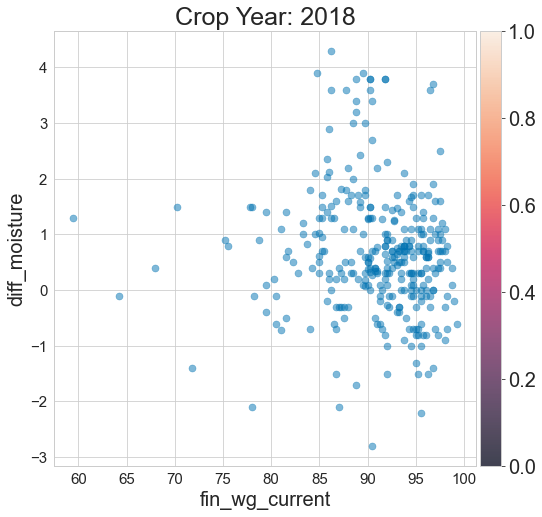

In [846]:
# Plot bulk_wg vs fng_wg
# Fixing random state for reproducibility
#np.random.seed(19680801)

N = 1000

p1 = 'bulk_wg_current'
p2 = 'fin_wg_current'
p3 = 'diff_wg'

p4 = 'bulk_moisture'
p5 = 'fin_moisture'
p6 = 'diff_moisture'
p7 = 'wg_test_dt_diff'



x_to_plot = p2
y_to_plot = p6

df = dfb_ag08
yr = 2018
df_yr = df.loc[df['crop_yr'] == yr,].head(N)
#df_yr = df
df_yr = df_yr[(df_yr[p3]>0) & (df_yr[p1]>70)]
#x = np.random.rand(N)
x = df_yr[x_to_plot]
#y = np.random.rand(N)
y = df_yr[y_to_plot]

z = df_yr[p6]
#colors = np.random.rand(N)
area = (30 * np.random.rand(N))**2  # 0 to 15 point radii

fig, ax = plt.subplots(figsize=(8,8))
M = 3
im = plt.scatter(x, y, s=50, alpha=0.5, vmin = -M, vmax = M, cmap = "bwr")

plt.title('Crop Year: '+str(yr), fontsize = 25, loc = 'center')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlabel(x_to_plot, fontsize = 20)
plt.ylabel(y_to_plot, fontsize = 20)


# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()


## Get Weather Data from big query

In [847]:
dfb_ag08.head()
#dfb_ag08.shape

,crop_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,bulk_batch_nbr,fin_batch_nbr,bulk_wg_current,fin_wg_current,bulk_wg_current_dt,fin_wg_current_dt,bulk_moisture,fin_moisture,mg,bulk_drg,fin_drg,fin_total_projected_units,total_projected_units,...,Total Bin Weight,% Usable Seed,Type,Diameter,Height,Capacity,Door Slide,Bin estimates,Facility SAP,Longitude,Latitude,Vendor - Unique Key,Vendor,Year Contracted,wg_test_dt_diff,diff_wg,diff_moisture
0,2020,1285.0,8H16,2502178523,CE0SB33,CE0SB33A,98.0,95.00,2020-11-23,2020-12-24,11.5,12.0,4,1,1,80.0,4068.829943,...,3135.0,89.15,STEEL,18.00,14.0,2862.88,YES,25201,8H16,-90.050767,38.206961,8008796-8H16,8008796,2020,31,3.00,-0.5
1,2017,1778.0,8H45,103413348,MF73BC3,MF73BC3A,92.0,93.25,2017-11-08,2018-02-20,11.2,11.0,4,1,1,2800.0,4662.385680,...,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45,-89.558800,36.707200,8016125-8H45,8016125,2014,104,-1.25,0.2
2,2017,1778.0,8H45,103413348,MF73BC3,MF73BC3C,92.0,91.50,2017-11-08,2018-02-19,11.2,11.0,4,1,0,1158.8,4662.385680,...,NaN,92.34,STEEL,23.75,17.0,6052.11,YES,21420,8H45,-89.558800,36.707200,8016125-8H45,8016125,2014,103,0.50,0.2
3,2020,1285.0,8H16,2502178457,CE0SD81,CE0SEA2A,99.0,96.75,2020-10-22,2021-02-12,12.8,11.1,3,1,1,800.0,9229.646301,...,10066.0,90.63,STEEL,30.00,17.5,9940.57,YES,31103,8H16,-88.984400,38.953100,8005501-8H16,8005501,2017,113,2.25,1.7
4,2020,1285.0,8H16,2502201711,CE0SAD1,CE0SAD11,99.0,97.75,2020-12-01,2021-04-14,10.4,11.2,3,1,1,240.0,45973.921692,...,50244.0,89.16,STEEL,48.00,33.5,48714.48,NO,32209,8H16,-87.521300,39.730400,8029178-8H16,8029178,2020,134,1.25,-0.8


In [848]:
dfb_ag30 = dfb_ag08[['bulk_batch_nbr', 'crop_yr', 'bulk_wg_current','mg','bulk_drg','fin_drg', 'fin_total_projected_units',
 'total_projected_units','fin_wg_current', 'fin_batch_nbr', 'bulk_wg_current_dt', 'fin_wg_current_dt', 'Longitude', 'Latitude']]
dfb_ag30

,bulk_batch_nbr,crop_yr,bulk_wg_current,mg,bulk_drg,fin_drg,fin_total_projected_units,total_projected_units,fin_wg_current,fin_batch_nbr,bulk_wg_current_dt,fin_wg_current_dt,Longitude,Latitude
0,CE0SB33,2020,98.00,4,1,1,80.00,4068.829943,95.00,CE0SB33A,2020-11-23,2020-12-24,-90.050767,38.206961
1,MF73BC3,2017,92.00,4,1,1,2800.00,4662.385680,93.25,MF73BC3A,2017-11-08,2018-02-20,-89.558800,36.707200
2,MF73BC3,2017,92.00,4,1,0,1158.80,4662.385680,91.50,MF73BC3C,2017-11-08,2018-02-19,-89.558800,36.707200
3,CE0SD81,2020,99.00,3,1,1,800.00,9229.646301,96.75,CE0SEA2A,2020-10-22,2021-02-12,-88.984400,38.953100
4,CE0SAD1,2020,99.00,3,1,1,240.00,45973.921692,97.75,CE0SAD11,2020-12-01,2021-04-14,-87.521300,39.730400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,WF9SEW2,2019,90.25,0,0,0,234.00,9673.566876,85.50,WF9SEW21,2019-12-02,2020-05-22,-98.147065,48.989643
4007,WF9SEW2,2019,90.25,0,0,0,4800.00,9673.566876,85.75,WF9SEW2A,2019-12-02,2020-05-11,-98.147065,48.989643
4008,WF9SEW2,2019,90.25,0,0,0,1680.00,9673.566876,85.75,WF9SEW2Q,2019-12-02,2020-05-23,-98.147065,48.989643
4009,WF9SEW2,2019,90.25,0,0,0,3380.00,9673.566876,85.50,WF9SEW2Z,2019-12-02,2020-05-11,-98.147065,48.989643


In [849]:
dfb_ag30[['crop_yr','bulk_batch_nbr', 'fin_batch_nbr', 'bulk_drg','fin_drg', 'bulk_wg_current_dt','fin_wg_current_dt', 'Longitude', 'Latitude']]

,crop_yr,bulk_batch_nbr,fin_batch_nbr,bulk_drg,fin_drg,bulk_wg_current_dt,fin_wg_current_dt,Longitude,Latitude
0,2020,CE0SB33,CE0SB33A,1,1,2020-11-23,2020-12-24,-90.050767,38.206961
1,2017,MF73BC3,MF73BC3A,1,1,2017-11-08,2018-02-20,-89.558800,36.707200
2,2017,MF73BC3,MF73BC3C,1,0,2017-11-08,2018-02-19,-89.558800,36.707200
3,2020,CE0SD81,CE0SEA2A,1,1,2020-10-22,2021-02-12,-88.984400,38.953100
4,2020,CE0SAD1,CE0SAD11,1,1,2020-12-01,2021-04-14,-87.521300,39.730400
...,...,...,...,...,...,...,...,...,...
4006,2019,WF9SEW2,WF9SEW21,0,0,2019-12-02,2020-05-22,-98.147065,48.989643
4007,2019,WF9SEW2,WF9SEW2A,0,0,2019-12-02,2020-05-11,-98.147065,48.989643
4008,2019,WF9SEW2,WF9SEW2Q,0,0,2019-12-02,2020-05-23,-98.147065,48.989643
4009,2019,WF9SEW2,WF9SEW2Z,0,0,2019-12-02,2020-05-11,-98.147065,48.989643


In [850]:
dfb_ag30.groupby('bulk_batch_nbr')[['bulk_wg_current_dt','fin_wg_current_dt', 'Longitude', 'Latitude']].max()

,bulk_wg_current_dt,fin_wg_current_dt,Longitude,Latitude
bulk_batch_nbr,,,,
AS0SA71,2020-11-12,2021-01-21,-97.670510,47.889366
AS0SAK1,2020-10-26,2021-04-19,-88.875675,42.087415
AS0SAR1,2020-10-30,2021-01-12,-88.490390,41.129340
AS0SAZ1,2020-10-28,2021-05-13,-88.371085,41.155066
AS0SB51,2020-11-17,2021-05-03,-89.366990,41.517670
...,...,...,...,...
WN0SFA1,2020-10-05,2020-11-19,-87.038025,40.575605
WN0SGD1,2020-10-28,2021-01-25,-86.136950,39.419044
WN1SAB1,2021-11-01,2022-04-19,-85.823607,40.338694


In [851]:
temp = dfb_ag30.groupby('fin_batch_nbr').count().sort_values('bulk_batch_nbr').reset_index()
temp2 = temp.loc[temp['bulk_batch_nbr'] == 1, 'fin_batch_nbr']
temp3 = dfb_ag30.loc[dfb_ag30['fin_batch_nbr'].isin(temp2),].reset_index()
dfb_ag32 = temp3
dfb_ag32

,index,bulk_batch_nbr,crop_yr,bulk_wg_current,mg,bulk_drg,fin_drg,fin_total_projected_units,total_projected_units,fin_wg_current,fin_batch_nbr,bulk_wg_current_dt,fin_wg_current_dt,Longitude,Latitude
0,0,CE0SB33,2020,98.00,4,1,1,80.00,4068.829943,95.00,CE0SB33A,2020-11-23,2020-12-24,-90.050767,38.206961
1,1,MF73BC3,2017,92.00,4,1,1,2800.00,4662.385680,93.25,MF73BC3A,2017-11-08,2018-02-20,-89.558800,36.707200
2,2,MF73BC3,2017,92.00,4,1,0,1158.80,4662.385680,91.50,MF73BC3C,2017-11-08,2018-02-19,-89.558800,36.707200
3,3,CE0SD81,2020,99.00,3,1,1,800.00,9229.646301,96.75,CE0SEA2A,2020-10-22,2021-02-12,-88.984400,38.953100
4,4,CE0SAD1,2020,99.00,3,1,1,240.00,45973.921692,97.75,CE0SAD11,2020-12-01,2021-04-14,-87.521300,39.730400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3130,4006,WF9SEW2,2019,90.25,0,0,0,234.00,9673.566876,85.50,WF9SEW21,2019-12-02,2020-05-22,-98.147065,48.989643
3131,4007,WF9SEW2,2019,90.25,0,0,0,4800.00,9673.566876,85.75,WF9SEW2A,2019-12-02,2020-05-11,-98.147065,48.989643
3132,4008,WF9SEW2,2019,90.25,0,0,0,1680.00,9673.566876,85.75,WF9SEW2Q,2019-12-02,2020-05-23,-98.147065,48.989643
3133,4009,WF9SEW2,2019,90.25,0,0,0,3380.00,9673.566876,85.50,WF9SEW2Z,2019-12-02,2020-05-11,-98.147065,48.989643


In [852]:
temp3.groupby('bulk_batch_nbr')[['crop_yr', 'bulk_wg_current', 'mg', 'bulk_drg','bulk_wg_current_dt','fin_wg_current_dt', 'Longitude', 'Latitude']].max().to_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_weather_prep.csv', encoding='utf-8')

In [853]:
dfb_ag31 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_weather_prep.csv')
dfb_ag31

,bulk_batch_nbr,crop_yr,bulk_wg_current,mg,bulk_drg,bulk_wg_current_dt,fin_wg_current_dt,Longitude,Latitude
0,AS0SA71,2020,99.5,3,1,2020-11-12,2021-01-21,-97.670510,47.889366
1,AS0SAK1,2020,99.5,2,1,2020-10-26,2021-04-19,-88.875675,42.087415
2,AS0SAR1,2020,97.0,2,1,2020-10-30,2021-01-12,-88.490390,41.129340
3,AS0SAZ1,2020,98.5,3,1,2020-10-28,2021-05-13,-88.371085,41.155066
4,AS0SB51,2020,99.5,2,1,2020-11-17,2021-05-03,-89.366990,41.517670
...,...,...,...,...,...,...,...,...,...
863,WN0SFA1,2020,99.5,2,1,2020-10-05,2020-11-19,-87.038025,40.575605
864,WN0SGD1,2020,99.0,3,1,2020-10-28,2021-01-25,-86.136950,39.419044
865,WN1SAB1,2021,96.5,2,1,2021-11-01,2022-04-19,-85.823607,40.338694
866,WN1SAD1,2021,96.0,2,1,2021-11-01,2021-11-16,-85.964611,40.592761


In [854]:
era5_info = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_weather_era5_metric_10172022.csv', encoding='utf-8')

In [855]:
era5_info.groupby('bulk_batch_nbr').count()

,Unnamed: 0,grid_id,date,avg_dew_point_temperature,total_precipitation,avg_wind_speed,avg_wind_direction,avg_relative_humidity,total_downward_solar_radiation,total_net_solar_radiation,avg_atmospheric_pressure,avg_snow_depth,min_temperature,max_temperature
bulk_batch_nbr,,,,,,,,,,,,,,
AS0SA71,71,71,71,71,71,71,71,71,71,71,71,71,71,71
AS0SAK1,176,176,176,176,176,176,176,176,176,176,176,176,176,176
AS0SAR1,75,75,75,75,75,75,75,75,75,75,75,75,75,75
AS0SAZ1,198,198,198,198,198,198,198,198,198,198,198,198,198,198
AS0SB51,168,168,168,168,168,168,168,168,168,168,168,168,168,168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WN0SFA1,46,46,46,46,46,46,46,46,46,46,46,46,46,46
WN0SGD1,90,90,90,90,90,90,90,90,90,90,90,90,90,90
WN1SAB1,166,166,166,166,165,166,166,166,165,165,166,166,166,166


In [856]:
dfb_ag31.dtypes

bulk_batch_nbr         object
crop_yr                 int64
bulk_wg_current       float64
mg                      int64
bulk_drg                int64
bulk_wg_current_dt     object
fin_wg_current_dt      object
Longitude             float64
Latitude              float64
dtype: object

In [857]:
df_new = era5_info
df_new['date'] = pd.to_datetime(df_new['date'])
df_new.dtypes

Unnamed: 0                                 int64
grid_id                                    int64
date                              datetime64[ns]
avg_dew_point_temperature                float64
total_precipitation                      float64
avg_wind_speed                           float64
avg_wind_direction                       float64
avg_relative_humidity                    float64
total_downward_solar_radiation           float64
total_net_solar_radiation                float64
avg_atmospheric_pressure                 float64
avg_snow_depth                           float64
min_temperature                          float64
max_temperature                          float64
bulk_batch_nbr                            object
dtype: object

In [858]:
dfb_ag32.loc[13,'bulk_batch_nbr']

'MF03FK1'

In [859]:
pd.options.mode.chained_assignment = None  # default='warn'
dfb = dfb_ag32
df = pd.DataFrame()
df = dfb
dfe = era5_info
dfe['date'] = pd.to_datetime(dfe['date'])

l = dfb.shape[0]
#l = 14
for i in range(l):
    bulk = df.loc[i,'bulk_batch_nbr']
    dt1 = df.loc[i,'bulk_wg_current_dt']
    dt2 = df.loc[i,'fin_wg_current_dt']

    dfe_sl = dfe.loc[(dfe.bulk_batch_nbr == bulk)&(dfe.date>=dt1)&(dfe.date<=dt2),]
    df.loc[i, 'avg_dew_point_temp'] = dfe_sl.loc[:,'avg_dew_point_temperature'].mean()
    df.loc[i, 'avg_wind_speed'] = dfe_sl.avg_wind_speed.mean()
    df.loc[i, 'avg_wind_direction'] = dfe_sl.avg_wind_direction.mean()
    df.loc[i, 'total_downward_solar_radiation'] = dfe_sl.total_downward_solar_radiation.mean()
    df.loc[i, 'total_net_solar_radiation'] = dfe_sl.total_net_solar_radiation.mean()
    df.loc[i, 'avg_snow_depth'] = dfe_sl.avg_snow_depth.mean()
    df.loc[i, 'total_precipitation'] = dfe_sl.total_precipitation.sum()
    df.loc[i, 'avg_relative_humidity'] = dfe_sl.avg_relative_humidity.mean()
    df.loc[i, 'min_temp'] = dfe_sl.min_temperature.mean()
    df.loc[i, 'max_temp'] = dfe_sl.max_temperature.mean()
    df.loc[i, 'days_in_bin'] = dfe_sl.shape[0]
    df.loc[i, 'days_max_temp_above_30'] = dfe_sl[dfe_sl.max_temperature>=30].shape[0]
    df.loc[i, 'days_min_temp_below_0'] = dfe_sl[dfe_sl.min_temperature<=0].shape[0]

df.to_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv', encoding='utf-8')
df

,index,bulk_batch_nbr,crop_yr,bulk_wg_current,mg,bulk_drg,fin_drg,fin_total_projected_units,total_projected_units,fin_wg_current,fin_batch_nbr,bulk_wg_current_dt,fin_wg_current_dt,Longitude,Latitude,avg_dew_point_temp,avg_wind_speed,avg_wind_direction,total_downward_solar_radiation,total_net_solar_radiation,avg_snow_depth,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_in_bin,days_max_temp_above_30,days_min_temp_below_0
0,0,CE0SB33,2020,98.00,4,1,1,80.00,4068.829943,95.00,CE0SB33A,2020-11-23,2020-12-24,-90.050767,38.206961,-0.787500,11.084375,221.468750,7.804000,6.560750,0.000000,43.7,70.034375,0.087500,9.431250,32.0,0.0,18.0
1,1,MF73BC3,2017,92.00,4,1,1,2800.00,4662.385680,93.25,MF73BC3A,2017-11-08,2018-02-20,-89.558800,36.707200,-1.828571,12.712381,182.409524,9.132343,7.731657,0.000190,235.8,67.380000,-1.012381,9.000952,105.0,0.0,57.0
2,2,MF73BC3,2017,92.00,4,1,0,1158.80,4662.385680,91.50,MF73BC3C,2017-11-08,2018-02-19,-89.558800,36.707200,-2.001923,12.590385,182.394231,9.124769,7.724058,0.000192,229.8,67.331731,-1.205769,8.857692,104.0,0.0,57.0
3,3,CE0SD81,2020,99.00,3,1,1,800.00,9229.646301,96.75,CE0SEA2A,2020-10-22,2021-02-12,-88.984400,38.953100,-1.649123,12.754386,206.508772,7.866912,6.558781,0.000175,315.2,70.226316,-0.334211,7.707895,114.0,0.0,66.0
4,4,CE0SAD1,2020,99.00,3,1,1,240.00,45973.921692,97.75,CE0SAD11,2020-12-01,2021-04-14,-87.521300,39.730400,-2.762222,13.773333,195.600000,10.910015,8.601104,0.001333,322.8,68.737778,-1.340000,7.214074,135.0,0.0,87.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3130,4006,WF9SEW2,2019,90.25,0,0,0,234.00,9673.566876,85.50,WF9SEW21,2019-12-02,2020-05-22,-98.147065,48.989643,-9.553757,15.671676,228.005780,12.394139,7.869960,0.011156,144.7,73.844509,-10.186127,-0.765896,173.0,0.0,150.0
3131,4007,WF9SEW2,2019,90.25,0,0,0,4800.00,9673.566876,85.75,WF9SEW2A,2019-12-02,2020-05-11,-98.147065,48.989643,-10.540123,15.666049,230.604938,11.640364,7.054512,0.011914,136.0,74.626543,-11.341358,-2.079630,162.0,0.0,149.0
3132,4008,WF9SEW2,2019,90.25,0,0,0,1680.00,9673.566876,85.75,WF9SEW2Q,2019-12-02,2020-05-23,-98.147065,48.989643,-9.419540,15.655172,227.689655,12.459437,7.939810,0.011092,148.4,73.839080,-10.045977,-0.613793,174.0,0.0,150.0
3133,4009,WF9SEW2,2019,90.25,0,0,0,3380.00,9673.566876,85.50,WF9SEW2Z,2019-12-02,2020-05-11,-98.147065,48.989643,-10.540123,15.666049,230.604938,11.640364,7.054512,0.011914,136.0,74.626543,-11.341358,-2.079630,162.0,0.0,149.0


In [860]:
df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
corr_name = [
# 'bulk_wg_current',
 'Longitude',
 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
 'avg_wind_direction',
 'total_downward_solar_radiation',
 'total_net_solar_radiation',
 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_in_bin',
 'days_max_temp_above_30',
 'days_min_temp_below_0',
 'fin_drg',
# 'bulk_drg'
        ]
dataset = df1[corr_name].dropna()
dataset.shape



(3100, 16)

In [861]:
X = dataset.iloc[:, 0:15].values
y = dataset.iloc[:, 15].values

In [862]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Feature Scaling
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=20, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)



In [863]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

y_pred = y_pred.round()

print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(accuracy_score(y_test, y_pred))

[[ 48  50]
 [ 13 509]]
              precision    recall  f1-score   support

           0       0.79      0.49      0.60        98
           1       0.91      0.98      0.94       522

    accuracy                           0.90       620
   macro avg       0.85      0.73      0.77       620
weighted avg       0.89      0.90      0.89       620

0.8983870967741936


              precision    recall  f1-score   support

           0       0.78      0.63      0.70        86
           1       0.94      0.97      0.96       534

    accuracy                           0.92       620
   macro avg       0.86      0.80      0.83       620
weighted avg       0.92      0.92      0.92       620

Overall accuracy score is: 0.924
Matthew's coeffecient is: 0.659



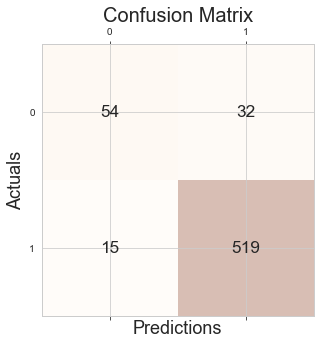

In [864]:
df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
corr_name = [
 'Longitude',
 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
 'avg_wind_direction',
 'total_downward_solar_radiation',
 'total_net_solar_radiation',
 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_in_bin',
# 'days_max_temp_above_30',
 'days_min_temp_below_0',
# 'bulk_drg',    
#    'fin_total_projected_units',
    'fin_drg',
#    'crop_yr',
#    'total_projected_units',


]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
#print(l)
# Using classifier instead of regressor

#l = 15
X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import matthews_corrcoef

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

#print(confusion_matrix(y_test,y_forest_pred))
print(classification_report(y_test,y_forest_pred))
print('Overall accuracy score is: ' + str(round(accuracy_score(y_test, y_forest_pred),3)))

#calculate Matthews correlation coefficient

print("Matthew's coeffecient is: " + str(round(matthews_corrcoef(y_test,y_forest_pred),3)))
print()

# Print the confusion matrix
cmx = confusion_matrix(y_test,y_forest_pred)
fig, ax = plt.subplots(figsize = (5,5))
ax.matshow(cmx, cmap = plt.cm.Oranges, alpha = 0.3)
for i in range(cmx.shape[0]):
    for j in range(cmx.shape[1]):
        ax.text(x=j, y=i, s=cmx[i,j], va='center', ha='center', size='xx-large')
plt.xlabel('Predictions', fontsize = 18)
plt.ylabel('Actuals', fontsize = 18)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()

In [865]:

# evaluate random forest algorithm for classification
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
# define dataset
X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
#X, y = make_classification(n_samples=1000, n_features=20, n_informative=15, n_redundant=5, random_state=3)
# define the model
model = RandomForestClassifier(random_state = 20)
# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))


Accuracy: 0.912 (0.015)


Elapsed time to compute the importances: 2.394 seconds


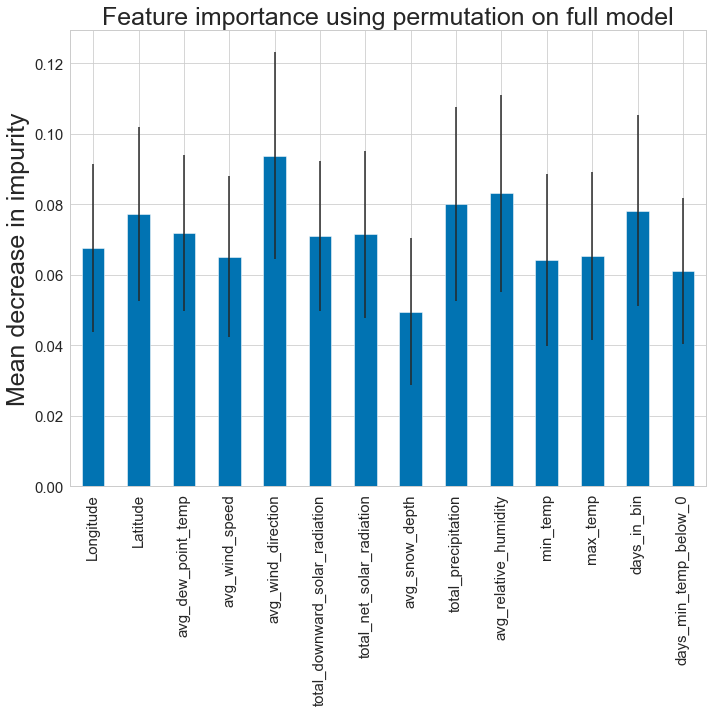

In [866]:
# Feature importance based on feature permutation
import time
from sklearn.inspection import permutation_importance
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names)

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.bar(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
fig.tight_layout()


In [867]:
from pprint import pprint

# Look at parameters used 
forest = RandomForestClassifier(random_state=0)

print('Parameters currently in use: \n')
pprint(forest.get_params())

Parameters currently in use: 

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


In [868]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 4)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 100, num = 3)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid:
random_grid = {'n_estimators': n_estimators,
      'max_features': max_features,
      'max_depth': max_depth,
      'min_samples_split': min_samples_split,
      'min_samples_leaf': min_samples_leaf,
      'bootstrap': bootstrap     
     }

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 55, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [50, 200, 350, 500]}


In [869]:
# use the random grid to search for best hyperparameters
forest = RandomForestClassifier()

# Random search of parameters, using 3 fold cross validation search across 100 different combinations, and use all available cores

forest_random = RandomizedSearchCV(estimator = forest, param_distributions = random_grid, n_iter = 100, cv = 3, verbose = 2, random_state = 0, n_jobs = -1)

forest_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 55, 100, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 200, 350, 500]},
                   random_state=0, verbose=2)

In [870]:
forest_random.best_params_

{'n_estimators': 500,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 55,
 'bootstrap': True}

[[ 53  33]
 [ 14 520]]
              precision    recall  f1-score   support

           0       0.79      0.62      0.69        86
           1       0.94      0.97      0.96       534

    accuracy                           0.92       620
   macro avg       0.87      0.80      0.82       620
weighted avg       0.92      0.92      0.92       620

0.9241935483870968


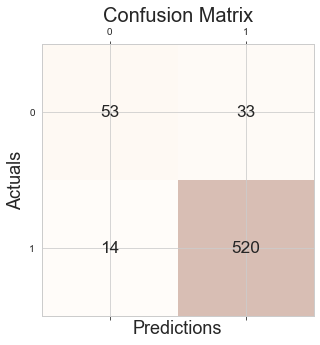

In [871]:
forest_best = forest_random.best_estimator_
# forest_best = RandomForestClassifier(n_estimators=50,
#  min_samples_split=10,
#  min_samples_leaf=1,
#  max_features='auto',
#  max_depth=None,
#  bootstrap=True,
#  random_state=10)
forest_best.fit(X_train, y_train)
y_forest_pred = forest_best.predict(X_test)

print(confusion_matrix(y_test,y_forest_pred))
print(classification_report(y_test,y_forest_pred))
print(accuracy_score(y_test, y_forest_pred))


# Print the confusion matrix
cmx = confusion_matrix(y_test,y_forest_pred)
fig, ax = plt.subplots(figsize = (5,5))
ax.matshow(cmx, cmap = plt.cm.Oranges, alpha = 0.3)
for i in range(cmx.shape[0]):
    for j in range(cmx.shape[1]):
        ax.text(x=j, y=i, s=cmx[i,j], va='center', ha='center', size='xx-large')
plt.xlabel('Predictions', fontsize = 18)
plt.ylabel('Actuals', fontsize = 18)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()




[[ 57  29]
 [ 14 520]]
              precision    recall  f1-score   support

           0       0.80      0.66      0.73        86
           1       0.95      0.97      0.96       534

    accuracy                           0.93       620
   macro avg       0.87      0.82      0.84       620
weighted avg       0.93      0.93      0.93       620

0.9306451612903226


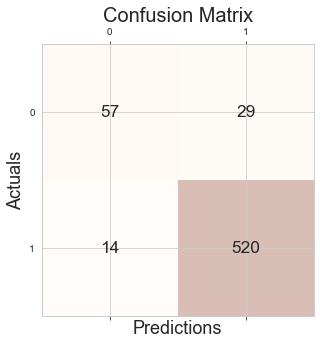

In [872]:
forest = RandomForestClassifier(random_state=10)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

print(confusion_matrix(y_test,y_forest_pred))
print(classification_report(y_test,y_forest_pred))
print(accuracy_score(y_test, y_forest_pred))


# Print the confusion matrix
cmx = confusion_matrix(y_test,y_forest_pred)
fig, ax = plt.subplots(figsize = (5,5))
ax.matshow(cmx, cmap = plt.cm.Oranges, alpha = 0.3)
for i in range(cmx.shape[0]):
    for j in range(cmx.shape[1]):
        ax.text(x=j, y=i, s=cmx[i,j], va='center', ha='center', size='xx-large')
plt.xlabel('Predictions', fontsize = 18)
plt.ylabel('Actuals', fontsize = 18)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()

              precision    recall  f1-score   support

           0       0.76      0.63      0.69        86
           1       0.94      0.97      0.95       534

    accuracy                           0.92       620
   macro avg       0.85      0.80      0.82       620
weighted avg       0.92      0.92      0.92       620

Overall accuracy score is: 0.921
Matthew's coeffecient is: 0.647



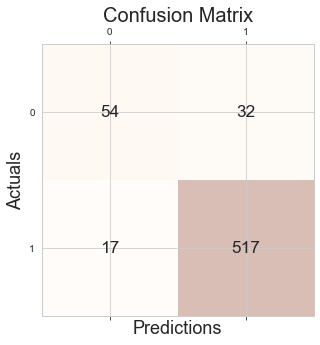

In [873]:
df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
corr_name = [
 'avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
 'total_net_solar_radiation',
 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_in_bin',
# 'days_max_temp_above_30',
 'days_min_temp_below_0',
 'bulk_drg',    
#    'fin_total_projected_units',
    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
#print(l)
# Using classifier instead of regressor

#l = 15
X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import matthews_corrcoef

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

#print(confusion_matrix(y_test,y_forest_pred))
print(classification_report(y_test,y_forest_pred))
print('Overall accuracy score is: ' + str(round(accuracy_score(y_test, y_forest_pred),3)))

#calculate Matthews correlation coefficient

print("Matthew's coeffecient is: " + str(round(matthews_corrcoef(y_test,y_forest_pred),3)))
print()

# Print the confusion matrix
cmx = confusion_matrix(y_test,y_forest_pred)
fig, ax = plt.subplots(figsize = (5,5))
ax.matshow(cmx, cmap = plt.cm.Oranges, alpha = 0.3)
for i in range(cmx.shape[0]):
    for j in range(cmx.shape[1]):
        ax.text(x=j, y=i, s=cmx[i,j], va='center', ha='center', size='xx-large')
plt.xlabel('Predictions', fontsize = 18)
plt.ylabel('Actuals', fontsize = 18)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()

In [874]:
# Feature importance based on feature permutation

# from sklearn.inspection import permutation_importance
# feature_names = list(dataset.iloc[:,0:l])
# importances = forest.feature_importances_
# std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

# start_time = time.time()
# result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
# elapsed_time = time.time() - start_time
# print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

# forest_importances = pd.Series(importances, index = feature_names).sort_values()

# fig, ax = plt.subplots(figsize =(10,10))
# forest_importances.plot.bar(yerr = std, ax = ax)
# ax.set_title("Feature importance using permutation on full model", fontsize = 25)
# ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

# plt.xticks(fontsize = 15)
# plt.yticks(fontsize = 15)
# fig.tight_layout()

In [875]:
# dfb_ag08 = dfb_ag08.loc[:,~dfb_ag08.columns.duplicated()].copy()

# corr_name = ['diff_wg'
#              , 'bulk_wg_current','fin_wg_current'
#              ,'wg_test_dt_diff'
#               ,'bulk_moisture','fin_moisture','diff_moisture'
#               ,'mg'
#               ,'Diameter','Height'
#               ,'Longitude','Latitude'
#              ,'Total Bin Weight'
#              ,'% Usable Seed', 'Capacity', 'Bin estimates'
#              ,'Type','Door Slide', 'Facility SAP'
#                         ]
df = df1[corr_name].dropna()
#df = dfb_ag08[corr_name]

corr = df.corr()
#corr.style.background_gradient(cmap='coolwarm').set_precision(3)
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(null_color='#f1f1f1')  # Color NaNs grey
 .set_precision(3))

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/124833718.py:22: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,avg_dew_point_temp,avg_wind_speed,total_downward_solar_radiation,total_net_solar_radiation,avg_snow_depth,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_in_bin,days_min_temp_below_0,bulk_drg,fin_drg
avg_dew_point_temp,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
avg_wind_speed,-0.302,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
total_downward_solar_radiation,0.325,-0.035,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
total_net_solar_radiation,0.638,-0.274,0.854,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
avg_snow_depth,-0.553,0.293,-0.063,-0.465,nan,nan,nan,nan,nan,nan,nan,nan,nan
total_precipitation,0.371,-0.134,0.557,0.583,-0.172,nan,nan,nan,nan,nan,nan,nan,nan
avg_relative_humidity,-0.477,0.173,-0.514,-0.746,0.560,-0.228,nan,nan,nan,nan,nan,nan,nan
min_temp,0.990,-0.302,0.361,0.687,-0.594,0.392,-0.573,nan,nan,nan,nan,nan,nan
max_temp,0.975,-0.293,0.414,0.729,-0.595,0.349,-0.643,0.984,nan,nan,nan,nan,nan
days_in_bin,-0.147,0.168,0.555,0.351,0.151,0.702,-0.079,-0.114,-0.121,nan,nan,nan,nan


              precision    recall  f1-score   support

           0       0.78      0.60      0.68        86
           1       0.94      0.97      0.95       534

    accuracy                           0.92       620
   macro avg       0.86      0.79      0.82       620
weighted avg       0.92      0.92      0.92       620

Overall accuracy score is: 0.921
Matthew's coeffecient is: 0.642



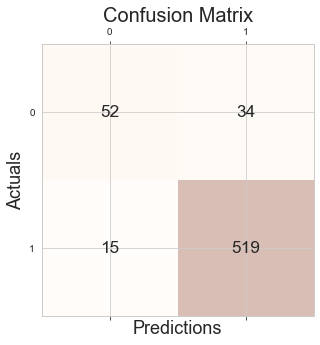

[CV] END bootstrap=False, max_depth=55, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=350; total time=   1.3s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=350; total time=   1.3s
[CV] END bootstrap=True, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   1.5s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.6s
[CV] END bootstrap=False, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   2.0s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END bootstrap=False, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=350; total time=   1.4s
[CV] END bootstrap=False, max_depth=

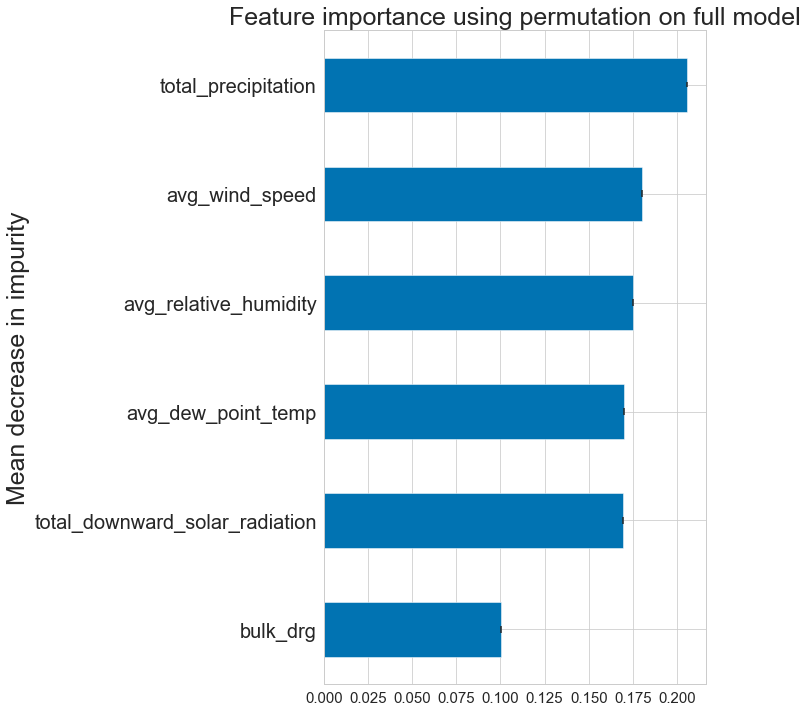

In [876]:
# Remove Longitude and Latitude from the model
df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
corr_name = [
# 'Longitude',
# 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
# 'min_temp',
# 'max_temp',
# 'days_in_bin',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
 'bulk_drg',    
#    'fin_total_projected_units',
    'fin_drg',
#    'crop_yr',
#    'total_projected_units',


]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
#print(l)
# Using classifier instead of regressor

#l = 15
X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import matthews_corrcoef

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

#print(confusion_matrix(y_test,y_forest_pred))
print(classification_report(y_test,y_forest_pred))
print('Overall accuracy score is: ' + str(round(accuracy_score(y_test, y_forest_pred),3)))

#calculate Matthews correlation coefficient

print("Matthew's coeffecient is: " + str(round(matthews_corrcoef(y_test,y_forest_pred),3)))
print()

# Print the confusion matrix
cmx = confusion_matrix(y_test,y_forest_pred)
fig, ax = plt.subplots(figsize = (5,5))
ax.matshow(cmx, cmap = plt.cm.Oranges, alpha = 0.3)
for i in range(cmx.shape[0]):
    for j in range(cmx.shape[1]):
        ax.text(x=j, y=i, s=cmx[i,j], va='center', ha='center', size='xx-large')
plt.xlabel('Predictions', fontsize = 18)
plt.ylabel('Actuals', fontsize = 18)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()


# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.barh(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 20)
fig.tight_layout()

              precision    recall  f1-score   support

           0       0.80      0.62      0.70        86
           1       0.94      0.98      0.96       534

    accuracy                           0.93       620
   macro avg       0.87      0.80      0.83       620
weighted avg       0.92      0.93      0.92       620

Overall accuracy score is: 0.926
Matthew's coeffecient is: 0.663



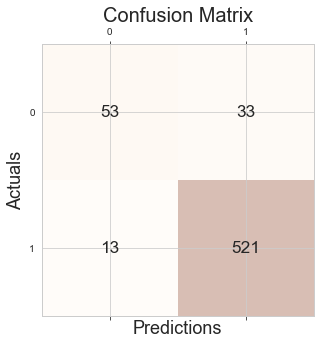

Elapsed time to compute the importances: 0.442 seconds


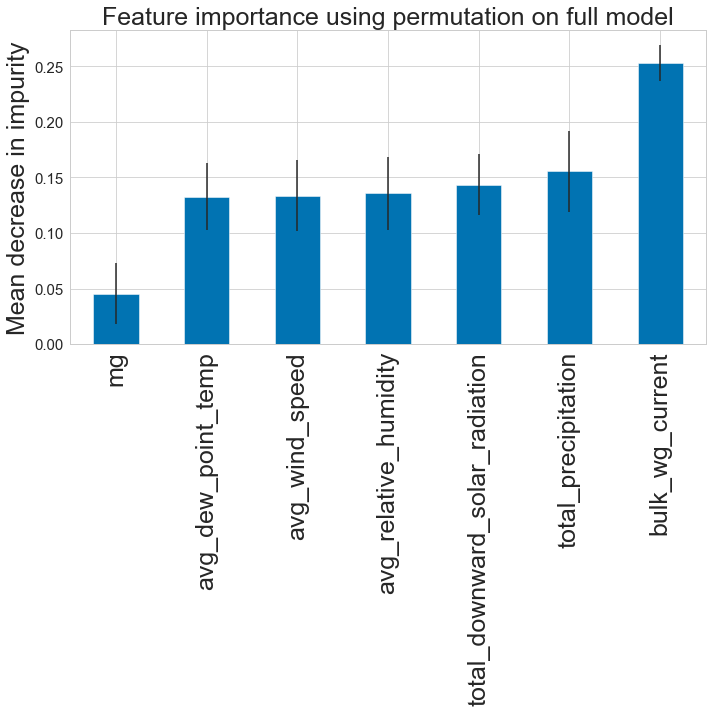

In [877]:
# Use bulk_wg_current and mg to replace bulk_drg
df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
corr_name = [
# 'Longitude',
# 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
# 'min_temp',
# 'max_temp',
# 'days_in_bin',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
  'bulk_wg_current',
    'mg',
#    'fin_total_projected_units',
    'fin_drg',
#    'crop_yr',
#    'total_projected_units',


]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
#print(l)
# Using classifier instead of regressor

#l = 15
X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9)

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import matthews_corrcoef

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

#print(confusion_matrix(y_test,y_forest_pred))
print(classification_report(y_test,y_forest_pred))
print('Overall accuracy score is: ' + str(round(accuracy_score(y_test, y_forest_pred),3)))

#calculate Matthews correlation coefficient

print("Matthew's coeffecient is: " + str(round(matthews_corrcoef(y_test,y_forest_pred),3)))
print()

# Print the confusion matrix
cmx = confusion_matrix(y_test,y_forest_pred)
fig, ax = plt.subplots(figsize = (5,5))
ax.matshow(cmx, cmap = plt.cm.Oranges, alpha = 0.3)
for i in range(cmx.shape[0]):
    for j in range(cmx.shape[1]):
        ax.text(x=j, y=i, s=cmx[i,j], va='center', ha='center', size='xx-large')
plt.xlabel('Predictions', fontsize = 18)
plt.ylabel('Actuals', fontsize = 18)
plt.title('Confusion Matrix', fontsize = 20)
plt.show()


# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.bar(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 15)
fig.tight_layout()

In [878]:
corr_name = [
# 'Longitude',
# 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
# 'min_temp',
# 'max_temp',
# 'days_in_bin',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
  'bulk_wg_current',
    'mg',
#    'fin_total_projected_units',
    'fin_drg',
    'crop_yr',
#    'total_projected_units',


]
dataset = df1[corr_name].dropna()
yrloc = dataset.groupby(['fin_drg','crop_yr'])['mg'].count().reset_index()
yrloc.columns = ['bulk_drg','crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
yy

,bulk_drg_x,crop_yr,SSU_x,bulk_drg_y,SSU_y
0,1,2014,90,0.0,0.0
1,1,2015,224,0.0,33.0
2,1,2016,493,0.0,44.0
3,1,2017,531,0.0,97.0
4,1,2018,290,0.0,189.0
5,1,2019,447,0.0,23.0
6,1,2020,546,0.0,54.0
7,1,2021,37,0.0,2.0


2658
442.0


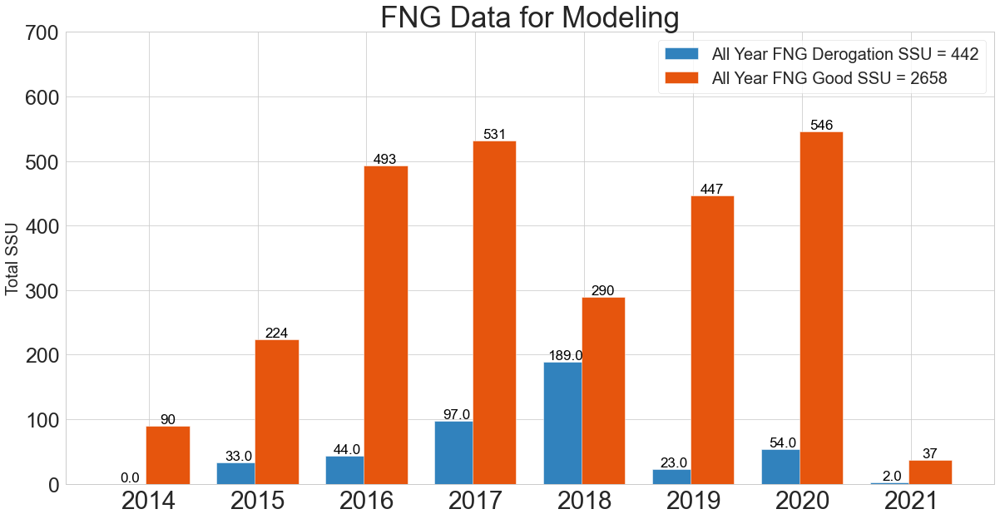

In [879]:

N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)

fail_d = tuple(yy.SSU_y.values)
fail_pct = tuple((yy.SSU_x/(yy.SSU_y + yy.SSU_x)).values)
fail_pct = ["{:.1%}".format(a) for a in fail_pct]
ind = np.arange(2014,2022)

fig, ax = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-0.175, fail_d, width, color = cmap(0))
#p2 = plt.bar(ind-0.175, pass_d, width, color = cmap(4), bottom = fail_d)

p3 = plt.bar(ind+0.175, pass_d, width, color = cmap(4))
# p4 = plt.bar(ind+0.175, pass_d2, width, color = cmap(5), bottom = fail_d2)

#fail_d = ["{:.0%}".format(a) for a in fail_d]
ax.bar_label(p1, labels = fail_d, padding = -0, color = 'black', fontsize = 17)

ax.bar_label(p3, labels = pass_d, padding = -0, color = 'black', fontsize = 17)


width = 0.35
plt.xticks(ind, tuple(ind), fontsize = 30)
plt.yticks(fontsize = 20)
plt.legend(labels = [
                    #    'Bulk Derogation'
                    # , 'Bulk Passed'
                      'All Year FNG Derogation SSU = 442'
                     , 'All Year FNG Good SSU = 2658'
                    ], fontsize = 20)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('FNG Data for Modeling', fontsize = 35)


plt.yticks(np.arange(0,800,100), fontsize = 25)
#ax.yaxis.set_major_formatter(formatter)
print(yy.SSU_x.sum())
print(yy.SSU_y.sum())


plt.show()

# Derogation Bad Year Detection Analysis

In [880]:
#dfr_a02 merge with dbr_a02 to get all fin_prcs_ord_nbr, M:N relationship
#dfr_a03 and dbr_a03, M:N relationship

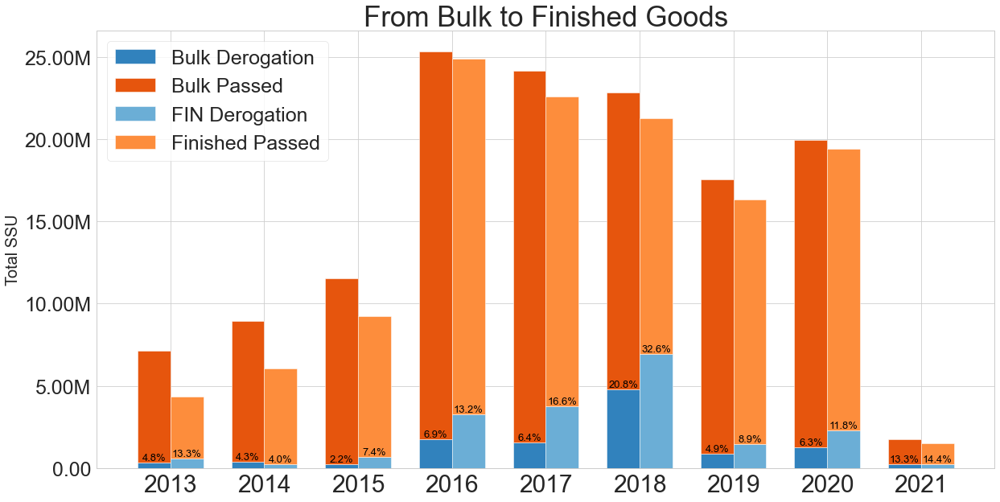

In [881]:
ind = np.arange(2013,2022)
width = 0.35

yrprep = dbr_a03.drop_duplicates(subset = ['batch_nbr'], keep = 'first')
yrloc = yrprep.groupby(['bulk_drg','crop_yr'])['total_bu'].sum().reset_index()
yrloc.columns = ['bulk_drg', 'crop_yr', 'SSU']
y0 = yrloc[yrloc.bulk_drg == 0]
y1 = yrloc[yrloc.bulk_drg == 1]
yy = y1.merge(y0, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy.iloc[:,1]))
pass_d = tuple(yy.SSU_x.values)
fail_d = tuple(yy.SSU_y.values)
fail_pct = tuple((yy.SSU_y/(yy.SSU_x + yy.SSU_y)).values)
fail_pct = ["{:.1%}".format(a) for a in fail_pct]

# print(yy.SSU_y/(yy.SSU_y+yy.SSU_x))

yrloc2 = dfr_a03.groupby(['fin_drg','crop_yr'])['fin_total_projected_units'].sum().reset_index()
yrloc2.columns = ['fin_drg', 'crop_yr', 'SSU']
y20 = yrloc2[yrloc2.fin_drg == 0]
y21 = yrloc2[yrloc2.fin_drg == 1]
yy2 = y21.merge(y20, how = 'outer', on = 'crop_yr').fillna(0)
N = len(list(yy2.iloc[:,1]))
pass_d2 = tuple(yy2.SSU_x.values)
fail_d2 = tuple(yy2.SSU_y.values)
fail_pct2 = tuple((yy2.SSU_y/(yy2.SSU_x + yy2.SSU_y)).values)
fail_pct2 = ["{:.1%}".format(a) for a in fail_pct2]
# print(yy.SSU_y.sum())
# print(yy2.SSU_y.sum())

fig, ax = plt.subplots(figsize = (20,10))
p1 = plt.bar(ind-0.175, fail_d, width, color = cmap(0))
p2 = plt.bar(ind-0.175, pass_d, width, color = cmap(4), bottom = fail_d)

p3 = plt.bar(ind+0.175, fail_d2, width, color = cmap(1))
p4 = plt.bar(ind+0.175, pass_d2, width, color = cmap(5), bottom = fail_d2)

ax.bar_label(p1, labels = fail_pct, padding = -0, color = 'black', fontsize = 13)
ax.bar_label(p3, labels = fail_pct2, padding = -0, color = 'black', fontsize = 13)

ind = np.arange(2013,2022)
plt.xticks(ind, tuple(ind), fontsize = 30)
plt.legend(labels = [
                       'Bulk Derogation'
                    , 'Bulk Passed'
                      ,'FIN Derogation'
                     , 'Finished Passed'
                    ], fontsize = 25)

plt.ylabel('Total SSU', fontsize = 20)
plt.title('From Bulk to Finished Goods', fontsize = 35)


plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)


plt.show()

In [882]:
dfr_a03.head()

,crop_yr,p08_plnt_cd,pbc_plnt_cd,fin_prcs_ord_nbr,batch_nbr,vrty_desc,fin_wg_current,fin_moisture,fin_inert,fin_md,fin_dnd,fin_total_projected_units,fin_wg_current_dt,maturity,mg,fin_drg
0,2020,1252.0,8H17,2502198464,BE0SBY9D,CBRB2391XFN,93.5,10.4,0.020,0.300,0.32,1360.0,20210319,2.2,2,1
1,2020,1252.0,8H17,2502198464,BE0SBY9G,CBRB2391XFN,98.0,10.5,0.100,0.060,0.16,6000.0,20210318,2.2,2,1
2,2020,1252.0,8H17,2502198464,BE0SBY9H,CBRB2391XFN,98.0,10.5,0.000,0.000,0.46,600.0,20210318,2.2,2,1
3,2020,1252.0,8H17,2502198464,BE0SBY9J,CBRB2391XFN,96.0,10.2,0.020,0.140,0.74,680.0,20210318,2.2,2,1
4,2020,6302.0,8HE8,2502199428,HA0RCU11,CBRB2391XFN,98.5,11.5,0.034,0.287,1.79,600.0,20210330,2.2,2,1


In [883]:
df1['bulk_wg_current'] - df1['fin_wg_current']

0       3.00
1      -1.25
2       0.50
3       2.25
4       1.25
        ... 
3130    4.75
3131    4.50
3132    4.50
3133    4.75
3134    1.25
Length: 3135, dtype: float64

# Degradation Analysis

7


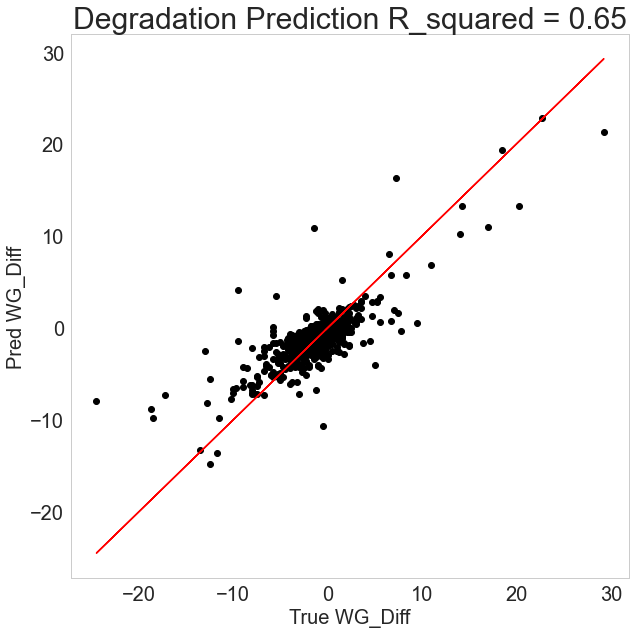

In [884]:
df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
df1['wg_diff'] =  df1['fin_wg_current'] - df1['bulk_wg_current']
corr_name = [
# 'Longitude',
# 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
# 'min_temp',
# 'max_temp',
# 'days_in_bin',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
      'bulk_wg_current',
    'mg',
#    'fin_total_projected_units',
#    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
 'wg_diff',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
print(l)
# Using classifier instead of regressor


X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=8)

from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

from sklearn.metrics import r2_score

# Data for plotting
x = y_test
y = y_forest_pred

r2 = f'{r2_score(x, y):.2f}'

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(x, y, 'o', color= 'black')
ax.plot(x, x, color = 'red')

ax.set(xlabel='True wg_diff', ylabel='Predicted wg_diff',
       title='R2 score is '+str(r2))

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel('True WG_Diff',fontsize = 20)
plt.ylabel('Pred WG_Diff',fontsize = 20)
plt.title('Degradation Prediction R_squared = '+str(r2), fontsize = 30)
ax.grid()

fig.savefig("test.png")
plt.show()


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3741656552.py:61: UserWarning:

FixedFormatter should only be used together with FixedLocator



(array([0.   , 0.025, 0.05 , 0.075, 0.1  , 0.125, 0.15 , 0.175, 0.2  ,
        0.225]),
 [Text(0, 0.0, '0%'),
  Text(0, 0.025, '2%'),
  Text(0, 0.05, '5%'),
  Text(0, 0.07500000000000001, '8%'),
  Text(0, 0.1, '10%'),
  Text(0, 0.125, '12%'),
  Text(0, 0.15000000000000002, '15%'),
  Text(0, 0.17500000000000002, '18%'),
  Text(0, 0.2, '20%'),
  Text(0, 0.225, '22%')])

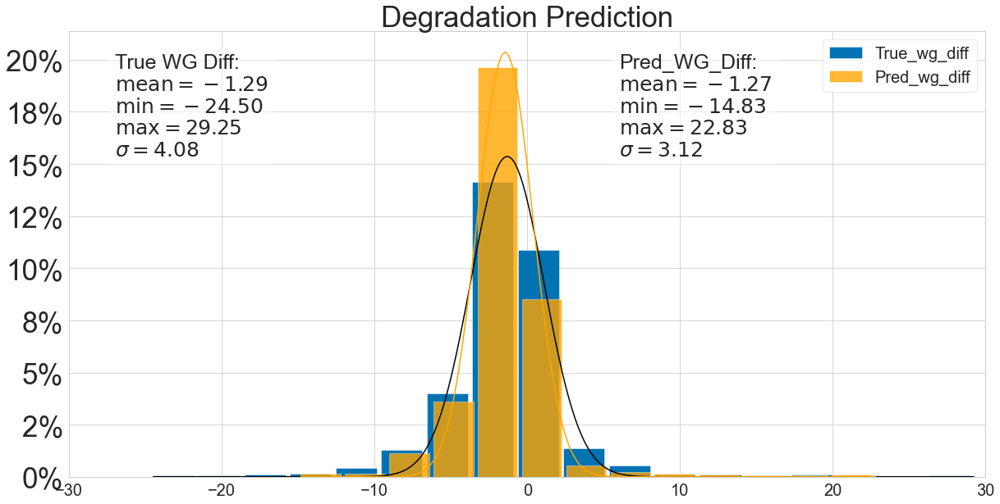

In [885]:
# #Input dataset
# tg = dfb_ag08[dfb_ag08['fin_moisture'].notna()]

# #yr = 2018

# #tg_yr = tg.loc[tg['crop_yr'] == yr,]
# tg_yr = tg

#Graph y and y1
# Data for plotting
x = y_test
y = y_forest_pred

#Graph y and y1
#y = tg_yr.diff_moisture

x_range_min = -30
x_range_max = 30

bin0 = 18
bin1 = 13

fig, ax = plt.subplots(figsize=(20,10))

#plot y_test
bin_heights, bin_borders = np.histogram(x, bins=bin0, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)
t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='True_wg_diff', alpha = 1)
plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='black')

#plot y_predict
bin_heights, bin_borders = np.histogram(y, bins=bin1, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)
t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='Pred_wg_diff', alpha = 0.8, color = 'orange')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='orange')

#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,10), fontsize = 20)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)

plt.legend(fontsize = 20)

# place a text box in upper left in axes coords
mu = x.mean()
minimum = x.min()
maximum = x.max()
sigma = x.std()

textstr = '\n'.join((
    'True WG Diff:',
    r'$\mathrm{mean}=%.2f$' % (mu, ),
    r'$\mathrm{min}=%.2f$' % (minimum, ),
    r'$\mathrm{max}=%.2f$' % (maximum, ),
    r'$\sigma=%.2f$' % (sigma, )))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)

mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()

textstr = '\n'.join((
    'Pred_WG_Diff:',
    r'$\mathrm{mean}=%.2f$' % (mu, ),
    r'$\mathrm{min}=%.2f$' % (minimum, ),
    r'$\mathrm{max}=%.2f$' % (maximum, ),
    r'$\sigma=%.2f$' % (sigma, )))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.6, 0.95, textstr, transform=ax.transAxes, fontsize=25,
        verticalalignment='top', bbox=props)

plt.title('Degradation Prediction', fontsize = 35, loc = 'center')
plt.yticks(fontsize = 35)


In [886]:
data = [0, 1, 2]
print(data
    )
print(*data)

print(data[::-1])

user_input = '1 2 3 4 5'
my_list = list(map(int, user_input.split()))
print(my_list)

[0, 1, 2]
0 1 2
[2, 1, 0]
[1, 2, 3, 4, 5]


Elapsed time to compute the importances: 0.611 seconds


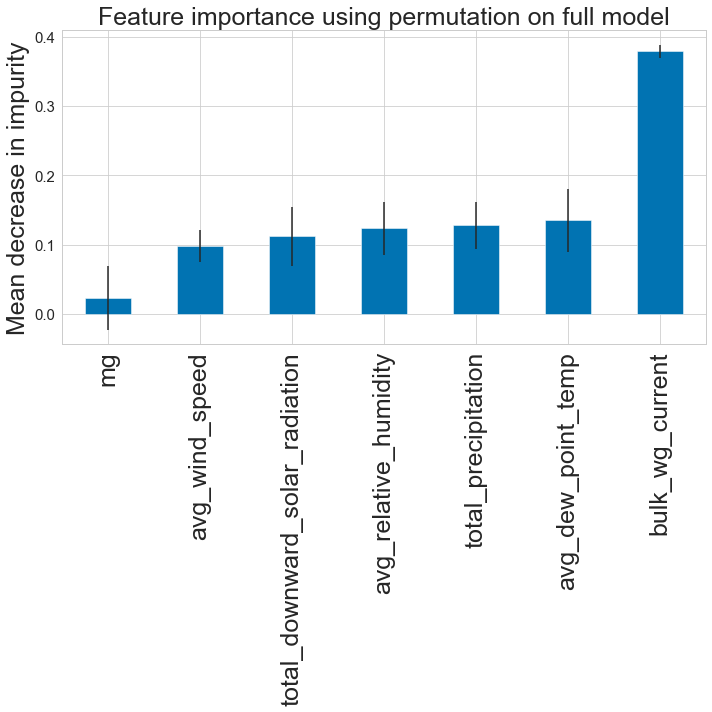

In [887]:
# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.bar(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 15)
fig.tight_layout()

In [888]:
list(df1)

['Unnamed: 0',
 'index',
 'bulk_batch_nbr',
 'crop_yr',
 'bulk_wg_current',
 'mg',
 'bulk_drg',
 'fin_drg',
 'fin_total_projected_units',
 'total_projected_units',
 'fin_wg_current',
 'fin_batch_nbr',
 'bulk_wg_current_dt',
 'fin_wg_current_dt',
 'Longitude',
 'Latitude',
 'avg_dew_point_temp',
 'avg_wind_speed',
 'avg_wind_direction',
 'total_downward_solar_radiation',
 'total_net_solar_radiation',
 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_in_bin',
 'days_max_temp_above_30',
 'days_min_temp_below_0',
 'wg_diff']

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2072818210.py:54: UserWarning:

FixedFormatter should only be used together with FixedLocator



(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 ]),
 [Text(0, 0.0, '0%'),
  Text(0, 0.05, '5%'),
  Text(0, 0.1, '10%'),
  Text(0, 0.15000000000000002, '15%'),
  Text(0, 0.2, '20%'),
  Text(0, 0.25, '25%'),
  Text(0, 0.30000000000000004, '30%'),
  Text(0, 0.35000000000000003, '35%'),
  Text(0, 0.4, '40%')])

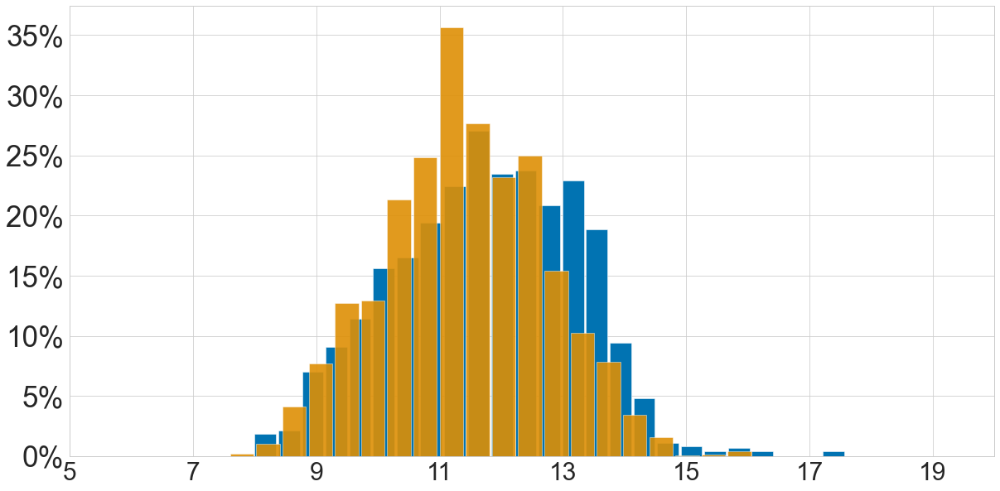

In [889]:
#Input dataset
tg = dfb_ag08[dfb_ag08['fin_moisture'].notna()]

#yr = 2018

#tg_yr = tg.loc[tg['crop_yr'] == yr,]
tg_yr = tg

#Graph y and y1
y = tg_yr.bulk_moisture
y1 = tg_yr.fin_moisture

x_range_min = 5 
x_range_max = 20

bin0 = 25
bin1 = 20

plt.figure(figsize=(20,10))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = 0.06)


x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
#plt.figure()
plt.bar(bin_centers, bin_heights, width=bin_widths, label='bulk_moisture', alpha = 1)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='bulk_moisture_fit', c='black')

#plot y
bin_heights, bin_borders = np.histogram(y1, bins=bin1, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()

t = fit_t(t_init, bin_centers, bin_heights, s = 0.08)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)

plt.bar(bin_centers, bin_heights, width=bin_widths, label='fin_moisture', alpha = 0.9)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fin_moisture_fit', c='red')

#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,2), fontsize = 30)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)


# Planting field

In [890]:
# dfl = pd.read_excel('soybean_vw_soy_fin_lineage.xlsx')
# dfr = pd.read_excel('soybean_vw_soy_fin_qlty_rslt.xlsx')

# dbl = pd.read_excel('soybean_vw_soy_bulk_lineage.xlsx')
# dbr = pd.read_excel('soybean_vw_soy_bulk_qlty_rslt.xlsx')

# dm2 = pd.read_csv('soyMG_0404_v2.csv')
# dm2['MG'] = dm2['MG'].astype('int64')
# dm2.dtypes
# dm2.columns = ['vrty_desc', 'maturity', 'mg']



# #2023 
# dpl = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/2017_2021_planting_Ni.xlsx')
# #print(dpl.head())
# #print(dbr.shape)

# #dpl




In [891]:
dpl[dpl_list]

,Plnt,Plant Name,Crop Year,Agreement Nbr,Order,Female Fertile,Contract Area,Growing Field,Final Acres,Harv Date,Rg,Planting Date Lookup,Planting Date Final
0,5645,Carter Cox,2017,4608494318,103237710.0,70.0,92.0,73,70.0,2017-10-20,AR,2017-05-15 00:00:00,2017-05-15
1,5359,Hurt Seed,2017,4608489629,103236980.0,250.0,250.0,537,250.0,NaT,TN,2017-06-07 00:00:00,2017-06-07
2,1770,BP Windfall IN,2017,4608491469,103212168.0,90.0,90.0,10605,90.0,NaT,IN,2017-04-26 00:00:00,2017-04-26
3,1770,BP Windfall IN,2017,4608491472,103212169.0,26.0,26.0,10606,26.0,NaT,IN,2017-04-26 00:00:00,2017-04-26
4,1770,BP Windfall IN,2019,4608593832,103827756.0,187.6,180.0,10606,187.6,NaT,IN,00:00:00,2019-06-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15344,8H73,Hurt Seed,2021,4600005485,NaN,NaN,50.0,NaN,NaN,NaT,NaN,2021-06-28 00:00:00,2021-06-28
15345,8H73,Hurt Seed,2021,4600005483,NaN,NaN,150.0,NaN,NaN,NaT,NaN,2021-06-26 00:00:00,2021-06-26
15346,8H73,Hurt Seed,2021,4600005523,NaN,NaN,320.0,NaN,NaN,NaT,NaN,2021-06-28 00:00:00,2021-06-28
15347,8H73,Hurt Seed,2021,4600005525,NaN,NaN,140.0,NaN,NaN,NaT,NaN,2021-05-21 00:00:00,2021-05-21


In [892]:
dpl['Harv Date'].isna().sum()

13298

In [893]:
dpl['Final Acres'].isna().sum()

5313

In [894]:
dpl_list = ['Plnt', 'Plant Name', 'Crop Year', 'Agreement Nbr','Contract Area', 'Final Acres','Harv Date','Planting Date Final']
dpl1 = dpl[dpl_list].dropna()
#dpl1.groupby('Crop Year').count()
dpl1

,Plnt,Plant Name,Crop Year,Agreement Nbr,Contract Area,Final Acres,Harv Date,Planting Date Final
0,5645,Carter Cox,2017,4608494318,92.0,70.0,2017-10-20,2017-05-15 00:00:00
7,5645,Carter Cox,2017,4608489264,234.0,203.0,2017-10-04,2017-05-15 00:00:00
12,1252,BP Clarion IA,2018,4608541817,285.0,285.0,2018-10-22,2018-06-11 16:00:00
13,1252,BP Clarion IA,2017,4608488437,207.0,202.0,2017-10-17,2017-05-14 00:00:00
15,1252,BP Clarion IA,2017,4608489262,78.0,78.0,2017-09-30,2017-05-12 00:00:00
...,...,...,...,...,...,...,...,...
9880,5378,Whitehat,2019,4608604861,70.0,70.0,2019-10-21,2019-05-24 12:00:00
9941,5378,Whitehat,2019,4608604574,70.0,70.0,2019-10-31,2019-06-04 00:00:00
9960,5378,Whitehat,2019,4608600569,125.0,125.0,2019-11-12,2019-05-19 19:12:00
9969,5378,Whitehat,2019,4608600906,250.0,290.0,2020-01-24,2019-06-26 00:00:00


In [895]:
dpl1

,Plnt,Plant Name,Crop Year,Agreement Nbr,Contract Area,Final Acres,Harv Date,Planting Date Final
0,5645,Carter Cox,2017,4608494318,92.0,70.0,2017-10-20,2017-05-15 00:00:00
7,5645,Carter Cox,2017,4608489264,234.0,203.0,2017-10-04,2017-05-15 00:00:00
12,1252,BP Clarion IA,2018,4608541817,285.0,285.0,2018-10-22,2018-06-11 16:00:00
13,1252,BP Clarion IA,2017,4608488437,207.0,202.0,2017-10-17,2017-05-14 00:00:00
15,1252,BP Clarion IA,2017,4608489262,78.0,78.0,2017-09-30,2017-05-12 00:00:00
...,...,...,...,...,...,...,...,...
9880,5378,Whitehat,2019,4608604861,70.0,70.0,2019-10-21,2019-05-24 12:00:00
9941,5378,Whitehat,2019,4608604574,70.0,70.0,2019-10-31,2019-06-04 00:00:00
9960,5378,Whitehat,2019,4608600569,125.0,125.0,2019-11-12,2019-05-19 19:12:00
9969,5378,Whitehat,2019,4608600906,250.0,290.0,2020-01-24,2019-06-26 00:00:00


In [896]:
dpl1.groupby('Crop Year').count()

,Plnt,Plant Name,Agreement Nbr,Contract Area,Final Acres,Harv Date,Planting Date Final
Crop Year,,,,,,,
2017,1142,1142,1142,1142,1142,1142,1142
2018,782,782,782,782,782,782,782
2019,126,126,126,126,126,126,126


In [897]:
dpl1.groupby('Agreement Nbr').count().sort_values('Plnt')
#df1

,Plnt,Plant Name,Crop Year,Contract Area,Final Acres,Harv Date,Planting Date Final
Agreement Nbr,,,,,,,
4608483827,1,1,1,1,1,1,1
4608543585,1,1,1,1,1,1,1
4608543571,1,1,1,1,1,1,1
4608543563,1,1,1,1,1,1,1
4608543551,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...
4608492887,1,1,1,1,1,1,1
4608492886,1,1,1,1,1,1,1
4608492884,1,1,1,1,1,1,1


In [898]:
dbl_a1 = dbl[(dbl.crop_yr>=2017)&(dbl.crop_yr<=2019)][['crop_yr','grwng_cntrct','bulk_batch_nbr']].dropna().drop_duplicates('bulk_batch_nbr').reset_index()
dbl_a1.groupby('bulk_batch_nbr').count().sort_values('crop_yr')


,index,crop_yr,grwng_cntrct
bulk_batch_nbr,,,
1,1,1,1
RF8SF81,1,1,1
RF8SF73,1,1,1
RF8SF72,1,1,1
RF8SF71,1,1,1
...,...,...,...
CL9SDL3,1,1,1
CL9SDL2,1,1,1
CL9SDL1,1,1,1


In [899]:
dbl_a2 = dbl_a1.merge(dpl1,how = 'inner', left_on = ['crop_yr','grwng_cntrct'], right_on = ['Crop Year', 'Agreement Nbr'])
dbl_a2

,index,crop_yr,grwng_cntrct,bulk_batch_nbr,Plnt,Plant Name,Crop Year,Agreement Nbr,Contract Area,Final Acres,Harv Date,Planting Date Final
0,15981,2017,4608494017,BE74DP1,1745,BP Beaman IA,2017,4608494017,56.0,56.0,2017-09-22,2017-05-12 00:00:00
1,16465,2017,4608490233,ST7SET1,1259,BP Stonington IL,2017,4608490233,35.0,35.0,2017-09-29,2017-05-18 00:00:00
2,16466,2017,4608490237,ST7SEV1,1259,BP Stonington IL,2017,4608490237,45.0,45.0,2017-09-29,2017-05-18 00:00:00
3,16467,2018,4608544130,ST8SFF2,1259,BP Stonington IL,2018,4608544130,160.0,160.0,2018-09-16,2018-05-07 00:00:00
4,16468,2018,4608544130,ST8SFF1,1259,BP Stonington IL,2018,4608544130,160.0,160.0,2018-09-16,2018-05-07 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
3394,75754,2019,4608596557,CH9SE81,5353,Cherry Farms,2019,4608596557,331.0,390.6,2019-12-11,2019-06-20 15:25:43
3395,75755,2019,4608596557,CH9SE82,5353,Cherry Farms,2019,4608596557,331.0,390.6,2019-12-11,2019-06-20 15:25:43
3396,75756,2019,4608596573,CH9SJ81,5353,Cherry Farms,2019,4608596573,500.0,545.0,2019-11-19,2019-05-30 00:00:00
3397,75757,2019,4608596573,CH9SJ82,5353,Cherry Farms,2019,4608596573,500.0,545.0,2019-11-19,2019-05-30 00:00:00


In [900]:
dbr_a1 = dbr[(dbr.crop_yr>=2017)&(dbr.crop_yr<=2019)][['crop_yr','batch_nbr','wg_current_dt', 'wg_current', 'total_bu', 'total_projected_units', 'bulk_seeds_per_lb', 'bulk_usable_pct',  'projected_units_at_adj_quality_threshold',
 'projected_units_at_std_quality_threshold']].dropna().drop_duplicates('batch_nbr')
dbr_a1.groupby('batch_nbr').count().sort_values('crop_yr')
dbr_a1

,crop_yr,batch_nbr,wg_current_dt,wg_current,total_bu,total_projected_units,bulk_seeds_per_lb,bulk_usable_pct,projected_units_at_adj_quality_threshold,projected_units_at_std_quality_threshold
0,2019,BP93CA1,2019-12-02,99.0,2216.333,2169.384000,2637.0,86.61,2169.384,2169.384
1,2019,BP93DC1,2019-12-02,97.0,3086.667,3072.577000,2722.0,85.33,3072.577,3072.577
2,2019,BP94CC1,2019-12-16,97.0,5971.000,5910.614000,2640.0,87.49,5910.614,5910.614
3,2019,BP94CP1,2019-11-12,100.0,4705.000,5685.058000,3247.0,86.83,5685.058,5685.058
4,2019,BP9FCF1,2019-11-13,100.0,7536.000,8936.327000,3198.0,86.52,8936.327,8936.327
...,...,...,...,...,...,...,...,...,...,...
63114,2017,MF73CF1,2018-01-12,91.5,4013.330,2194.147310,2193.0,58.17,0.000,0.000
63115,2017,MF73CJ2,2017-11-01,93.5,582.330,532.202385,2371.0,89.94,0.000,0.000
63127,2017,MF72AT39,2017-10-25,97.0,139.670,144.258918,2631.0,91.60,0.000,0.000
63216,2017,CH73EH02,2017-11-26,96.5,2555.330,2364.564212,2469.0,87.45,0.000,0.000


In [901]:
dbl_a3 = dbl_a2.merge(dbr_a1, how = 'inner',  left_on = ['crop_yr', 'bulk_batch_nbr'], right_on = ['crop_yr','batch_nbr'])
list(dbl_a3)

['index',
 'crop_yr',
 'grwng_cntrct',
 'bulk_batch_nbr',
 'Plnt',
 'Plant Name',
 'Crop Year',
 'Agreement Nbr',
 'Contract Area',
 'Final Acres',
 'Harv Date',
 'Planting Date Final',
 'batch_nbr',
 'wg_current_dt',
 'wg_current',
 'total_bu',
 'total_projected_units',
 'bulk_seeds_per_lb',
 'bulk_usable_pct',
 'projected_units_at_adj_quality_threshold',
 'projected_units_at_std_quality_threshold']

In [902]:
dbl_a4 = dbl_a3[['index', 
                 'crop_yr',
 'grwng_cntrct',
 'bulk_batch_nbr',
 'Plnt',
 'Plant Name',
# 'Order',
# 'Female Fertile',
# 'Contract Area',
# 'Growing Field',
 'Final Acres',
 'Harv Date',
# 'Rg',
# 'Planting Date Lookup',
 'Planting Date Final',
 'wg_current_dt',
 'wg_current',
 'total_bu',
 'total_projected_units',
 'bulk_seeds_per_lb',
 'bulk_usable_pct']]
dbl_a4

,index,crop_yr,grwng_cntrct,bulk_batch_nbr,Plnt,Plant Name,Final Acres,Harv Date,Planting Date Final,wg_current_dt,wg_current,total_bu,total_projected_units,bulk_seeds_per_lb,bulk_usable_pct
0,15981,2017,4608494017,BE74DP1,1745,BP Beaman IA,56.0,2017-09-22,2017-05-12 00:00:00,2017-10-17,96.5,2675.25,3199.270326,3400.0,82.07
1,16465,2017,4608490233,ST7SET1,1259,BP Stonington IL,35.0,2017-09-29,2017-05-18 00:00:00,2017-10-24,97.0,2034.67,2200.717791,2793.0,90.36
2,16466,2017,4608490237,ST7SEV1,1259,BP Stonington IL,45.0,2017-09-29,2017-05-18 00:00:00,2017-10-24,97.0,2646.67,2851.352871,2730.0,92.08
3,16467,2018,4608544130,ST8SFF2,1259,BP Stonington IL,160.0,2018-09-16,2018-05-07 00:00:00,2018-10-10,89.0,9350.33,9644.477757,2767.0,86.98
4,16468,2018,4608544130,ST8SFF1,1259,BP Stonington IL,160.0,2018-09-16,2018-05-07 00:00:00,2018-10-10,80.0,1412.67,1450.571472,2753.0,87.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3324,75754,2019,4608596557,CH9SE81,5353,Cherry Farms,390.6,2019-12-11,2019-06-20 15:25:43,2019-12-17,94.0,3885.33,4521.389826,3428.0,79.21
3325,75755,2019,4608596557,CH9SE82,5353,Cherry Farms,390.6,2019-12-11,2019-06-20 15:25:43,2019-12-17,88.5,3712.33,4318.537314,3335.0,81.39
3326,75756,2019,4608596573,CH9SJ81,5353,Cherry Farms,545.0,2019-11-19,2019-05-30 00:00:00,2019-11-25,97.5,5821.33,7060.078420,3398.0,83.28
3327,75757,2019,4608596573,CH9SJ82,5353,Cherry Farms,545.0,2019-11-19,2019-05-30 00:00:00,2019-11-25,93.5,16469.33,18300.248003,2974.0,87.18


In [903]:
dbl_a4.groupby('grwng_cntrct')['bulk_batch_nbr'].count().sort_values()

grwng_cntrct
4608483827     1
4608497696     1
4608497700     1
4608497706     1
4608497786     1
              ..
4608544115     8
4608542395     8
4608495621     8
4608490278     9
4608544202    10
Name: bulk_batch_nbr, Length: 1756, dtype: int64

In [904]:
dbl_a4.groupby('Plant Name')['wg_current'].agg(['mean','count','max','min','std'])

,mean,count,max,min,std
Plant Name,,,,,
BP Beaman IA,88.673913,483,99.5,10.0,13.982606
BP Clarion IA,92.675086,1158,100.0,35.0,8.623571
BP Stonington IL,91.918605,817,100.0,56.5,6.529659
BP West Fargo ND,96.955285,123,100.0,91.5,2.315316
Carter Cox,95.721154,52,99.5,89.5,2.245722
Cherry Farms,87.460030,663,99.5,14.5,12.698080
Hurt Seed,93.333333,33,99.0,61.5,7.507982


In [905]:
fap1 = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
fap2 = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/2017 - 2021 5 Year Historic Average Planting.xlsx', sheet_name = 'Plant Code Lookup')

In [906]:
fap = fap2.merge(fap1, how = 'inner', left_on = 'Plant PBC', right_on = 'FAP')[['Plant Name','Region','Country', 'Plant PBC','loc1', 'Latitude', 'Longitude']]
fap = fap.rename(columns = {'Latitude': 'Plant Lat', 'Longitude':'Plant Lon'})
fap

,Plant Name,Region,Country,Plant PBC,loc1,Plant Lat,Plant Lon
0,BP Beaman IA,Central West,US,8H12,1745,42.222851,-92.824670
1,BP Ashton IL,Central East,US,8H14,1744,41.868490,-89.248482
2,BP Centralia IL,East,US,8H16,1285,38.475920,-89.142023
3,BP Clarion IA,Central West,US,8H17,1252,42.732188,-93.739911
4,BP Marshall MO,Central West,US,8H30,1758,39.135205,-93.205245
5,BP Mason City IL,Central East,US,8H31,1759,40.198937,-89.676304
6,BP Matthews MO,East,US,8H32,1254,36.754177,-89.536251
7,BP Redwood Falls MN,West,US,8H33,1761,44.484935,-95.118037
8,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108
9,BP West Fargo ND,West,US,8H40,1089,46.880831,-96.901126


In [907]:
dbl_a5 = dbl_a4.merge(fap, how = 'inner', on = 'Plant Name')
dbl_a7 = dbl_a5.merge(dbin_info2[['Batch ID#', 'Longitude','Latitude']], how = 'left', left_on = 'bulk_batch_nbr', right_on = 'Batch ID#')
dbl_a6 = dbl_a5.merge(dbin_info2[['Batch ID#', 'Longitude','Latitude']], how = 'inner', left_on = 'bulk_batch_nbr', right_on = 'Batch ID#')

print(dbl_a5.shape)
dbl_a6 = dbl_a6.dropna()
dbl_a6.shape

(3329, 21)


(1721, 24)

In [908]:
dbl_a6.groupby('Plant Name')['wg_current'].agg(['mean','count','max','min','std'])

,mean,count,max,min,std
Plant Name,,,,,
BP Beaman IA,91.642857,21,99.0,55.0,10.134277
BP Clarion IA,92.376481,844,100.0,35.0,9.328973
BP Stonington IL,91.848238,738,100.0,56.5,6.703753
BP West Fargo ND,96.919492,118,100.0,91.5,2.356089


In [909]:
dbl_a8 = dbl_a5.groupby('Plant Name')[['wg_current', 'Plant Lon', 'Plant Lat']].mean().reset_index()
dbl_a8 = dbl_a8.rename(columns = {'Plant Lon': 'Longitude', 'Plant Lat':'Latitude'})
dbl_a8

,Plant Name,wg_current,Longitude,Latitude
0,BP Beaman IA,88.673913,-92.824670,42.222851
1,BP Clarion IA,92.675086,-93.739911,42.732188
2,BP Stonington IL,91.918605,-89.197108,39.632138
3,BP West Fargo ND,96.955285,-96.901126,46.880831
4,Carter Cox,95.721154,-90.564863,36.322560
5,Cherry Farms,87.460030,-76.180380,35.766285
6,Hurt Seed,93.333333,-89.405404,35.894121


In [910]:
#geographic gridding
from scipy.interpolate import griddata
import rasterio
from rasterio.crs import CRS
import mpu
from geopy.distance import geodesic
import h3
from shapely.geometry import Polygon
import folium
from scipy.spatial import ConvexHull as ch
import folium.plugins
import branca
import branca.colormap as cm
from branca.colormap import ColorMap, LinearColormap

df = dbl_a8

#Create a convex polygon
xfield, yfield = 'Longitude', 'Latitude'
arr = df[[xfield, yfield]].to_numpy() #Create numpy array from coordinates
hull = ch(arr) #Calculate convex hull
epsg = 4326
polylist = []
for idx in hull.vertices: #Indices of points forming the vertices of the convex hull.
    polylist.append(arr[idx]) #Append this index point to list
p = Polygon(polylist)
df_poly = pd.DataFrame({'hull':[1]})
df_poly['geometry'] = p
polygon = gpd.GeoDataFrame(df_poly, crs='EPSG:{}'.format(epsg), geometry='geometry')

# make a grid of latitude-longitude values
xmin, xmax, ymin, ymax = df.Longitude.min(),df.Longitude.max(), df.Latitude.min(),df.Latitude.max()
coords_1 = (xmin, ymin)
coords_2 = (xmin, ymax)
coords_3 = (xmax, ymax)
coords_4 = (xmax, ymin)

#define interval in meters
intvlx = 40000 
intvly = 10000

distx = h3.point_dist(coords_3, coords_2, unit='m') # to get distance in meters
disty = h3.point_dist(coords_1, coords_2, unit='m') # to get distance in meters


# Number of grid points in x and y
grid_x = round(distx/intvlx)
grid_y = round(disty/intvly)

xx, yy = np.meshgrid(np.linspace(xmin,xmax, grid_x), np.linspace(ymin,ymax, grid_y))
xc = xx.flatten()
yc = yy.flatten()

# Now convert these points to geo-data
pts = GeoSeries([Point(x, y) for x, y in zip(xc, yc)])
pts = gpd.GeoDataFrame(pts, crs ='EPSG:{}'.format(epsg), geometry=gpd.GeoSeries(pts))
pts = gpd.sjoin(pts, polygon, predicate='within', how='inner')

#Create Map
m = folium.Map([41.4427, -84.8584], zoom_start=5.0, tiles='cartodbpositron')

#plot polygon
#folium.GeoJson(polygon).add_to(m)
folium.LatLngPopup().add_to(m)

#Plot Values
# crop_yr = 2020
# df = dfb_ag12[dfb_ag12['crop_yr']==crop_yr]
cr = 5
colormap1 = cm.LinearColormap(colors=['blue','white','red'], index=[-cr,0,cr],vmin=-cr,vmax=cr)
colormap2 = cm.LinearColormap(colors=['yellow','red'], index=[89,98],
                              vmin=89,vmax=98,
                             caption = 'Warm Germination Score')

p1 = 'wg_current'
p2 = 'fin_wg_wt_avg'
p3 = 'diff_wg'

lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df[p1])

for loc, p in zip(zip(lat, lon), to_plot):
    folium.CircleMarker(location=loc,
        radius=15,
        fill=True,
        color=colormap2(p),
        fill_opacity=1
    ).add_to(m)
m.add_child(colormap2)

# for idx, row in pts.iterrows():
#     folium.CircleMarker(location=(row['geometry'].y, row['geometry'].x),
#         radius=1,
#         fill=True,
# #        color=colormap(p),
# #        fill_opacity=1
#     ).add_to(m)
m

In [911]:
dbl_a8.head()
pd.concat([dbl_a8.iloc[0:3,:], dbl_a8.iloc[5:6,:]])

,Plant Name,wg_current,Longitude,Latitude
0,BP Beaman IA,88.673913,-92.824670,42.222851
1,BP Clarion IA,92.675086,-93.739911,42.732188
2,BP Stonington IL,91.918605,-89.197108,39.632138
5,Cherry Farms,87.460030,-76.180380,35.766285


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1441355108.py:47: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



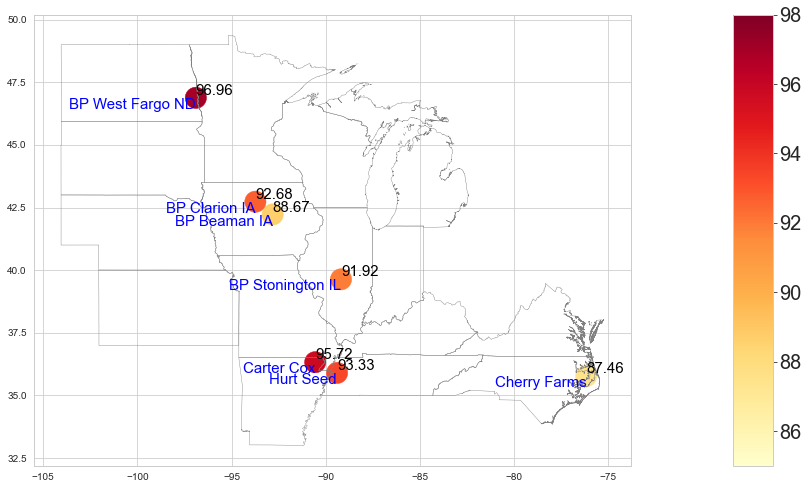

         Plant Name  wg_current
5      Cherry Farms   87.460030
0      BP Beaman IA   88.673913
2  BP Stonington IL   91.918605
1     BP Clarion IA   92.675086
6         Hurt Seed   93.333333
4        Carter Cox   95.721154
3  BP West Fargo ND   96.955285


In [912]:
df = dbl_a8
p1 = 'Plant Name'
p2 = 'wg_current'
p3 = 'diff_wg'

from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN', 'VA', 'NC'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN', 'VA', 'NC'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
fig, ax = plt.subplots(figsize=(15,30))

#fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=20
# ),axis=1);
center.boundary.plot(ax=ax, color='grey', linewidth=.4)

#Plot FAP names
#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
#fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
#fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
fap_to_plot = df


for _, r in fap_to_plot.iterrows():
    ax.annotate(r[p1], (r['Longitude'], r['Latitude']), ha = 'right', va='top', color = 'blue', fontsize = 15)
    ax.annotate(round(r[p2],2), (r['Longitude'], r['Latitude']), ha = 'left', va='bottom', color = 'black', fontsize = 15)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 450, c = df[p2], vmin =85, vmax = 98, cmap = "YlOrRd")
M = 5
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[[p1, p2]].sort_values(p2))

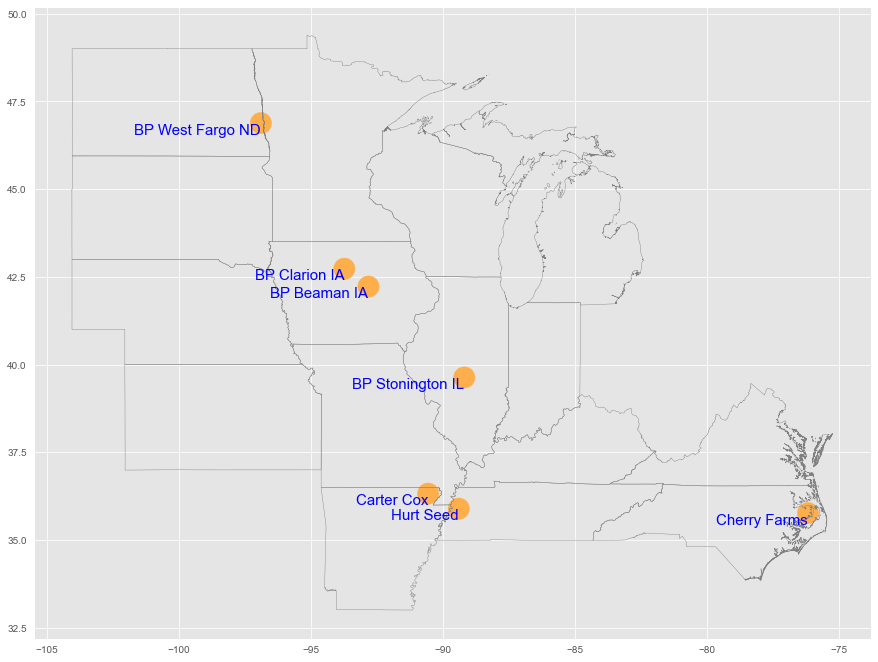

         Plant Name  wg_current
5      Cherry Farms   87.460030
0      BP Beaman IA   88.673913
2  BP Stonington IL   91.918605
1     BP Clarion IA   92.675086
6         Hurt Seed   93.333333
4        Carter Cox   95.721154
3  BP West Fargo ND   96.955285


In [913]:
df = dbl_a8
#df = pd.concat([dbl_a8.iloc[0:3,:], dbl_a8.iloc[5:6,:]])
p1 = 'Plant Name'
p2 = 'wg_current'
p3 = 'diff_wg'

from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN', 'VA', 'NC'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN', 'VA', 'NC'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(15,30))

#fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=20
# ),axis=1);
center.boundary.plot(ax=ax, color='grey', linewidth=.4)

#Plot FAP names
#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
#fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
#fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
fap_to_plot = df


for _, r in fap_to_plot.iterrows():
    ax.annotate(r[p1], (r['Longitude'], r['Latitude']), ha = 'right', va='top', color = 'blue', fontsize = 15)
#    ax.annotate(round(r[p2],2), (r['Longitude'], r['Latitude']), ha = 'left', va='bottom', color = 'black', fontsize = 15)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 450, c = df[p2]*0+90, vmin =85, vmax = 98, cmap = "YlOrRd")
M = 5
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)
   
# plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
# plt.colorbar(im, cax=cax)
# cbar = plt.colorbar(im, cax=cax)
# for t in cbar.ax.get_yticklabels():
#      t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[[p1, p2]].sort_values(p2))

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/4209705271.py:45: UserWarning:

FixedFormatter should only be used together with FixedLocator



(array([0.   , 0.025, 0.05 , 0.075, 0.1  , 0.125, 0.15 , 0.175, 0.2  ]),
 [Text(0, 0.0, '0%'),
  Text(0, 0.025, '2%'),
  Text(0, 0.05, '5%'),
  Text(0, 0.07500000000000001, '8%'),
  Text(0, 0.1, '10%'),
  Text(0, 0.125, '12%'),
  Text(0, 0.15000000000000002, '15%'),
  Text(0, 0.17500000000000002, '18%'),
  Text(0, 0.2, '20%')])

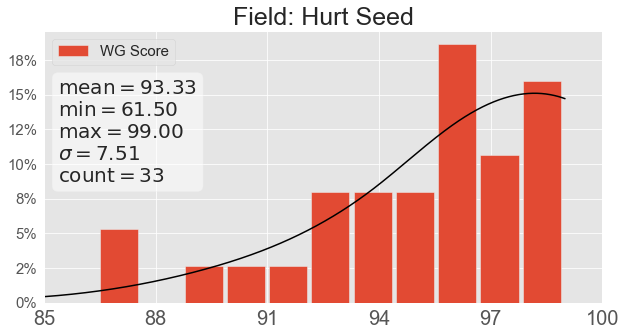

In [914]:
#Input dataset
tg = dbl_a4

yr = 'BP West Fargo ND'
yr = 'BP Clarion IA' 
yr = 'BP Stonington IL'  
yr = 'BP West Fargo ND'   
yr = 'Carter Cox'   
yr = 'Cherry Farms'   
yr = 'Hurt Seed'

tg_yr = tg.loc[tg['Plant Name'] == yr,]
#tg_yr = tg

#Graph y and y1
y = tg_yr.wg_current
x_range_min = 85
x_range_max = 100

bin0 = round(y.count()/1)
s = 0.0095

fig, ax = plt.subplots(figsize=(10,5))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = s)
# t_init = models.Gaussian1D()
# fit_t = fitting.LevMarLSQFitter()
# t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='WG Score', alpha = 1)
plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='black')


#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,3), fontsize = 20)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)

plt.legend(fontsize = 15)

# place a text box in upper left in axes coords
mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()
count = y.count()
textstr = '\n'.join((
    r'$\mathrm{mean}=%.2f$' % (mu, ),
    r'$\mathrm{min}=%.2f$' % (minimum, ),
    r'$\mathrm{max}=%.2f$' % (maximum, ),
    r'$\sigma=%.2f$' %(sigma, ),
    r'$\mathrm{count}=%.0f$' % (count, )))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.025, 0.825, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.title('Field: '+str(yr), fontsize = 25, loc = 'center')
plt.yticks(fontsize = 15)


In [915]:
dbl_a4.head()

,index,crop_yr,grwng_cntrct,bulk_batch_nbr,Plnt,Plant Name,Final Acres,Harv Date,Planting Date Final,wg_current_dt,wg_current,total_bu,total_projected_units,bulk_seeds_per_lb,bulk_usable_pct
0,15981,2017,4608494017,BE74DP1,1745,BP Beaman IA,56.0,2017-09-22,2017-05-12,2017-10-17,96.5,2675.25,3199.270326,3400.0,82.07
1,16465,2017,4608490233,ST7SET1,1259,BP Stonington IL,35.0,2017-09-29,2017-05-18,2017-10-24,97.0,2034.67,2200.717791,2793.0,90.36
2,16466,2017,4608490237,ST7SEV1,1259,BP Stonington IL,45.0,2017-09-29,2017-05-18,2017-10-24,97.0,2646.67,2851.352871,2730.0,92.08
3,16467,2018,4608544130,ST8SFF2,1259,BP Stonington IL,160.0,2018-09-16,2018-05-07,2018-10-10,89.0,9350.33,9644.477757,2767.0,86.98
4,16468,2018,4608544130,ST8SFF1,1259,BP Stonington IL,160.0,2018-09-16,2018-05-07,2018-10-10,80.0,1412.67,1450.571472,2753.0,87.03


In [916]:
dbl_a5.to_csv('~/Documents/Bayer_Info/Soybean/data/2023/soybean_field_data_Ni.csv', encoding='utf-8')

In [917]:
dbl_a5[['crop_yr', 'bulk_batch_nbr', 'Planting Date Final', 'Harv Date', 'wg_current', 'wg_current_dt','Plant Name', 'Plant Lon', 'Plant Lat']]

,crop_yr,bulk_batch_nbr,Planting Date Final,Harv Date,wg_current,wg_current_dt,Plant Name,Plant Lon,Plant Lat
0,2017,BE74DP1,2017-05-12,2017-09-22,96.5,2017-10-17,BP Beaman IA,-92.824670,42.222851
1,2017,BE7SDD1,2017-05-13,2017-10-23,94.5,2017-11-21,BP Beaman IA,-92.824670,42.222851
2,2017,BE7SDD2,2017-05-13,2017-10-23,94.5,2017-11-21,BP Beaman IA,-92.824670,42.222851
3,2017,BE7SMJ1,2017-05-08,2017-10-20,89.0,2017-11-20,BP Beaman IA,-92.824670,42.222851
4,2017,BE7SMK1,2017-05-08,2017-10-20,93.0,2017-11-07,BP Beaman IA,-92.824670,42.222851
...,...,...,...,...,...,...,...,...,...
3324,2017,KN7SAB2,2017-05-15,2017-10-04,97.5,2017-10-16,Carter Cox,-90.564863,36.322560
3325,2017,KN7SAB4,2017-05-15,2017-10-04,97.0,2017-10-16,Carter Cox,-90.564863,36.322560
3326,2017,KN7SAB3,2017-05-15,2017-10-05,98.0,2017-10-16,Carter Cox,-90.564863,36.322560
3327,2017,KN7SAB5,2017-05-15,2017-10-02,95.0,2017-10-16,Carter Cox,-90.564863,36.322560


# Weather Data Analysis

In [918]:
era5_info = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/soybean_bulk_weather_02072023.csv', encoding='utf-8')

In [919]:
era5_info.groupby('bulk_batch_nbr').count()

,Unnamed: 0,grid_id,date,avg_dew_point_temperature,total_precipitation,avg_wind_speed,avg_wind_direction,avg_relative_humidity,total_downward_solar_radiation,total_net_solar_radiation,avg_atmospheric_pressure,avg_snow_depth,min_temperature,max_temperature
bulk_batch_nbr,,,,,,,,,,,,,,
BE73CL1,128,128,128,128,128,128,128,128,128,128,128,128,128,128
BE73CM1,125,125,125,125,125,125,125,125,125,125,125,125,125,125
BE73CN1,127,127,127,127,127,127,127,127,127,127,127,127,127,127
BE73DX1,128,128,128,128,128,128,128,128,128,128,128,128,128,128
BE74AF1,134,134,134,134,134,134,134,134,134,134,134,134,134,134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WF7SGQ1,139,139,139,139,139,139,139,139,139,139,139,139,139,139
WF7SGU1,148,148,148,148,148,148,148,148,148,148,148,148,148,148
WF7SGZ1,151,151,151,151,151,151,151,151,151,151,151,151,151,151


In [920]:
era5_info.head()

,Unnamed: 0,grid_id,date,avg_dew_point_temperature,total_precipitation,avg_wind_speed,avg_wind_direction,avg_relative_humidity,total_downward_solar_radiation,total_net_solar_radiation,avg_atmospheric_pressure,avg_snow_depth,min_temperature,max_temperature,bulk_batch_nbr
0,63,275390,2017-05-12,4.3,0.0,13.0,14.0,46.0,29.456,24.003,980.1,0.0,9.2,23.1,BE74DP1
1,52,275390,2017-05-13,8.4,0.0,14.6,236.0,48.1,28.707,23.431,976.7,0.0,12.8,27.8,BE74DP1
2,26,275390,2017-05-14,12.1,0.0,16.8,186.0,54.7,27.747,22.651,974.3,0.0,13.8,28.2,BE74DP1
3,36,275390,2017-05-15,16.2,11.9,15.8,157.0,67.7,23.935,19.479,973.5,0.0,17.7,30.3,BE74DP1
4,96,275390,2017-05-16,17.7,0.3,23.3,194.0,65.0,25.135,20.544,968.3,0.0,19.7,30.3,BE74DP1


In [921]:
df_new = era5_info
df_new['date'] = pd.to_datetime(df_new['date'])
df_new.dtypes

Unnamed: 0                                 int64
grid_id                                    int64
date                              datetime64[ns]
avg_dew_point_temperature                float64
total_precipitation                      float64
avg_wind_speed                           float64
avg_wind_direction                       float64
avg_relative_humidity                    float64
total_downward_solar_radiation           float64
total_net_solar_radiation                float64
avg_atmospheric_pressure                 float64
avg_snow_depth                           float64
min_temperature                          float64
max_temperature                          float64
bulk_batch_nbr                            object
dtype: object

In [922]:
# pd.options.mode.chained_assignment = None  # default='warn'
# dfb = dbl_a5
# df = pd.DataFrame()
# df = dfb
# dfe = era5_info
# dfe['date'] = pd.to_datetime(dfe['date'])

# l = dfb.shape[0]
# #l = 14
# for i in range(l):
#     bulk = df.loc[i,'bulk_batch_nbr']
#     dt1 = df.loc[i,'Planting Date Final']
#     dt2 = df.loc[i,'Harv Date']

#     dfe_sl = dfe.loc[(dfe.bulk_batch_nbr == bulk)&(dfe.date>=dt1)&(dfe.date<=dt2),]
#     df.loc[i, 'avg_dew_point_temp'] = dfe_sl.loc[:,'avg_dew_point_temperature'].mean()
#     df.loc[i, 'avg_wind_speed'] = dfe_sl.avg_wind_speed.mean()
#     df.loc[i, 'avg_wind_direction'] = dfe_sl.avg_wind_direction.mean()
#     df.loc[i, 'total_downward_solar_radiation'] = dfe_sl.total_downward_solar_radiation.mean()
#     df.loc[i, 'total_net_solar_radiation'] = dfe_sl.total_net_solar_radiation.mean()
#     df.loc[i, 'avg_snow_depth'] = dfe_sl.avg_snow_depth.mean()
#     df.loc[i, 'total_precipitation'] = dfe_sl.total_precipitation.sum()
#     df.loc[i, 'avg_relative_humidity'] = dfe_sl.avg_relative_humidity.mean()
#     df.loc[i, 'min_temp'] = dfe_sl.min_temperature.mean()
#     df.loc[i, 'max_temp'] = dfe_sl.max_temperature.mean()
#     df.loc[i, 'days_Plant_Harv'] = dfe_sl.shape[0]
#     df.loc[i, 'days_max_temp_above_30'] = dfe_sl[dfe_sl.max_temperature>=30].shape[0]
#     df.loc[i, 'days_min_temp_below_0'] = dfe_sl[dfe_sl.min_temperature<=0].shape[0]

# df.to_csv('~/Documents/Bayer_Info/Soybean/data/2023/soybean_bulk_weather_engi_02082023.csv', encoding='utf-8')
# print(df.shape)
# df.head()

In [923]:
df = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/soybean_bulk_weather_engi_02082023.csv')

In [924]:
dbl_a10 = df.rename(columns={'days_in_bin': 'days_Plant_Harv'})
list(dbl_a10)

['Unnamed: 0',
 'index',
 'crop_yr',
 'grwng_cntrct',
 'bulk_batch_nbr',
 'Plnt',
 'Plant Name',
 'Final Acres',
 'Harv Date',
 'Planting Date Final',
 'wg_current_dt',
 'wg_current',
 'total_bu',
 'total_projected_units',
 'bulk_seeds_per_lb',
 'bulk_usable_pct',
 'Region',
 'Country',
 'Plant PBC',
 'loc1',
 'Plant Lat',
 'Plant Lon',
 'avg_dew_point_temp',
 'avg_wind_speed',
 'avg_wind_direction',
 'total_downward_solar_radiation',
 'total_net_solar_radiation',
 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_Plant_Harv',
 'days_max_temp_above_30',
 'days_min_temp_below_0']

In [925]:
dbl_a10.groupby('Plant Name')[['wg_current','avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_Plant_Harv',
 'days_max_temp_above_30',
# 'days_min_temp_below_0'
                              ]].mean().sort_values('wg_current')

,wg_current,avg_dew_point_temp,avg_wind_speed,total_downward_solar_radiation,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_Plant_Harv,days_max_temp_above_30
Plant Name,,,,,,,,,,
Cherry Farms,87.460030,18.073949,10.513658,16.836393,806.495023,79.979167,18.037633,26.513845,168.779789,57.692308
BP Beaman IA,88.673913,14.951636,13.383252,20.546224,616.611180,72.384382,15.238458,25.648015,153.552795,28.053830
BP Stonington IL,91.918605,16.181581,11.383510,21.287392,484.133537,67.807434,17.675776,28.388636,149.529988,57.574051
BP Clarion IA,92.675086,14.679750,13.943092,19.800967,614.799827,72.922344,14.952422,25.310986,152.289292,28.145941
Hurt Seed,93.333333,18.169551,8.918699,19.793890,469.612121,71.432854,19.496773,28.764578,139.969697,65.818182
Carter Cox,95.721154,17.951327,9.466471,20.775397,395.598077,70.092213,19.226742,29.083180,145.250000,62.019231
BP West Fargo ND,96.955285,11.073998,12.620704,19.778018,366.110569,66.571930,12.583062,23.869932,147.463415,13.772358


In [926]:
dbl_a10.groupby('crop_yr')[['wg_current','avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_Plant_Harv',
 'days_max_temp_above_30',
 'days_min_temp_below_0'
                              ]].mean().sort_values('wg_current')

,wg_current,avg_dew_point_temp,avg_wind_speed,total_downward_solar_radiation,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_Plant_Harv,days_max_temp_above_30,days_min_temp_below_0
crop_yr,,,,,,,,,,,
2018,86.986710,16.613183,12.338756,19.263792,754.122342,75.574562,16.733852,26.320263,156.199538,43.611710,2.900616
2019,91.539877,17.847070,10.477235,17.957900,867.751534,77.635780,18.102847,27.095589,178.496933,75.815951,2.190184
2017,93.888651,14.909473,12.582707,20.146937,482.232495,70.291721,15.842160,26.382051,151.526767,37.235546,0.228587


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/1610566146.py:46: UserWarning:

FixedFormatter should only be used together with FixedLocator



(array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18]),
 [Text(0, 0.0, '0%'),
  Text(0, 0.02, '2%'),
  Text(0, 0.04, '4%'),
  Text(0, 0.06, '6%'),
  Text(0, 0.08, '8%'),
  Text(0, 0.1, '10%'),
  Text(0, 0.12, '12%'),
  Text(0, 0.14, '14%'),
  Text(0, 0.16, '16%'),
  Text(0, 0.18, '18%')])

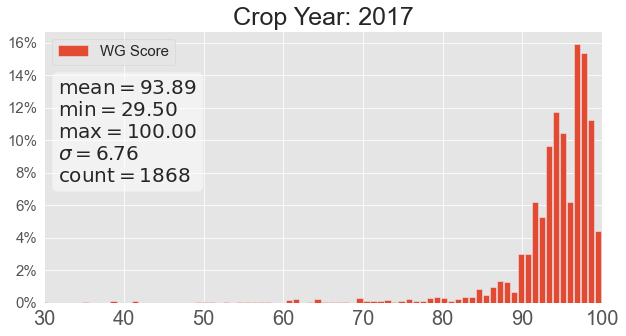

In [927]:
#Input dataset
tg = dbl_a4

yr = 'BP West Fargo ND'
yr = 'BP Clarion IA' 
yr = 'BP Stonington IL'  
yr = 'BP West Fargo ND'   
yr = 'Carter Cox'   
yr = 'Cherry Farms'   
yr = 'Hurt Seed'
yr = 2017

tg_yr = tg.loc[tg['crop_yr'] == yr,]
#tg_yr = tg

#Graph y and y1
y = tg_yr.wg_current
x_range_min = 30
x_range_max = 100

bin0 = 80
s = 0.06

fig, ax = plt.subplots(figsize=(10,5))

bin_heights, bin_borders = np.histogram(y, bins=bin0, density = True)
bin_widths = np.diff(bin_borders)*0.9
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Spline1D()
fit_t = fitting.SplineSmoothingFitter()
t = fit_t(t_init, bin_centers, bin_heights, s = s)
# t_init = models.Gaussian1D()
# fit_t = fitting.LevMarLSQFitter()
# t = fit_t(t_init, bin_centers, bin_heights)

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.bar(bin_centers, bin_heights, width=bin_widths, label='WG Score', alpha = 1)
#plt.plot(x_interval_for_fit, t(x_interval_for_fit), c='black')


#xticks and yticks

plt.xlim(xmin = x_range_min, xmax = x_range_max)
plt.xticks(np.arange(x_range_min,x_range_max+1,10), fontsize = 20)
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.yticks(fontsize = 35)

plt.legend(fontsize = 15)

# place a text box in upper left in axes coords
mu = y.mean()
minimum = y.min()
maximum = y.max()
sigma = y.std()
count = y.count()
textstr = '\n'.join((
    r'$\mathrm{mean}=%.2f$' % (mu, ),
    r'$\mathrm{min}=%.2f$' % (minimum, ),
    r'$\mathrm{max}=%.2f$' % (maximum, ),
    r'$\sigma=%.2f$' %(sigma, ),
    r'$\mathrm{count}=%.0f$' % (count, )))

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='white', alpha=0.5)

ax.text(0.025, 0.825, textstr, transform=ax.transAxes, fontsize=20,
        verticalalignment='top', bbox=props)

plt.title('Crop Year: '+str(yr), fontsize = 25, loc = 'center')
plt.yticks(fontsize = 15)


In [928]:
dbl_a10.groupby(['crop_yr', 'Plant Name'])[['wg_current']].mean().sort_values('wg_current')

wg_current
crop_yr Plant Name                  
2018    BP Beaman IA       78.668712
        Cherry Farms       83.761161
2017    Cherry Farms       88.052536
2018    BP Stonington IL   88.803030
        BP Clarion IA      89.625728
2019    Cherry Farms       91.539877
2017    Hurt Seed          93.333333
        BP Beaman IA       93.770313
        BP Stonington IL   94.849169
        BP Clarion IA      95.117418
        Carter Cox         95.721154
        BP West Fargo ND   96.955285

6


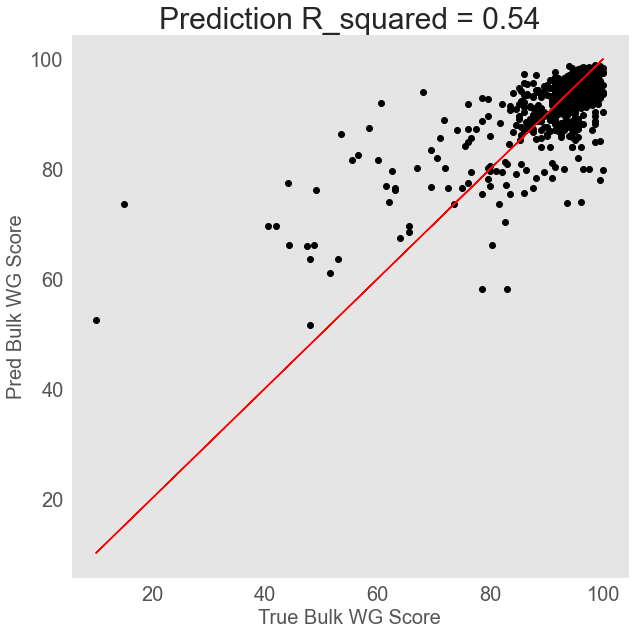

In [929]:
# df1 = pd.read_csv('~/Documents/Jupyter_Notebook/Soybean/soybean_bulk_fin_weather_10252020.csv')
# df1['wg_diff'] =  df1['fin_wg_current'] - df1['bulk_wg_current']
df1 = dbl_a10
corr_name = [
# 'Longitude',
# 'Latitude',
 'avg_dew_point_temp',
# 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
# 'min_temp',
 'max_temp',
 'days_Plant_Harv',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
      'wg_current',
#    'mg',
#    'fin_total_projected_units',
#    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
# 'wg_diff',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
print(l)

# Using classifier instead of regressor


X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

from sklearn.metrics import r2_score

# Data for plotting
x = y_test
y = y_forest_pred

r2 = f'{r2_score(x, y):.2f}'

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(x, y, 'o', color= 'black')
ax.plot(x, x, color = 'red')

ax.set(xlabel='True wg_diff', ylabel='Predicted wg_diff',
       title='R2 score is '+str(r2))

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel('True Bulk WG Score',fontsize = 20)
plt.ylabel('Pred Bulk WG Score',fontsize = 20)
plt.title('Prediction R_squared = '+str(r2), fontsize = 30)
ax.grid()

fig.savefig("test.png")
plt.show()


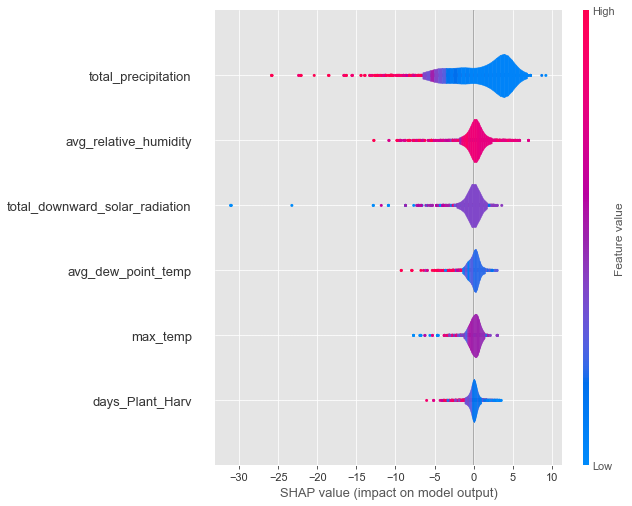

In [930]:
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

# Create an explainer object and compute Shapley values for each feature
explainer = shap.Explainer(forest)
shap_values = explainer(X_train)

# Compute the average Shapley value for each feature
#shap.summary_plot(shap_values, X_train, feature_names = feature_names)
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
plt.figure(figsize=(10,10))
shap.summary_plot(shap_values, X_train, plot_type = 'violin',feature_names = feature_names, show = False)
plt.gcf().set_size_inches(10,8)
plt.show()

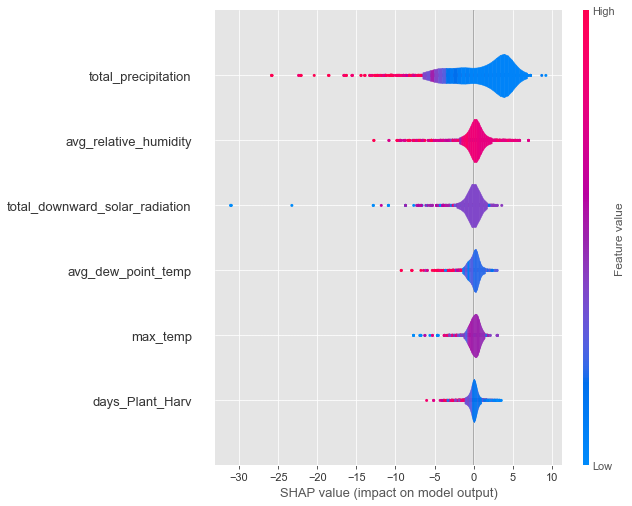

In [931]:
plt.figure(figsize=(10,10))
shap.summary_plot(shap_values, X_train, plot_type = 'violin',feature_names = feature_names, show = False)
plt.gcf().set_size_inches(10,8)
plt.show()

Elapsed time to compute the importances: 0.441 seconds


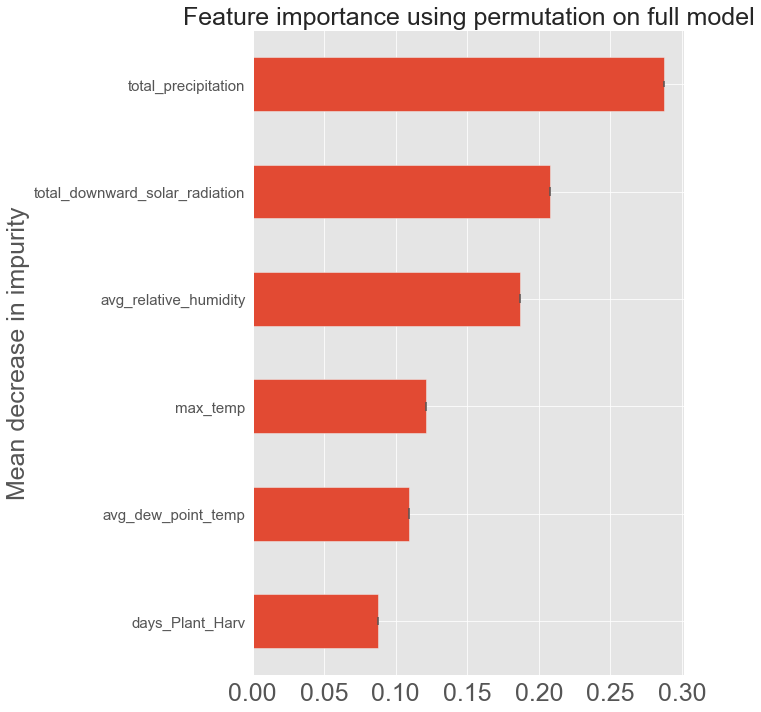

In [932]:
# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.barh(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 15)
fig.tight_layout()

In [933]:
pd.options.display.max_columns = 35
dbl_a10
#pd.options.display.max_columns = 28

,Unnamed: 0,index,crop_yr,grwng_cntrct,bulk_batch_nbr,Plnt,Plant Name,Final Acres,Harv Date,Planting Date Final,wg_current_dt,wg_current,total_bu,total_projected_units,bulk_seeds_per_lb,bulk_usable_pct,Region,Country,Plant PBC,loc1,Plant Lat,Plant Lon,avg_dew_point_temp,avg_wind_speed,avg_wind_direction,total_downward_solar_radiation,total_net_solar_radiation,avg_snow_depth,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_Plant_Harv,days_max_temp_above_30,days_min_temp_below_0
0,0,15981,2017,4608494017,BE74DP1,1745,BP Beaman IA,56.0,2017-09-22,2017-05-12 00:00:00,2017-10-17,96.5,2675.25,3199.270326,3400.0,82.07,Central West,US,8H12,1745,42.222851,-92.824670,14.866418,13.429851,197.902985,22.302664,17.974799,0.0,421.7,70.309701,15.450746,26.202985,134.0,25.0,0.0
1,1,17652,2017,4608492218,BE7SDD1,1745,BP Beaman IA,133.0,2017-10-23,2017-05-13 00:00:00,2017-11-21,94.5,2828.00,2618.899296,2630.0,82.16,Central West,US,8H12,1745,42.222851,-92.824670,14.019512,13.948171,195.170732,20.149457,16.261524,0.0,581.5,70.611585,14.601829,25.233537,164.0,27.0,0.0
2,2,17653,2017,4608492218,BE7SDD2,1745,BP Beaman IA,133.0,2017-10-23,2017-05-13 00:00:00,2017-11-21,94.5,4276.00,3997.717920,2597.0,84.00,Central West,US,8H12,1745,42.222851,-92.824670,14.019512,13.948171,195.170732,20.149457,16.261524,0.0,581.5,70.611585,14.601829,25.233537,164.0,27.0,0.0
3,3,17654,2017,4608495039,BE7SMJ1,1745,BP Beaman IA,96.0,2017-10-20,2017-05-08 00:00:00,2017-11-20,89.0,4871.33,4578.130075,2582.0,84.93,Central West,US,8H12,1745,42.222851,-92.824670,14.006024,13.784940,191.656627,20.429843,16.492596,0.0,592.1,70.456024,14.596988,25.283133,166.0,27.0,0.0
4,4,17655,2017,4608495046,BE7SMK1,1745,BP Beaman IA,56.0,2017-10-20,2017-05-08 00:00:00,2017-11-07,93.0,3231.00,3017.443916,2487.0,87.62,Central West,US,8H12,1745,42.222851,-92.824670,14.006024,13.784940,191.656627,20.429843,16.492596,0.0,592.1,70.456024,14.596988,25.283133,166.0,27.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3324,3324,51154,2017,4608489264,KN7SAB2,5645,Carter Cox,203.0,2017-10-04,2017-05-15 00:00:00,2017-10-16,97.5,3937.33,4506.392305,3140.0,85.05,Toller,US,8H72,5645,36.322560,-90.564863,18.415385,9.388811,166.503497,21.409552,17.418909,0.0,407.7,70.460140,19.719580,29.323077,143.0,62.0,0.0
3325,3325,51155,2017,4608489264,KN7SAB4,5645,Carter Cox,203.0,2017-10-04,2017-05-15 00:00:00,2017-10-16,97.0,4569.33,5288.079604,3201.0,84.36,Toller,US,8H72,5645,36.322560,-90.564863,18.415385,9.388811,166.503497,21.409552,17.418909,0.0,407.7,70.460140,19.719580,29.323077,143.0,62.0,0.0
3326,3326,51157,2017,4608489265,KN7SAB3,5645,Carter Cox,127.0,2017-10-05,2017-05-15 00:00:00,2017-10-16,98.0,2546.33,2955.900633,3265.0,82.96,Toller,US,8H72,5645,36.322560,-90.564863,18.393056,9.376389,166.444444,21.379528,17.397514,0.0,407.7,70.386806,19.713194,29.318750,144.0,62.0,0.0
3327,3327,51162,2017,4608493988,KN7SAB5,5645,Carter Cox,315.0,2017-10-02,2017-05-15 00:00:00,2017-10-16,95.0,2970.67,3398.318996,3228.0,82.69,Toller,US,8H72,5645,36.322560,-90.564863,18.432624,9.379433,166.687943,21.521574,17.505525,0.0,407.3,70.524113,19.707092,29.336879,141.0,62.0,0.0


# Yield Forecasting

In [934]:
dbl_b1 = dbl_a10.groupby(['crop_yr','grwng_cntrct','Final Acres'])[['bulk_batch_nbr', 'total_projected_units']].agg(['max', 'min', 'mean', 'std', 'count'])
print(dbl_b1.shape)
dbl_b1[dbl_b1[('total_projected_units', 'count')]==2]

(1756, 5)


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/4219095139.py:1: FutureWarning:

['bulk_batch_nbr'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.



total_projected_units                \
                                                   max           min   
crop_yr grwng_cntrct Final Acres                                       
2017    4608483959   581.00               12183.940957   9213.876155   
        4608484636   330.00               11530.347737  11464.214966   
        4608484638   219.00                9287.260737   9023.803299   
        4608484685   152.00                5762.845183   1526.780867   
        4608484853   522.00               21208.223347  16883.121559   
...                                                ...           ...   
2019    4608598036   514.00               22122.756105   3668.681331   
        4608598038   305.00                9178.413197   2315.246152   
        4608598039   298.82               12681.136822   4410.051736   
        4608598195   462.00               12862.522157   3703.890335   
        4608598424   366.00               16090.896039   1259.158040   

                                                                    
                                          mean           std count  
crop_yr grwng_cntrct Final Acres                                    
2017    4608483959   581.00       10698.908556   2100.152962     2  
        4608484636   330.00       11497.281352     46.762931     2  
        4608484638   219.00        9155.532018    186.292541     2  
        4608484685   152.00        3644.813025   2995.349804     2  
        4608484853   522.00       19045.672453   3058.308803     2  
...                                        ...           ...   ...  
2019    4608598036   514.00       12895.718718  13049.001413     2  
        4608598038   305.00        5746.829675   4852.991958     2  
        4608598039   298.82        8545.594279   5848.540352     2  
        4608598195   462.00        8283.206246   6476.130668     2  
        4608598424   366.00        8675.027039  10487.622516     2  

[553 rows x 5 columns]

In [935]:
dbl[dbl['grwng_cntrct']==4608483959]

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_planted_acres,sap_harvestedacres,fld_cntrct_dt,bulk_mtrl_nbr,bulk_batch_nbr,bin_receipt_bu,harvest_receipt_bu,conditioned_bu,released_bu,rejected_bu,...,grwr_pymnt,mfg_nm,acronym_cd,specie_cd,fem_bom_mtrl_nbr,fem_trait,gr_qty,inspct_lot_nbr,mtrl_desc,mtrl_typ_cd,crop_cd,mtrl_grp_nm,brnd_desc,trait,fin_prcs_ord_nbr,fin_plnt_cd,planting_date
60694,2017,1259.0,8H36,4608483959,103227110,AG39X7,594,581.0,581.0,2017-05-29 00:00:00,12533868,ST7SAG2,8424.00,11663.02,NaN,NaN,NaN,...,446722.25,,AG39X7,B,12533869.0,RR2 XTEND/SR,699781.0,40004716943,B AS AG39X7 SCT BULK-GR,HALB,B,Soybean Commercial,Asgrow,RR2 XTEND/SR,NaN,NaN,NaT
60695,2017,1259.0,8H36,4608483959,103227110,AG39X7,594,581.0,581.0,2017-05-29 00:00:00,12533868,ST7SAD3,4112.67,2626.00,NaN,NaN,NaN,...,446722.25,,AG39X7,B,12533869.0,RR2 XTEND/SR,157560.2,,B AS AG39X7 SCT BULK-GR,HALB,B,Soybean Commercial,Asgrow,RR2 XTEND/SR,103338754.0,1259,NaT
60696,2017,1259.0,8H36,4608483959,103227110,AG39X7,594,581.0,581.0,2017-05-29 00:00:00,12533868,ST7SAD1,9017.00,8475.67,NaN,NaN,NaN,...,446722.25,,AG39X7,B,12533869.0,RR2 XTEND/SR,508540.0,40004667556,B AS AG39X7 SCT BULK-GR,HALB,B,Soybean Commercial,Asgrow,RR2 XTEND/SR,103406839.0,1259,NaT
60697,2017,1259.0,8H36,4608483959,103227110,AG39X7,594,581.0,581.0,2017-05-29 00:00:00,12533868,ST7SAG1,9685.00,9170.93,NaN,NaN,NaN,...,446722.25,,AG39X7,B,12533869.0,RR2 XTEND/SR,550255.8,40004716959,B AS AG39X7 SCT BULK-GR,HALB,B,Soybean Commercial,Asgrow,RR2 XTEND/SR,NaN,NaN,NaT
60698,2017,1259.0,8H36,4608483959,103227110,AG39X7,594,581.0,581.0,2017-05-29 00:00:00,12533868,ST7SAD2,10259.00,9783.33,NaN,NaN,NaN,...,446722.25,,AG39X7,B,12533869.0,RR2 XTEND/SR,587000.0,40004667557,B AS AG39X7 SCT BULK-GR,HALB,B,Soybean Commercial,Asgrow,RR2 XTEND/SR,103338754.0,1259,NaT


In [936]:
dbl.shape
dbl.groupby('grwng_cntrct').count()
list(dbl)

['crop_yr',
 'p08_plnt_cd',
 'pbc_plnt_cd',
 'grwng_cntrct',
 'bulk_prcs_ord_nbr',
 'vrty_desc',
 'contract_acres',
 'sap_planted_acres',
 'sap_harvestedacres',
 'fld_cntrct_dt',
 'bulk_mtrl_nbr',
 'bulk_batch_nbr',
 'bin_receipt_bu',
 'harvest_receipt_bu',
 'conditioned_bu',
 'released_bu',
 'rejected_bu',
 'purch_ord_nbr',
 'ord_typ_cd',
 'field',
 'field_desc',
 'grwr_pymnt',
 'mfg_nm',
 'acronym_cd',
 'specie_cd',
 'fem_bom_mtrl_nbr',
 'fem_trait',
 'gr_qty',
 'inspct_lot_nbr',
 'mtrl_desc',
 'mtrl_typ_cd',
 'crop_cd',
 'mtrl_grp_nm',
 'brnd_desc',
 'trait',
 'fin_prcs_ord_nbr',
 'fin_plnt_cd',
 'planting_date']

In [937]:
dbl_b0 = dbl[['crop_yr', 'p08_plnt_cd', 'pbc_plnt_cd', 'grwng_cntrct',
     'bulk_prcs_ord_nbr','vrty_desc','contract_acres', 
     'sap_planted_acres', 'sap_harvestedacres', 'fld_cntrct_dt', 'bulk_mtrl_nbr',
    'grwr_pymnt','acronym_cd']].drop_duplicates().dropna()
dbl_b0.groupby('grwng_cntrct').count()
dbl_b0.shape

(34346, 13)

In [938]:
dbl_b00 = dbl[['crop_yr', 'p08_plnt_cd', 'pbc_plnt_cd', 'grwng_cntrct','bulk_prcs_ord_nbr',
 'vrty_desc','contract_acres', 
'sap_harvestedacres'
   ]].drop_duplicates().dropna()
dbl_b00.shape

(38534, 8)

In [939]:
dbl_b2 = dbl.groupby('grwng_cntrct')[['bin_receipt_bu','harvest_receipt_bu']].sum().dropna()
dbl_b3 = dbl_b0.merge(dbl_b2, how = 'inner', on = 'grwng_cntrct').drop_duplicates('grwng_cntrct')
dbl_b3.shape

(28341, 15)

In [940]:
#dbl_b2 = dbl.groupby('grwng_cntrct')[['bin_receipt_bu']].sum().dropna()

dbl_b33 = dbl_b00.merge(dbl_b2, how = 'inner', on = 'grwng_cntrct').drop_duplicates('grwng_cntrct')
dbl_b33.shape

(32054, 10)

In [941]:
dbl_b33.head()

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu
0,2020,1259.0,8H36,4608632485,2502130327,A3253,399,399.0,56000.0,57793.333334
1,2020,1259.0,8H36,4608633622,2502130328,A3253,300,300.0,22782.0,23036.666667
2,2020,1259.0,8H36,4608633623,2502130329,A3253,80,80.0,5000.0,5644.660000
3,2021,1259.0,8H36,4600001917,2502233276,A3253,45,42.0,6100.0,1.666666
4,2021,1259.0,8H36,4600001919,2502233277,A3253,155,155.0,21200.0,16220.666666


In [942]:
dbl_b3.merge(dpl1, how = 'inner', left_on = 'grwng_cntrct', right_on ='Agreement Nbr').dropna()

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_planted_acres,sap_harvestedacres,fld_cntrct_dt,bulk_mtrl_nbr,grwr_pymnt,acronym_cd,bin_receipt_bu,harvest_receipt_bu,Plnt,Plant Name,Crop Year,Agreement Nbr,Contract Area,Final Acres,Harv Date,Planting Date Final
0,2017,1259.0,8H36,4608490233,103225810,A3555,35,35.0,35.00,2017-05-18 00:00:00,10742519,23657.37,A3555,2031.0,2034.67,1259,BP Stonington IL,2017,4608490233,35.0,35.00,2017-09-29,2017-05-18 00:00:00
1,2017,1259.0,8H36,4608490237,103225812,A3555,45,45.0,45.00,2017-05-18 00:00:00,10742519,30881.07,A3555,2808.0,2646.67,1259,BP Stonington IL,2017,4608490237,45.0,45.00,2017-09-29,2017-05-18 00:00:00
2,2018,1259.0,8H36,4608544130,103506808,A3555,160,160.0,160.00,2018-05-07 00:00:00,10742519,122523.22,A3555,11033.0,10763.00,1259,BP Stonington IL,2018,4608544130,160.0,160.00,2018-09-16,2018-05-07 00:00:00
3,2018,1259.0,8H36,4608544131,103506809,A3555,45,45.0,45.00,2018-05-08 00:00:00,10742519,33834.66,A3555,3238.0,2991.00,1259,BP Stonington IL,2018,4608544131,45.0,45.00,2018-09-17,2018-05-08 00:00:00
4,2017,1259.0,8H36,4608490236,103225811,A3555,140,140.0,140.00,2017-05-17 00:00:00,10742528,104987.05,A3555,8856.0,8936.67,1259,BP Stonington IL,2017,4608490236,140.0,140.00,2017-09-26,2017-05-17 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1965,2019,5353.0,8H71,4608596552,103818858,AG53X0,200,206.0,206.29,2019-06-24 00:00:00,12972190,98796.40,AG53X0,9450.0,9881.67,5353,Cherry Farms,2019,4608596552,200.0,206.29,2019-11-14,2019-05-29 19:12:00
1966,2019,5353.0,8H71,4608598034,103818950,AG53X0,274,302.0,302.00,2019-06-14 00:00:00,12972190,136538.66,AG53X0,12900.0,12700.00,5353,Cherry Farms,2019,4608598034,274.0,302.00,2019-11-13,2019-06-07 00:00:00
1967,2019,5353.0,8H71,4608596557,103818863,AG69X0,331,391.0,390.60,2019-07-05 00:00:00,12972257,77959.29,AG69X0,7400.0,7597.66,5353,Cherry Farms,2019,4608596557,331.0,390.60,2019-12-11,2019-06-20 15:25:43
1968,2019,5353.0,8H71,4608596573,103818876,AG69X0,500,545.0,545.00,2019-05-31 00:00:00,12972257,237622.99,AG69X0,23100.0,22290.66,5353,Cherry Farms,2019,4608596573,500.0,545.00,2019-11-19,2019-05-30 00:00:00


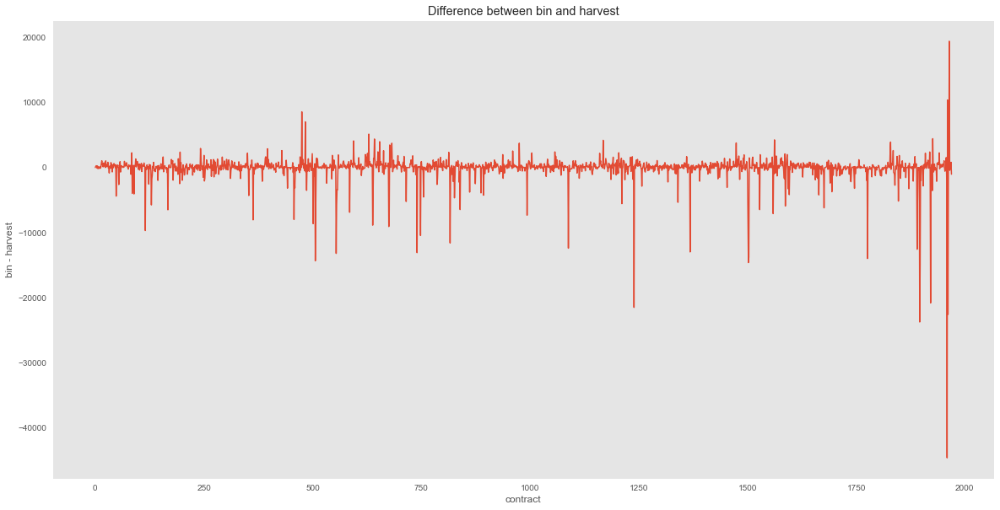

In [943]:
# Data for plotting
temp = dbl_b3.merge(dpl1, how = 'inner', left_on = 'grwng_cntrct', right_on ='Agreement Nbr').dropna()
t = np.arange(0,1970,1)
s = temp.bin_receipt_bu
u = temp.harvest_receipt_bu
v = s - u

fig, ax = plt.subplots(figsize=(20,10))
ax.plot(t, v)

ax.set(xlabel='contract', ylabel='bin - harvest',
       title='Difference between bin and harvest')
ax.grid()

fig.savefig("test.png")
plt.show()

In [944]:
list(dbl_a10)
list_yield = [
 'grwng_cntrct',
 'Plnt',
 'total_bu',
 'Region',
 'Country',
 'Plant PBC',
 'Plant Lat',
 'Plant Lon',
 'avg_dew_point_temp',
 'avg_wind_speed',
 'avg_wind_direction',
 'total_downward_solar_radiation',
 'total_net_solar_radiation',
 'avg_snow_depth',
 'total_precipitation',
 'avg_relative_humidity',
 'min_temp',
 'max_temp',
 'days_Plant_Harv',
 'days_max_temp_above_30']
dbl_a10[list_yield].drop_duplicates('grwng_cntrct')

,grwng_cntrct,Plnt,total_bu,Region,Country,Plant PBC,Plant Lat,Plant Lon,avg_dew_point_temp,avg_wind_speed,avg_wind_direction,total_downward_solar_radiation,total_net_solar_radiation,avg_snow_depth,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_Plant_Harv,days_max_temp_above_30
0,4608494017,1745,2675.25,Central West,US,8H12,42.222851,-92.824670,14.866418,13.429851,197.902985,22.302664,17.974799,0.0,421.7,70.309701,15.450746,26.202985,134.0,25.0
1,4608492218,1745,2828.00,Central West,US,8H12,42.222851,-92.824670,14.019512,13.948171,195.170732,20.149457,16.261524,0.0,581.5,70.611585,14.601829,25.233537,164.0,27.0
3,4608495039,1745,4871.33,Central West,US,8H12,42.222851,-92.824670,14.006024,13.784940,191.656627,20.429843,16.492596,0.0,592.1,70.456024,14.596988,25.283133,166.0,27.0
4,4608495046,1745,3231.00,Central West,US,8H12,42.222851,-92.824670,14.006024,13.784940,191.656627,20.429843,16.492596,0.0,592.1,70.456024,14.596988,25.283133,166.0,27.0
5,4608495323,1745,4737.33,Central West,US,8H12,42.222851,-92.824670,14.125767,13.709202,192.000000,20.547331,16.584589,0.0,592.1,70.631288,14.703067,25.315951,163.0,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3322,4608488972,5645,1283.33,Toller,US,8H72,36.322560,-90.564863,18.371724,9.395172,166.517241,21.353379,17.379566,0.0,407.7,70.308966,19.704138,29.322069,145.0,62.0
3323,4608488973,5645,14676.33,Toller,US,8H72,36.322560,-90.564863,18.371724,9.395172,166.517241,21.353379,17.379566,0.0,407.7,70.308966,19.704138,29.322069,145.0,62.0
3324,4608489264,5645,3937.33,Toller,US,8H72,36.322560,-90.564863,18.415385,9.388811,166.503497,21.409552,17.418909,0.0,407.7,70.460140,19.719580,29.323077,143.0,62.0
3326,4608489265,5645,2546.33,Toller,US,8H72,36.322560,-90.564863,18.393056,9.376389,166.444444,21.379528,17.397514,0.0,407.7,70.386806,19.713194,29.318750,144.0,62.0


In [945]:
dbl_b4 = dbl_b3.merge(dpl1, how = 'inner', left_on = 'grwng_cntrct', right_on ='Agreement Nbr').merge(dbl_a10[list_yield].drop_duplicates('grwng_cntrct'), how = 'inner', on = 'grwng_cntrct')
dbl_b4.shape
dbl_b3.shape

(28341, 15)

In [946]:
dbl_b4.head()

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_planted_acres,sap_harvestedacres,fld_cntrct_dt,bulk_mtrl_nbr,grwr_pymnt,acronym_cd,bin_receipt_bu,harvest_receipt_bu,Plnt_x,Plant Name,...,Region,Country,Plant PBC,Plant Lat,Plant Lon,avg_dew_point_temp,avg_wind_speed,avg_wind_direction,total_downward_solar_radiation,total_net_solar_radiation,avg_snow_depth,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_Plant_Harv,days_max_temp_above_30
0,2017,1259.0,8H36,4608490233,103225810,A3555,35,35.0,35.0,2017-05-18 00:00:00,10742519,23657.37,A3555,2031.0,2034.67,1259,BP Stonington IL,...,Central East,US,8H36,39.632138,-89.197108,15.154074,11.192593,186.748148,22.159022,17.903578,0.0,320.1,64.201481,17.272593,28.635556,135.0,51.0
1,2017,1259.0,8H36,4608490237,103225812,A3555,45,45.0,45.0,2017-05-18 00:00:00,10742519,30881.07,A3555,2808.0,2646.67,1259,BP Stonington IL,...,Central East,US,8H36,39.632138,-89.197108,15.154074,11.192593,186.748148,22.159022,17.903578,0.0,320.1,64.201481,17.272593,28.635556,135.0,51.0
2,2018,1259.0,8H36,4608544130,103506808,A3555,160,160.0,160.0,2018-05-07 00:00:00,10742519,122523.22,A3555,11033.0,10763.00,1259,BP Stonington IL,...,Central East,US,8H36,39.632138,-89.197108,18.222556,10.987970,180.157895,22.035902,17.788925,0.0,519.3,71.662406,19.107519,29.084211,133.0,60.0
3,2018,1259.0,8H36,4608544131,103506809,A3555,45,45.0,45.0,2018-05-08 00:00:00,10742519,33834.66,A3555,3238.0,2991.00,1259,BP Stonington IL,...,Central East,US,8H36,39.632138,-89.197108,18.312030,10.970677,181.774436,21.957887,17.728316,0.0,519.4,71.800000,19.166917,29.145113,133.0,61.0
4,2017,1259.0,8H36,4608490236,103225811,A3555,140,140.0,140.0,2017-05-17 00:00:00,10742528,104987.05,A3555,8856.0,8936.67,1259,BP Stonington IL,...,Central East,US,8H36,39.632138,-89.197108,15.339850,11.284962,183.180451,22.295398,18.005609,0.0,320.8,64.440602,17.441353,28.718045,133.0,51.0


6


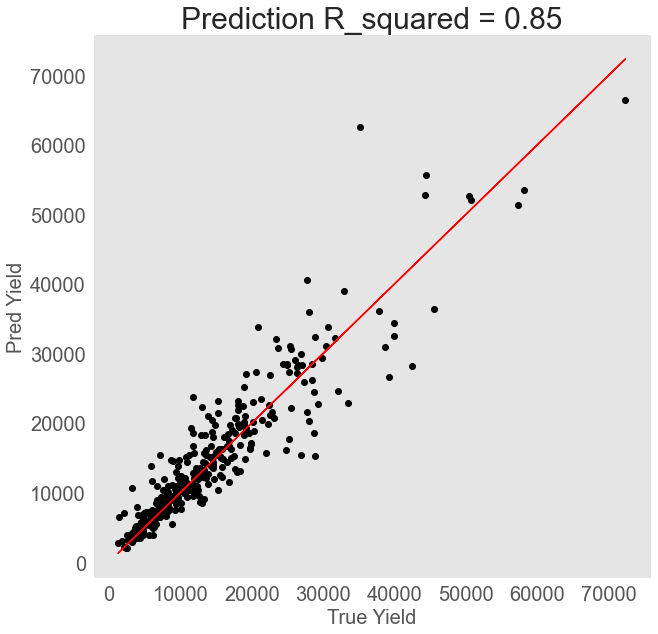

In [947]:
df1 = dbl_b4
corr_name = [
# 'Longitude',
# 'Latitude',
# 'Plant PBC',
 'Final Acres',
# 'grwr_pymnt',
# 'vrty_desc',
 
 'avg_dew_point_temp',
 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
# 'avg_relative_humidity',
# 'min_temp',
 'max_temp',
# 'days_Plant_Harv',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
      'harvest_receipt_bu',
#    'mg',
#    'fin_total_projected_units',
#    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
# 'wg_diff',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
print(l)

# Using classifier instead of regressor


X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

from sklearn.metrics import r2_score

# Data for plotting
x = y_test
y = y_forest_pred

r2 = f'{r2_score(x, y):.2f}'

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(x, y, 'o', color= 'black')
ax.plot(x, x, color = 'red')

ax.set(xlabel='True yield', ylabel='Predicted yield',
       title='R2 score is '+str(r2))

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel('True Yield',fontsize = 20)
plt.ylabel('Pred Yield',fontsize = 20)
plt.title('Prediction R_squared = '+str(r2), fontsize = 30)
ax.grid()

fig.savefig("test.png")
plt.show()


Elapsed time to compute the importances: 0.361 seconds


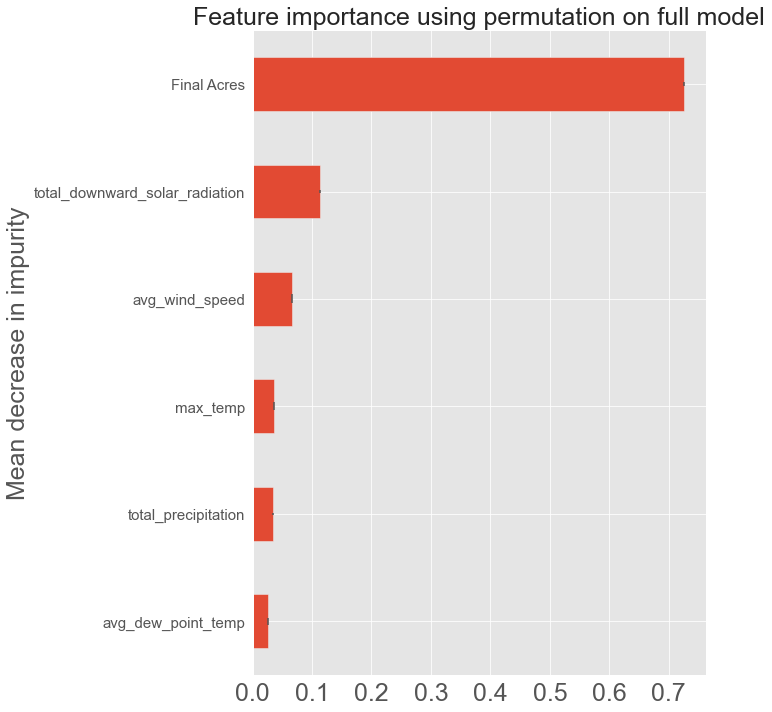

In [948]:
# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.barh(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 15)
fig.tight_layout()

In [949]:
df = df1[corr_name].dropna()
#df = dfb_ag08[corr_name]

corr = df.corr()
#corr.style.background_gradient(cmap='coolwarm').set_precision(3)
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(null_color='#f1f1f1')  # Color NaNs grey
 .set_precision(3))

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3905832175.py:9: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Final Acres,avg_dew_point_temp,avg_wind_speed,total_downward_solar_radiation,total_precipitation,max_temp,harvest_receipt_bu
Final Acres,nan,nan,nan,nan,nan,nan,nan
avg_dew_point_temp,0.290,nan,nan,nan,nan,nan,nan
avg_wind_speed,-0.398,-0.735,nan,nan,nan,nan,nan
total_downward_solar_radiation,-0.385,-0.305,0.256,nan,nan,nan,nan
total_precipitation,0.192,0.302,-0.078,-0.668,nan,nan,nan
max_temp,0.054,0.588,-0.677,0.445,-0.390,nan,nan
harvest_receipt_bu,0.820,0.206,-0.278,-0.067,0.027,0.194,nan


5


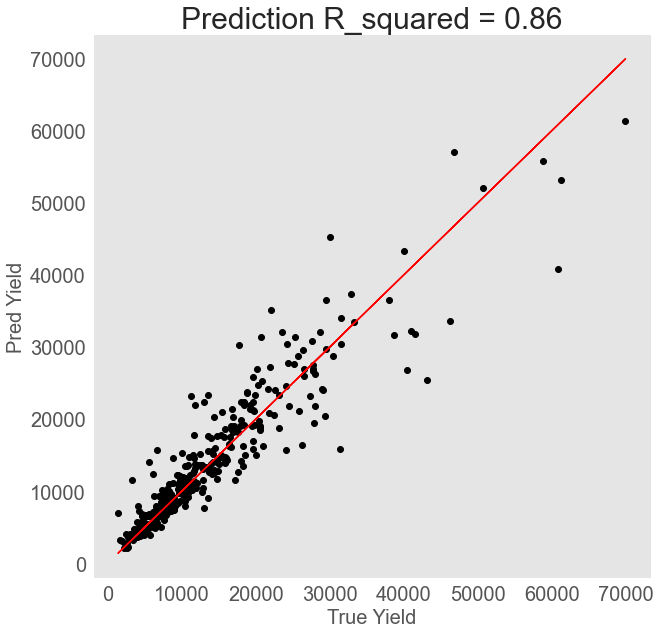

In [950]:
df1 = dbl_b4
corr_name = [
# 'Longitude',
# 'Latitude',
# 'Plant PBC',
 'Final Acres',
# 'grwr_pymnt',
# 'vrty_desc',
 
 'avg_dew_point_temp',
# 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
# 'avg_relative_humidity',
# 'min_temp',
 'max_temp',
# 'days_Plant_Harv',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
      'bin_receipt_bu',
#    'mg',
#    'fin_total_projected_units',
#    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
# 'wg_diff',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
print(l)

# Using classifier instead of regressor


X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

from sklearn.metrics import r2_score

# Data for plotting
x = y_test
y = y_forest_pred

r2 = f'{r2_score(x, y):.2f}'

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(x, y, 'o', color= 'black')
ax.plot(x, x, color = 'red')

ax.set(xlabel='True yield', ylabel='Predicted yield',
       title='R2 score is '+str(r2))

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel('True Yield',fontsize = 20)
plt.ylabel('Pred Yield',fontsize = 20)
plt.title('Prediction R_squared = '+str(r2), fontsize = 30)
ax.grid()

fig.savefig("test.png")
plt.show()


Elapsed time to compute the importances: 0.322 seconds


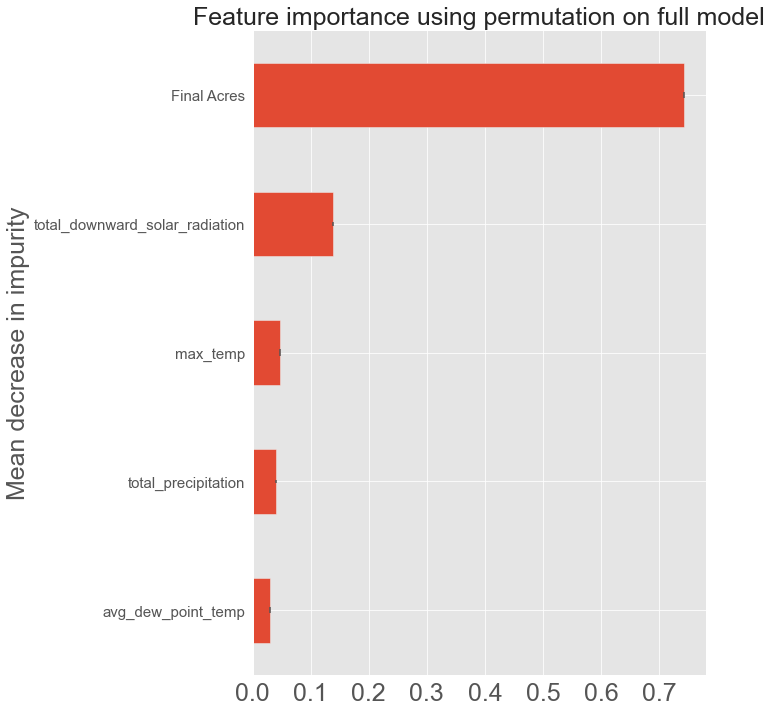

In [951]:
# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.barh(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 15)
fig.tight_layout()

# Shap Values 

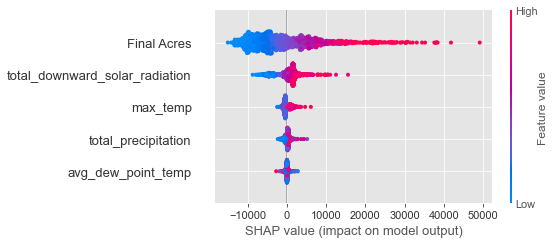

In [952]:
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import load_boston

# Load Boston housing data and create a random forest model
# X, y = load_boston(return_X_y=True)
# rf = RandomForestRegressor(n_estimators=100, random_state=0)
# rf.fit(X, y)

forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

# Create an explainer object and compute Shapley values for each feature
explainer = shap.Explainer(forest)
shap_values = explainer(X_train)

# Compute the average Shapley value for each feature
shap.summary_plot(shap_values, X_train, feature_names = feature_names)

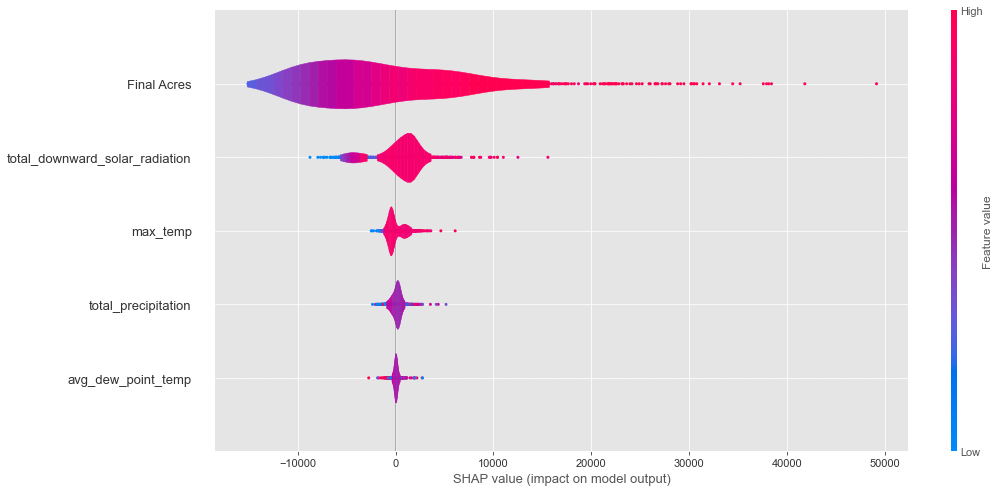

In [953]:
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
plt.figure(figsize=(20,10))
shap.summary_plot(shap_values, X_train, plot_type = 'violin',feature_names = feature_names, show = False)
plt.gcf().set_size_inches(20,8)
plt.show()

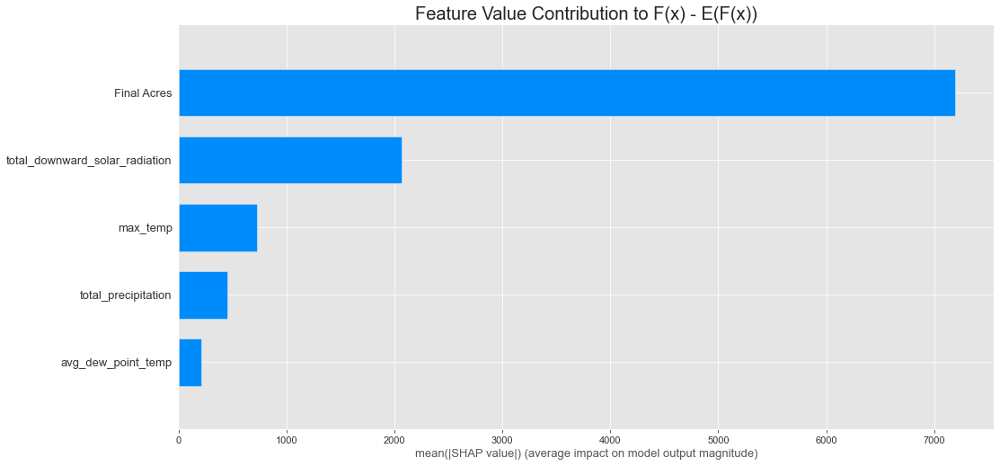

In [954]:
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
plt.figure(figsize=(20,10))
shap.summary_plot(shap_values, X_train, plot_type = 'bar',feature_names = feature_names, show = False)
plt.gcf().set_size_inches(20,8)
plt.title('Feature Value Contribution to F(x) - E(F(x))', fontsize = 20)
#plt.xlabel('Actual Prediction')
plt.show()

In [955]:
from shap import TreeExplainer, Explanation
from shap.plots import waterfall
import shap
from sklearn.ensemble import RandomForestRegressor


forest = RandomForestRegressor(random_state=0)
model = forest.fit(X_train, y_train)
#y_forest_pred = forest.predict(X_test)

# Create an explainer object and compute Shapley values for each feature
explainer = TreeExplainer(model)
sv = explainer(X_train)
exp = Explanation(sv.values, 
                  sv.base_values[0][0], 
                  sv.data, 
                  feature_names=feature_names)
idx = 0
#waterfall(exp[idx])

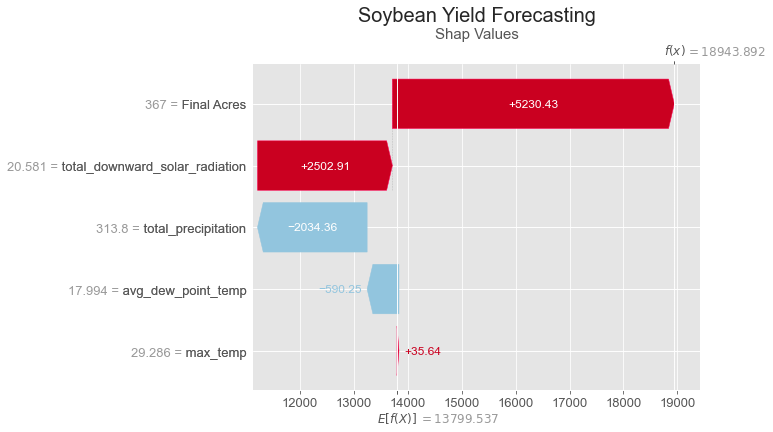

In [956]:
import matplotlib
import matplotlib.pyplot as plt

idx = 150
# Default SHAP colors
default_pos_color = "#ff0051"
default_neg_color = "#008bfb"
# Custom colors
positive_color = "#ca0020"
negative_color = "#92c5de"

# set the figure facecolor to light blue
plt.rcParams['figure.facecolor'] = 'white'
# Plot Waterfall Plot
fig = plt.figure()
shap.plots.waterfall(exp[idx], show = False)
plt.gcf().set_size_inches(8,6)

plt.title("Soybean Yield Forecasting", fontsize = 20) 
plt.xlabel("Shap Values", fontsize = 15)
#plt.xlim([-12,12])

# Change the colormap of the artists
for fc in plt.gcf().get_children():
    for fcc in fc.get_children():
        if (isinstance(fcc, matplotlib.patches.FancyArrow)):
            if (matplotlib.colors.to_hex(fcc.get_facecolor()) == default_pos_color):
                fcc.set_facecolor(positive_color)
            elif (matplotlib.colors.to_hex(fcc.get_facecolor()) == default_neg_color):
                fcc.set_color(negative_color)
        elif (isinstance(fcc, plt.Text)):
            if (matplotlib.colors.to_hex(fcc.get_color()) == default_pos_color):
                fcc.set_color(positive_color)
            elif (matplotlib.colors.to_hex(fcc.get_color()) == default_neg_color):
                fcc.set_color(negative_color)
plt.show()

In [957]:
exp[idx]

.values =
array([ 5230.42823211,  -590.25474274,  2502.90568687, -2034.36107525,
          35.63737074])

.base_values =
13799.536528262435

.data =
array([367.        ,  17.99416058,  20.5809635 , 313.8       ,
        29.28613139])

['5230.43', '-590.25', '2502.91', '-2034.36', '35.64', '5144.37']


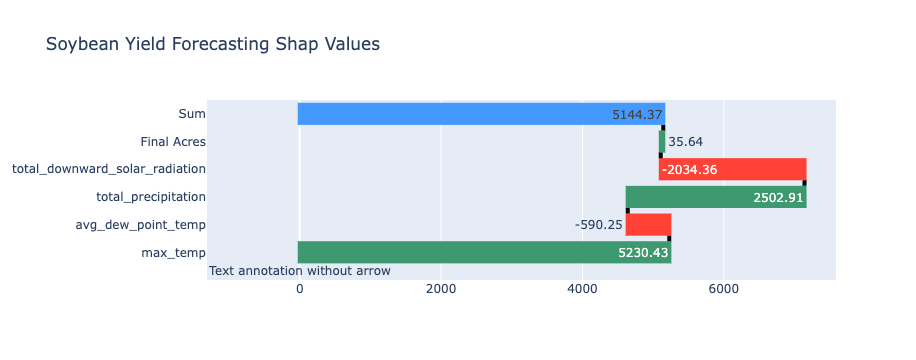

In [958]:
idx = 150
xx = exp[idx].values.tolist()
xx = [round(elem, 2) for elem in xx]
tt = xx
tt.append(round(sum(xx),2))
tt = [str(k) for k in xx]
print(tt)
xx.append(None)


import plotly.graph_objects as go

fig = go.Figure(go.Waterfall(
    #name = "2018", 
    orientation = "h", measure = ["relative", "relative", "relative", "relative", "relative", "total"],
    y = ["max_temp", "avg_dew_point_temp", "total_precipitation", "total_downward_solar_radiation", "Final Acres", "Sum"],
    x = xx,
    text = tt,
    connector = {"mode":"between", "line":{"width":4, "color":"rgb(0, 0, 0)", "dash":"solid"}}
))

#fig.title("Soybean Yield Forecasting", fontsize = 20) 
#plt.xlabel("Shap Values", fontsize = 15)
fig.add_annotation(x=4, y=-1,
            text="Text annotation without arrow",
            showarrow=False,
            yshift=10)
fig.update_layout(title = "Soybean Yield Forecasting Shap Values")

fig.show()

Text(0.5, 0, 'Shap Values')

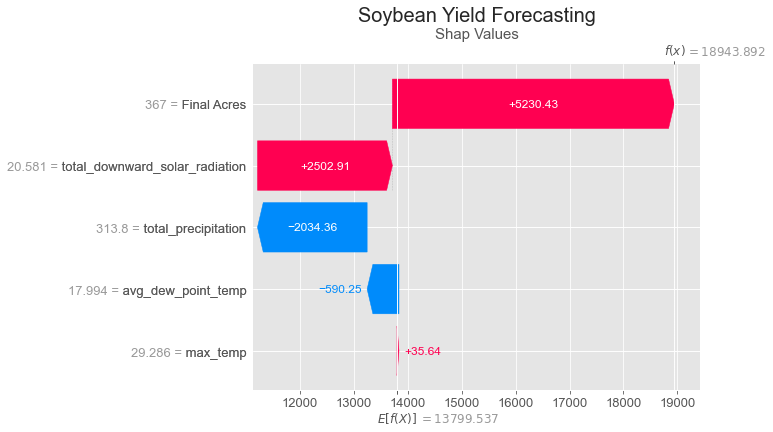

In [959]:
idx = 150
# Default SHAP colors
default_pos_color = "#ff0051"
default_neg_color = "#008bfb"
# Custom colors
positive_color = "#ca0020"
negative_color = "#92c5de"

# set the figure facecolor to light blue
plt.rcParams['figure.facecolor'] = 'white'
# Plot Waterfall Plot
fig = plt.figure()
shap.plots.waterfall(exp[idx], show = False)
plt.gcf().set_size_inches(8,6)

plt.title("Soybean Yield Forecasting", fontsize = 20) 
plt.xlabel("Shap Values", fontsize = 15)

In [960]:
df1 = dbl_b4
df1['ypa'] = df1['bin_receipt_bu']/df1['Final Acres']
df1['Latitude'] = df1['Plant Lat']
df1['Longitude'] = df1['Plant Lon']
df = df1
#Create Map
m = folium.Map([43.5485, -93.1201], zoom_start=5.5, tiles='cartodbpositron')

#plot polygon
#folium.GeoJson(polygon).add_to(m)
folium.LatLngPopup().add_to(m)

#Plot Values
# crop_yr = 2020
# df = dfb_ag12[dfb_ag12['crop_yr']==crop_yr]
cr = 5
colormap1 = cm.LinearColormap(colors=['blue','white','red'], index=[-cr,0,cr],vmin=-cr,vmax=cr)
colormap2 = cm.LinearColormap(colors=['yellow','red'], index=[89,98],
                              vmin=59,vmax=200,
                             caption = 'Warm Germination Score')

p1 = 'ypa'
p2 = 'fin_wg_wt_avg'
p3 = 'diff_wg'

lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df[p1])

for loc, p in zip(zip(lat, lon), to_plot):
    folium.CircleMarker(location=loc,
        radius=15,
        fill=True,
        color=colormap2(p),
        fill_opacity=1
    ).add_to(m)
m.add_child(colormap2)

5


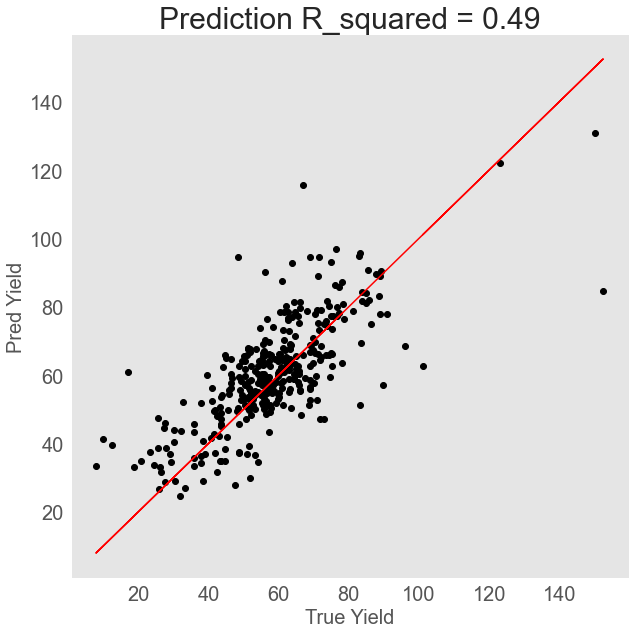

In [961]:
# Yield per Area Prediction
df1 = dbl_b4
df1['ypa'] = df1['bin_receipt_bu']/df1['Final Acres']
corr_name = [
# 'Longitude',
# 'Latitude',
# 'Plant PBC',
# 'Final Acres',
# 'grwr_pymnt',
# 'vrty_desc',
 
 'avg_dew_point_temp',
# 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
# 'avg_relative_humidity',
 'min_temp',
 'max_temp',
# 'days_Plant_Harv',
# 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
#      'bin_receipt_bu',
    'ypa',
#    'mg',
#    'fin_total_projected_units',
#    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
# 'wg_diff',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
print(l)

# Using classifier instead of regressor


X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

from sklearn.metrics import r2_score

# Data for plotting
x = y_test
y = y_forest_pred

r2 = f'{r2_score(x, y):.2f}'

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(x, y, 'o', color= 'black')
ax.plot(x, x, color = 'red')

ax.set(xlabel='True yield', ylabel='Predicted yield',
       title='R2 score is '+str(r2))

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel('True Yield',fontsize = 20)
plt.ylabel('Pred Yield',fontsize = 20)
plt.title('Prediction R_squared = '+str(r2), fontsize = 30)
ax.grid()

fig.savefig("test.png")
plt.show()


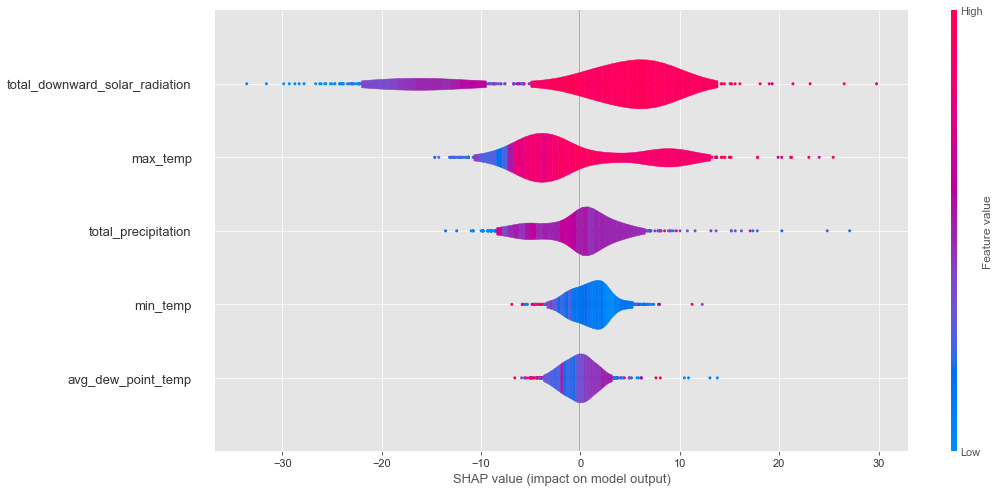

In [962]:
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

# Create an explainer object and compute Shapley values for each feature
explainer = shap.Explainer(forest)
shap_values = explainer(X_train)

# Compute the average Shapley value for each feature
#shap.summary_plot(shap_values, X_train, feature_names = feature_names)
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
plt.figure(figsize=(20,10))
shap.summary_plot(shap_values, X_train, plot_type = 'violin',feature_names = feature_names, show = False)
plt.gcf().set_size_inches(20,8)
plt.show()

In [963]:
df1

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_planted_acres,sap_harvestedacres,fld_cntrct_dt,bulk_mtrl_nbr,grwr_pymnt,acronym_cd,bin_receipt_bu,harvest_receipt_bu,Plnt_x,Plant Name,...,Plant Lat,Plant Lon,avg_dew_point_temp,avg_wind_speed,avg_wind_direction,total_downward_solar_radiation,total_net_solar_radiation,avg_snow_depth,total_precipitation,avg_relative_humidity,min_temp,max_temp,days_Plant_Harv,days_max_temp_above_30,ypa,Latitude,Longitude
0,2017,1259.0,8H36,4608490233,103225810,A3555,35,35.0,35.00,2017-05-18 00:00:00,10742519,23657.37,A3555,2031.0,2034.67,1259,BP Stonington IL,...,39.632138,-89.197108,15.154074,11.192593,186.748148,22.159022,17.903578,0.0,320.1,64.201481,17.272593,28.635556,135.0,51.0,58.028571,39.632138,-89.197108
1,2017,1259.0,8H36,4608490237,103225812,A3555,45,45.0,45.00,2017-05-18 00:00:00,10742519,30881.07,A3555,2808.0,2646.67,1259,BP Stonington IL,...,39.632138,-89.197108,15.154074,11.192593,186.748148,22.159022,17.903578,0.0,320.1,64.201481,17.272593,28.635556,135.0,51.0,62.400000,39.632138,-89.197108
2,2018,1259.0,8H36,4608544130,103506808,A3555,160,160.0,160.00,2018-05-07 00:00:00,10742519,122523.22,A3555,11033.0,10763.00,1259,BP Stonington IL,...,39.632138,-89.197108,18.222556,10.987970,180.157895,22.035902,17.788925,0.0,519.3,71.662406,19.107519,29.084211,133.0,60.0,68.956250,39.632138,-89.197108
3,2018,1259.0,8H36,4608544131,103506809,A3555,45,45.0,45.00,2018-05-08 00:00:00,10742519,33834.66,A3555,3238.0,2991.00,1259,BP Stonington IL,...,39.632138,-89.197108,18.312030,10.970677,181.774436,21.957887,17.728316,0.0,519.4,71.800000,19.166917,29.145113,133.0,61.0,71.955556,39.632138,-89.197108
4,2017,1259.0,8H36,4608490236,103225811,A3555,140,140.0,140.00,2017-05-17 00:00:00,10742528,104987.05,A3555,8856.0,8936.67,1259,BP Stonington IL,...,39.632138,-89.197108,15.339850,11.284962,183.180451,22.295398,18.005609,0.0,320.8,64.440602,17.441353,28.718045,133.0,51.0,63.257143,39.632138,-89.197108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734,2019,5353.0,8H71,4608596552,103818858,AG53X0,200,206.0,206.29,2019-06-24 00:00:00,12972190,98796.40,AG53X0,9450.0,9881.67,5353,Cherry Farms,...,35.766285,-76.180380,18.830178,10.215385,164.715976,18.756006,16.508462,0.0,868.1,77.871598,19.063905,28.088757,169.0,76.0,45.809298,35.766285,-76.180380
1735,2019,5353.0,8H71,4608598034,103818950,AG53X0,274,302.0,302.00,2019-06-14 00:00:00,12972190,136538.66,AG53X0,12900.0,12700.00,5353,Cherry Farms,...,35.766285,-76.180380,18.916250,10.234375,163.950000,18.524056,16.304581,0.0,818.3,78.103125,19.154375,28.106250,160.0,73.0,42.715232,35.766285,-76.180380
1736,2019,5353.0,8H71,4608596557,103818863,AG69X0,331,391.0,390.60,2019-07-05 00:00:00,12972257,77959.29,AG69X0,7400.0,7597.66,5353,Cherry Farms,...,35.766285,-76.180380,16.733333,10.594253,167.316092,16.716638,14.746874,0.0,812.8,77.578736,16.940805,25.956897,174.0,68.0,18.945212,35.766285,-76.180380
1737,2019,5353.0,8H71,4608596573,103818876,AG69X0,500,545.0,545.00,2019-05-31 00:00:00,12972257,237622.99,AG69X0,23100.0,22290.66,5353,Cherry Farms,...,35.766285,-76.180380,18.541954,10.396552,164.103448,18.368868,16.170592,0.0,918.4,78.125287,18.783908,27.641379,174.0,76.0,42.385321,35.766285,-76.180380


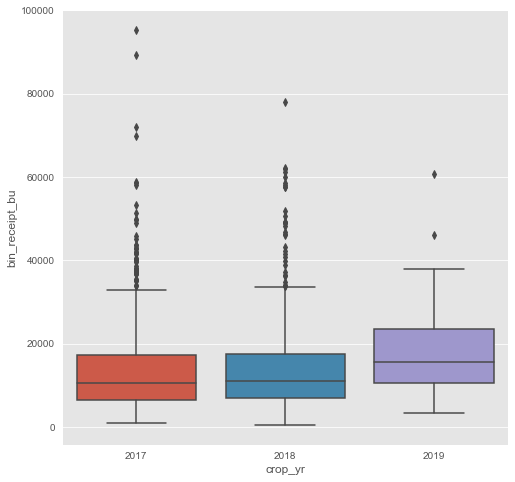

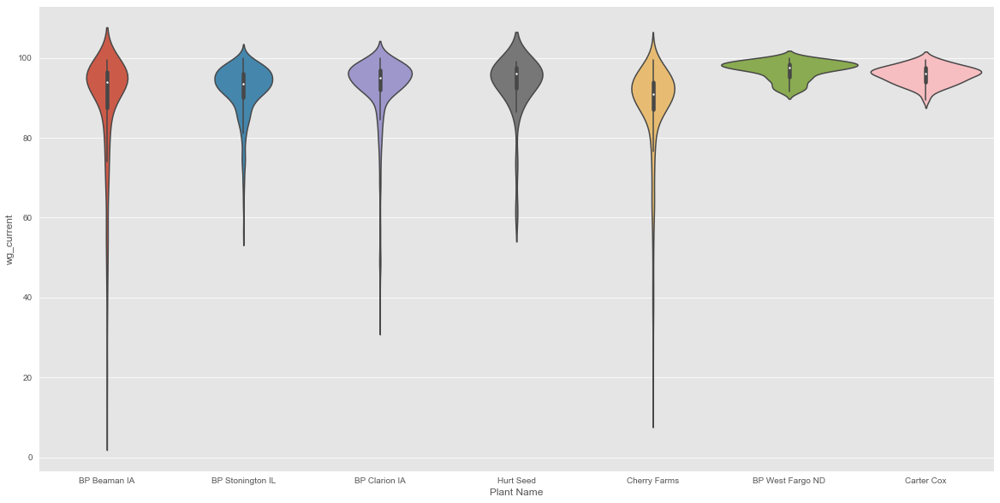

In [964]:
import seaborn as sns
import matplotlib.pyplot as plt
df1 = dbl_b4

df = df1
df.head()

# plt.figure(figsize=(20,10))
# sns.boxplot( x=df["Plant Name"], y=df["ypa"], width=0.5);
# plt.show()

plt.figure(figsize=(8,8))
sns.boxplot( x=df["crop_yr"], y=df["bin_receipt_bu"]);
plt.show()

df = dbl_a10
plt.figure(figsize=(20,10))
sns.violinplot( x=df["Plant Name"], y=df["wg_current"], width=1);
plt.show()

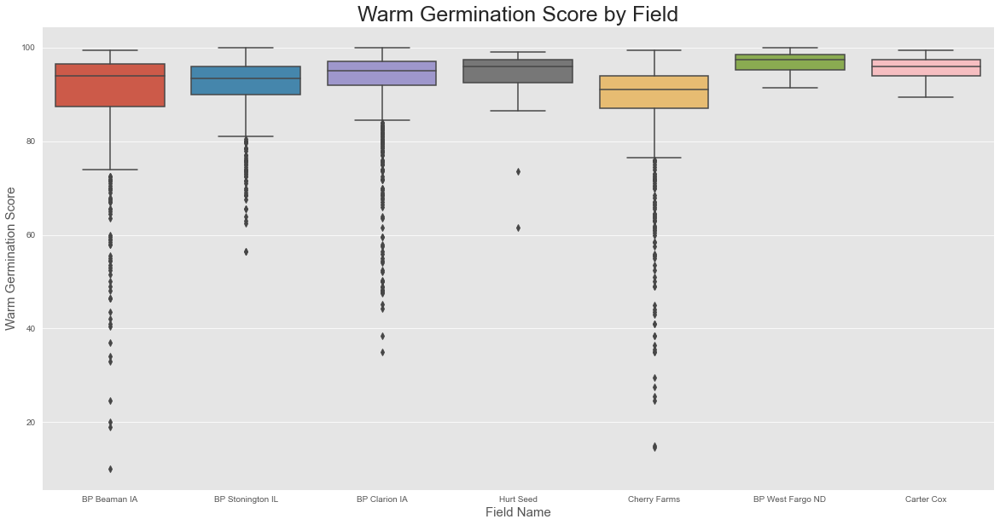

In [965]:
df = dbl_a10
plt.figure(figsize=(20,10))
sns.boxplot( x=df["Plant Name"], y=df["wg_current"]);
plt.xlabel('Field Name', fontsize= 15)
plt.ylabel('Warm Germination Score', fontsize= 15)
plt.title('Warm Germination Score by Field', fontsize =25)
plt.show()

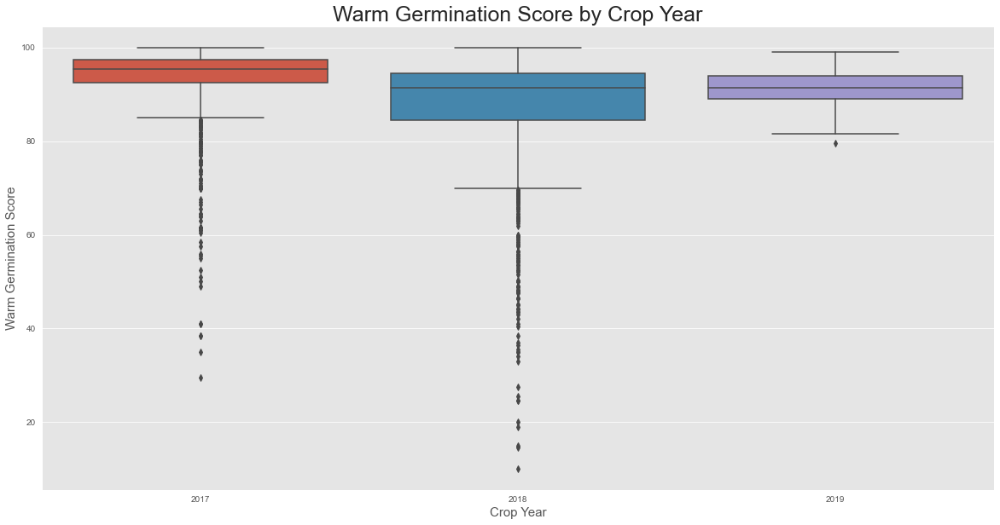

In [966]:
df = dbl_a10
plt.figure(figsize=(20,10))
sns.boxplot( x=df["crop_yr"], y=df["wg_current"]);
plt.xlabel('Crop Year', fontsize= 15)
plt.ylabel('Warm Germination Score', fontsize= 15)
plt.title('Warm Germination Score by Crop Year', fontsize =25)
plt.show()

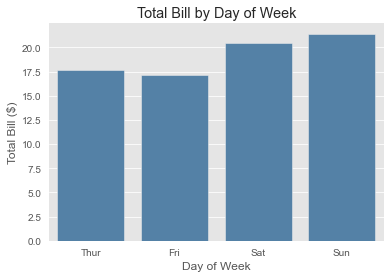

In [967]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
tips = sns.load_dataset("tips")

# Create the bar plot
sns.barplot(x="day", y="total_bill", data=tips, ci=None, color="steelblue")

# Set the plot title and axis labels
plt.title("Total Bill by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Total Bill ($)")

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Show the plot
plt.show()

In [968]:
dbl_b4.groupby(['crop_yr','Plant Name'])[['bin_receipt_bu', 'Final Acres']].sum()
#.sort_values('Final Acres')

bin_receipt_bu  Final Acres
crop_yr Plant Name                                   
2017    BP Beaman IA          1836423.87    29412.000
        BP Clarion IA         3831256.99    65323.630
        BP Stonington IL      3338512.61    46963.000
        BP West Fargo ND       711695.00    16645.500
        Carter Cox             659241.30    10666.000
        Cherry Farms          2248784.71    52608.200
        Hurt Seed              474749.59     7045.000
2018    BP Beaman IA           947231.38    14827.000
        BP Clarion IA         3147818.60    54513.900
        BP Stonington IL      3388432.74    40449.000
        Cherry Farms          1790050.15    48795.919
2019    Cherry Farms          1522991.28    39235.200

In [969]:
df = dbl_b4
dbl_b5 = df[(df['crop_yr']<2019)&df['Plant Name'].isin(['BP Beaman IA', 'BP Clarion IA', 'BP Stonington IL', 'Cherry Farms'])]
df = dbl_b5.groupby(['Plant Name', 'crop_yr'])[['bin_receipt_bu']].sum().reset_index()
df
# df = df.pivot_table(values = 'bin_receipt_bu', index = df['Plant Name'], columns = 'crop_yr', aggfunc = 'first')
# df

,Plant Name,crop_yr,bin_receipt_bu
0,BP Beaman IA,2017,1836423.87
1,BP Beaman IA,2018,947231.38
2,BP Clarion IA,2017,3831256.99
3,BP Clarion IA,2018,3147818.60
4,BP Stonington IL,2017,3338512.61
5,BP Stonington IL,2018,3388432.74
6,Cherry Farms,2017,2248784.71
7,Cherry Farms,2018,1790050.15


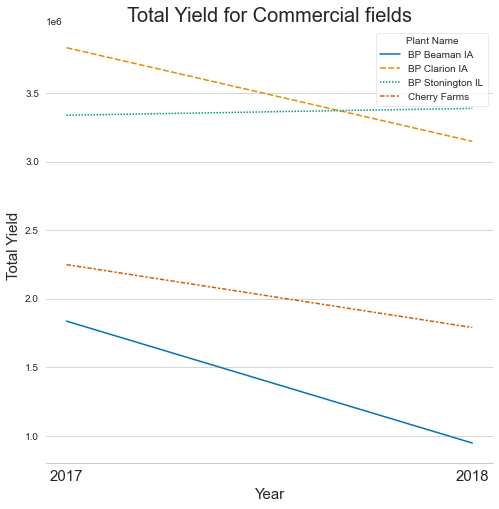

In [970]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df = dbl_b5.groupby(['Plant Name', 'crop_yr'])[['bin_receipt_bu']].sum().reset_index()
df = df.pivot_table(values = 'bin_receipt_bu', index = df['crop_yr'], columns = 'Plant Name', aggfunc = 'first')

# Create the bar plot
years = list(df)
data_preproc = pd.DataFrame({
    'Year': years,
})

fig, ax = plt.subplots(figsize=(8,8))

#sns.lineplot(x=df.crop_yr, y=df["bin_receipt_bu"])
sns.lineplot(data = df)

# Set the plot title and axis labels
plt.title("Total Yield for Commercial fields", fontsize = 20)
plt.xlabel("Year", fontsize = 15)
plt.ylabel("Total Yield", fontsize = 15)

ind = np.arange(2017,2019)
plt.xticks(ind, tuple(ind), fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

ax.xaxis.grid(False) # Hide the vertical gridlines


# Show the plot
plt.show()

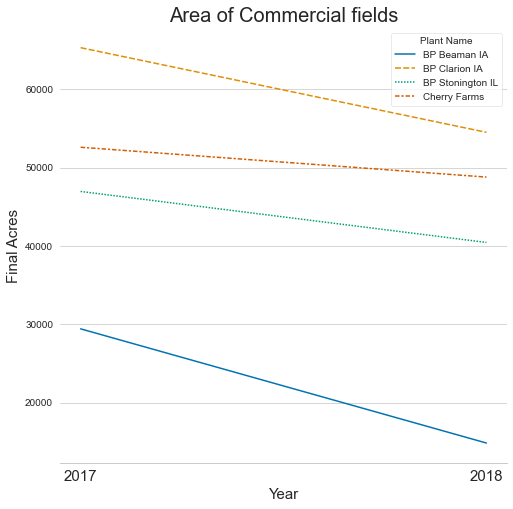

In [971]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df = dbl_b5.groupby(['Plant Name', 'crop_yr'])[['Final Acres']].sum().reset_index()
df = df.pivot_table(values = 'Final Acres', index = df['crop_yr'], columns = 'Plant Name', aggfunc = 'first')

# Create the bar plot
years = list(df)
data_preproc = pd.DataFrame({
    'Year': years,
})

fig, ax = plt.subplots(figsize=(8,8))

#sns.lineplot(x=df.crop_yr, y=df["bin_receipt_bu"])
sns.lineplot(data = df)

# Set the plot title and axis labels
plt.title("Area of Commercial fields", fontsize = 20)
plt.xlabel("Year", fontsize = 15)
plt.ylabel("Final Acres", fontsize = 15)

ind = np.arange(2017,2019)
plt.xticks(ind, tuple(ind), fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

ax.xaxis.grid(False) # Hide the vertical gridlines


# Show the plot
plt.show()

In [972]:
df = dbl_b5.groupby(['Plant Name', 'crop_yr'])[['bin_receipt_bu','Final Acres']].sum().reset_index()
df['ypa'] = df['bin_receipt_bu']/df['Final Acres']
df.head()


,Plant Name,crop_yr,bin_receipt_bu,Final Acres,ypa
0,BP Beaman IA,2017,1836423.87,29412.00,62.437912
1,BP Beaman IA,2018,947231.38,14827.00,63.885572
2,BP Clarion IA,2017,3831256.99,65323.63,58.650399
3,BP Clarion IA,2018,3147818.60,54513.90,57.743412
4,BP Stonington IL,2017,3338512.61,46963.00,71.088146


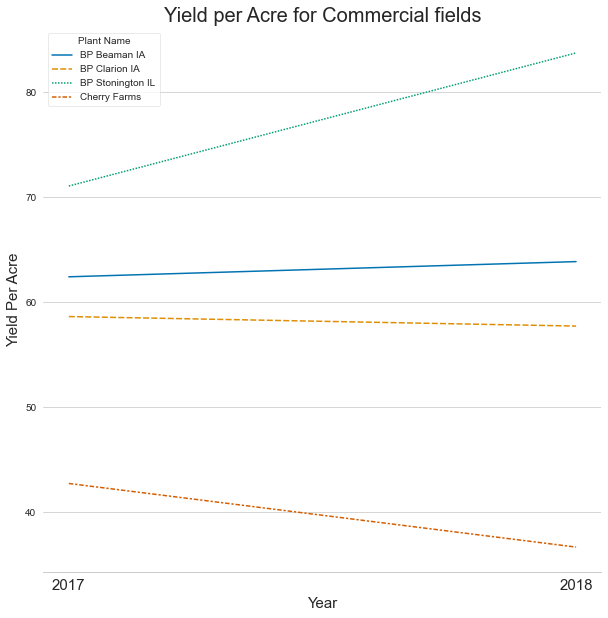

In [973]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df = dbl_b5.groupby(['Plant Name', 'crop_yr'])[['bin_receipt_bu','Final Acres']].sum().reset_index()
df['ypa'] = df['bin_receipt_bu']/df['Final Acres']
df = df.pivot_table(values = 'ypa', index = df['crop_yr'], columns = 'Plant Name', aggfunc = 'first')

# Create the bar plot
years = list(df)
data_preproc = pd.DataFrame({
    'Year': years,
})

fig, ax = plt.subplots(figsize=(10,10))

#sns.lineplot(x=df.crop_yr, y=df["bin_receipt_bu"])
sns.lineplot(data = df)

# Set the plot title and axis labels
plt.title("Yield per Acre for Commercial fields", fontsize = 20)
plt.xlabel("Year", fontsize = 15)
plt.ylabel("Yield Per Acre", fontsize = 15)

ind = np.arange(2017,2019)
plt.xticks(ind, tuple(ind), fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

ax.xaxis.grid(False) # Hide the vertical gridlines


# Show the plot
plt.show()

895
665


([<matplotlib.axis.YTick at 0x7f8fa3c064f0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

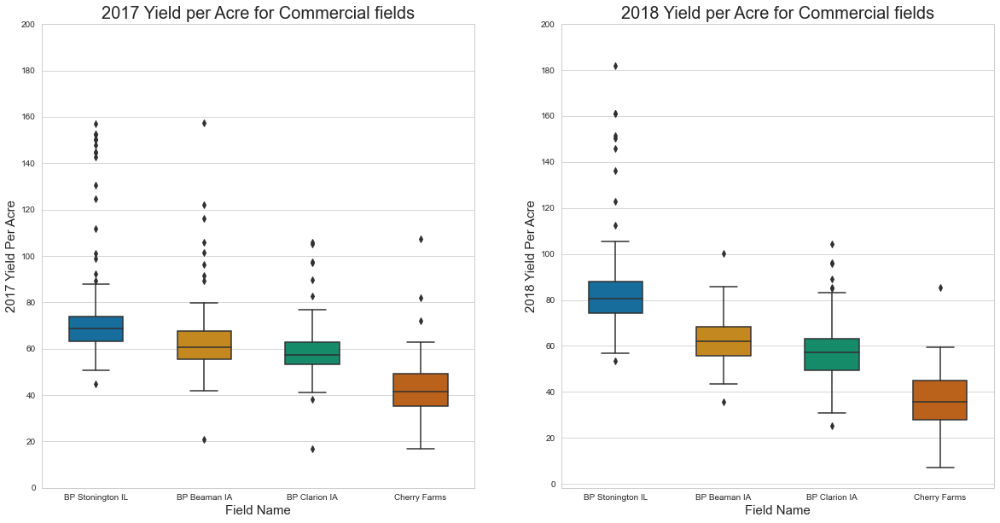

In [974]:
import seaborn as sns
import matplotlib.pyplot as plt

di = dbl_b5
di.head()

plt.figure(figsize=(20,10))
#fig, ax = plt.subplots(2,2)
plt.subplot(1,2,1)
df = di[di['crop_yr']==2017]
print(df.shape[0])
sns.boxplot( x=df["Plant Name"], y=df["ypa"], width=0.5);
# Set the plot title and axis labels
plt.title("2017 Yield per Acre for Commercial fields", fontsize = 20)
plt.xlabel('Field Name',fontsize = 15)
plt.ylabel("2017 Yield Per Acre", fontsize = 15)
plt.yticks(range(0,201,20))
#plt.show()

#plt.figure(figsize=(20,10))
plt.subplot(1,2,2)
df = di[di['crop_yr']==2018]
print(df.shape[0])
sns.boxplot( x=df["Plant Name"], y=df["ypa"], width=0.5);
# Set the plot title and axis labels
plt.title("2018 Yield per Acre for Commercial fields", fontsize = 20)
plt.xlabel('Field Name',fontsize = 15)
plt.ylabel("2018 Yield Per Acre", fontsize = 15)
plt.yticks(range(0,201,20))
#plt.show()


# plt.figure(figsize=(10,10))
# df = di
# sns.boxplot( x=df["Plant Name"], y=df["bin_receipt_bu"], width=0.5);
# plt.show()

# df = dbl_a10
# plt.figure(figsize=(20,10))
# sns.violinplot( x=df["Plant Name"], y=df["wg_current"], width=1);
# plt.show()

In [975]:
dbl_b5.groupby('Plant Name')['crop_yr'].count()

Plant Name
BP Beaman IA        274
BP Clarion IA       626
BP Stonington IL    414
Cherry Farms        246
Name: crop_yr, dtype: int64

5


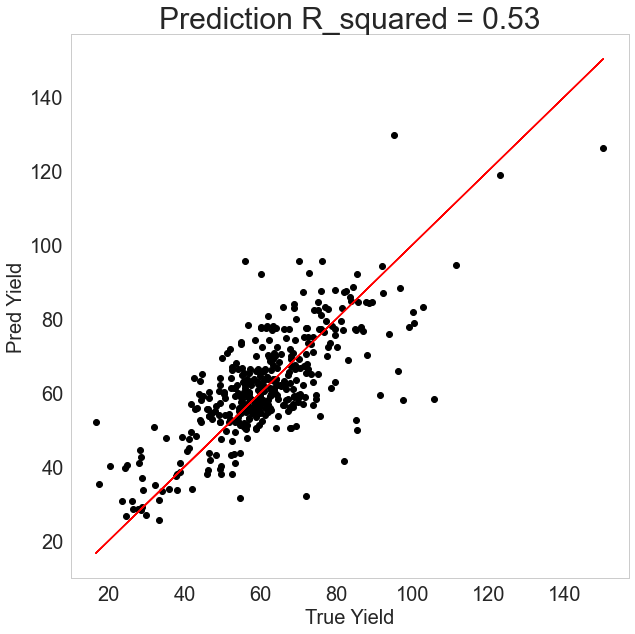

In [976]:
# Yield per Area Prediction
df1 = dbl_b5
#[dbl_b5['Plant Name'] == 'Cherry Farms']
#[dbl_b5['crop_yr'] == 2018]
df1['ypa'] = df1['bin_receipt_bu']/df1['Final Acres']
corr_name = [
# 'Longitude',
# 'Latitude',
# 'Plant PBC',
# 'Final Acres',
# 'grwr_pymnt',
# 'vrty_desc',
 
 'avg_dew_point_temp',
# 'avg_wind_speed',
# 'avg_wind_direction',
 'total_downward_solar_radiation',
# 'total_net_solar_radiation',
# 'avg_snow_depth',
 'total_precipitation',
# 'avg_relative_humidity',
# 'min_temp',
 'max_temp',
# 'days_Plant_Harv',
 'days_max_temp_above_30',
# 'days_min_temp_below_0',
# 'bulk_drg',
#      'bin_receipt_bu',
    'ypa',
#    'mg',
#    'fin_total_projected_units',
#    'fin_drg',
#    'crop_yr',
#    'total_projected_units',
# 'wg_diff',
]
dataset = df1[corr_name].dropna()
l = dataset.shape[1]-1
print(l)

# Using classifier instead of regressor


X = dataset.iloc[:, 0:l].values
y = dataset.iloc[:, l].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=9)

feature_names = [f"feature {i}" for i in range(X.shape[1])]
#feature_names = list(dataset.iloc[:,0:15])
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

from sklearn.metrics import r2_score

# R^2 score for hold outs
x = y_test
y = y_forest_pred

r2 = f'{r2_score(x, y):.2f}'

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(x, y, 'o', color= 'black')
ax.plot(x, x, color = 'red')

ax.set(xlabel='True yield', ylabel='Predicted yield',
       title='R2 score is '+str(r2))

plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.xlabel('True Yield',fontsize = 20)
plt.ylabel('Pred Yield',fontsize = 20)
plt.title('Prediction R_squared = '+str(r2), fontsize = 30)
ax.grid()

fig.savefig("test.png")
plt.show()



Elapsed time to compute the importances: 0.299 seconds


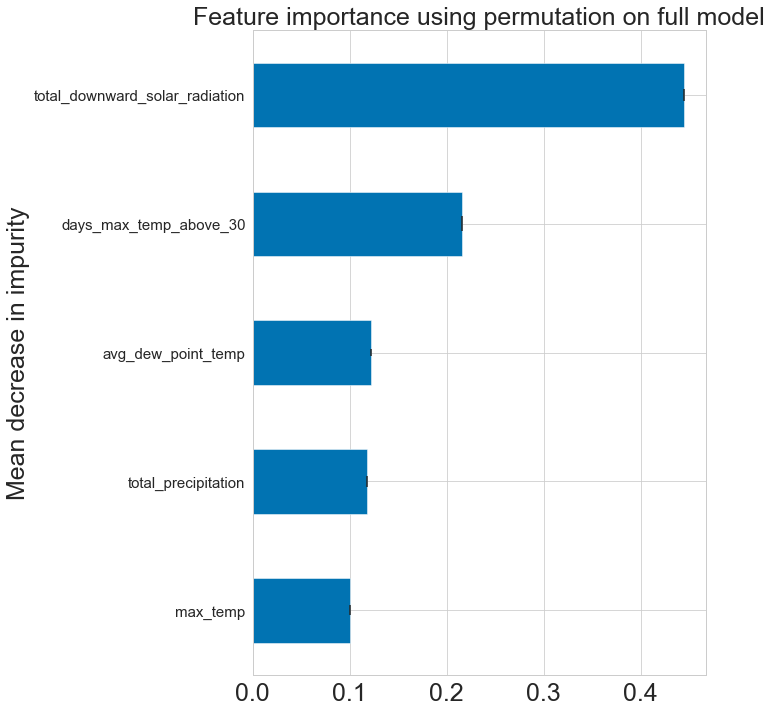

In [977]:
# Feature importance based on feature permutation

from sklearn.inspection import permutation_importance
feature_names = list(dataset.iloc[:,0:l])
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)

start_time = time.time()
result = permutation_importance(forest, X_test, y_test, n_repeats = 10, random_state = 42, n_jobs = 2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(importances, index = feature_names).sort_values()

fig, ax = plt.subplots(figsize =(10,10))
forest_importances.plot.barh(yerr = std, ax = ax)
ax.set_title("Feature importance using permutation on full model", fontsize = 25)
ax.set_ylabel("Mean decrease in impurity", fontsize = 25)

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 15)
fig.tight_layout()

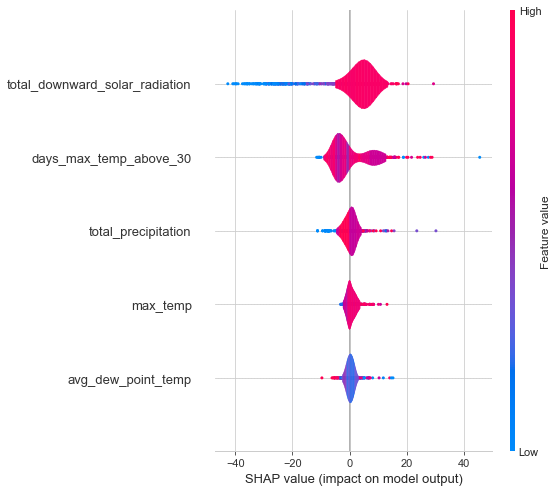

In [978]:
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)
y_forest_pred = forest.predict(X_test)

# Create an explainer object and compute Shapley values for each feature
explainer = shap.Explainer(forest)
shap_values = explainer(X_train)

# Compute the average Shapley value for each feature
#shap.summary_plot(shap_values, X_train, feature_names = feature_names)
l = dataset.shape[1]-1
feature_names = list(dataset.iloc[:,0:l])
plt.figure(figsize=(20,10))
shap.summary_plot(shap_values, X_train, plot_type = 'violin',feature_names = feature_names, show = False)
plt.gcf().set_size_inches(8,8)
plt.show()

In [1048]:
dbl_b33

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu
0,2020,1259.0,8H36,4608632485,2502130327,A3253,399,399.0,56000.00,57793.333334
1,2020,1259.0,8H36,4608633622,2502130328,A3253,300,300.0,22782.00,23036.666667
2,2020,1259.0,8H36,4608633623,2502130329,A3253,80,80.0,5000.00,5644.660000
3,2021,1259.0,8H36,4600001917,2502233276,A3253,45,42.0,6100.00,1.666666
4,2021,1259.0,8H36,4600001919,2502233277,A3253,155,155.0,21200.00,16220.666666
...,...,...,...,...,...,...,...,...,...,...
38506,2019,1778.0,8H45,4608592132,103828247,WO4715B1-T1LNN,135,67.3,8008.00,7796.330000
38507,2019,1778.0,8H45,4608593634,103847721,WO4715B1-T1LNN,138,68.3,8919.00,8741.330000
38508,2019,1778.0,8H45,4608592248,103847710,RB4891XFNS,68,66.5,5718.00,2352.660000
38509,2019,1778.0,8H45,4608592250,103847711,RB4891XFNS,75,73.8,3027.00,2987.330000


In [1054]:
short_fap

,pbc_plnt_cd,p08_plnt_cd,plantname,location,Latitude,Longitude
0,8H12,1745.0,Beaman,BP Beaman IA,42.222851,-92.824670
1,8H14,1744.0,Ashton,BP Ashton IL,41.868490,-89.248482
2,8H16,1285.0,Centralia,BP Centralia IL,38.475920,-89.142023
3,8H17,1252.0,Clarion,BP Clarion IA,42.732188,-93.739911
4,8H30,1758.0,Marshall,BP Marshall MO,39.135205,-93.205245
5,8H31,1759.0,Mason City,BP Mason City IL,40.198937,-89.676304
6,8H32,1254.0,Matthews,BP Matthews MO,36.754177,-89.536251
7,8H33,1761.0,Redwood Falls,BP Redwood Falls MN,44.484935,-95.118037
8,8H36,1259.0,Stonington,BP Stonington IL,39.632138,-89.197108
9,8H40,1089.0,Fargo,BP West Fargo ND,46.880831,-96.901126


In [1055]:
dbl_b34 = dbl_b33.merge(short_fap[['pbc_plnt_cd','plantname','location','Latitude','Longitude']], how = 'inner', left_on = 'pbc_plnt_cd', right_on = 'pbc_plnt_cd')
dbl_b34.shape
dbl_b34.to_csv('~/Documents/Bayer_Info/Soybean/data/2023/soybean_bulk_lineage_dbl_b34_05032023.csv', encoding='utf-8')

In [1056]:
dbl_b34

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu,plantname,location,Latitude,Longitude
0,2020,1259.0,8H36,4608632485,2502130327,A3253,399,399.00,56000.00,57793.333334,Stonington,BP Stonington IL,39.632138,-89.197108
1,2020,1259.0,8H36,4608633622,2502130328,A3253,300,300.00,22782.00,23036.666667,Stonington,BP Stonington IL,39.632138,-89.197108
2,2020,1259.0,8H36,4608633623,2502130329,A3253,80,80.00,5000.00,5644.660000,Stonington,BP Stonington IL,39.632138,-89.197108
3,2021,1259.0,8H36,4600001917,2502233276,A3253,45,42.00,6100.00,1.666666,Stonington,BP Stonington IL,39.632138,-89.197108
4,2021,1259.0,8H36,4600001919,2502233277,A3253,155,155.00,21200.00,16220.666666,Stonington,BP Stonington IL,39.632138,-89.197108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32049,2019,6720.0,8H93,4608597745,103823962,NC6018A4-C0DNN,714,79.72,28860.34,28860.340000,Cherry Farms,CM Columbia NC - Cherry Farms FND PREND,35.766285,-76.180380
32050,2019,6720.0,8H93,4608598841,103794842,NC6118A1-C0DNN,185,61.29,8419.67,8419.670000,Cherry Farms,CM Columbia NC - Cherry Farms FND PREND,35.766285,-76.180380
32051,2019,6720.0,8H93,4608597726,103815173,AG59XF1,981,159.78,37379.71,37379.660000,Cherry Farms,CM Columbia NC - Cherry Farms FND PREND,35.766285,-76.180380
32052,2019,6720.0,8H93,4608597711,103804631,NC6614A3-T1LNN,21,0.60,212.33,212.330000,Cherry Farms,CM Columbia NC - Cherry Farms FND PREND,35.766285,-76.180380


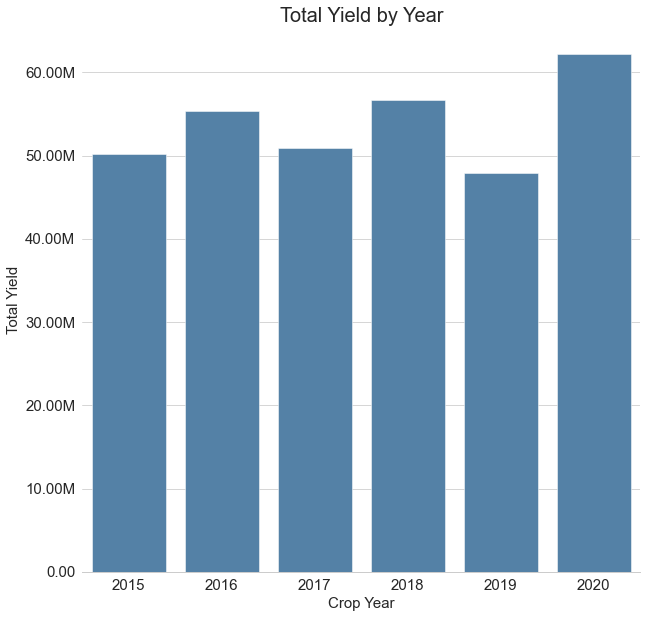

In [980]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df=dbl_b33
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
#.groupby('pbc_plnt_cd').count()
tips = df.groupby('crop_yr')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()

# Create the bar plot
fig, ax = plt.subplots(figsize = (10,10))
sns.barplot(x="crop_yr", y="bin_receipt_bu", data=tips, ci=None, color="steelblue")

# Set the plot title and axis labels
plt.title("Total Yield by Year", fontsize = 20)
plt.xlabel("Crop Year", fontsize = 15)
plt.ylabel("Total Yield", fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
# Show the plot
plt.show()

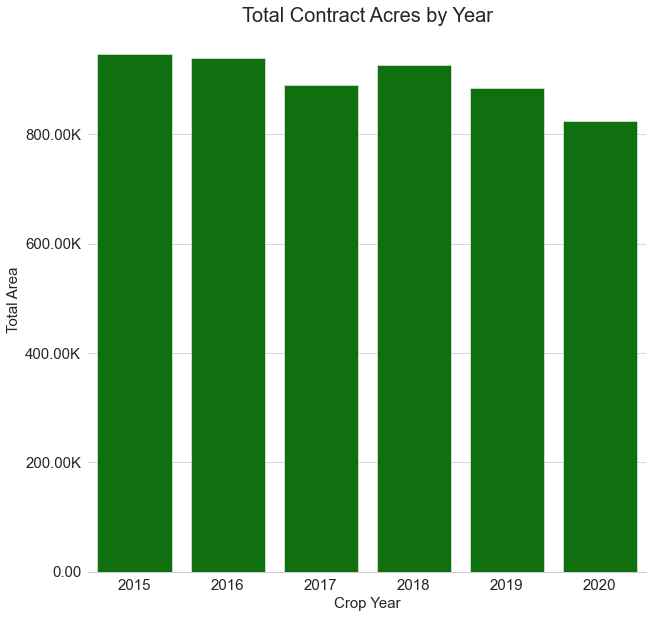

In [981]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df=dbl_b33
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
#.groupby('pbc_plnt_cd').count()
tips = df.groupby('crop_yr')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()

# Create the bar plot
fig, ax = plt.subplots(figsize = (10,10))
sns.barplot(x="crop_yr", y="contract_acres", data=tips, ci=None, color="g")

# Set the plot title and axis labels
plt.title("Total Contract Acres by Year", fontsize = 20)
plt.xlabel("Crop Year", fontsize = 15)
plt.ylabel("Total Area", fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
# Show the plot
plt.show()

In [982]:
df

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu
0,2020,1259.0,8H36,4608632485,2502130327,A3253,399,399.0,56000.00,57793.333334
1,2020,1259.0,8H36,4608633622,2502130328,A3253,300,300.0,22782.00,23036.666667
2,2020,1259.0,8H36,4608633623,2502130329,A3253,80,80.0,5000.00,5644.660000
9,2020,1777.0,8H44,4608638728,2502132265,A3555,57,53.0,3880.00,3880.000000
10,2020,1777.0,8H44,4608638729,2502132266,A3555,150,151.0,5592.00,10781.000000
...,...,...,...,...,...,...,...,...,...,...
38506,2019,1778.0,8H45,4608592132,103828247,WO4715B1-T1LNN,135,67.3,8008.00,7796.330000
38507,2019,1778.0,8H45,4608593634,103847721,WO4715B1-T1LNN,138,68.3,8919.00,8741.330000
38508,2019,1778.0,8H45,4608592248,103847710,RB4891XFNS,68,66.5,5718.00,2352.660000
38509,2019,1778.0,8H45,4608592250,103847711,RB4891XFNS,75,73.8,3027.00,2987.330000


In [983]:
# temp = dbl_b34.groupby('Plant Name')[['Plant Lat', 'Plant Lon']].max().reset_index()
# tips = df.groupby('Plant Name')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()
# tips.merge(temp, how = 'inner', on = 'Plant Name')

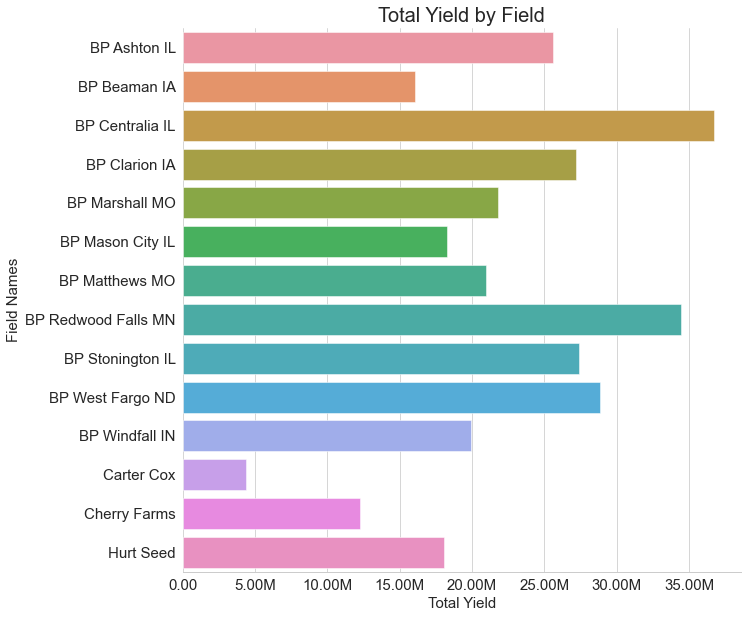

In [984]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df=dbl_b34
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]


tips = df.groupby('Plant Name')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()


# set bar colors
x = df['bin_receipt_bu']
M = 10**3
col = []
for val in x:
    if val < 5*M:
        col.append('tab:blue')
    elif val < 10*M:
        col.append('tab:green')
    elif val < 20*M:
        col.append('tab:olive')
    elif val < 30*M:
        col.append('tab:grey')
    elif val < 40*M:
        col.append('tab:cyan')
    else:
        col.append('tab:orange')

# Create the bar plot
fig, ax = plt.subplots(figsize = (10,10))
sns.barplot(y="Plant Name", x="bin_receipt_bu", data=tips, ci=None, 
            #palette=col, 
            orient='h')
#ax.barh(tips.bin_receipt_bu, tips['Plant Name'], color=col)

# Set the plot title and axis labels
plt.title("Total Yield by Field", fontsize = 20)
plt.xlabel("Total Yield", fontsize = 15)
plt.ylabel("Field Names", fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.xaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
# Show the plot
plt.show()

In [985]:
10^6

12

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3516214155.py:56: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



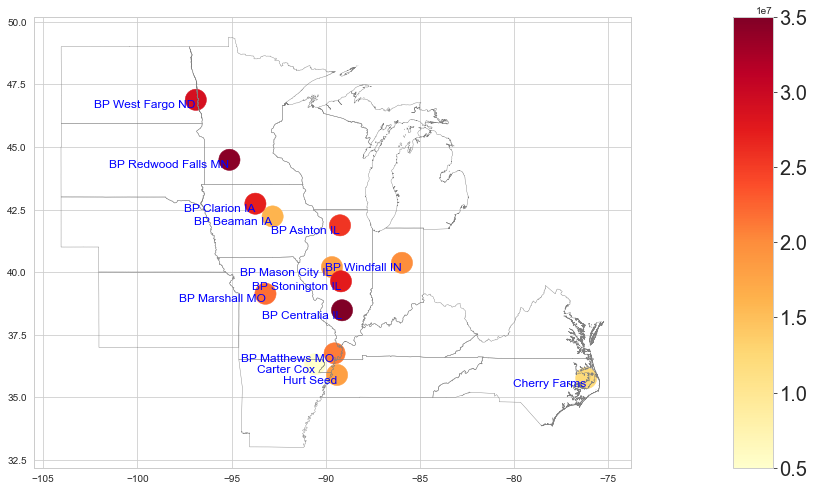

             Plant Name  bin_receipt_bu
11           Carter Cox      4374767.69
12         Cherry Farms     12260447.96
1          BP Beaman IA     16055023.60
13            Hurt Seed     18044898.95
5      BP Mason City IL     18240715.45
10       BP Windfall IN     19934072.36
6        BP Matthews MO     20963645.89
4        BP Marshall MO     21823500.64
0          BP Ashton IL     25559103.81
3         BP Clarion IA     27162043.47
8      BP Stonington IL     27411385.59
9      BP West Fargo ND     28859970.05
7   BP Redwood Falls MN     34411471.51
2       BP Centralia IL     36729724.98


In [986]:
# Create a sample dataset
df=dbl_b34
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
temp = dbl_b34.groupby('Plant Name')[['Plant Lat', 'Plant Lon']].max().reset_index()
tips = df.groupby('Plant Name')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()
df = tips.merge(temp, how = 'inner', on = 'Plant Name')
df['Longitude']= df['Plant Lon'] 
df['Latitude']= df['Plant Lat']
df['ypa'] = df['bin_receipt_bu']/df['contract_acres']

p2 = 'bin_receipt_bu'
p1 = 'Plant Name'
p3 = 'ypa'

from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN', 'VA', 'NC'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN', 'VA', 'NC'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
fig, ax = plt.subplots(figsize=(15,15))

#fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=20
# ),axis=1);
center.boundary.plot(ax=ax, color='grey', linewidth=.4)

#Plot FAP names
#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
#fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
#fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
fap_to_plot = df


for _, r in fap_to_plot.iterrows():
    ax.annotate(r[p1], (r['Longitude'], r['Latitude']), ha = 'right', va='top', color = 'blue', fontsize = 12)
#    ax.annotate(round(r[p2],2), (r['Longitude'], r['Latitude']), ha = 'left', va='bottom', color = 'black', fontsize = 15)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 450, c = df[p2], vmin =5*10**6, vmax = 35*10**6, cmap = "YlOrRd")
M = 5
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[[p1, p2]].sort_values(p2))

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2476892560.py:56: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



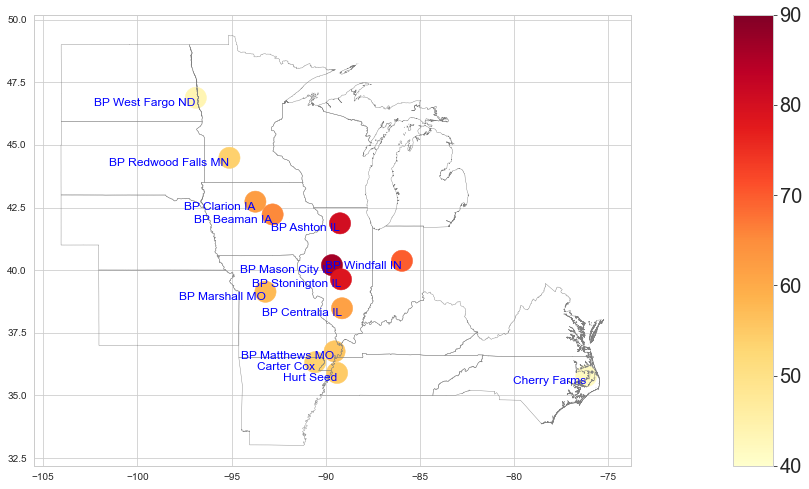

             Plant Name        ypa
12         Cherry Farms  41.579587
9      BP West Fargo ND  43.692935
11           Carter Cox  53.627465
7   BP Redwood Falls MN  53.674916
13            Hurt Seed  54.655344
6        BP Matthews MO  55.550790
4        BP Marshall MO  57.461566
2       BP Centralia IL  61.563529
3         BP Clarion IA  62.386980
1          BP Beaman IA  65.361835
10       BP Windfall IN  69.739544
8      BP Stonington IL  78.616313
0          BP Ashton IL  80.298787
5      BP Mason City IL  86.123985


In [987]:
# Create a sample dataset
df=dbl_b34
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
temp = dbl_b34.groupby('Plant Name')[['Plant Lat', 'Plant Lon']].max().reset_index()
tips = df.groupby('Plant Name')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()
df = tips.merge(temp, how = 'inner', on = 'Plant Name')
df['Longitude']= df['Plant Lon'] 
df['Latitude']= df['Plant Lat']
df['ypa'] = df['bin_receipt_bu']/df['contract_acres']

p2 = 'bin_receipt_bu'
p1 = 'Plant Name'
p3 = 'ypa'

from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN', 'VA', 'NC'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN', 'VA', 'NC'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
fig, ax = plt.subplots(figsize=(15,15))

#fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=20
# ),axis=1);
center.boundary.plot(ax=ax, color='grey', linewidth=.4)

#Plot FAP names
#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
#fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
#fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
fap_to_plot = df


for _, r in fap_to_plot.iterrows():
    ax.annotate(r[p1], (r['Longitude'], r['Latitude']), ha = 'right', va='top', color = 'blue', fontsize = 12)
#    ax.annotate(round(r[p2],2), (r['Longitude'], r['Latitude']), ha = 'left', va='bottom', color = 'black', fontsize = 15)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 450, c = df[p3], vmin =40, vmax = 90, cmap = "YlOrRd")
M = 5
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[[p1, p3]].sort_values(p3))

In [988]:
# Create a sample dataset
df=dbl_b34
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
#.groupby('pbc_plnt_cd').count()
tips = df.groupby(['Plant Name', 'crop_yr'])[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()
tips

,Plant Name,crop_yr,bin_receipt_bu,contract_acres,sap_harvestedacres
0,BP Ashton IL,2015,3424611.82,55378,54293.0
1,BP Ashton IL,2016,3629589.36,51256,50937.0
2,BP Ashton IL,2017,3494241.33,54237,53994.0
3,BP Ashton IL,2018,4007847.30,55082,55379.0
4,BP Ashton IL,2019,3107952.00,54208,52045.0
...,...,...,...,...,...
79,Hurt Seed,2016,3741614.93,70018,71572.0
80,Hurt Seed,2017,3412427.04,53037,52339.0
81,Hurt Seed,2018,3066619.01,49944,49844.0
82,Hurt Seed,2019,2460069.99,48685,48985.0


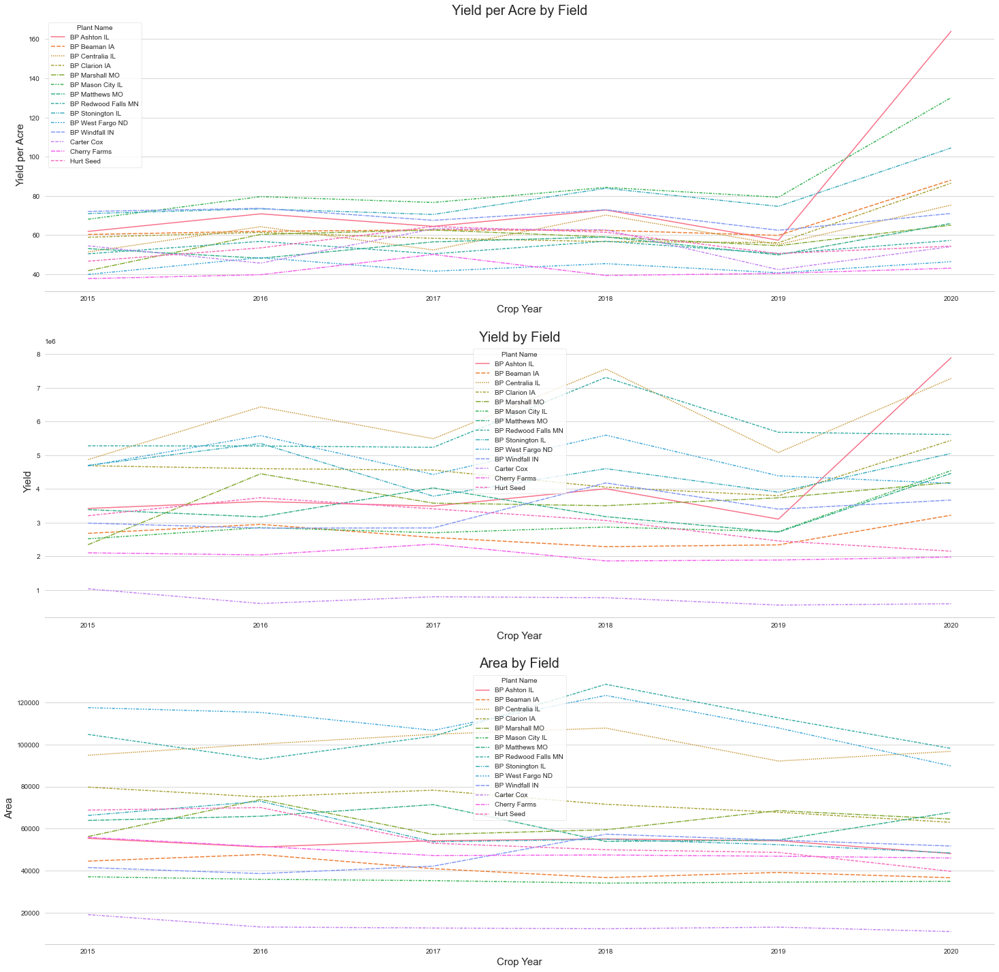

In [989]:
df = tips
df['ypa'] = df['bin_receipt_bu']/df['contract_acres']
df1 = df.pivot_table(values = 'ypa', index = df['crop_yr'], columns = 'Plant Name', aggfunc = 'first')
df2 = df.pivot_table(values = 'bin_receipt_bu', index = df['crop_yr'], columns = 'Plant Name', aggfunc = 'first')
df3 = df.pivot_table(values = 'contract_acres', index = df['crop_yr'], columns = 'Plant Name', aggfunc = 'first')

fig, ax = plt.subplots(figsize=(25,25))
ax1 = plt.subplot(3,1,1)
sns.lineplot(data = df1)
ax1.xaxis.grid(False) # Hide the vertical gridlines
#Set the plot title and axis labels
plt.title("Yield per Acre by Field", fontsize = 20)
plt.ylabel("Yield per Acre", fontsize = 15)
plt.xlabel("Crop Year", fontsize = 15)



plt.subplot(3,1,2)
ax2 = sns.lineplot(data = df2)
ax2.xaxis.grid(False) # Hide the vertical gridlines
#Set the plot title and axis labels
plt.title("Yield by Field", fontsize = 20)
plt.ylabel("Yield", fontsize = 15)
plt.xlabel("Crop Year", fontsize = 15)



plt.subplot(3,1,3)
ax3 = sns.lineplot(data = df3)
ax3.xaxis.grid(False) # Hide the vertical gridlines
#Set the plot title and axis labels
plt.title("Area by Field", fontsize = 20)
plt.ylabel("Area", fontsize = 15)
plt.xlabel("Crop Year", fontsize = 15)
# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

plt.show()

In [990]:
tips
tips.to_csv('~/Documents/Bayer_Info/Soybean/data/datasharing/soybean_field_data_2Harshita.csv', encoding='utf-8')


In [991]:
df = dbl_b34
df.to_csv('~/Documents/Bayer_Info/Soybean/data/datasharing/soybean_field_data_dbl_b34.csv', encoding='utf-8')


In [992]:
df[df['crop_yr']==2018]

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu,Plant Name,Region,Country,Plant PBC,loc1,Plant Lat,Plant Lon
480,2018,1259.0,8H36,4608544130,103506808,A3555,160,160.00,11033.00,10763.00,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108
481,2018,1259.0,8H36,4608544131,103506809,A3555,45,45.00,3238.00,2991.00,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108
1732,2018,1259.0,8H36,4608541731,103506713,A3253,393,393.00,32577.00,31389.40,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108
1733,2018,1259.0,8H36,4608544412,103506830,A3253,198,198.00,13717.00,15077.00,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108
1734,2018,1259.0,8H36,4608544515,103506842,A3253,202,202.00,15317.68,14943.27,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29124,2018,5353.0,8H71,4608545431,103527400,AG79X9,350,379.30,20750.00,16319.76,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380
29125,2018,5353.0,8H71,4608549204,103527461,AG79X9,400,305.00,8000.00,7994.67,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380
29126,2018,5353.0,8H71,4608549765,103527482,AG79X9,275,349.40,9000.00,9683.67,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380
29131,2018,5353.0,8H71,4608550231,103527497,AG69XF0,936,949.19,57603.34,102148.04,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380


# dbr bulk result table Re Analysis

In [993]:
dbl_b33.groupby('bulk_prcs_ord_nbr').count().sort_values('crop_yr')

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu
bulk_prcs_ord_nbr,,,,,,,,,
102042091,1,1,1,1,1,1,1,1,1
103521799,1,1,1,1,1,1,1,1,1
103521798,1,1,1,1,1,1,1,1,1
103521797,1,1,1,1,1,1,1,1,1
103521796,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...
102649724,1,1,1,1,1,1,1,1,1
102649723,1,1,1,1,1,1,1,1,1
102649722,1,1,1,1,1,1,1,1,1


In [994]:
dbr_b30=dbr[['crop_yr','pbc_plnt_cd','bulk_prcs_ord_nbr','batch_nbr','total_bu','total_projected_units']].dropna()
dbr_b31 = dbr_b30.groupby('bulk_prcs_ord_nbr')[['total_bu','total_projected_units']].sum().reset_index()
dbr_b32 = dbr_b30.groupby('bulk_prcs_ord_nbr')[['crop_yr','pbc_plnt_cd']].max().reset_index().merge(dbr_b31, how = 'inner', on = 'bulk_prcs_ord_nbr')
dbr_b32
#.merge(fap, how = 'inner', left_on = 'pbc_plnt_cd', right_on = 'Plant PBC')


,bulk_prcs_ord_nbr,crop_yr,pbc_plnt_cd,total_bu,total_projected_units
0,102042091,2013,8H30,14871.680000,15864.815299
1,102042092,2013,8H30,18965.330000,20884.688561
2,102042093,2013,8H30,22297.670000,25447.292980
3,102042094,2013,8H30,13490.000000,14107.206335
4,102042095,2013,8H30,13740.000000,13916.484680
...,...,...,...,...,...
34727,2502309403,2021,8H36,10370.666667,11303.890839
34728,2502309413,2021,8H36,7573.000000,9080.018670
34729,2502309773,2021,8H36,11714.863333,12628.302874
34730,2502311076,2021,8H40,15916.000000,16764.590189


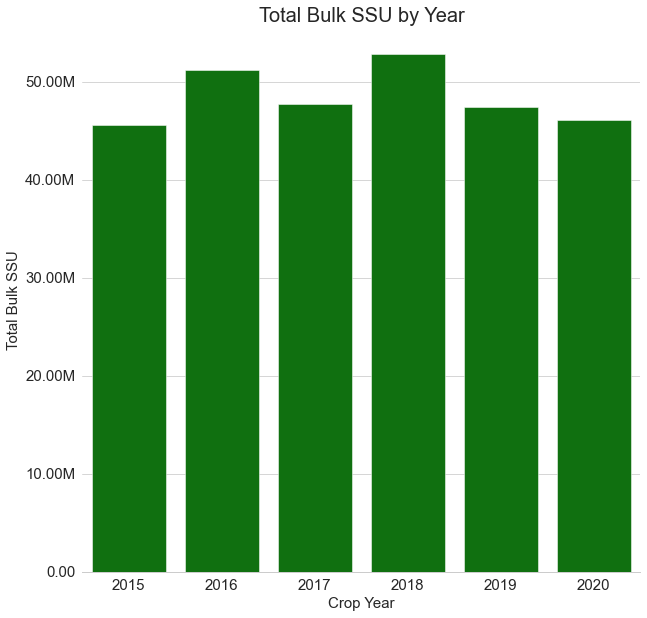

In [995]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a sample dataset
df=dbr_b32
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
#.groupby('pbc_plnt_cd').count()
tips = df.groupby('crop_yr')[['total_bu', 'total_projected_units']].sum().reset_index()

# Create the bar plot
fig, ax = plt.subplots(figsize = (10,10))
sns.barplot(x="crop_yr", y="total_bu", data=tips, ci=None, color="g")

# Set the plot title and axis labels
plt.title("Total Bulk SSU by Year", fontsize = 20)
plt.xlabel("Crop Year", fontsize = 15)
plt.ylabel("Total Bulk SSU", fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
# Show the plot
plt.show()

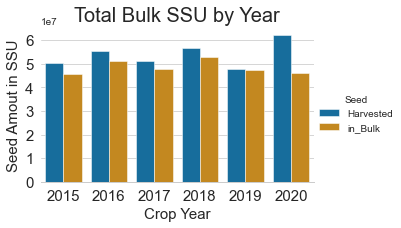

In [996]:
import seaborn as sns
import matplotlib.pyplot as plt

# Harvest
df=dbl_b33
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
#.groupby('pbc_plnt_cd').count()
tips1 = df.groupby('crop_yr')[['bin_receipt_bu']].sum().reset_index()

#bulk SSU
df=dbr_b32
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
#.groupby('pbc_plnt_cd').count()
tips2 = df.groupby('crop_yr')[['total_bu']].sum().reset_index()

tips = tips1.merge(tips2, how = 'inner', on = 'crop_yr')
tips = tips.rename(columns = {'bin_receipt_bu': 'Harvested', 'total_bu':'in_Bulk'})
df = pd.melt(tips, id_vars ='crop_yr', var_name = 'Seed', value_name='SSU')


# Create the bar plot
#fig, axs = plt.subplots (figsize=(20, 10))

#fig = plt.figure(figsize=(10,10))
#gs = fig.add_gridspec(2, 4)
#ax1 = fig.add_subplot(gs[0, :])
sns.catplot(x='crop_yr', y='SSU', hue='Seed', data=df, kind='bar',height=3, aspect=1.5,)
#sns.stripplot(x='crop_yr', y='SSU', hue='Seed', data=df)

# Set the plot title and axis labels
plt.title("Total Bulk SSU by Year", fontsize = 20)
plt.xlabel("Crop Year", fontsize = 15)
plt.ylabel("Seed Amout in SSU", fontsize = 15)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
# Show the plot
plt.show()

In [998]:
# tips = tips1.merge(tips2, how = 'inner', on = 'pbc_plnt_cd')
# fap

In [999]:
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
short_list = pd.read_excel('~/Documents/Bayer_Info/Soybean/SoySite/Short_list.xlsx')
short_fap = short_list.merge(fap, how = 'inner', left_on = 'pbc_plnt_cd', right_on = 'FAP')[['pbc_plnt_cd','p08_plnt_cd','plantname','location','Latitude','Longitude']]

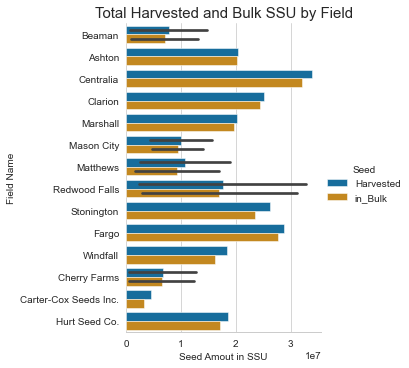

In [1000]:
import seaborn as sns
import matplotlib.pyplot as plt

# Harvest
yr1 = 2014
yr2 = 2019

df=dbl_b33
df = df[(df['crop_yr']>=yr1)&(df['crop_yr']<=yr2)]
#.groupby('pbc_plnt_cd').count()
tips1 = df.groupby(['pbc_plnt_cd'])[['bin_receipt_bu']].sum().reset_index()

#bulk SSU
df=dbr_b32
df = df[(df['crop_yr']>=yr1)&(df['crop_yr']<=yr2)]
#.groupby('pbc_plnt_cd').count()
tips2 = df.groupby(['pbc_plnt_cd'])[['total_bu']].sum().reset_index()

tips = tips1.merge(tips2, how = 'inner', on = 'pbc_plnt_cd')
tips = tips.rename(columns = {'bin_receipt_bu': 'Harvested', 'total_bu':'in_Bulk'})

#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
tips = tips.merge(short_fap, how = 'inner', on = 'pbc_plnt_cd')[['plantname', 'Harvested','in_Bulk']]

df = pd.melt(tips, id_vars ='plantname', var_name = 'Seed', value_name='SSU')



# Create the bar plot
#fig, axs = plt.subplots (figsize=(20, 10))

#fig = plt.figure(figsize=(10,10))
gs = fig.add_gridspec(2, 4)
ax1 = fig.add_subplot(gs[0, :])
sns.catplot(y='plantname', x='SSU', hue='Seed', data=df, kind='bar',height=5, aspect=1.,orient = 'h')
#sns.stripplot(x='crop_yr', y='SSU', hue='Seed', data=df)

# Set the plot title and axis labels
plt.title("Total Harvested and Bulk SSU by Field", fontsize = 15)
plt.xlabel("Seed Amout in SSU", fontsize = 10)
plt.ylabel("Field Name", fontsize = 10)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 10)
plt.xticks(fontsize = 10)
# Show the plot
plt.show()

In [1001]:
list(dbl_b33)

['crop_yr',
 'p08_plnt_cd',
 'pbc_plnt_cd',
 'grwng_cntrct',
 'bulk_prcs_ord_nbr',
 'vrty_desc',
 'contract_acres',
 'sap_harvestedacres',
 'bin_receipt_bu',
 'harvest_receipt_bu']

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/4055552152.py:24: FutureWarning:

This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.



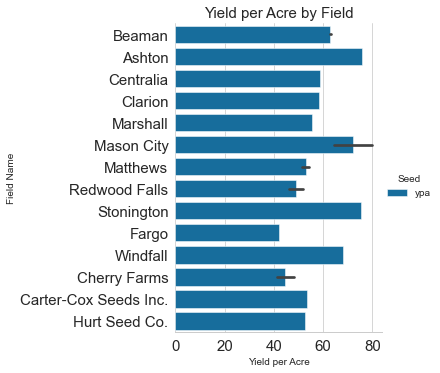

In [1002]:
import seaborn as sns
import matplotlib.pyplot as plt

# Harvest
yr1 = 2013
yr2 = 2020

df=dbl_b33
df = df[(df['crop_yr']>=yr1)&(df['crop_yr']<=yr2)]
#.groupby('pbc_plnt_cd').count()
tips1 = df.groupby(['pbc_plnt_cd'])[['bin_receipt_bu', 'contract_acres']].sum().reset_index()
tips1['ypa'] = tips1['bin_receipt_bu']/tips1['contract_acres']

#bulk SSU
df=dbr_b32
df = df[(df['crop_yr']>=yr1)&(df['crop_yr']<=yr2)]
#.groupby('pbc_plnt_cd').count()
tips2 = df.groupby(['pbc_plnt_cd'])[['total_bu']].sum().reset_index()

tips = tips1.merge(tips2, how = 'inner', on = 'pbc_plnt_cd')
tips = tips.rename(columns = {'bin_receipt_bu': 'Harvested', 'total_bu':'in_Bulk'})
tips = tips.merge(short_fap, how = 'inner', on = 'pbc_plnt_cd')[['plantname', 'ypa']]

df = pd.melt(tips, id_vars ='plantname', var_name = 'Seed', value_name='ypa')



# Create the bar plot
#fig, axs = plt.subplots (figsize=(20, 10))

#fig = plt.figure(figsize=(10,10))
gs = fig.add_gridspec(2, 4)
ax1 = fig.add_subplot(gs[0, :])
sns.catplot(y='plantname', x='ypa', hue='Seed', data=df, kind='bar',height=5, aspect=1.,orient = 'h')
#sns.stripplot(x='crop_yr', y='SSU', hue='Seed', data=df)

# Set the plot title and axis labels
plt.title("Yield per Acre by Field", fontsize = 15)
plt.xlabel("Yield per Acre", fontsize = 10)
plt.ylabel("Field Name", fontsize = 10)

# Customize the plot style
sns.set_style("whitegrid")
sns.set_palette("colorblind")
sns.despine(left=True)

# Set yaxis format
#plt.yticks(np.arange(0,30000000, 5000000), fontsize = 25)
ax.yaxis.set_major_formatter(formatter)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
# Show the plot
plt.show()

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/2476892560.py:56: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



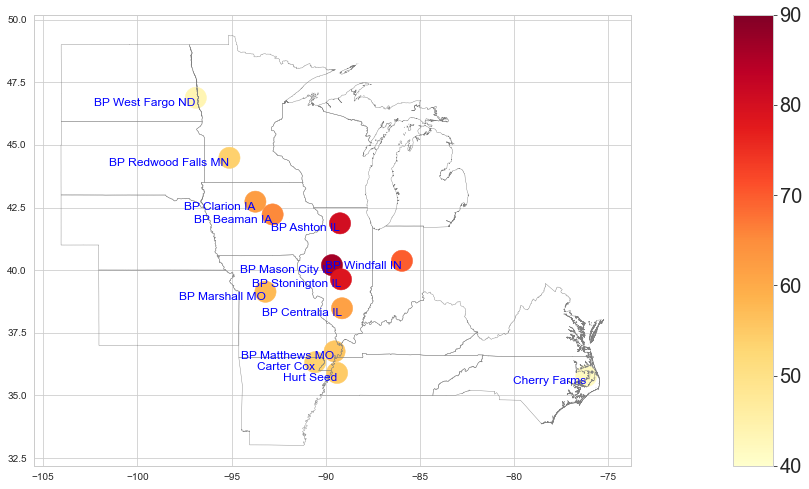

             Plant Name        ypa
12         Cherry Farms  41.579587
9      BP West Fargo ND  43.692935
11           Carter Cox  53.627465
7   BP Redwood Falls MN  53.674916
13            Hurt Seed  54.655344
6        BP Matthews MO  55.550790
4        BP Marshall MO  57.461566
2       BP Centralia IL  61.563529
3         BP Clarion IA  62.386980
1          BP Beaman IA  65.361835
10       BP Windfall IN  69.739544
8      BP Stonington IL  78.616313
0          BP Ashton IL  80.298787
5      BP Mason City IL  86.123985


In [1003]:
# Create a sample dataset
df=dbl_b34
df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
temp = dbl_b34.groupby('Plant Name')[['Plant Lat', 'Plant Lon']].max().reset_index()
tips = df.groupby('Plant Name')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()
df = tips.merge(temp, how = 'inner', on = 'Plant Name')
df['Longitude']= df['Plant Lon'] 
df['Latitude']= df['Plant Lat']
df['ypa'] = df['bin_receipt_bu']/df['contract_acres']

p2 = 'bin_receipt_bu'
p1 = 'Plant Name'
p3 = 'ypa'

from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN', 'VA', 'NC'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN', 'VA', 'NC'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
fig, ax = plt.subplots(figsize=(15,15))

#fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=20
# ),axis=1);
center.boundary.plot(ax=ax, color='grey', linewidth=.4)

#Plot FAP names
#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
#fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
#fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
fap_to_plot = df


for _, r in fap_to_plot.iterrows():
    ax.annotate(r[p1], (r['Longitude'], r['Latitude']), ha = 'right', va='top', color = 'blue', fontsize = 12)
#    ax.annotate(round(r[p2],2), (r['Longitude'], r['Latitude']), ha = 'left', va='bottom', color = 'black', fontsize = 15)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 450, c = df[p3], vmin =40, vmax = 90, cmap = "YlOrRd")
M = 5
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[[p1, p3]].sort_values(p3))

In [1004]:
# fap
# fap_new = pd.read_excel('~/Documents/Bayer_Info/Soybean/SoySite/Short_list.xlsx')
# fap_new
# fap_new = fap.merge(fap_new, how = 'right', left_on = 'Plant PBC', right_on = 'pbc_plnt_cd')

In [1005]:
fap

,loc1,FAP,loc2,location,Latitude,Longitude,city
0,1089,8H40,1089,BP West Fargo ND,46.880831,-96.901126,West Fargo
1,1252,8H17,1252,BP Clarion IA,42.732188,-93.739911,Clarion
2,1254,8H32,1254,BP Matthews MO,36.754177,-89.536251,Matthews
3,1259,8H36,1259,BP Stonington IL,39.632138,-89.197108,Stonington
4,1285,8H16,1285,BP Centralia IL,38.475920,-89.142023,Centralia
5,1744,8H14,1744,BP Ashton IL,41.868490,-89.248482,Ashton
6,1745,8H12,1745,BP Beaman IA,42.222851,-92.824670,Beaman
7,1758,8H30,1758,BP Marshall MO,39.135205,-93.205245,Marshall
8,1759,8H31,1759,BP Mason City IL,40.198937,-89.676304,Mason City
9,1761,8H33,1761,BP Redwood Falls MN,44.484935,-95.118037,Redwood Falls


# Giri's Data from 2018 to 2022

In [1006]:
g2018 = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/Giri/Field_Boundary/soy_field_info_df_2018_boundaries_v1.csv')

dfx = g2018
yr = 2018
dfx_harvest_area = dfx[dfx['hdate'].notna()].groupby('SAP_Contract_Number')[['areainacre']].sum().reset_index().sort_values('SAP_Contract_Number')
dfx_temp = dfx[dfx['hdate'].notna()].groupby('SAP_Contract_Number')[['pdate','hdate']].describe().reset_index()
dfx_date = dfx_temp[[('SAP_Contract_Number', ''),
 ('pdate', 'top'),
 ('hdate', 'top')
 ]]
dfx_date.columns = ['SAP_Contract_Number','pdate', 'hdate']
dfx_contract = dfx_harvest_area.merge(dfx_date, how = 'inner', on = 'SAP_Contract_Number')
dfx_csw = dbl_b34[dbl_b34['crop_yr']==yr]
#output_+str(yr) 
output_2018 = dfx_csw.merge(dfx_contract, how = 'inner', left_on = 'grwng_cntrct', right_on = 'SAP_Contract_Number')
#soy2018.shape

In [1007]:
g2019 = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/Giri/Field_Boundary/soy_field_info_df_2019_boundaries_v1.csv')

dfx = g2019
yr = 2019
dfx_harvest_area = dfx[dfx['hdate'].notna()].groupby('SAP_Contract_Number')[['areainacre']].sum().reset_index().sort_values('SAP_Contract_Number')
dfx_temp = dfx[dfx['hdate'].notna()].groupby('SAP_Contract_Number')[['pdate','hdate']].describe().reset_index()
dfx_date = dfx_temp[[('SAP_Contract_Number', ''),
 ('pdate', 'top'),
 ('hdate', 'top')
 ]]
dfx_date.columns = ['SAP_Contract_Number','pdate', 'hdate']
dfx_contract = dfx_harvest_area.merge(dfx_date, how = 'inner', on = 'SAP_Contract_Number')
dfx_csw = dbl_b34[dbl_b34['crop_yr']==yr]
#output_+str(yr) 
output_2019 = dfx_csw.merge(dfx_contract, how = 'inner', left_on = 'grwng_cntrct', right_on = 'SAP_Contract_Number')
output_2019

/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/838767924.py:1: DtypeWarning:

Columns (4,44) have mixed types. Specify dtype option on import or set low_memory=False.



,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu,Plant Name,Region,Country,Plant PBC,loc1,Plant Lat,Plant Lon,SAP_Contract_Number,areainacre,pdate,hdate
0,2019,1259.0,8H36,4608589163,103806949,A3555,157,156.00,8094.00,7924.00,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608589163,155.89,NaN,2019-10-05 00:00:00.000000
1,2019,1259.0,8H36,4608594347,103807043,A3555,80,78.00,4788.00,4799.67,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608594347,78.27,NaN,2019-10-07 00:00:00.000000
2,2019,1259.0,8H36,4608588795,103806918,A3253,406,404.00,28510.00,28084.67,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608588795,407.72,2019-05-20 00:00:00.000000,2019-09-30 00:00:00.000000
3,2019,1259.0,8H36,4608589443,103806973,A3253,177,177.00,9976.00,10906.87,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608589443,177.34,2019-05-16 00:00:00.000000,2019-09-28 00:00:00.000000
4,2019,1259.0,8H36,4608590683,103806993,A3253,111,113.00,9034.00,14762.16,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608590683,111.66,2019-05-16 00:00:00.000000,2019-09-30 00:00:00.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2454,2019,5353.0,8H71,4608598421,103818963,AG54XF0,451,437.64,22232.31,23900.67,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608598421,517.17,2019-06-04 00:00:00.000000,2019-10-26 00:00:00.000000
2455,2019,5353.0,8H71,4608597531,103818915,AG59XF0,604,640.61,35822.31,35822.33,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608597531,1981.92,2019-05-21 00:00:00.000000,2019-10-13 00:00:00.000000
2456,2019,5353.0,8H71,4608596573,103818876,AG69X0,500,545.00,23100.00,22290.66,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608596573,1969.45,2019-05-31 00:00:00.000000,2019-11-06 00:00:00.000000
2457,2019,5353.0,8H71,4608596581,103818883,AG69X0,600,619.60,28100.00,29128.33,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608596581,844.94,2019-07-08 00:00:00.000000,2019-11-09 00:00:00.000000


In [1008]:
dfx = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/Giri/Field_Boundary/soy_field_info_df_2021_boundaries_v1.csv')

dfx

,Unnamed: 0,feature_id,year,group_id,featuretype,crewsobjectid,createdate,username,modifiedby,modifieddate,deleteddate,deleted,deletedreason,altitude,areainacres,areainhectares,areainsqfeet,...,tillage,geometryrevisiondate,climate_id,season,createdby,monorg_answer,monorg_text,usergroupnames,z_precision,crop_compliance_type,plant_p08,plant_pbc,sap_plant_id,prod_wkt,prod_poly_flag,prod_npoly,prod_raw_npoly
0,0,{aa8c268c-b73e-425b-a511-269b4b62fadd},2021,fa1e4ae4-5d03-450d-bea6-77b9fd7801ca,PRODUCTION_FIELD,98bffd35-14be-4ffb-bbfb-bbb88232a762,2021-05-21 12:22:51.757000,GKTCW,GKTCW,2022-02-26 01:40:05.342000,NaN,False,NaN,NaN,24.62,9.96,1072529.77,...,NoTill,2021-05-21 12:22:51.757000,59843ef5-b85d-4a3b-a015-c43e6b921df3,Summer,8202b8ba-7b01-419d-b4f1-5e881453ca6c,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"8H16 - Centralia,8H16 - Area 12 Data Collection",NaN,Soybeans:CommercialSeed,1285,8H16,8H16,"MULTIPOLYGON (((-90.3254606 39.0366139, -90.32...",1.0,1,1
1,1,{b46e35c3-deeb-459c-8057-4983a003b667},2021,b30d0cf4-b9b1-4132-9b25-ff04717a06f8,PRODUCTION_FIELD,eea934df-1483-4ecc-8671-46264936d0c7,2021-06-01 17:48:18.669001,GKTCW,GKTCW,2022-02-26 01:45:54.847000,NaN,False,NaN,NaN,41.90,16.96,1825363.96,...,NoTill,2021-06-01 17:48:18.669001,799166e4-9157-4cc4-b86a-86ef44d13833,Summer,8202b8ba-7b01-419d-b4f1-5e881453ca6c,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"8H16 - Centralia,8H16 - Area 9 Data Collection",NaN,Soybeans:CommercialSeed,1285,8H16,8H16,"MULTIPOLYGON (((-88.4147244 38.6806443, -88.41...",1.0,1,1
2,2,{c1167a9a-de1a-4638-876e-3e64b2279a24},2021,a97ba593-2566-42eb-be28-2e3fb5786008,PRODUCTION_FIELD,682dbcb0-98c9-4e87-801c-007635ef66e6,2021-06-01 17:55:08.938000,GKTCW,GKTCW,2022-02-26 01:54:21.142000,NaN,False,NaN,NaN,38.22,15.47,1665028.10,...,NoTill,2021-06-01 17:55:08.938000,c76d4a1c-3dde-41f0-8a94-0460f33eed1a,Summer,8202b8ba-7b01-419d-b4f1-5e881453ca6c,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"8H16 - Centralia,8H16 - Area 9 Data Collection",NaN,Soybeans:CommercialSeed,1285,8H16,8H16,"MULTIPOLYGON (((-88.4429219 38.7032341, -88.44...",1.0,1,1
3,3,{d30631de-0cd3-4f23-a41d-d8921538e0cb},2021,4d3a54d5-d417-47e8-8a27-ce9e63b2a15f,PRODUCTION_FIELD,93ef51fa-624c-4cd6-bbcf-e0fa9c314c05,2021-05-21 12:23:26.679001,GKTCW,GKTCW,2022-02-26 02:04:52.352001,NaN,False,NaN,NaN,123.60,50.02,5383854.37,...,NoTill,2021-05-21 12:23:26.679001,38255704-b921-4bb2-ab7a-b98c58ad05c5,Summer,8202b8ba-7b01-419d-b4f1-5e881453ca6c,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"8H16 - Centralia,8H16 - Area 12 Data Collection",NaN,NaN,1285,8H16,8H16,"MULTIPOLYGON (((-90.3373722 39.0287121, -90.33...",1.0,1,1
4,4,{e015ff5b-b257-4acf-886b-f5301720899c},2021,84545bbf-12ac-4534-b0bb-66659aeb762f,PRODUCTION_FIELD,0d515de4-0fa5-4c17-91c6-af3584a28358,2021-06-01 17:50:04.223000,GKTCW,GKTCW,2022-02-26 02:12:57.394001,NaN,False,NaN,NaN,71.24,28.83,3103260.46,...,NoTill,2021-06-01 17:50:04.223000,4a0f51c8-5c96-4740-8230-9b78b62f28f4,Summer,8202b8ba-7b01-419d-b4f1-5e881453ca6c,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"8H16 - Centralia,8H16 - Area 9 Data Collection",NaN,Soybeans:CommercialSeed,1285,8H16,8H16,"MULTIPOLYGON (((-88.4194279 38.683416, -88.414...",1.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7056,7056,{9b2cf7c1-f717-4354-9394-abdce7dd286a},2021,abced3ea-49da-4a93-94e3-2754f30eda88,PRODUCTION_FIELD,12d1ba28-8ee3-41b2-baab-ec4a1567e1c5,2021-06-03 18:12:05.966000,JRROUTL,JRROUTL,2022-04-28 23:28:17.863001,NaN,False,NaN,NaN,57.29,23.19,2495728.37,...,NaN,2021-06-03 18:12:05.966000,ede8c517-b63d-4a3d-b870-c5cb27bd5875,Summer,8202b8ba-7b01-419d-b4f1-5e881453ca6c,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"8H40 - W Fargo,8H40 - W Fargo Data Collection",NaN,NaN,1089,8H40,8H40,"MULTIPOLYGON (((-97.6617883 47.7084436, -97.66...",1.0,1,1
7057,7057,{9cc41f54-e25f-413c-bb6c-f66e4e662a45},2021,a4f6072c-8dad-42bc-b178-5702755b50cd

In [1013]:
yr = 2020
dfx = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/Giri/Field_Boundary/soy_field_info_df_2020_boundaries_v1.csv')
g2020 = dfx
dfx['hdate'] = dfx['Harvest_Date']
dfx['pdate'] = dfx['Planting_Date']
dfx_harvest_area = dfx[dfx['hdate'].notna()].groupby('SAP_Contract_Number')[['areainacre']].sum().reset_index().sort_values('SAP_Contract_Number')
dfx_temp = dfx[dfx['hdate'].notna()].groupby('SAP_Contract_Number')[['pdate','hdate']].describe().reset_index()
dfx_date = dfx_temp[[('SAP_Contract_Number', ''),
 ('pdate', 'top'),
 ('hdate', 'top')
 ]]
dfx_date.columns = ['SAP_Contract_Number','pdate', 'hdate']
dfx_contract = dfx_harvest_area.merge(dfx_date, how = 'inner', on = 'SAP_Contract_Number')
dfx_csw = dbl_b34[dbl_b34['crop_yr']==yr]
#output_+str(yr) 
output_2020 = dfx_csw.merge(dfx_contract, how = 'inner', left_on = 'grwng_cntrct', right_on = 'SAP_Contract_Number')
output_2020

KeyError: "None of [Index([('SAP_Contract_Number', ''), ('pdate', 'top'), ('hdate', 'top')], dtype='object')] are in the [columns]"

In [1014]:
output_2018 = dfx_csw.merge(dfx_contract, how = 'inner', left_on = 'grwng_cntrct', right_on = 'SAP_Contract_Number')
g2018_contract_area = g2018.groupby('SAP_Contract_Number')[['areainacre', 'areainacres']].sum().reset_index().sort_values('SAP_Contract_Number')
output_2018 = dfx_csw.merge(dfx_contract, how = 'inner', left_on = 'grwng_cntrct', right_on = 'SAP_Contract_Number')
output_2018

,crop_yr,p08_plnt_cd,pbc_plnt_cd,grwng_cntrct,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_harvestedacres,bin_receipt_bu,harvest_receipt_bu,Plant Name,Region,Country,Plant PBC,loc1,Plant Lat,Plant Lon,SAP_Contract_Number,areainacre,pdate,hdate
0,2019,1259.0,8H36,4608589163,103806949,A3555,157,156.00,8094.00,7924.00,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608589163,155.89,NaN,2019-10-05 00:00:00.000000
1,2019,1259.0,8H36,4608594347,103807043,A3555,80,78.00,4788.00,4799.67,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608594347,78.27,NaN,2019-10-07 00:00:00.000000
2,2019,1259.0,8H36,4608588795,103806918,A3253,406,404.00,28510.00,28084.67,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608588795,407.72,2019-05-20 00:00:00.000000,2019-09-30 00:00:00.000000
3,2019,1259.0,8H36,4608589443,103806973,A3253,177,177.00,9976.00,10906.87,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608589443,177.34,2019-05-16 00:00:00.000000,2019-09-28 00:00:00.000000
4,2019,1259.0,8H36,4608590683,103806993,A3253,111,113.00,9034.00,14762.16,BP Stonington IL,Central East,US,8H36,1259,39.632138,-89.197108,4608590683,111.66,2019-05-16 00:00:00.000000,2019-09-30 00:00:00.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2454,2019,5353.0,8H71,4608598421,103818963,AG54XF0,451,437.64,22232.31,23900.67,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608598421,517.17,2019-06-04 00:00:00.000000,2019-10-26 00:00:00.000000
2455,2019,5353.0,8H71,4608597531,103818915,AG59XF0,604,640.61,35822.31,35822.33,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608597531,1981.92,2019-05-21 00:00:00.000000,2019-10-13 00:00:00.000000
2456,2019,5353.0,8H71,4608596573,103818876,AG69X0,500,545.00,23100.00,22290.66,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608596573,1969.45,2019-05-31 00:00:00.000000,2019-11-06 00:00:00.000000
2457,2019,5353.0,8H71,4608596581,103818883,AG69X0,600,619.60,28100.00,29128.33,Cherry Farms,Toller,US,8H71,5353,35.766285,-76.180380,4608596581,844.94,2019-07-08 00:00:00.000000,2019-11-09 00:00:00.000000


In [1015]:
g2018_contract_area

,SAP_Contract_Number,areainacre,areainacres
0,4608531156,369.52,369.52
1,4608531157,148.04,148.04
2,4608532908,34.63,34.63
3,4608532909,20.51,20.51
4,4608532910,306.37,306.37
...,...,...,...
2930,4608557603,112.16,112.16
2931,4608557822,106.38,106.38
2932,4608557863,882.33,882.33
2933,4608558161,35.45,35.45


In [1016]:
g2018['SAP_Field_ID'].sort_values()

2255         1
2360         1
5591         2
5603         2
5612         2
         ...  
10817    71800
10795    71801
10996    72050
9159     83011
9113     83012
Name: SAP_Field_ID, Length: 11446, dtype: int64

In [1017]:
temp = g2018[['plant','pfo_feature_id','areainacre','SAP_Field_ID','prod_wkt']]
temp.groupby('pfo_feature_id').count().sort_values('prod_wkt')
temp.groupby('SAP_Field_ID').count().sort_values('prod_wkt')
#test1 = temp[temp['SAP_Field_ID']==1987]
#temp[temp['plant']==1089.0]



,plant,pfo_feature_id,areainacre,prod_wkt
SAP_Field_ID,,,,
6679,1,1,1,1
10429,1,1,1,1
10428,1,1,1,1
10427,1,1,1,1
10426,1,1,1,1
...,...,...,...,...
300,15,17,17,15
866,15,15,15,15
176,16,16,16,16


In [1018]:
temp = temp.dropna()
temp = temp.groupby('SAP_Field_ID').first()

In [1019]:
temp.dropna()
temp['prod_wkt'] = temp['prod_wkt'].dropna().astype(str).apply(wkt.loads)
temp_gpd = gpd.GeoDataFrame(temp, geometry=temp['prod_wkt'])
temp_gpd.head()

,plant,pfo_feature_id,areainacre,prod_wkt,geometry
SAP_Field_ID,,,,,
1,1285.0,{3501d707-1860-4bed-87a5-4549f4624972},3.00,"POLYGON ((-89.7604784 38.5698123, -89.7614888 ...","POLYGON ((-89.76048 38.56981, -89.76149 38.569..."
2,5645.0,{4f85a956-c100-4374-a0eb-0bf24e10266c},41.33,"POLYGON ((-90.8092031 36.2188539, -90.8092804 ...","POLYGON ((-90.80920 36.21885, -90.80928 36.217..."
3,5645.0,{515dbcbc-8a7b-4d7c-8d07-adf47ecf8db8},119.50,"POLYGON ((-90.6227446 36.3606191, -90.6116295 ...","POLYGON ((-90.62274 36.36062, -90.61163 36.360..."
4,1285.0,{7b0a186d-eb45-4216-aa1c-9d58a6357f96},25.63,"POLYGON ((-89.5570991 38.51865, -89.5572315 38...","POLYGON ((-89.55710 38.51865, -89.55723 38.518..."
5,1285.0,{464b1a23-e2db-4a64-91a4-a2d090112be7},38.46,"POLYGON ((-87.8347951 39.1480205, -87.8324589 ...","POLYGON ((-87.83480 39.14802, -87.83246 39.148..."


<AxesSubplot:>

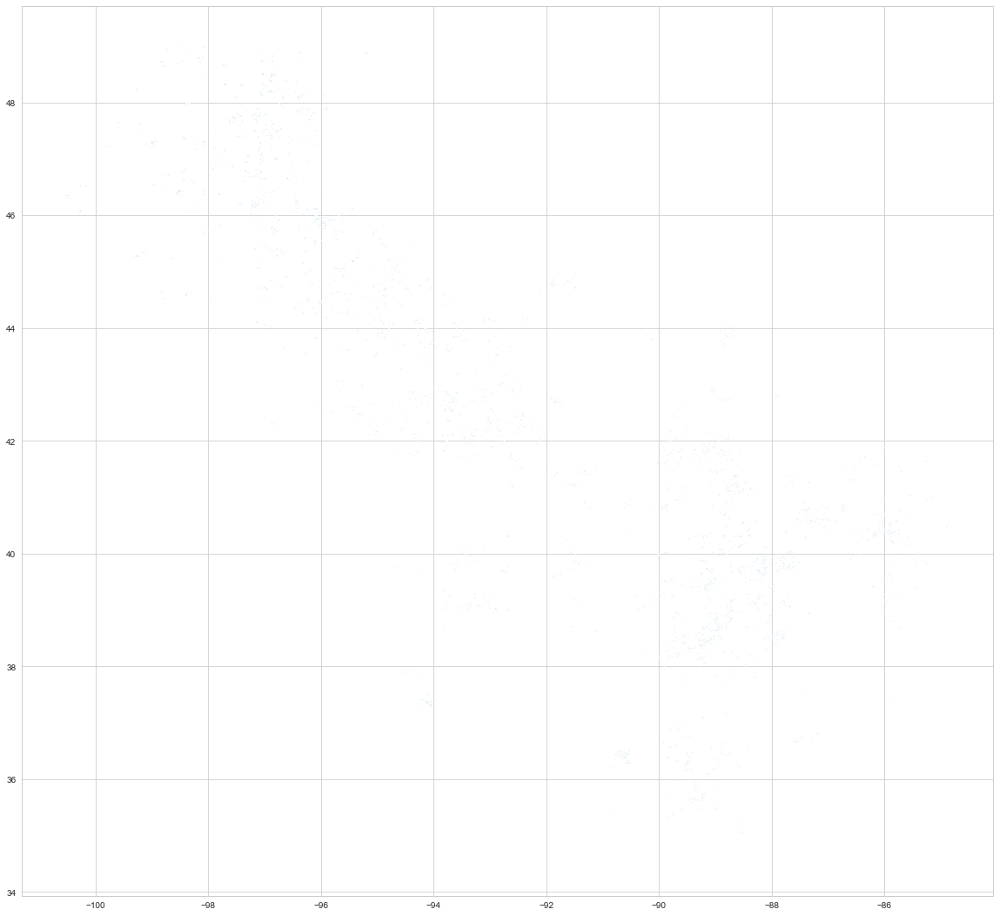

In [1020]:
temp_gpd.plot(figsize = (20,20))

In [1021]:
test = g2019[['plant','pfo_feature_id','areainacre','SAP_Field_ID','plant_pbc','XCenter','YCenter']].dropna()
test = test.groupby('SAP_Field_ID').first()
test.describe()
test.head()

,plant,pfo_feature_id,areainacre,plant_pbc,XCenter,YCenter
SAP_Field_ID,,,,,,
1,1285.0,{2e8af123-f8e2-4627-ab63-fb265bd7196a},136.18,8H16,-89.6527,38.92811
2,1745.0,{f5fcde7b-4237-4b4f-8b42-328e5851afb8},74.10,8H12,-92.8313,42.27708
3,1285.0,{5733a208-6306-4854-95b6-c67c8001ab9d},67.87,8H16,-89.6735,38.96655
4,1758.0,{ce7a7ad6-817e-45f8-8781-3cd1b1f667a8},90.56,8H30,-93.6372,39.69780
6,5359.0,{20ec36d4-2dc9-4c58-a146-43c92e61cb11},87.22,8H73,-88.5129,36.54274


In [1022]:
short_fap

,pbc_plnt_cd,p08_plnt_cd,plantname,location,Latitude,Longitude
0,8H12,1745.0,Beaman,BP Beaman IA,42.222851,-92.824670
1,8H14,1744.0,Ashton,BP Ashton IL,41.868490,-89.248482
2,8H16,1285.0,Centralia,BP Centralia IL,38.475920,-89.142023
3,8H17,1252.0,Clarion,BP Clarion IA,42.732188,-93.739911
4,8H30,1758.0,Marshall,BP Marshall MO,39.135205,-93.205245
5,8H31,1759.0,Mason City,BP Mason City IL,40.198937,-89.676304
6,8H32,1254.0,Matthews,BP Matthews MO,36.754177,-89.536251
7,8H33,1761.0,Redwood Falls,BP Redwood Falls MN,44.484935,-95.118037
8,8H36,1259.0,Stonington,BP Stonington IL,39.632138,-89.197108
9,8H40,1089.0,Fargo,BP West Fargo ND,46.880831,-96.901126


In [1023]:
df1 = test
df1['ypa'] = df1['areainacre']
df1['Latitude'] = df1['YCenter']
df1['Longitude'] = df1['XCenter']
df = df1
#Create Map
m = folium.Map([44.8252, -91.9111], zoom_start=5.5, tiles='cartodbpositron')

#plot polygon
#folium.GeoJson(polygon).add_to(m)
folium.LatLngPopup().add_to(m)

#Plot Values
# crop_yr = 2020
# df = dfb_ag12[dfb_ag12['crop_yr']==crop_yr]
cr = 5
colormap1 = cm.LinearColormap(colors=['blue','white','red'], index=[-cr,0,cr],vmin=-cr,vmax=cr)
colormap2 = cm.LinearColormap(colors=['yellow','orange','red'], index=[20,100,180],
                              vmin=20,vmax=180,
                             caption = 'Area in Acre')

p1 = 'ypa'
p2 = 'fin_wg_wt_avg'
p3 = 'diff_wg'

lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df[p1])

for loc, p in zip(zip(lat, lon), to_plot):
    folium.CircleMarker(location=loc,
        radius=1,
        fill=True,
        color=colormap2(p),
        fill_opacity=1
    ).add_to(m)

from folium.features import DivIcon

df = short_fap
lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df['plantname'])
    
for loc, p in zip(zip(lat, lon), to_plot):
    folium.map.Marker(location=loc,
                      icon=DivIcon(
                          icon_size=(5,10),
#                          icon_anchor=(0,0),
                          html='<div style="font-size: 13pt">{}</div>'.format(p),
        )
    ).add_to(m)
    
m.add_child(colormap2)

In [1024]:
g2019.head()

,Unnamed: 0,plant,plantname,SAP_Contract_Number,SAP_Vendor_Number,Variety_Name,Contract_Year,pfo_feature_id,areainacre,SAP_Field_ID,SAP_Field_Name,PFO_Field_Name,irrigation,tillage,Planting_Date,Harvest_Date,XMin,...,irrigation_control_method,geometryrevisiondate,climate_id,season,createdby,monorg_answer,monorg_text,usergroupnames,z_precision,crop_compliance_type,plant_p08,plant_pbc,sap_plant_id,prod_wkt,prod_poly_flag,prod_npoly,prod_raw_npoly
0,0,1744.0,Ashton,4608639953,334675,AG20X9,2020,{3a80b6ed-df99-4bce-b7c9-7570a7c21a9c},65.55,17742,"PAGE, JAY & KAY",Mailman,False,NoTill,5/13/2020,NaN,-88.7909,...,NaN,2020-05-05 18:25:17.238001,7f0d9978-58fd-43cd-82c6-80e9bfd25a71,Summer,PD-PLAN-FIELD-OPS-BETA-UI,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,1744 - Northern Wisconsin Data Collection Grou...,NaN,Soybeans:CommercialSeed,1744.0,8H14,8H14,"MULTIPOLYGON (((-88.789877 43.8516251, -88.790...",1.0,1,1
1,1,1744.0,Ashton,4608637320,563199,AG20X9,2020,{625cedcc-465c-4155-80d0-742bc66714c0},580.64,20147,SUGAR CREEK PTR NORR,SUGAR CREEK 20X9,0,NoTill,5/4/2020,NaN,-89.6493,...,NaN,2020-04-15 12:45:18.778999,"f40455b3-8b2c-470d-af51-63169accf5fb,07db80fb-...",Summer,PD-PLAN-FIELD-OPS-BETA-UI,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,"1744 - Ashton ACC DATA COLLECTION,1744 - Ashton",NaN,Soybeans:CommercialSeed,1744.0,8H14,8H14,"MULTIPOLYGON (((-89.622644 41.8087359, -89.625...",1.0,1,6
2,2,1744.0,Ashton,4608640285,786086,AG20X9,2020,{ad15ec3e-4765-4373-a0c8-90e4217e5dfc},105.91,18747,RED PINE FARMS 76 DS,RED PINE AG22X9 NORTH FIELDS,1,NoTill,5/9/2020,NaN,-91.8883,...,TouchAndFeel,2020-04-18 18:03:58.363998,"801d68ff-d5e4-41bb-9190-ed7b731f41d2,816b1ba9-...",Summer,PD-PLAN-FIELD-OPS-BETA-UI,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,1744 - Northern Wisconsin Data Collection Grou...,NaN,Soybeans:CommercialSeed,1744.0,8H14,8H14,"MULTIPOLYGON (((-91.8818745 44.7783714, -91.88...",1.0,1,3
3,3,1744.0,Ashton,4608639953,334675,AG20X9,2020,{cc371fdf-2067-4992-9951-45f9cf365a56},66.62,17740,"PAGE, JAY & KAY",Moore,False,NoTill,5/13/2020,NaN,-88.7548,...,NaN,2020-05-05 18:45:11.685000,4fab0831-e277-42c3-b02c-a701833348c7,Summer,PD-PLAN-FIELD-OPS-BETA-UI,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,1744 - Northern Wisconsin Data Collection Grou...,NaN,Soybeans:CommercialSeed,1744.0,8H14,8H14,"MULTIPOLYGON (((-88.7423854 43.9056533, -88.74...",1.0,1,1
4,4,1744.0,Ashton,4608641785,336084,AG20X9,2020,{5b66cbbd-77f8-4cc3-8f60-1e7dbac2a3ff},89.89,20931,"VANDEZANDE, DAVID 1",DAVES,0,NoTill,5/4/2020,NaN,-88.8653,...,NaN,2020-05-19 17:26:04.235000,"b3793497-1153-4099-9892-6d95fd0110fa,90a5b9db-...",Summer,PD-PLAN-FIELD-OPS-BETA-UI,a45ac04e-a15b-4791-96b7-3ca9390b6b00,Commercial,1744 - Northern Wisconsin Data Collection Grou...,NaN,Soybeans:CommercialSeed,1744.0,8H14,8H14,"MULTIPOLYGON (((-88.8555734 43.6621885, -88.85...",1.0,1,5


In [1025]:

g2019.groupby(['plantname', 'tillage']).count()

Unnamed: 0  plant  SAP_Contract_Number  \
plantname tillage                                                       
Ashton    ConservationTillage          92     92                   92   
          Conventional                146    146                  146   
          NoTill                      130    130                  130   
          ReducedTillage              111    111                  111   
Beaman    Conventional                 47     47                   47   
...                                   ...    ...                  ...   
Windfall  Conventional                173    173                  173   
          NoTill                      358    358                  358   
          ReducedTillage              112    112                  112   
          StripTill                    10     10                   10   
          Subsoiling                   13     13                   13   

                               SAP_Vendor_Number  Variety_Name  Contract_Year  \
plantname tillage                                                               
Ashton    ConservationTillage                 92            92             92   
          Conventional                       146           146            146   
          NoTill                             130           130            130   
          ReducedTillage                     111           111            111   
Beaman    Conventional                        47            47             47   
...                                          ...           ...            ...   
Windfall  Conventional                       173           173            173   
          NoTill                             358           358            358   
          ReducedTillage                     112           112            112   
          StripTill                           10            10             10   
          Subsoiling                          13            13             13   

                               pfo_feature_id  areainacre  SAP_Field_ID  \
plantname tillage                                                         
Ashton    ConservationTillage              92          92            92   
          Conventional                    146         146           146   
          NoTill                          130         130           130   
          ReducedTillage                  111         111           111   
Beaman    Conventional                     47          47            47   
...                                       ...         ...           ...   
Windfall  Conventional                    173         173           173   
          NoTill                          358         358           358   
          ReducedTillage                  112         112           112   
          StripTill                        10          10            10   
          Subsoiling                       13          13            13   

                               SAP_Field_Name  PFO_Field_Name  irrigation  \
plantname tillage                                                           
Ashton    ConservationTillage              89              92          92   
          Conventional                    146             146         146   
          NoTill                          130             130         130   
          ReducedTillage                  111             111         111   
Beaman    Conventional                     47              47          47   
...                                       ...             ...         ...   
Windfall  Conventional                    173             173         173   
          NoTill                          358             358         358   
          ReducedTillage                  112             112         112   
          StripTill                        10              10          10   
          Subsoiling                       13              13          13   

                               Planting_Date  Har

In [1026]:
g2019.groupby(['plantname', 'season']).count()

Unnamed: 0  plant  SAP_Contract_Number  \
plantname             season                                           
Ashton                Summer         489    489                  489   
Beaman                Spring           1      1                    1   
                      Summer         561    561                  561   
Carter-Cox Seeds Inc. Summer         172    172                  172   
Centralia             Summer        1510   1510                 1510   
Cherry Farms          Summer         894    894                  894   
Clarion               Summer         680    680                  680   
Fargo                 Spring           1      1                    1   
                      Summer         853    853                  853   
                      Winter           1      1                    1   
Hurt Seed Co.         Summer         514    514                  514   
Marshall              Summer         940    940                  940   
Mason City            Summer         610    610                  610   
Matthews              Summer         118    118                  118   
Redwood Falls         Summer        1033   1033                 1033   
Stonington            Summer         802    802                  802   
Windfall              Summer         826    826                  826   

                              SAP_Vendor_Number  Variety_Name  Contract_Year  \
plantname             season                                                   
Ashton                Summer                489           489            489   
Beaman                Spring                  1             1              1   
                      Summer                561           561            561   
Carter-Cox Seeds Inc. Summer                172           172            172   
Centralia             Summer               1510          1510           1510   
Cherry Farms          Summer                894           894            894   
Clarion               Summer                680           680            680   
Fargo                 Spring                  1             1              1   
                      Summer                853           853            853   
                      Winter                  1             1              1   
Hurt Seed Co.         Summer                514           514            514   
Marshall              Summer                940           940            940   
Mason City            Summer                610           610            610   
Matthews              Summer                118           118            118   
Redwood Falls         Summer               1033          1033           1033   
Stonington            Summer                802           802            802   
Windfall              Summer                826           826            826   

                              pfo_feature_id  areainacre  SAP_Field_ID  \
plantname             season                                             
Ashton                Summer             489         489           489   
Beaman                Spring               1           1             1   
                      Summer             561         561           561   
Carter-Cox Seeds Inc. Summer             172         172           172   
Centralia             Summer            1510        1510          1510   
Cherry Farms          Summer             894         894           894   
Clarion               Summer             680         680           680   
Fargo                 Spring               1           1             1   
                      Summer             853         853           853   
                      Winter               1           1             1   
Hurt Seed Co.         Summer             514         514           514   
Marshall              Summer             940         940           940   
Mason City            Summer             610         610           610   
Matthews              Summer  

In [1027]:
g2019[g2019['plantname']=='Windfall'][['season','pdate','hdate']].dropna().describe()

,hdate
count,0.0
mean,NaN
std,NaN
min,NaN
25%,NaN
50%,NaN
75%,NaN
max,NaN


In [1028]:
test = g2019[['plant','pfo_feature_id','areainacre','SAP_Field_ID','plant_pbc','XCenter','YCenter']].dropna()
test = test.groupby('SAP_Field_ID').first()
test.describe()
test

,plant,pfo_feature_id,areainacre,plant_pbc,XCenter,YCenter
SAP_Field_ID,,,,,,
1,1285.0,{2e8af123-f8e2-4627-ab63-fb265bd7196a},136.18,8H16,-89.6527,38.92811
2,1745.0,{f5fcde7b-4237-4b4f-8b42-328e5851afb8},74.10,8H12,-92.8313,42.27708
3,1285.0,{5733a208-6306-4854-95b6-c67c8001ab9d},67.87,8H16,-89.6735,38.96655
4,1758.0,{ce7a7ad6-817e-45f8-8781-3cd1b1f667a8},90.56,8H30,-93.6372,39.69780
6,5359.0,{20ec36d4-2dc9-4c58-a146-43c92e61cb11},87.22,8H73,-88.5129,36.54274
...,...,...,...,...,...,...
71142,1770.0,{8eeeb0c5-940e-4c20-acbd-fd0b07566786},17.91,8H41,-85.7464,40.30985
72050,1770.0,{e09d0748-f45c-4153-a888-9ae688effdec},6.54,8H41,-85.8774,39.71384
83013,1761.0,{abfcc8a4-180e-44fa-9416-d4bf8bec5db8},128.42,8H33,-95.1198,45.03376


In [1029]:
test = g2018.groupby(['plantname','SAP_Contract_Number']).agg({'areainacre': 'sum',
                                                        'XCenter': 'mean',
                                                        'YCenter': 'mean',
                                                        })
list(test)

['areainacre', 'XCenter', 'YCenter']

In [1030]:
test = g2018.groupby(['plantname','SAP_Contract_Number']).agg({'areainacre': 'sum',
                                                        'XCenter': 'mean',
                                                        'YCenter': 'mean',
                                                        })
#test = g2020[['plant','pfo_feature_id','areainacre','SAP_Field_ID','plant_pbc','XCenter','YCenter']].dropna()
#test = test.groupby('SAP_Field_ID').first()
# test.describe()
# test.head()


df1 = test
df1['ypa'] = df1['areainacre']
df1['Latitude'] = df1['YCenter']
df1['Longitude'] = df1['XCenter']
df = df1
#Create Map
m = folium.Map([44.8252, -91.9111], zoom_start=5.5, tiles='cartodbpositron')

#plot polygon
#folium.GeoJson(polygon).add_to(m)
folium.LatLngPopup().add_to(m)

#Plot Values
# crop_yr = 2020
# df = dfb_ag12[dfb_ag12['crop_yr']==crop_yr]
cr = 5
colormap1 = cm.LinearColormap(colors=['blue','white','red'], index=[-cr,0,cr],vmin=-cr,vmax=cr)
colormap2 = cm.LinearColormap(colors=['yellow','orange','red'], index=[20,100,180],
                              vmin=20,vmax=180,
                             caption = 'Area in Acre')

p1 = 'ypa'
p2 = 'fin_wg_wt_avg'
p3 = 'diff_wg'

lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df[p1])

for loc, p in zip(zip(lat, lon), to_plot):
    folium.CircleMarker(location=loc,
        radius=1,
        fill=True,
        color=colormap2(p),
        fill_opacity=1
    ).add_to(m)

from folium.features import DivIcon

df = short_fap
lat = list(df.Latitude)
lon = list(df.Longitude)
to_plot = list(df['plantname'])
    
for loc, p in zip(zip(lat, lon), to_plot):
    folium.map.Marker(location=loc,
                      icon=DivIcon(
                          icon_size=(5,10),
#                          icon_anchor=(0,0),
                          html='<div style="font-size: 13pt">{}</div>'.format(p),
        )
    ).add_to(m)
    
m.add_child(colormap2)

In [1031]:
import matplotlib.pyplot as plt
import geopandas as gpd
import pysal as ps
from pysal.contrib.viz import mapping as maps

ModuleNotFoundError: No module named 'pysal'

# FHS Score

In [1032]:
df_fhs = pd.read_csv('~/Documents/Bayer_Info/Soybean/data/2023/Giri/Field_Health_Score/FHS_L1V1.1_2022_US_Soy_2022-09-12.csv')
df_fhs.head()

,Unnamed: 0,feature_id,plantname,crop_year,season,geog,FHS,FHS_var,FPPI,qa_latest_cloud_free_RS_date,qa_processing_date,FHS_version
0,0,{005620db-9d81-4474-829c-ef0796421924},Stonington,2022,Summer,US,75.8,45.8,119.28,2022-08-18,2022-09-12,L1V1.1
1,1,{18b2996c-f72e-418e-a1f5-c512f256474d},Stonington,2022,Summer,US,NaN,NaN,NaN,2022-08-13,2022-09-12,L1V1.1
2,2,{ce497226-6196-4c4f-a7cf-e6347f99deab},Stonington,2022,Summer,US,66.2,46.4,98.96,2022-08-18,2022-09-12,L1V1.1
3,3,{e086b083-edd6-4b2c-8e54-75dd3ec69b77},Marshall,2022,Summer,US,56.6,75.8,102.63,2022-09-03,2022-09-12,L1V1.1
4,4,{2b0f3f93-112f-4cb1-b5bf-01dca22cc6f5},Stonington,2022,Summer,US,35.6,42.8,NaN,2022-08-03,2022-09-12,L1V1.1


In [1033]:
df_fhs.groupby('plantname')['feature_id'].count()

plantname
Centralia        892
Marshall         169
Matthews         432
Redwood Falls    161
Stonington       411
Windfall         224
Name: feature_id, dtype: int64

In [1034]:
df_fhs.shape

(2289, 12)

In [1035]:
fhs1 = df_fhs[['feature_id','plantname','crop_year','FHS']].dropna()
fhs1.groupby('plantname')['feature_id'].count()

plantname
Centralia        572
Marshall         127
Matthews         243
Redwood Falls    100
Stonington       227
Windfall          78
Name: feature_id, dtype: int64

In [1036]:
fhs1.groupby('crop_year').count()

,feature_id,plantname,FHS
crop_year,,,
2022,1347,1347,1347


In [1037]:
g2018.groupby('plantname')['pfo_feature_id'].count()

plantname
Ashton                    822
Beaman                    976
Carter-Cox Seeds Inc.     193
Centralia                1618
Clarion                  1410
Fargo                    1653
Hurt Seed Co.             576
Marshall                  989
Mason City                575
Matthews                  166
Redwood Falls            1048
Stonington                626
Windfall                  756
Name: pfo_feature_id, dtype: int64

In [1038]:
g2018_field = g2018[g2018['hdate'].notna()][['plantname','plant_pbc', 'Contract_Year','pfo_feature_id','Variety_Name','PFO_Field_Name','pdate','hdate','season','areainacre']]
g2018_field

,plantname,plant_pbc,Contract_Year,pfo_feature_id,Variety_Name,PFO_Field_Name,pdate,hdate,season,areainacre
0,Ashton,8H14,2018,{c38adfbd-9d78-42e3-89b6-f1eb8ad11f5c},AG19X8,Lee 4,2018-05-20 00:00:00.000000,2018-10-20 00:00:00.000000,Spring,28.53
1,Ashton,8H14,2018,{1acd0835-9c65-44f4-bca1-fe748faa5857},AG19X8,Y-farm 10,2018-05-20 00:00:00.000000,2018-10-18 00:00:00.000000,Spring,14.29
2,Ashton,8H14,2018,{1d3e86ef-8937-4bda-86af-423ed6a1b61b},AG19X8,J-farm 5-6,2018-05-20 00:00:00.000000,2018-10-19 00:00:00.000000,Spring,35.67
3,Ashton,8H14,2018,{56adf6eb-8dff-4a7a-8a5f-a7e5480ed1c2},AG19X8,Y-farm 3-4,2018-05-20 00:00:00.000000,2018-10-25 00:00:00.000000,Spring,25.57
4,Ashton,8H14,2018,{9a32be95-5929-4ffd-a444-cec192c718b7},AG19X8,Britten 5,2018-05-20 00:00:00.000000,2018-10-26 00:00:00.000000,Spring,11.99
...,...,...,...,...,...,...,...,...,...,...
11441,Windfall,8H41,2018,{9d858b27-5a31-499d-b0f9-ddf795dc3d70},RB3771RXN,Bayou 24 Acres,NaN,2018-10-24 00:00:00.000000,Spring,23.81
11442,Windfall,8H41,2018,{d1e8e751-ad49-4fda-ba0e-776eec70a514},RB3771RXN,dad 20,2018-05-11 00:00:00.000000,2018-10-07 00:00:00.000000,Spring,20.24
11443,Windfall,8H41,2018,{eb94c488-c767-4f71-ae99-16e4c25c5b0d},RB3771RXN,Barlow 25 SC,2018-05-18 00:00:00.000000,2018-10-21 00:00:00.000000,Spring,25.04
11444,Windfall,8H41,2018,{2dd37373-703a-4784-9170-6ea6ac1c6307},RB3771RXN,bottoms 7 acre,2018-05-11 00:00:00.000000,2018-10-09 00:00:00.000000,Spring,11.48


In [1039]:
g2018_field.merge(fhs1, how = 'inner', left_on = 'pfo_feature_id', right_on = 'feature_id')

,plantname_x,plant_pbc,Contract_Year,pfo_feature_id,Variety_Name,PFO_Field_Name,pdate,hdate,season,areainacre,feature_id,plantname_y,crop_year,FHS
0,Marshall,8H30,2018,{b2139986-261d-42c2-8df5-90bcad4d2f51},AG34X7,9006,2018-05-10 00:00:00.000000,2018-10-20 00:00:00.000000,Summer,62.81,{b2139986-261d-42c2-8df5-90bcad4d2f51},Marshall,2022,36.2
1,Marshall,8H30,2018,{b2139986-261d-42c2-8df5-90bcad4d2f51},AG34X7,1521 9006,2018-05-10 00:00:00.000000,2018-10-20 00:00:00.000000,Summer,62.81,{b2139986-261d-42c2-8df5-90bcad4d2f51},Marshall,2022,36.2
2,Marshall,8H30,2018,{6f08e30e-8dc2-4b82-b31a-a44a6d0cc4a0},AG35X9,197 Junior/Robert,2018-05-15 00:00:00.000000,2018-10-28 00:00:00.000000,Summer,59.08,{6f08e30e-8dc2-4b82-b31a-a44a6d0cc4a0},Marshall,2022,57.8
3,Marshall,8H30,2018,{6f08e30e-8dc2-4b82-b31a-a44a6d0cc4a0},AG35X9,Junior/Robert,2018-05-15 00:00:00.000000,2018-10-28 00:00:00.000000,Summer,59.08,{6f08e30e-8dc2-4b82-b31a-a44a6d0cc4a0},Marshall,2022,57.8
4,Marshall,8H30,2018,{cc7e041f-b10a-4828-9fa6-e56c6bf8409f},AG36X6,275 Cramer's,2018-05-20 00:00:00.000000,2018-09-29 00:00:00.000000,Summer,122.78,{cc7e041f-b10a-4828-9fa6-e56c6bf8409f},Marshall,2022,65.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,Windfall,8H41,2018,{a4b0a6e9-d186-46e5-b77d-827feabc3eaa},CB3509RXN,Hasser,2018-05-07 00:00:00.000000,2018-09-29 00:00:00.000000,Summer,80.20,{a4b0a6e9-d186-46e5-b77d-827feabc3eaa},Windfall,2022,78.2
280,Windfall,8H41,2018,{98bf2317-9bb2-4738-b777-287c90d2e77a},CB4010XFN,Baum 40,2018-05-08 00:00:00.000000,2018-10-18 00:00:00.000000,Summer,43.20,{98bf2317-9bb2-4738-b777-287c90d2e77a},Windfall,2022,62.6
281,Windfall,8H41,2018,{83ebe967-4e99-4924-8bf2-028c0e893931},CB4010XFN,Karen's,2018-05-08 00:00:00.000000,2018-10-22 00:00:00.000000,Summer,59.99,{83ebe967-4e99-4924-8bf2-028c0e893931},Windfall,2022,62.6
282,Windfall,8H41,2018,{504d32a4-02c5-4a8c-84b2-c8fe9e29df5a},CB4010XFN,North Lods,2018-05-08 00:00:00.000000,2018-10-21 00:00:00.000000,Summer,106.45,{504d32a4-02c5-4a8c-84b2-c8fe9e29df5a},Windfall,2022,68.0


In [1040]:
dbl.groupby('grwng_cntrct').count()

,crop_yr,p08_plnt_cd,pbc_plnt_cd,bulk_prcs_ord_nbr,vrty_desc,contract_acres,sap_planted_acres,sap_harvestedacres,fld_cntrct_dt,bulk_mtrl_nbr,bulk_batch_nbr,bin_receipt_bu,harvest_receipt_bu,conditioned_bu,released_bu,rejected_bu,purch_ord_nbr,...,grwr_pymnt,mfg_nm,acronym_cd,specie_cd,fem_bom_mtrl_nbr,fem_trait,gr_qty,inspct_lot_nbr,mtrl_desc,mtrl_typ_cd,crop_cd,mtrl_grp_nm,brnd_desc,trait,fin_prcs_ord_nbr,fin_plnt_cd,planting_date
grwng_cntrct,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4600000132,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,...,1,0,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0
4600000145,1,1,1,1,1,1,1,0,1,1,0,0,0,0,0,0,1,...,1,0,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0
4600000150,1,1,1,1,1,1,1,0,1,1,0,0,0,0,0,0,1,...,1,0,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0
4600000151,1,1,1,1,1,1,1,0,1,1,0,0,0,0,0,0,1,...,1,0,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0
4600000152,1,1,1,1,1,1,1,0,1,1,0,0,0,0,0,0,1,...,1,0,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4608651795,2,2,2,2,2,2,2,2,2,2,2,2,2,0,0,0,2,...,2,0,2,2,0,0,2,2,2,2,2,2,2,2,2,2,2
4608651796,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,...,1,0,1,1,0,0,1,1,1,1,1,1,1,1,0,0,1
4608651797,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,...,1,0,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0


In [1041]:
fhs1.groupby('plantname')['FHS'].agg(['mean','max','min','var','count'])

,mean,max,min,var,count
plantname,,,,,
Centralia,54.615385,79.4,20.6,225.400253,572
Marshall,50.051969,79.4,20.6,275.765849,127
Matthews,47.123457,79.4,20.6,317.826018,243
Redwood Falls,40.958000,79.4,20.6,207.536400,100
Stonington,67.460793,79.4,23.6,106.924252,227
Windfall,64.746154,79.4,24.2,186.372647,78


([<matplotlib.axis.YTick at 0x7f8ee42fc160>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

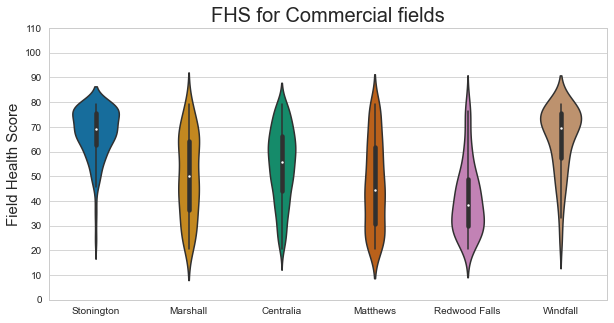

In [1042]:
di = fhs1
plt.figure(figsize=(10,5))
#fig, ax = plt.subplots(2,2)
#plt.subplot(1,2,1)
df = di
#[di['crop_yr']==2017]
#print(df.shape[0])
sns.violinplot( x=df["plantname"], y=df["FHS"], width=0.5);
# Set the plot title and axis labels
plt.title("FHS for Commercial fields", fontsize = 20)
plt.xlabel('',fontsize = 15)
plt.ylabel("Field Health Score", fontsize = 15)
plt.yticks(range(0,111,10))

In [1043]:
fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
short_list = pd.read_excel('~/Documents/Bayer_Info/Soybean/SoySite/Short_list.xlsx')
short_fap = short_list.merge(fap, how = 'inner', left_on = 'pbc_plnt_cd', right_on = 'FAP')[['pbc_plnt_cd','p08_plnt_cd','plantname','location','Latitude','Longitude']]

In [1044]:
fhs2 = fhs1.merge(fap, how = 'inner', left_on = 'plantname', right_on = 'city')
fhs3 = fhs2.groupby('city')[['FHS','Latitude','Longitude']].mean().reset_index()
fhs3

,city,FHS,Latitude,Longitude
0,Centralia,54.615385,38.475920,-89.142023
1,Marshall,50.051969,39.135205,-93.205245
2,Matthews,47.123457,36.754177,-89.536251
3,Redwood Falls,40.958000,44.484935,-95.118037
4,Stonington,67.460793,39.632138,-89.197108
5,Windfall,64.746154,40.371216,-85.961009


/var/folders/4h/c3g008b12t79z6dqnmtpb19w0000gp/T/ipykernel_8932/3164107778.py:56: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



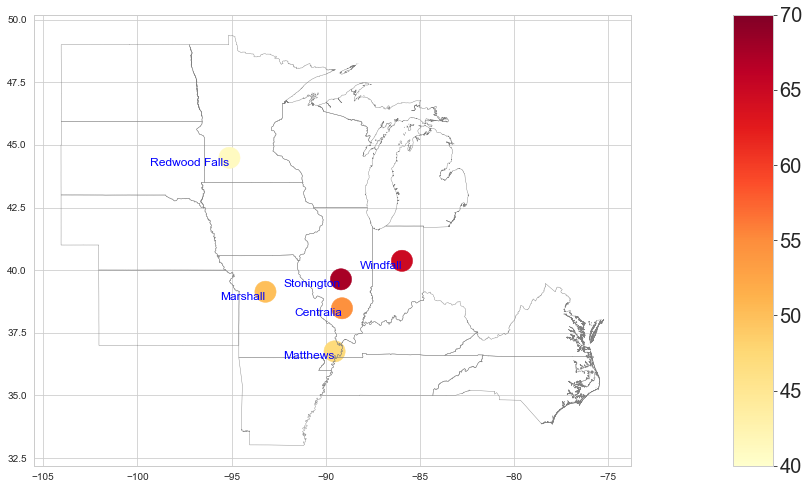

            city        FHS
3  Redwood Falls  40.958000
2       Matthews  47.123457
1       Marshall  50.051969
0      Centralia  54.615385
5       Windfall  64.746154
4     Stonington  67.460793


In [1045]:
# Create a sample dataset
df=fhs3
#df = df[(df['crop_yr']>=2015)&(df['crop_yr']<=2020)]
# temp = dbl_b34.groupby('Plant Name')[['Plant Lat', 'Plant Lon']].max().reset_index()
# tips = df.groupby('Plant Name')[['bin_receipt_bu', 'contract_acres', 'sap_harvestedacres']].sum().reset_index()
# df = tips.merge(temp, how = 'inner', on = 'Plant Name')
# df['Longitude']= df['Plant Lon'] 
# df['Latitude']= df['Plant Lat']
# df['ypa'] = df['bin_receipt_bu']/df['contract_acres']

p2 = 'bin_receipt_bu'
p1 = 'city'
p3 = 'FHS'

from geopandas.geoseries import GeoSeries
from shapely.geometry import Point

states = gpd.read_file('~/Documents/Jupyter_Notebook/data/state.shp')
center = states[states['STPOSTAL'].isin(['ND', 'SD', 'NE', 'KS', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'MI', 'IN', 'KY', 'TN', 'VA', 'NC'])]
map1 = states[states['STPOSTAL'].isin(['ND', 'SD', 'MN', 'IA', 'MO', 'AR', 'WI', 'IL', 'IN', 'KY', 'TN', 'VA', 'NC'])]
# center = center.set_index('STFIPS')
# center = center.sort_index()

# Plot and color by borough
fig, ax = plt.subplots(figsize=(15,15))

#fig, ax = plt.subplots(figsize=(20,20))
# center.apply(lambda x: ax.annotate(
#     text=x.STPOSTAL, 
#     xy=x.geometry.centroid.coords[0],
#     ha='center', 
#     fontsize=20
# ),axis=1);
center.boundary.plot(ax=ax, color='grey', linewidth=.4)

#Plot FAP names
#fap = pd.read_excel('~/Documents/Bayer_Info/Soybean/data/2022/FAP Location.xlsx')
#fap_to_plot = fap.merge(df[['Facility SAP', 'diff_wg']].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP').drop_duplicates('Latitude', keep = 'first')
#fap_du = fap.merge(df['Facility SAP'].drop_duplicates(), how = 'inner', left_on = 'FAP', right_on = 'Facility SAP')
fap_to_plot = df


for _, r in fap_to_plot.iterrows():
    ax.annotate(r[p1], (r['Longitude'], r['Latitude']), ha = 'right', va='top', color = 'blue', fontsize = 12)
#    ax.annotate(round(r[p2],2), (r['Longitude'], r['Latitude']), ha = 'left', va='bottom', color = 'black', fontsize = 15)
        
im = plt.scatter(df.Longitude, df.Latitude, s = 450, c = df[p3], vmin =40, vmax = 70, cmap = "YlOrRd")
M = 5
#im = plt.scatter(df.Longitude, df.Latitude, s = 150, c = df[p3], vmin =-M, vmax = M, cmap = "bwr")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
   
plt.colorbar(im, cax=cax)

#Colorbar label font size adjustment
plt.colorbar(im, cax=cax)
cbar = plt.colorbar(im, cax=cax)
for t in cbar.ax.get_yticklabels():
     t.set_fontsize(20)
        
plt.show()

print(fap_to_plot[[p1, p3]].sort_values(p3))

In [1046]:
fhs1

,feature_id,plantname,crop_year,FHS
0,{005620db-9d81-4474-829c-ef0796421924},Stonington,2022,75.8
2,{ce497226-6196-4c4f-a7cf-e6347f99deab},Stonington,2022,66.2
3,{e086b083-edd6-4b2c-8e54-75dd3ec69b77},Marshall,2022,56.6
4,{2b0f3f93-112f-4cb1-b5bf-01dca22cc6f5},Stonington,2022,35.6
5,{87a0db4d-a27d-46c8-8e18-d3b2f1cd5e59},Marshall,2022,77.6
...,...,...,...,...
2276,{ea52b38d-f22f-45e6-8f05-6127ed9a4fee},Matthews,2022,31.4
2282,{13e13f0d-1997-49f7-9454-85698c1a7661},Centralia,2022,65.0
2284,{5c016975-28eb-48e9-a1a3-a2de4a98a773},Centralia,2022,60.8
2286,{247b702d-9755-421b-8764-f2996eb406fd},Centralia,2022,61.4
